# Imports

## Packages

In [1]:
# Standard library imports
import itertools
import os
import random
import shutil
from itertools import combinations, cycle

# Third-party library imports
import anndata
import decoupler as dc
import gseapy as gp
from gseapy import prerank
from gseapy.plot import dotplot, gseaplot
import liana as ln
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, LogNorm, rgb2hex, to_rgba
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Ellipse, Polygon
import numpy as np
import openpyxl
from openpyxl.styles import Font, PatternFill
from openpyxl.utils.dataframe import dataframe_to_rows
import pandas as pd
import PyComplexHeatmap as pch
from pydeseq2 import preprocessing, dds, ds
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import scanpy as sc
import scipy
from scipy import stats
from scipy.cluster import hierarchy
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist, squareform
from scipy.stats import linregress, median_abs_deviation
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import NMF, PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    adjusted_rand_score,
    calinski_harabasz_score,
    confusion_matrix,
    davies_bouldin_score,
    make_scorer,
    roc_auc_score,
    silhouette_score,
)
from sklearn.mixture import BayesianGaussianMixture, GaussianMixture
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.tree import plot_tree
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm
import umap

# Local imports
from cnmf import cNMF
from catboost import CatBoostClassifier

# Set global rcParams for consistent formatting
plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'savefig.facecolor': 'white',
    'legend.frameon': True,
    'legend.edgecolor': 'black',
    'legend.labelcolor': 'black',
    'legend.fontsize': 12,
    'axes.labelcolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black',
    'text.color': 'black',
})

## Classes

### DEGAnalysis

In [2]:


class DEGAnalysis:
    def __init__(self, adata, design_factor, layer='raw_counts', output_dir='deg_analysis_results'):
        self.original_adata = adata
        self.design_factor = design_factor
        self.layer = layer
        self.adata = None
        self.dds = None
        self.results = {}
        self.colors = self._generate_colors()
        self.output_dir = output_dir
        os.makedirs(self.output_dir, exist_ok=True)

    def _generate_colors(self):
        unique_groups = self.original_adata.obs[self.design_factor].unique()
        n_colors = len(unique_groups)
        color_map = plt.cm.get_cmap('tab20')
        colors = {group: rgb2hex(color_map(i/n_colors)) for i, group in enumerate(unique_groups)}
        return colors

    def prepare_data(self):
        self.adata = self.original_adata.copy()
        if self.layer in self.adata.layers:
            self.adata.X = self.adata.layers[self.layer].copy()
        elif self.layer != 'X':
            raise ValueError(f"Layer '{self.layer}' not found in the AnnData object.")
        min_val = self.adata.X.min()
        if min_val < 0:
            self.adata.X -= min_val

    def create_dds(self):
        if self.adata is None:
            self.prepare_data()
        self.dds = DeseqDataSet(
            adata=self.adata,
            design_factors=self.design_factor,
            refit_cooks=True,
        )
        self.dds.deseq2()

    def run_comparisons(self):
        subtypes = sorted(self.adata.obs[self.design_factor].unique().tolist())
        n_subtypes = len(subtypes)
        
        # One-vs-One comparisons
        for i in range(n_subtypes):
            for j in range(i+1, n_subtypes):
                self._run_comparison(subtypes[i], subtypes[j])
        
        # One-vs-Rest comparisons
        for subtype in subtypes:
            self._run_comparison(subtype, 'rest', one_vs_rest=True)

    def _run_comparison(self, group1, group2, one_vs_rest=False):
        comparison_name = f"{group1}_vs_{group2}"
        if one_vs_rest:
            temp_counts = pd.DataFrame(self.adata.X, index=self.adata.obs_names, columns=self.adata.var_names)
            temp_metadata = pd.DataFrame({self.design_factor: self.adata.obs[self.design_factor]})
            temp_metadata[self.design_factor] = np.where(temp_metadata[self.design_factor] == group1, group1, 'rest')
            
            temp_dds = DeseqDataSet(
                counts=temp_counts,
                metadata=temp_metadata,
                design_factors=self.design_factor,
                refit_cooks=True,
            )
            temp_dds.deseq2()
            res = DeseqStats(temp_dds, contrast=[self.design_factor, group1, 'rest'])
            res.summary()

            res.results_df["Group"] = np.where(
                res.results_df["log2FoldChange"] < 0, "Up in Others", f"Up in {group1}"
            )
        else:
            res = DeseqStats(self.dds, contrast=[self.design_factor, group1, group2])
            res.summary()

            res.results_df["Group"] = np.where(
                res.results_df["log2FoldChange"] < 0, f"Up in {group2}", f"Up in {group1}"
            )
        
        res.results_df["Log2FC_pval"] = res.results_df["log2FoldChange"] * -np.log10(res.results_df["pvalue"])
        res.results_df = res.results_df.sort_values("Log2FC_pval", ascending=False)
        self.results[comparison_name] = res
        
    def create_volcano_plots(self, highlight_dict=None):
        for comparison_name, res in self.results.items():
            self._create_volcano_plot(res.results_df, comparison_name, highlight_dict)

    def _create_volcano_plot(self, deg_df, comparison_name, highlight_dict=None):
        with plt.rc_context({'figure.figsize': (12, 8)}):
            plt.figure()
            
            # Plot all genes
            plt.scatter(deg_df['log2FoldChange'], -np.log10(deg_df['pvalue']), 
                        alpha=0.6, s=3, color='grey', label='Other')
            
            # Highlight significant genes
            significant = (deg_df['padj'] < 0.05) & (abs(deg_df['log2FoldChange']) > 0.5)
            plt.scatter(deg_df.loc[significant, 'log2FoldChange'], 
                        -np.log10(deg_df.loc[significant, 'pvalue']), 
                        alpha=0.6, s=3, color='lightgrey', label='Significant')
            
            # Highlight genes from the dictionary
            if highlight_dict:
                colors = sns.color_palette("husl", len(highlight_dict))
                for (group, genes), color in zip(highlight_dict.items(), colors):
                    mask = deg_df.index.isin(genes)
                    plt.scatter(deg_df.loc[mask, 'log2FoldChange'], 
                                -np.log10(deg_df.loc[mask, 'pvalue']),
                                alpha=0.8, s=30, color=color, label=group)
                    
                    # Annotate these genes
                    for gene in genes:
                        if gene in deg_df.index:
                            gene_data = deg_df.loc[gene]
                            plt.annotate(gene, 
                                         (gene_data['log2FoldChange'], -np.log10(gene_data['pvalue'])),
                                         xytext=(5, 5), textcoords='offset points', 
                                         ha='left', va='bottom',
                                         fontsize=8,
                                         bbox=dict(boxstyle='round,pad=0.1', fc='white', ec='none', alpha=0.7),
                                         arrowprops=dict(arrowstyle='->', color='black', lw=0.5))
            else:
                # If no highlight_dict, annotate top genes as before
                top_genes = deg_df.sort_values('pvalue').head(20)
                for _, gene in top_genes.iterrows():
                    plt.annotate(gene.name, 
                                 (gene['log2FoldChange'], -np.log10(gene['pvalue'])),
                                 xytext=(3, 3), textcoords='offset points', 
                                 ha='left', va='bottom',
                                 fontsize=6,
                                 bbox=dict(boxstyle='round,pad=0.1', fc='white', ec='none', alpha=0.7),
                                 arrowprops=dict(arrowstyle='->', color='black', lw=0.5))
            
            plt.axvline(x=0.5, color='gray', linestyle='--', linewidth=1)
            plt.axvline(x=-0.5, color='gray', linestyle='--', linewidth=1)
            plt.axhline(y=-np.log10(0.05), color='gray', linestyle='--', linewidth=1)
            
            plt.xlabel('Log2 fold change')
            plt.ylabel('-Log10 p-value')
            plt.title(f'Volcano Plot: {comparison_name}')
            
            group1, group2 = comparison_name.split('_vs_')
            plt.text(0.02, 0.98, f"Positive log2FC: Upregulated in {group1}\nNegative log2FC: Upregulated in {group2}",
                     transform=plt.gca().transAxes, va='top', ha='left', fontsize=8, 
                     bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
            
            if highlight_dict:
                plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
            
            plt.tight_layout()
            plt.savefig(os.path.join(self.output_dir, f'volcano_plot_{comparison_name}.png'), dpi=300, bbox_inches='tight')
            plt.close()

    def create_clustermaps(self, marker_list=None, padj_threshold=0.05, log2fc_threshold=1):
        for comparison_name, res in self.results.items():
            self._create_clustermap(res.results_df, comparison_name, marker_list, padj_threshold, log2fc_threshold)
            
    def _create_clustermap(self, results_df, comparison_name, marker_list=None, padj_threshold=0.05, log2fc_threshold=1):
        cluster1, cluster2 = comparison_name.split('_vs_')
        significant_genes = results_df[(results_df['padj'] < padj_threshold) & 
                                    (abs(results_df['log2FoldChange']) > log2fc_threshold)].index

        if marker_list is not None:
            marker_genes = [gene for gene in marker_list if gene in significant_genes]
            if len(marker_genes) < 2:
                print(f"Warning: Less than 2 genes from the marker list are present in the significant genes for {comparison_name}.")
                print("Using all significant genes instead.")
                genes_to_plot = significant_genes
            else:
                genes_to_plot = marker_genes
        else:
            genes_to_plot = significant_genes

        if len(genes_to_plot) < 2:
            print(f"Not enough genes to plot for {comparison_name}. Skipping this comparison.")
            return

        if cluster2 == 'rest':
            dds_sub = self.dds[:, genes_to_plot]
        else:
            dds_sub = self.dds[self.dds.obs[self.design_factor].isin([cluster1, cluster2]), genes_to_plot]

        if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
            print(f"Not enough data to plot for {comparison_name}. Skipping this comparison.")
            print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
            return

        dds_sub = dds_sub[dds_sub.obs[self.design_factor].argsort()]
        grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)
        col_colors_leiden = dds_sub.obs[self.design_factor].map(self.colors)
        
        try:
            plt.figure(figsize=(30, 15 + 0.2 * len(genes_to_plot)))
            g = sns.clustermap(grapher, 
                            z_score=0,  
                            cmap="RdBu_r",
                            col_cluster=False, 
                            row_cluster=True,
                            col_colors=col_colors_leiden,
                            dendrogram_ratio=(.1, .3),
                            robust=True)  # Add robust to handle outliers better
            
            # Adjust the colorbar to be symmetric around 0
            vmax = max(abs(g.ax_heatmap.collections[0].get_clim()))
            g.ax_heatmap.collections[0].set_clim(-vmax, vmax)
        
            
            
            plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', va='top')
            g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=8)
            
            plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
            
            for label in [cluster1, cluster2]:
                g.ax_col_dendrogram.bar(0, 0, color=self.colors[label], label=label, linewidth=0)
            g.ax_col_dendrogram.legend(title=self.design_factor, loc="center", ncol=2)
            
            plt.suptitle(f"Clustermap for {comparison_name}", fontsize=16, y=1.02)
            plt.tight_layout()
            plt.savefig(os.path.join(self.output_dir, f"clustermap_{comparison_name}.png"), dpi=300, bbox_inches='tight')
            plt.close()
        except Exception as e:
            print(f"Error creating clustermap for {comparison_name}: {str(e)}")
            plt.close()

        print(f"Successfully created clustermap for {comparison_name} with {len(genes_to_plot)} genes.")

    def get_results(self):
        return self.results

    def save_results(self):
        for comparison_name, res in self.results.items():
            res.results_df.to_csv(os.path.join(self.output_dir, f"DEG_results_{comparison_name}.csv"))
        print(f"All DEG results have been saved to CSV files in the {self.output_dir} folder.")

    def create_boxplots(self, genes_to_plot, test='ttest', figsize=(20, 5), save_path=None):
        adata_subset, valid_genes = self._prepare_data_for_boxplots(genes_to_plot)
        
        if not valid_genes:
            print("No valid genes found in the dataset.")
            return

        n_genes = len(valid_genes)
        fig, axes = plt.subplots(1, n_genes, figsize=figsize)
        if n_genes == 1:
            axes = [axes]

        for i, gene in enumerate(valid_genes):
            ax = axes[i]
            
            data = pd.DataFrame({
                'expression': adata_subset[:, gene].X.flatten(),
                self.design_factor: adata_subset.obs[self.design_factor]
            })
            
            clusters = sorted(data[self.design_factor].unique())
            cluster_to_pos = {cluster: idx for idx, cluster in enumerate(clusters)}
            
            sns.boxplot(data=data, x=self.design_factor, y='expression', ax=ax, order=clusters, palette=self.colors)
            sns.stripplot(data=data, x=self.design_factor, y='expression', color='black', size=2, alpha=0.4, ax=ax, order=clusters)
            
            comparisons = list(itertools.combinations(clusters, 2))
            max_bars = len(comparisons)
            
            plot_top = ax.get_ylim()[1]
            bar_height = plot_top * 0.05
            spacing = plot_top * 0.1
            
            for idx, (c1, c2) in enumerate(comparisons):
                data1 = data[data[self.design_factor] == c1]['expression']
                data2 = data[data[self.design_factor] == c2]['expression']
                p_value = self._perform_test(data1, data2, test, gene, f"{self.design_factor} {c1}", f"{self.design_factor} {c2}")
                
                y_pos = plot_top + spacing + (bar_height + spacing) * idx
                
                x1, x2 = cluster_to_pos[c1], cluster_to_pos[c2]
                ax.plot([x1, x1, x2, x2], [y_pos, y_pos + bar_height, y_pos + bar_height, y_pos], lw=1.5, c='black')
                significance = self._get_stars(p_value)
                ax.text((x1 + x2) / 2, y_pos + bar_height, significance, ha='center', va='bottom', fontsize=10)
            
            ax.set_title(f'{gene}', fontsize=14)
            ax.set_xlabel(self.design_factor.capitalize(), fontsize=12)
            ax.set_ylabel('log2(CPM+1)' if i == 0 else '', fontsize=12)
            ax.set_ylim(0, plot_top + (bar_height + spacing) * (max_bars + 1))
            ax.tick_params(axis='both', which='major', labelsize=10)
            
            ax.set_xticks(range(len(clusters)))
            ax.set_xticklabels(clusters)

        plt.tight_layout()
        
        if save_path:
            plt.savefig(os.path.join(self.output_dir, save_path), dpi=300, bbox_inches='tight')
            print(f"Figure saved to {os.path.join(self.output_dir, save_path)}")
        
        plt.show()

        missing_genes = set(genes_to_plot) - set(valid_genes)
        if missing_genes:
            print(f"The following genes were not found in the dataset: {', '.join(missing_genes)}")

    def create_volcano_grid(self, highlight_genes=None):
        # Get unique group names
        group_names = sorted(set([k.split('_vs_')[0] for k in self.results.keys() if '_vs_' in k]))
        n_groups = len(group_names)

        fig = plt.figure(figsize=(4*n_groups, 4*n_groups))
        gs = GridSpec(n_groups, n_groups)

        for i, group1 in enumerate(group_names):
            for j, group2 in enumerate(group_names):
                if i < j:  # Upper triangle
                    ax = fig.add_subplot(gs[i, j])
                    comparison = f"{group1}_vs_{group2}"
                    if comparison in self.results:
                        self._plot_volcano(ax, self.results[comparison].results_df, f'{group1} vs. {group2}', self.colors[group1], highlight_genes=highlight_genes)
                elif i == j:  # Diagonal
                    ax = fig.add_subplot(gs[i, i])
                    comparison = f"{group1}_vs_rest"
                    if comparison in self.results:
                        self._plot_volcano(ax, self.results[comparison].results_df, f'{group1} vs. Others', self.colors[group1], highlight_genes=highlight_genes)

        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, "volcano_grid.png"), dpi=300, bbox_inches='tight')
        plt.show()

    def _prepare_data_for_boxplots(self, genes_to_plot):
        valid_genes = [gene for gene in genes_to_plot if gene in self.original_adata.var_names]
        
        adata_full = self.original_adata.copy()
        sc.pp.normalize_total(adata_full, target_sum=1e6)
        sc.pp.log1p(adata_full)
        
        adata_subset = adata_full[:, valid_genes]
        
        return adata_subset, valid_genes

    def _perform_test(self, data1, data2, test_type, gene, group1_name, group2_name):
        if test_type == 'mannwhitneyu':
            statistic, p_value = stats.mannwhitneyu(data1, data2)
        elif test_type == 'ttest':
            statistic, p_value = stats.ttest_ind(data1, data2, equal_var=False)
        else:
            raise ValueError("Invalid test type. Choose 'mannwhitneyu' or 'ttest'.")
        
        print(f"\nGene: {gene}")
        print(f"Comparison: {group1_name} vs {group2_name}")
        print(f"{group1_name}: n={len(data1)}, median={np.median(data1):.2f}, mean={np.mean(data1):.2f}")
        print(f"{group2_name}: n={len(data2)}, median={np.median(data2):.2f}, mean={np.mean(data2):.2f}")
        print(f"p-value: {p_value:.4f}")
        print(f"Significance: {self._get_stars(p_value)}")
        return p_value

    def _get_stars(self, p_value):
        p_value = round(p_value, 4)
        if p_value < 0.001:
            return '***'
        elif p_value < 0.01:
            return '**'
        elif p_value < 0.05:
            return '*'
        else:
            return 'ns'

    def _plot_volcano(self, ax, results, title, color, top_genes=5, highlight_genes=None):
        ax.scatter(results['log2FoldChange'], -np.log10(results['pvalue']), 
                   alpha=0.6, s=3, color=color)
        
        ax.axhline(-np.log10(0.05), color='red', linestyle='--', linewidth=0.5)
        ax.axvline(-1, color='red', linestyle='--', linewidth=0.5)
        ax.axvline(1, color='red', linestyle='--', linewidth=0.5)
        
        top = results.sort_values('pvalue').head(top_genes)
        for _, gene in top.iterrows():
            ax.text(gene['log2FoldChange'], -np.log10(gene['pvalue']), gene.name, 
                    fontsize=6, ha='center', va='bottom', color='black')
        
        if highlight_genes:
            for gene in highlight_genes:
                if gene in results.index:
                    gene_data = results.loc[gene]
                    ax.text(gene_data['log2FoldChange'], -np.log10(gene_data['pvalue']), gene, 
                            fontsize=6, ha='center', va='bottom', color='red', fontweight='bold')
                    ax.scatter(gene_data['log2FoldChange'], -np.log10(gene_data['pvalue']), 
                               color='red', s=20, zorder=5)
        
        ax.set_title(title, fontsize=10)
        ax.set_xlabel('log2(Fold Change)', fontsize=8)
        ax.set_ylabel('-log10(p-value)', fontsize=8)
        ax.tick_params(axis='both', which='major', labelsize=6)
        ax.grid(True, which="both", ls="-", alpha=0.2)

    def infer_tf_activities(self):
        # Retrieve CollecTRI gene regulatory network
        collectri = dc.get_collectri(organism='human', split_complexes=False)
        
        # Prepare data for TF activity inference
        mat = self.results['treatment.vs.control'].results_df[['stat']].T.rename(index={'stat': 'treatment.vs.control'})
        
        # Infer TF activities with ulm
        self.tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri, verbose=True)

    def plot_tf_activities(self, top=25):
        dc.plot_barplot(
            acts=self.tf_acts,
            contrast='treatment.vs.control',
            top=top,
            vertical=True,
            figsize=(3, 6)
        )
        plt.savefig(os.path.join(self.output_dir, 'tf_activities.png'), dpi=300, bbox_inches='tight')
        plt.close()

    def infer_pathway_activities(self):
        # Retrieve PROGENy model weights
        progeny = dc.get_progeny(top=500)
        
        # Prepare data for pathway activity inference
        mat = self.results['treatment.vs.control'].results_df[['stat']].T.rename(index={'stat': 'treatment.vs.control'})
        
        # Infer pathway activities with mlm
        self.pathway_acts, pathway_pvals = dc.run_mlm(mat=mat, net=progeny, verbose=True)

    def plot_pathway_activities(self):
        dc.plot_barplot(
            self.pathway_acts,
            'treatment.vs.control',
            top=25,
            vertical=False,
            figsize=(6, 3)
        )
        plt.savefig(os.path.join(self.output_dir, 'pathway_activities.png'), dpi=300, bbox_inches='tight')
        plt.close()

    def run_functional_enrichment(self):
        # Retrieve MSigDB gene sets
        msigdb = dc.get_resource('MSigDB')
        msigdb = msigdb[msigdb['collection']=='hallmark']
        msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]
        msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

        # Prepare data for enrichment analysis
        top_genes = self.results['treatment.vs.control'].results_df[self.results['treatment.vs.control'].results_df['padj'] < 0.05]

        # Run ora
        self.enr_pvals = dc.get_ora_df(
            df=top_genes,
            net=msigdb,
            source='geneset',
            target='genesymbol'
        )

    def plot_functional_enrichment(self, top=15):
        dc.plot_dotplot(
            self.enr_pvals.sort_values('Combined score', ascending=False).head(top),
            x='Combined score',
            y='Term',
            s='Odds ratio',
            c='FDR p-value',
            scale=1.5,
            figsize=(3, 6)
        )
        plt.savefig(os.path.join(self.output_dir, 'functional_enrichment.png'), dpi=300, bbox_inches='tight')
        plt.close()


In [3]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import scanpy as sc
from scipy import stats
import itertools
import adjustText
from matplotlib.colors import rgb2hex
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

class DEGAnalysis:
    def __init__(self, adata, design_factor, layer='raw_counts', output_dir='deg_analysis_results'):
        self.original_adata = adata
        self.design_factor = design_factor
        self.layer = layer
        self.adata = None
        self.dds = None
        self.results = {}
        self.colors = self._generate_colors()
        self.output_dir = output_dir
        os.makedirs(self.output_dir, exist_ok=True)

    def _generate_colors(self):
        unique_groups = self.original_adata.obs[self.design_factor].unique()
        n_colors = len(unique_groups)
        color_map = plt.cm.get_cmap('tab20')
        colors = {group: rgb2hex(color_map(i/n_colors)) for i, group in enumerate(unique_groups)}
        return colors

    def prepare_data(self):
        self.adata = self.original_adata.copy()
        if self.layer in self.adata.layers:
            self.adata.X = self.adata.layers[self.layer].copy()
        elif self.layer != 'X':
            raise ValueError(f"Layer '{self.layer}' not found in the AnnData object.")
        min_val = self.adata.X.min()
        if min_val < 0:
            self.adata.X -= min_val

    def create_dds(self):
        if self.adata is None:
            self.prepare_data()
        self.dds = DeseqDataSet(
            adata=self.adata,
            design_factors=self.design_factor,
            refit_cooks=True,
        )
        self.dds.deseq2()

    def run_comparisons(self):
        subtypes = sorted(self.adata.obs[self.design_factor].unique().tolist())
        n_subtypes = len(subtypes)
        
        # One-vs-One comparisons
        for i in range(n_subtypes):
            for j in range(i+1, n_subtypes):
                self._run_comparison(subtypes[i], subtypes[j])
        
        # One-vs-Rest comparisons
        for subtype in subtypes:
            self._run_comparison(subtype, 'rest', one_vs_rest=True)

    def _run_comparison(self, group1, group2, one_vs_rest=False):
        comparison_name = f"{group1}_vs_{group2}"
        if one_vs_rest:
            temp_counts = pd.DataFrame(self.adata.X, index=self.adata.obs_names, columns=self.adata.var_names)
            temp_metadata = pd.DataFrame({self.design_factor: self.adata.obs[self.design_factor]})
            temp_metadata[self.design_factor] = np.where(temp_metadata[self.design_factor] == group1, group1, 'rest')
            
            temp_dds = DeseqDataSet(
                counts=temp_counts,
                metadata=temp_metadata,
                design_factors=self.design_factor,
                refit_cooks=True,
            )
            temp_dds.deseq2()
            res = DeseqStats(temp_dds, contrast=[self.design_factor, group1, 'rest'])
        else:
            res = DeseqStats(self.dds, contrast=[self.design_factor, group1, group2])
        
        res.summary()
        res.results_df["Log2FC_pval"] = res.results_df["log2FoldChange"] * -np.log10(res.results_df["pvalue"])
        res.results_df = res.results_df.sort_values("Log2FC_pval", ascending=False)
        self.results[comparison_name] = res

    def get_results(self):
        """
        Get all DEG analysis results.
        
        Returns:
        --------
        dict
            Dictionary containing all DEG analysis results
        """
        return self.results

    def create_volcano_grid(self, highlight_dict=None):
        """
        Create a grid of volcano plots with highlighted genes from a dictionary.
        """
        # Get unique group names
        group_names = sorted(set([k.split('_vs_')[0] for k in self.results.keys() if '_vs_' in k]))
        n_groups = len(group_names)

        # Increase figure size for better readability
        fig = plt.figure(figsize=(5*n_groups, 5*n_groups))
        gs = GridSpec(n_groups, n_groups)

        for i, group1 in enumerate(group_names):
            for j, group2 in enumerate(group_names):
                if i < j:  # Upper triangle
                    ax = fig.add_subplot(gs[i, j])
                    comparison = f"{group1}_vs_{group2}"
                    if comparison in self.results:
                        self._plot_volcano(ax, self.results[comparison].results_df, 
                                         f'{group1} vs. {group2}', 
                                         self.colors[group1], 
                                         group1, group2,
                                         highlight_dict=highlight_dict)
                elif i == j:  # Diagonal
                    ax = fig.add_subplot(gs[i, i])
                    comparison = f"{group1}_vs_rest"
                    if comparison in self.results:
                        self._plot_volcano(ax, self.results[comparison].results_df, 
                                         f'{group1} vs. Others', 
                                         self.colors[group1],
                                         group1, 'rest',
                                         highlight_dict=highlight_dict)

        # Add legend for highlighted genes
        if highlight_dict:
            colors = sns.color_palette("husl", len(highlight_dict))
            legend_elements = []
            for (group, genes), color in zip(highlight_dict.items(), colors):
                # Add marker for the group
                legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                            markerfacecolor=color, label=f"{group}: {', '.join(genes)}", 
                                            markersize=8))
            
            # Place legend outside the plot
            fig.legend(handles=legend_elements, 
                      loc='center left', 
                      bbox_to_anchor=(1.02, 0.5),
                      fontsize=10,
                      title="Gene Groups")

        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, "volcano_grid.png"), dpi=300, bbox_inches='tight')
        plt.show()

    def _plot_volcano(self, ax, results, title, color, group1, group2, highlight_dict=None):
        """
        Plot a single volcano plot with highlighted genes from different groups.
        """
        # Plot all points
        ax.scatter(results['log2FoldChange'], -np.log10(results['pvalue']), 
                   alpha=0.6, s=3, color='lightgray')
        
        # Add threshold lines
        ax.axhline(-np.log10(0.05), color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(-0.5, color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(0.5, color='gray', linestyle='--', linewidth=0.5)
        
        texts = []  # Collection of text elements for adjustText
        
        # Add direction annotation
        ax.text(0.02, 0.98, 
                f"Positive log2FC: Upregulated in {group1}\nNegative log2FC: Upregulated in {group2}",
                transform=ax.transAxes, 
                va='top', 
                ha='left', 
                fontsize=8,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        # Highlight genes from dictionary
        if highlight_dict:
            colors = sns.color_palette("husl", len(highlight_dict))
            for (group, genes), highlight_color in zip(highlight_dict.items(), colors):
                for gene in genes:
                    if gene in results.index:
                        gene_data = results.loc[gene]
                        # Add text with background
                        text = ax.text(gene_data['log2FoldChange'], 
                                     -np.log10(gene_data['pvalue']), 
                                     gene, 
                                     fontsize=8,
                                     color=highlight_color,
                                     fontweight='bold',
                                     bbox=dict(facecolor='white', 
                                             alpha=0.8, 
                                             edgecolor='none',
                                             pad=0.5))
                        texts.append(text)
                        
                        # Add point
                        ax.scatter(gene_data['log2FoldChange'], 
                                 -np.log10(gene_data['pvalue']), 
                                 color=highlight_color, 
                                 s=30, 
                                 zorder=5)
        
        # Adjust text positions to prevent overlap with more space
        if texts:
            adjustText.adjust_text(texts, 
                                 arrowprops=dict(arrowstyle='->', color='black', lw=0.5),
                                 expand_points=(2.0, 2.0),  # Increased from 1.5 to 2.0
                                 force_points=(2.0, 2.0),   # Added force_points
                                 force_text=(2.0, 2.0),     # Added force_text
                                 lim=500)                   # Added iteration limit
        
        ax.set_title(title, fontsize=12, pad=10)
        ax.set_xlabel('log2(Fold Change)', fontsize=10)
        ax.set_ylabel('-log10(p-value)', fontsize=10)
        ax.tick_params(axis='both', which='major', labelsize=8)
        ax.grid(True, which="both", ls="-", alpha=0.2)
    def create_clustermaps(self, marker_list=None, padj_threshold=0.05, log2fc_threshold=1):
        """
        Create clustermaps for each comparison.
        
        Parameters:
        -----------
        marker_list : list, optional
            List of marker genes to include in the plot
        padj_threshold : float
            Adjusted p-value threshold for significant genes
        log2fc_threshold : float
            Log2 fold change threshold for significant genes
        """
        for comparison_name, res in self.results.items():
            self._create_clustermap(res.results_df, comparison_name, marker_list, padj_threshold, log2fc_threshold)
            
    def _create_clustermap(self, results_df, comparison_name, marker_list=None, padj_threshold=0.05, log2fc_threshold=1):
        """
        Create a single clustermap for a comparison.
        """
        cluster1, cluster2 = comparison_name.split('_vs_')
        significant_genes = results_df[(results_df['padj'] < padj_threshold) & 
                                    (abs(results_df['log2FoldChange']) > log2fc_threshold)].index

        if marker_list is not None:
            marker_genes = [gene for gene in marker_list if gene in significant_genes]
            if len(marker_genes) < 2:
                print(f"Warning: Less than 2 genes from the marker list are present in the significant genes for {comparison_name}.")
                print("Using all significant genes instead.")
                genes_to_plot = significant_genes
            else:
                genes_to_plot = marker_genes
        else:
            genes_to_plot = significant_genes

        if len(genes_to_plot) < 2:
            print(f"Not enough genes to plot for {comparison_name}. Skipping this comparison.")
            return

        if cluster2 == 'rest':
            dds_sub = self.dds[:, genes_to_plot]
        else:
            dds_sub = self.dds[self.dds.obs[self.design_factor].isin([cluster1, cluster2]), genes_to_plot]

        if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
            print(f"Not enough data to plot for {comparison_name}. Skipping this comparison.")
            print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
            return

        # Sort samples by design factor
        dds_sub = dds_sub[dds_sub.obs[self.design_factor].argsort()]
        
        # Create expression matrix
        if 'lognormalized_counts' in dds_sub.layers:
            expr_matrix = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T,
                                     index=dds_sub.var_names,
                                     columns=dds_sub.obs_names)
        else:
            sc.pp.normalize_total(dds_sub)
            sc.pp.log1p(dds_sub)
            expr_matrix = pd.DataFrame(dds_sub.X.T,
                                     index=dds_sub.var_names,
                                     columns=dds_sub.obs_names)

        # Create the clustermap
        plt.figure(figsize=(30, 15 + 0.2 * len(genes_to_plot)))
        col_colors = dds_sub.obs[self.design_factor].map(self.colors)
        
        try:
            # Calculate z-scores
            expr_matrix_zscore = (expr_matrix - expr_matrix.mean()) / expr_matrix.std()
            
            # Set vmin and vmax for consistent color scaling
            vmin = -3
            vmax = 3
            
            g = sns.clustermap(expr_matrix_zscore,
                             cmap="RdBu_r",
                             col_cluster=False,
                             row_cluster=True,
                             col_colors=col_colors,
                             dendrogram_ratio=(.1, .3),
                             vmin=vmin,
                             vmax=vmax)
            
            # Adjust labels
            plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', va='top')
            g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=8)
            plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
            
            # Add legend
            unique_groups = [cluster1, cluster2] if cluster2 != 'rest' else [cluster1, 'rest']
            for label in unique_groups:
                g.ax_col_dendrogram.bar(0, 0, color=self.colors[label], label=label, linewidth=0)
            g.ax_col_dendrogram.legend(title=self.design_factor, loc="center", ncol=2)
            
            plt.suptitle(f"Clustermap for {comparison_name}", fontsize=16, y=1.02)
            plt.tight_layout()
            plt.savefig(os.path.join(self.output_dir, f"clustermap_{comparison_name}.png"),
                       dpi=300, bbox_inches='tight')
            plt.close()
        except Exception as e:
            print(f"Error creating clustermap for {comparison_name}: {str(e)}")
            plt.close()

    def save_results(self):
        """
        Save all DEG analysis results to CSV files.
        """
        for comparison, res in self.results.items():
            output_file = os.path.join(self.output_dir, f"deg_results_{comparison}.csv")
            res.results_df.to_csv(output_file)
            print(f"Saved results for {comparison} to {output_file}")

    def create_boxplots(self, genes_to_plot, test='ttest', figsize=(20, 5), save_path=None):
        """
        Create boxplots for specified genes.
        
        Parameters:
        -----------
        genes_to_plot : list or str
            Gene or list of genes to plot
        test : str
            Statistical test to use ('ttest' or 'mannwhitney')
        figsize : tuple
            Figure size
        save_path : str, optional
            Path to save the figure
        """
        if isinstance(genes_to_plot, str):
            genes_to_plot = [genes_to_plot]
        
        # Prepare data
        valid_genes = [gene for gene in genes_to_plot if gene in self.adata.var_names]
        if not valid_genes:
            print("No valid genes found in the dataset.")
            return
            
        # Create normalized data if not already present
        adata_subset = self.adata[:, valid_genes].copy()
        if 'lognormalized_counts' not in adata_subset.layers:
            sc.pp.normalize_total(adata_subset)
            sc.pp.log1p(adata_subset)
            adata_subset.layers['lognormalized_counts'] = adata_subset.X.copy()

        n_genes = len(valid_genes)
        fig, axes = plt.subplots(1, n_genes, figsize=figsize)
        if n_genes == 1:
            axes = [axes]

        for i, gene in enumerate(valid_genes):
            ax = axes[i]
            
            # Prepare data for plotting
            data = pd.DataFrame({
                'expression': adata_subset[:, gene].layers['lognormalized_counts'].flatten(),
                self.design_factor: adata_subset.obs[self.design_factor]
            })
            
            # Create boxplot
            clusters = sorted(data[self.design_factor].unique())
            cluster_to_pos = {cluster: idx for idx, cluster in enumerate(clusters)}
            
            sns.boxplot(data=data, x=self.design_factor, y='expression', ax=ax,
                       order=clusters, palette=self.colors)
            sns.stripplot(data=data, x=self.design_factor, y='expression',
                         color='black', size=2, alpha=0.4, ax=ax, order=clusters)
            
            # Add statistical comparisons
            comparisons = list(itertools.combinations(clusters, 2))
            max_bars = len(comparisons)
            
            plot_top = ax.get_ylim()[1]
            bar_height = plot_top * 0.05
            spacing = plot_top * 0.1
            
            for idx, (c1, c2) in enumerate(comparisons):
                data1 = data[data[self.design_factor] == c1]['expression']
                data2 = data[data[self.design_factor] == c2]['expression']
                
                if test == 'ttest':
                    _, p_value = stats.ttest_ind(data1, data2)
                else:  # mannwhitney
                    _, p_value = stats.mannwhitneyu(data1, data2)
                
                # Add significance bars
                y_pos = plot_top + spacing + (bar_height + spacing) * idx
                x1, x2 = cluster_to_pos[c1], cluster_to_pos[c2]
                ax.plot([x1, x1, x2, x2], [y_pos, y_pos + bar_height, y_pos + bar_height, y_pos],
                       lw=1.5, c='black')
                
                # Add significance stars
                significance = self._get_stars(p_value)
                ax.text((x1 + x2) / 2, y_pos + bar_height, significance,
                       ha='center', va='bottom', fontsize=10)
            
            # Customize plot
            ax.set_title(f'{gene}', fontsize=14)
            ax.set_xlabel(self.design_factor.capitalize(), fontsize=12)
            ax.set_ylabel('log2(CPM+1)' if i == 0 else '', fontsize=12)
            ax.set_ylim(0, plot_top + (bar_height + spacing) * (max_bars + 1))
            ax.tick_params(axis='both', which='major', labelsize=10)
            ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def _get_stars(self, p_value):
        """Convert p-value to star notation."""
        if p_value > 0.05:
            return 'ns'
        elif p_value > 0.01:
            return '*'
        elif p_value > 0.001:
            return '**'
        else:
            return '***'


### FunctionalAnalysis

In [4]:


class FunctionalAnalysis:
    def __init__(self, adata, deg_results):
        self.adata = adata
        self.deg_results = deg_results
        self.enrichment_results = {}
        self.msigdb = dc.get_resource('MSigDB')
        self.collections = [
            'immunesigdb', 'go_biological_process', 'cell_type_signatures',
            'go_molecular_function', 'go_cellular_component', 'reactome_pathways',
            'cancer_modules', 'cancer_gene_neighborhoods', 'oncogenic_signatures',
            'kegg_pathways', 'hallmark'
        ]
        self.databases = [
            "DisGeNET", "DSigDB", "MSigDB_Hallmark_2020", "KEGG_2021_Human", 
            "GO_Molecular_Function_2023", "GO_Biological_Process_2023", "Reactome_2022"
        ]

    def run_analysis(self, padj_threshold=0.05, only_sig_enrichr=False, only_sig_prerank=False):
        for comparison_name, deg_result in self.deg_results.items():
            print(f"Running functional analysis for {comparison_name}")
            deseq_results = deg_result.results_df
            
            # Filter for significant genes
            sig_genes = deseq_results[deseq_results["padj"] < padj_threshold].copy()
            sig_genes["Symbol"] = sig_genes.index.str.upper()
            
            # Prepare gene list for enrichment analysis
            gene_list_df = sig_genes[["Symbol", "log2FoldChange"]].copy()
            gene_list_df.columns = ["gene_name", "prerank"]
            gene_list_df = gene_list_df.set_index("gene_name")
            gene_list = sig_genes['Symbol'].tolist()

            # Run GSEA PreRank analysis
            pre_res = self._run_prerank(gene_list_df, comparison_name, only_sig=only_sig_prerank)

            # Run Enrichr analysis
            enrich_res = self._run_enrichr(gene_list, comparison_name, only_sig=only_sig_enrichr)

            # Run ORA analysis
            ora_results = self._run_ora(sig_genes, comparison_name)

            # Store results
            self.enrichment_results[comparison_name] = {
                "deg_df": deseq_results,
                'prerank': pre_res,
                'enrichr_ora': enrich_res,
                'dc_ora': ora_results
            }

    def _run_prerank(self, gene_list_df, comparison_name, only_sig=False):
        pre_res = {}
        for database in self.databases:
            try:
                res = gp.prerank(
                    rnk=gene_list_df, 
                    gene_sets=database, 
                    seed=6, 
                    permutation_num=100,
                    min_size=1,
                    max_size=10000,
                    verbose=True
                )
                if only_sig:
                    res.res2d = res.res2d[res.res2d["FDR q-val"] < 0.05]
                
                # 
                # Add the database name as a column instead of an index level
                res.res2d['Database'] = database
                pre_res[database] = res.res2d
            except Exception as e:
                print(f"Error in prerank analysis for {comparison_name} with {database}: {e}")
                pre_res[database] = pd.DataFrame(columns=['Database'])

        concat_df = pd.concat(pre_res, ignore_index=True)
        if concat_df.empty:
            print(f"Warning: No prerank results found for any database in {comparison_name}")
        return concat_df

    def _run_enrichr(self, gene_list, comparison_name, only_sig=False):
        enrich_res = {}
        for database in self.databases:
            try:
                res = gp.enrichr(
                    gene_list=gene_list,
                    gene_sets=database,
                    organism='Human',
                    outdir=f'enrichr_output_{comparison_name}_{database}',
                )
                if only_sig:
                    res.results = res.results[res.results["Adjusted P-value"] < 0.05]
                
                if res.results.empty:
                    print(f"No enrichment found for {comparison_name} with {database}")
                    enrich_res[database] = pd.DataFrame(columns=['Database'])
                else:
                    # Add the database name as a column instead of an index level
                    res.results['Database'] = database
                    enrich_res[database] = res.results
            except Exception as e:
                print(f"Error in Enrichr analysis for {comparison_name} with {database}: {e}")
                enrich_res[database] = pd.DataFrame(columns=['Database'])
        
        concat_df = pd.concat(enrich_res, ignore_index=True)
        if concat_df.empty:
            print(f"Warning: No enrichment results found for any database in {comparison_name}")
        return concat_df

    def _run_ora(self, sig_genes, comparison_name):
        ora_results = {}
        for collection in self.collections:
            try:
                msigdb_collection = self.msigdb[self.msigdb["collection"] == collection]
                msigdb_collection_unique = msigdb_collection.drop_duplicates(subset=['geneset', 'genesymbol'])
                
                enr_pvals = dc.get_ora_df(
                    df=sig_genes,
                    net=msigdb_collection_unique,
                    source='geneset',
                    target='genesymbol'
                )
                
                ora_results[collection] = enr_pvals
            except Exception as e:
                print(f"Error in ORA analysis for {comparison_name} with {collection}: {e}")
                ora_results[collection] = pd.DataFrame()
        return ora_results

    def generate_plots(self, output_dir='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/functional_analysis_plots'):
        import os
        os.makedirs(output_dir, exist_ok=True)

        for comparison_name, results in self.enrichment_results.items():
            # PreRank plot
            if not results['prerank'].empty:
                for database in self.databases:
                    if database in results['prerank'].index:
                        df = results['prerank'].loc[database].sort_values('NES', ascending=False).head(20)
                        if not df.empty:
                            gp.plot.barplot(df, title=f"PreRank Analysis: {comparison_name} - {database}")
                            plt.savefig(f"{output_dir}/prerank_plot_{comparison_name}_{database}.png")
                            plt.close()

            # Enrichr plot
            if not results['enrichr_ora'].empty:
                for database in self.databases:
                    if database in results['enrichr_ora'].index:
                        df = results['enrichr_ora'].loc[database].sort_values('Combined Score', ascending=False).head(20)
                        if not df.empty:
                            dotplot(df, title=f"Enrichr Analysis: {comparison_name} - {database}")
                            plt.savefig(f"{output_dir}/enrichr_plot_{comparison_name}_{database}.png")
                            plt.close()

            # ORA plots
            for collection, ora_result in results['dc_ora'].items():
                if not ora_result.empty:
                    dc.plot_dotplot(
                        ora_result.sort_values('Combined score', ascending=False).head(15),
                        x='Combined score',
                        y='Term',
                        s='Odds ratio',
                        c='FDR p-value',
                        scale=0.7,
                        title=f"ORA Analysis ({collection}): {comparison_name}"
                    )
                    plt.savefig(f"{output_dir}/ora_plot_{comparison_name}_{collection}.png")
                    plt.close()

    def get_results(self):
        return self.enrichment_results



In [5]:
class FunctionalAnalysis:
    def __init__(self, adata, deg_results):
        self.adata = adata
        self.deg_results = deg_results
        self.enrichment_results = {}
        self.msigdb = dc.get_resource('MSigDB')
        self.collections = [
            'immunesigdb', 'go_biological_process', 'cell_type_signatures',
            'go_molecular_function', 'go_cellular_component', 'reactome_pathways',
            'cancer_modules', 'cancer_gene_neighborhoods', 'oncogenic_signatures',
            'kegg_pathways', 'hallmark'
        ]
        self.databases = [
            "DisGeNET", "DSigDB", "MSigDB_Hallmark_2020", "KEGG_2021_Human", 
            "GO_Molecular_Function_2023", "GO_Biological_Process_2023", "Reactome_2022"
        ]

    def run_analysis(self, padj_threshold=0.05, only_sig_enrichr=False, only_sig_prerank=False):
        for comparison_name, deg_result in self.deg_results.items():
            print(f"Running functional analysis for {comparison_name}")
            deseq_results = deg_result.results_df
            
            # Filter for significant genes
            sig_genes = deseq_results[deseq_results["padj"] < padj_threshold].copy()
            sig_genes["Symbol"] = sig_genes.index.str.upper()
            
            # Prepare gene list for enrichment analysis
            gene_list_df = sig_genes[["Symbol", "log2FoldChange"]].copy()
            gene_list_df.columns = ["gene_name", "prerank"]
            gene_list_df = gene_list_df.set_index("gene_name")
            gene_list = sig_genes['Symbol'].tolist()

            # Run GSEA PreRank analysis
            pre_res = self._run_prerank(gene_list_df, comparison_name, only_sig=only_sig_prerank)

            # Run Enrichr analysis
            enrich_res = self._run_enrichr(gene_list, comparison_name, only_sig=only_sig_enrichr)

            # Run ORA analysis
            ora_results = self._run_ora(sig_genes, comparison_name)

            # Store results
            self.enrichment_results[comparison_name] = {
                "deg_df": deseq_results,
                'prerank': pre_res,
                'enrichr_ora': enrich_res,
                'dc_ora': ora_results
            }

    def run_custom_analysis(self, custom_gene_sets, padj_threshold=0.05, only_sig_enrichr=False, only_sig_prerank=False):
        """
        Run analysis with custom gene sets in addition to standard databases
        
        Parameters:
        -----------
        custom_gene_sets : dict
            Dictionary where keys are gene set names and values are lists of genes
            Example: {"Radioresistance": ["gene1", "gene2", ...]}
        """
        for comparison_name, deg_result in self.deg_results.items():
            print(f"Running custom gene set analysis for {comparison_name}")
            deseq_results = deg_result.results_df
            
            # Filter for significant genes
            sig_genes = deseq_results[deseq_results["padj"] < padj_threshold].copy()
            sig_genes["Symbol"] = sig_genes.index.str.upper()
            
            # Prepare gene list for enrichment analysis
            gene_list_df = sig_genes[["Symbol", "log2FoldChange"]].copy()
            gene_list_df.columns = ["gene_name", "prerank"]
            gene_list_df = gene_list_df.set_index("gene_name")
            gene_list = sig_genes['Symbol'].tolist()

            # Run only custom gene set analysis
            custom_enrichr_res = self._run_custom_enrichr(gene_list, custom_gene_sets, comparison_name, only_sig=only_sig_enrichr)
            custom_prerank_res = self._run_custom_prerank(gene_list_df, custom_gene_sets, comparison_name, only_sig=only_sig_prerank)

            # Store results
            self.enrichment_results[comparison_name] = {
                "deg_df": deseq_results,
                'custom_prerank': custom_prerank_res,
                'custom_enrichr': custom_enrichr_res
            }

    def _run_prerank(self, gene_list_df, comparison_name, only_sig=False):
        pre_res = {}
        for database in self.databases:
            try:
                res = gp.prerank(
                    rnk=gene_list_df, 
                    gene_sets=database, 
                    seed=6, 
                    permutation_num=100,
                    min_size=1,
                    max_size=10000,
                    verbose=True
                )
                if only_sig:
                    res.res2d = res.res2d[res.res2d["FDR q-val"] < 0.05]
                
                res.res2d['Database'] = database
                pre_res[database] = res.res2d
            except Exception as e:
                print(f"Error in prerank analysis for {comparison_name} with {database}: {e}")
                pre_res[database] = pd.DataFrame(columns=['Database'])

        concat_df = pd.concat(pre_res, ignore_index=True)
        if concat_df.empty:
            print(f"Warning: No prerank results found for any database in {comparison_name}")
        return concat_df

    def _run_custom_prerank(self, gene_list_df, custom_gene_sets, comparison_name, only_sig=False):
        """Run GSEA PreRank analysis with custom gene sets"""
        results = {}
        for set_name, gene_set in custom_gene_sets.items():
            # Convert gene set to proper format for prerank
            gene_set_dict = {set_name: gene_set}
            
            try:
                res = gp.prerank(
                    rnk=gene_list_df,
                    gene_sets=gene_set_dict,
                    seed=6,
                    permutation_num=100,
                    min_size=1,
                    max_size=10000,
                    verbose=True
                )
                
                if only_sig:
                    res.res2d = res.res2d[res.res2d["FDR q-val"] < 0.05]
                
                if not res.res2d.empty:
                    res.res2d['Gene_Set'] = set_name
                    results[set_name] = res.res2d
                
            except Exception as e:
                print(f"Error in custom PreRank analysis for {set_name}: {e}")
        
        return pd.concat(results.values(), ignore_index=True) if results else pd.DataFrame()

    def _run_enrichr(self, gene_list, comparison_name, only_sig=False):
        enrich_res = {}
        for database in self.databases:
            try:
                res = gp.enrichr(
                    gene_list=gene_list,
                    gene_sets=database,
                    organism='Human',
                    outdir=f'enrichr_output_{comparison_name}_{database}',
                )
                if only_sig:
                    res.results = res.results[res.results["Adjusted P-value"] < 0.05]
                
                if res.results.empty:
                    print(f"No enrichment found for {comparison_name} with {database}")
                    enrich_res[database] = pd.DataFrame(columns=['Database'])
                else:
                    res.results['Database'] = database
                    enrich_res[database] = res.results
            except Exception as e:
                print(f"Error in Enrichr analysis for {comparison_name} with {database}: {e}")
                enrich_res[database] = pd.DataFrame(columns=['Database'])
        
        concat_df = pd.concat(enrich_res, ignore_index=True)
        if concat_df.empty:
            print(f"Warning: No enrichment results found for any database in {comparison_name}")
        return concat_df

    def _run_custom_enrichr(self, gene_list, custom_gene_sets, comparison_name, only_sig=False):
        """Run Enrichr analysis with custom gene sets"""
        results = {}
        for set_name, gene_set in custom_gene_sets.items():
            # Convert gene set to proper format for enrichr
            gene_set_dict = {set_name: gene_set}
            
            try:
                res = gp.enrichr(
                    gene_list=gene_list,
                    gene_sets=gene_set_dict,
                    organism='Human',
                    outdir=f'enrichr_output_{comparison_name}_{set_name}',
                )
                
                if only_sig:
                    res.results = res.results[res.results["Adjusted P-value"] < 0.05]
                
                if not res.results.empty:
                    res.results['Gene_Set'] = set_name
                    results[set_name] = res.results
                
            except Exception as e:
                print(f"Error in custom Enrichr analysis for {set_name}: {e}")
        
        return pd.concat(results.values(), ignore_index=True) if results else pd.DataFrame()

    def _run_ora(self, sig_genes, comparison_name):
        ora_results = {}
        for collection in self.collections:
            try:
                msigdb_collection = self.msigdb[self.msigdb["collection"] == collection]
                msigdb_collection_unique = msigdb_collection.drop_duplicates(subset=['geneset', 'genesymbol'])
                
                enr_pvals = dc.get_ora_df(
                    df=sig_genes,
                    net=msigdb_collection_unique,
                    source='geneset',
                    target='genesymbol'
                )
                
                ora_results[collection] = enr_pvals
            except Exception as e:
                print(f"Error in ORA analysis for {comparison_name} with {collection}: {e}")
                ora_results[collection] = pd.DataFrame()
        return ora_results

    def generate_plots(self, output_dir='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/functional_analysis_plots'):
        import os
        os.makedirs(output_dir, exist_ok=True)

        for comparison_name, results in self.enrichment_results.items():
            # PreRank plot
            if not results['prerank'].empty:
                for database in self.databases:
                    if database in results['prerank'].index:
                        df = results['prerank'].loc[database].sort_values('NES', ascending=False).head(20)
                        if not df.empty:
                            gp.plot.barplot(df, title=f"PreRank Analysis: {comparison_name} - {database}")
                            plt.savefig(f"{output_dir}/prerank_plot_{comparison_name}_{database}.png")
                            plt.close()

            # Custom PreRank plot
            if 'custom_prerank' in results and not results['custom_prerank'].empty:
                df = results['custom_prerank'].sort_values('NES', ascending=False)
                if not df.empty:
                    gp.plot.barplot(df, title=f"Custom PreRank Analysis: {comparison_name}")
                    plt.savefig(f"{output_dir}/custom_prerank_plot_{comparison_name}.png")
                    plt.close()

            # Enrichr plot
            if not results['enrichr_ora'].empty:
                for database in self.databases:
                    if database in results['enrichr_ora'].index:
                        df = results['enrichr_ora'].loc[database].sort_values('Combined Score', ascending=False).head(20)
                        if not df.empty:
                            dotplot(df, title=f"Enrichr Analysis: {comparison_name} - {database}")
                            plt.savefig(f"{output_dir}/enrichr_plot_{comparison_name}_{database}.png")
                            plt.close()

            # Custom Enrichr plot
            if 'custom_enrichr' in results and not results['custom_enrichr'].empty:
                df = results['custom_enrichr'].sort_values('Combined Score', ascending=False)
                if not df.empty:
                    dotplot(df, title=f"Custom Enrichr Analysis: {comparison_name}")
                    plt.savefig(f"{output_dir}/custom_enrichr_plot_{comparison_name}.png")
                    plt.close()

            # ORA plots
            for collection, ora_result in results['dc_ora'].items():
                if not ora_result.empty:
                    dc.plot_dotplot(
                        ora_result.sort_values('Combined score', ascending=False).head(15),
                        x='Combined score',
                        y='Term',
                        s='Odds ratio',
                        c='FDR p-value',
                        scale=0.7,
                        title=f"ORA Analysis ({collection}): {comparison_name}"
                    )
                    plt.savefig(f"{output_dir}/ora_plot_{comparison_name}_{collection}.png")
                    plt.close()

    def get_results(self):
        return self.enrichment_results

## Functions

In [6]:

def revert_from_conversion(adata):
    conversion_info = adata.uns.get('conversion_info', {})

    for key, original_type in conversion_info.items():
        df_name, col = key.split(':')
        df = getattr(adata, df_name)

        if 'datetime' in original_type.lower():
            df[col] = pd.to_datetime(df[col])
        elif 'timedelta' in original_type.lower():
            df[col] = pd.to_timedelta(df[col])
        elif original_type == 'category':
            df[col] = df[col].astype('category')
        elif 'int' in original_type.lower():
            df[col] = df[col].astype('Int64')  # Use nullable integer type
        elif 'float' in original_type.lower():
            df[col] = df[col].astype('float64')
        elif 'bool' in original_type.lower():
            df[col] = df[col].astype('boolean')
        # Other types will remain as they are

    return adata

def prepare_for_saving(adata):
    conversion_info = {}

    for df_name in ['obs', 'var']:
        df = getattr(adata, df_name)
        for col in df.columns:
            original_type = df[col].dtype
            conversion_info[f"{df_name}:{col}"] = str(original_type)

            if pd.api.types.is_datetime64_any_dtype(df[col]):
                df[col] = df[col].astype(str)
            elif pd.api.types.is_timedelta64_dtype(df[col]):
                df[col] = df[col].astype(str)
            elif pd.api.types.is_object_dtype(df[col]):
                # Try to infer a more specific dtype
                inferred_type = pd.api.types.infer_dtype(df[col])
                if inferred_type == 'integer':
                    df[col] = df[col].astype('Int64')  # nullable integer type
                elif inferred_type == 'floating':
                    df[col] = df[col].astype('float64')
                elif inferred_type == 'boolean':
                    df[col] = df[col].astype('boolean')
                else:
                    df[col] = df[col].astype(str)
            # Other types (int, float, bool, category) will remain as they are

    adata.uns['conversion_info'] = conversion_info
    return adata


In [7]:
def calculate_cophenetic_correlation(W):
    """Calculate cophenetic correlation coefficient."""
    dist_matrix = pdist(W)
    linkage_matrix = linkage(dist_matrix)
    cophenetic_dist, _ = cophenet(linkage_matrix, dist_matrix)
    return cophenetic_dist


### Regressing out across observations

In [8]:
def regress_out_variable(adata, variable, input_layer="normalized_counts", output_layer="lognorm_counts_regressed_out_organ"):
    """
    Regress out a given variable from the expression data using LOWESS on global mean expression.
    
    Parameters:
    adata (AnnData): The AnnData object containing the data.
    variable (str): The name of the variable in adata.obs to regress out.
    input_layer (str): The name of the input layer containing the normalized expression data.
    output_layer (str): The name of the output layer to store the regressed data.
    """
    
    # Ensure the variable is categorical
    if not pd.api.types.is_categorical_dtype(adata.obs[variable]):
        adata.obs[variable] = adata.obs[variable].astype('category')

    # Get the normalized expression data
    normalized_data = adata.layers[input_layer].copy()

    # Compute the global mean expression
    mean_expression = np.mean(normalized_data, axis=1)

    # Log-transform the mean expression (add a small value to avoid log(0))
    log_mean_expression = np.log1p(mean_expression)

    # Get the categorical codes for the variable
    variable_codes = adata.obs[variable].cat.codes.values

    # Fit LOWESS on the global mean expression
    lowess_result = lowess(log_mean_expression, variable_codes, frac=0.6, it=5)

    # Interpolate the fitted values for all samples
    fitted_values = np.interp(variable_codes, lowess_result[:, 0], lowess_result[:, 1])

    # Initialize the output array
    regressed_expression = np.zeros_like(normalized_data)

    # Iterate over each sample
    for sample_idx in range(normalized_data.shape[0]):
        # Get the log-normalized expression for the current sample
        log_sample_expression = np.log1p(normalized_data[sample_idx, :])
        
        # Subtract the fitted values to regress out the variable
        regressed_expression[sample_idx, :] = log_sample_expression - fitted_values[sample_idx]

    # Store the regressed expression in the new layer
    adata.layers[output_layer] = regressed_expression

    print(f"Variable '{variable}' has been regressed out. Results stored in layer '{output_layer}'.")
    


### Regressing out across genes

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

def regress_out_var_mean(adata, input_layer="lognorm_counts_regressed_out_organ", output_layer="lognorm_counts_regressed_out_organ_and_var_mean"):
    """
    Regress out the variance/mean relationship from the expression data using LOWESS.
    """
    # Get the expression data
    expression_data = adata.layers[input_layer].copy()

    # Compute mean and variance for each gene
    mean_expression = np.mean(expression_data, axis=0)
    var_expression = np.var(expression_data, axis=0)

    # Fit LOWESS on the mean-variance relationship
    lowess_result = lowess(var_expression, mean_expression, frac=0.6, it=5)

    # Interpolate the fitted values for all genes
    fitted_var = np.interp(mean_expression, lowess_result[:, 0], lowess_result[:, 1])

    # Calculate the adjustment factor
    adjustment_factor = np.sqrt(fitted_var)

    # Initialize the output array
    regressed_expression = np.zeros_like(expression_data)

    # Iterate over each sample
    for sample_idx in range(expression_data.shape[0]):
        # Get the expression for the current sample
        sample_expression = expression_data[sample_idx, :]
        
        # Adjust the expression
        regressed_expression[sample_idx, :] = (sample_expression - mean_expression) / adjustment_factor + np.median(mean_expression)

    # Store the regressed expression in the new layer
    adata.layers[output_layer] = regressed_expression

    print(f"Mean-variance relationship has been regressed out. Results stored in layer '{output_layer}'.")

    # Visualize the mean-variance relationship before and after regression
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    ax1.scatter(mean_expression, var_expression, alpha=0.1)
    ax1.plot(lowess_result[:, 0], lowess_result[:, 1], color='red', linewidth=2)
    ax1.set_xlabel('Mean Expression')
    ax1.set_ylabel('Variance')
    ax1.set_title('Before Regression')

    regressed_var = np.var(regressed_expression, axis=0)
    regressed_mean = np.mean(regressed_expression, axis=0)
    ax2.scatter(regressed_mean, regressed_var, alpha=0.1)
    ax2.set_xlabel('Mean of Regressed Expression')
    ax2.set_ylabel('Variance of Regressed Expression')
    ax2.set_title('After Regression')

    # Set the same y-axis limits for both plots
    y_max = max(ax1.get_ylim()[1], ax2.get_ylim()[1])
    ax1.set_ylim(0, y_max)
    ax2.set_ylim(0, y_max)

    plt.tight_layout()
    plt.show()



### PCA

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from matplotlib.patches import Polygon

def plot_pca_clusters(adata, cluster_key, n_pcs=2, figsize=(12, 10)):
    """
    Plot PCA with clusters, confidence polygons, centroids, and inter-centroid distances.
    
    Parameters:
    - adata: AnnData object
    - cluster_key: Key in adata.obs for cluster labels
    - n_pcs: Number of PCs to use (default 2)
    - figsize: Figure size (default (12, 10))
    """
    def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
        if x.size != y.size:
            raise ValueError("x and y must be the same size")
        cov = np.cov(x, y)
        pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
        ell_radius_x = np.sqrt(1 + pearson)
        ell_radius_y = np.sqrt(1 - pearson)
        scale_x = np.sqrt(cov[0, 0]) * n_std
        scale_y = np.sqrt(cov[1, 1]) * n_std
        theta = np.linspace(0, 2*np.pi, 100)
        circle = np.array([np.cos(theta), np.sin(theta)])
        ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
        rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                    [np.sin(np.pi/4), np.cos(np.pi/4)]])
        ellipse = np.dot(rotation_matrix, ellipse)
        ellipse[0] *= scale_x
        ellipse[1] *= scale_y
        ellipse[0] += np.mean(x)
        ellipse[1] += np.mean(y)
        polygon = Polygon(ellipse.T, **kwargs)
        return ax.add_patch(polygon)

    # Calculate centroids for each cluster
    pca_coords = adata.obsm['X_pca'][:, :n_pcs]
    clusters = adata.obs[cluster_key]
    centroids = {cluster: pca_coords[clusters == cluster].mean(axis=0) 
                 for cluster in clusters.unique()}

    # Calculate inter-centroid distances
    centroid_points = np.array(list(centroids.values()))
    distances = pdist(centroid_points)
    dist_matrix = squareform(distances)

    # Create a color palette
    n_clusters = len(clusters.unique())
    color_palette = sns.color_palette("husl", n_colors=n_clusters)

    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)

    # Plot each cluster and its confidence polygon
    for idx, cluster in enumerate(clusters.unique()):
        mask = clusters == cluster
        cluster_pca = pca_coords[mask]
        color = color_palette[idx]
        ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
                   label=cluster, s=50, alpha=0.7, color=color)
        confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                           facecolor=color, edgecolor=color, alpha=0.2)

    # Plot centroids and connect them
    for cluster, (x, y) in centroids.items():
        ax.scatter(x, y, s=200, c='black', marker='*')
        ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                    textcoords='offset points', fontweight='bold')

    # Add distance annotations
    clusters_list = list(centroids.keys())
    for i in range(len(clusters_list)):
        for j in range(i+1, len(clusters_list)):
            ci, cj = clusters_list[i], clusters_list[j]
            mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
            mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
            ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                        xytext=(0, 3), textcoords='offset points', ha='center')

    # Customize the plot
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title(f'PCA colored by {cluster_key} with inter-centroid distances and confidence polygons')
    ax.legend(title=cluster_key, bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add a text box with distance information
    textstr = '\n'.join([f'{clusters_list[i]}-{clusters_list[j]} = {dist_matrix[i,j]:.1f}' 
                         for i in range(len(clusters_list)) 
                         for j in range(i+1, len(clusters_list))])
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    plt.tight_layout()
    plt.show()

# Usage example:
# plot_pca_clusters(adata, cluster_key='leiden-4')

### UMAP

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from matplotlib.patches import Polygon

def plot_umap_clusters(adata, cluster_key, figsize=(12, 10)):
    """
    Plot UMAP with clusters, confidence polygons, centroids, and inter-centroid distances.
    
    Parameters:
    - adata: AnnData object
    - cluster_key: Key in adata.obs for cluster labels
    - figsize: Figure size (default (12, 10))
    """
    def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
        if x.size != y.size:
            raise ValueError("x and y must be the same size")
        cov = np.cov(x, y)
        pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
        ell_radius_x = np.sqrt(1 + pearson)
        ell_radius_y = np.sqrt(1 - pearson)
        scale_x = np.sqrt(cov[0, 0]) * n_std
        scale_y = np.sqrt(cov[1, 1]) * n_std
        theta = np.linspace(0, 2*np.pi, 100)
        circle = np.array([np.cos(theta), np.sin(theta)])
        ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
        rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                    [np.sin(np.pi/4), np.cos(np.pi/4)]])
        ellipse = np.dot(rotation_matrix, ellipse)
        ellipse[0] *= scale_x
        ellipse[1] *= scale_y
        ellipse[0] += np.mean(x)
        ellipse[1] += np.mean(y)
        polygon = Polygon(ellipse.T, **kwargs)
        return ax.add_patch(polygon)

    # Calculate centroids for each cluster
    umap_coords = adata.obsm['X_umap']
    clusters = adata.obs[cluster_key]
    centroids = {cluster: umap_coords[clusters == cluster].mean(axis=0) 
                 for cluster in clusters.unique()}

    # Calculate inter-centroid distances
    centroid_points = np.array(list(centroids.values()))
    distances = pdist(centroid_points)
    dist_matrix = squareform(distances)

    # Create a color palette
    n_clusters = len(clusters.unique())
    color_palette = sns.color_palette("husl", n_colors=n_clusters)

    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)

    # Plot each cluster and its confidence polygon
    for idx, cluster in enumerate(clusters.unique()):
        mask = clusters == cluster
        cluster_umap = umap_coords[mask]
        color = color_palette[idx]
        ax.scatter(cluster_umap[:, 0], cluster_umap[:, 1], 
                   label=cluster, s=50, alpha=0.7, color=color)
        confidence_polygon(cluster_umap[:, 0], cluster_umap[:, 1], ax, n_std=2.0, 
                           facecolor=color, edgecolor=color, alpha=0.2)

    # Plot centroids and connect them
    for cluster, (x, y) in centroids.items():
        ax.scatter(x, y, s=200, c='black', marker='*')
        ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                    textcoords='offset points', fontweight='bold')

    # Add distance annotations
    clusters_list = list(centroids.keys())
    for i in range(len(clusters_list)):
        for j in range(i+1, len(clusters_list)):
            ci, cj = clusters_list[i], clusters_list[j]
            mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
            mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
            ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                        xytext=(0, 3), textcoords='offset points', ha='center')

    # Customize the plot
    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'UMAP colored by {cluster_key} with inter-centroid distances and confidence polygons')
    ax.legend(title=cluster_key, bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add a text box with distance information
    textstr = '\n'.join([f'{clusters_list[i]}-{clusters_list[j]} = {dist_matrix[i,j]:.1f}' 
                         for i in range(len(clusters_list)) 
                         for j in range(i+1, len(clusters_list))])
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    plt.tight_layout()
    plt.show()

# Usage example:
# plot_umap_clusters(adata, cluster_key='new_subtypes')

### Helper Functions

In [12]:


def calculate_cophenetic_correlation(W):
    dist_matrix = pdist(W)
    linkage_matrix = linkage(dist_matrix)
    cophenetic_dist, _ = cophenet(linkage_matrix, dist_matrix)
    return cophenetic_dist

def run_nmf(adata, n_components):
    nmf = NMF(n_components=n_components, random_state=42)
    W = nmf.fit_transform(adata.X)
    cophenetic_corr = calculate_cophenetic_correlation(W)
    return cophenetic_corr, nmf

def calculate_bimodality_index(x):
    """
    Calculate bimodality index for a gene using a Gaussian mixture model.
    """
    x = np.array(x).reshape(-1, 1)  # Reshape for sklearn
    
    # Fit a Gaussian mixture model with 2 components
    gmm = GaussianMixture(n_components=2, random_state=42)
    gmm.fit(x)
    
    # Extract parameters
    means = gmm.means_.flatten()
    sigma = np.sqrt(np.mean(gmm.covariances_))  # Use average of covariances as common std
    pi = gmm.weights_[0]  # Weight of the first component
    
    # Calculate standardized distance between means
    delta = np.abs(means[0] - means[1]) / sigma
    
    # Calculate bimodality index
    BI = delta * np.sqrt(pi * (1 - pi))
    
    return BI

def create_clusters(adata, n_clusters, random_state=42):
    sc.pp.neighbors(adata)
    sc.tl.leiden(adata, resolution=1.0, n_iterations=100, random_state=random_state)
    while len(np.unique(adata.obs['leiden'])) != n_clusters:
        if len(np.unique(adata.obs['leiden'])) < n_clusters:
            sc.tl.leiden(adata, resolution=adata.uns['leiden']['params']['resolution'] * 1.2, random_state=random_state)
        else:
            sc.tl.leiden(adata, resolution=adata.uns['leiden']['params']['resolution'] * 0.8, random_state=random_state)
    return adata
def get_feature_names(column_transformer):
    """Get feature names from all transformers."""
    output_features = []

    for name, pipe, features in column_transformer.transformers_:
        if name != 'remainder':
            if hasattr(pipe, 'get_feature_names_out'):
                if isinstance(features, slice):
                    feature_names = pipe.get_feature_names_out()
                else:
                    feature_names = pipe.get_feature_names_out(features)
            elif hasattr(pipe, 'get_feature_names'):
                feature_names = pipe.get_feature_names()
            else:
                feature_names = features
            output_features.extend(feature_names)
    return output_features

	
def convert_column(df, column):
    if df[column].dtype == "object":
        try:
            df[column] = df[column].astype(int)
        except ValueError:
            try:
                df[column] = df[column].astype(float)
            except ValueError:
                df[column] = df[column].astype(str)


def revert_from_conversion(adata):
    conversion_info = adata.uns.get('conversion_info', {})

    for key, original_type in conversion_info.items():
        df_name, col = key.split(':')
        df = getattr(adata, df_name)

        if 'datetime' in original_type.lower():
            df[col] = pd.to_datetime(df[col])
        elif 'timedelta' in original_type.lower():
            df[col] = pd.to_timedelta(df[col])
        elif original_type == 'category':
            df[col] = df[col].astype('category')
        elif 'int' in original_type.lower():
            df[col] = df[col].astype('Int64')  # Use nullable integer type
        elif 'float' in original_type.lower():
            df[col] = df[col].astype('float64')
        elif 'bool' in original_type.lower():
            df[col] = df[col].astype('boolean')
        # Other types will remain as they are

    return adata

### Subtype Scores

In [13]:

def calculate_scores(adata, gene_dict):
    """Calculate NE and Non-NE scores"""
    ne_genes = [gene for gene in gene_dict["NE"] if gene in adata.var_names]
    non_ne_genes = [gene for gene in gene_dict["Non-NE"] if gene in adata.var_names]
    adata.X = adata.layers["raw_counts"].copy()
    sc.pp.normalize_total(adata, target_sum=1e6)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    sc.tl.score_genes(adata, ne_genes, score_name='NE_score')
    sc.tl.score_genes(adata, non_ne_genes, score_name='Non_NE_score')

In [14]:
def calculate_subtype_scores(adata, sclc_stratifications):
    """Calculate scores for each SCLC subtype"""
    for category, subtypes in sclc_stratifications.items():
        for subtype, gene_lists in subtypes.items():
            up_genes = [gene for gene in gene_lists["Upregulated_genes"] if gene in adata.var_names]
            down_genes = [gene for gene in gene_lists["Downregulated_genes"] if gene in adata.var_names]
            adata.X = adata.layers["raw_counts"].copy()

            sc.pp.normalize_total(adata, target_sum=1e6)
            sc.pp.log1p(adata)
            sc.pp.scale(adata)
            # Calculate scores
            sc.tl.score_genes(adata, up_genes, score_name=f'{subtype}_up_score')
            sc.tl.score_genes(adata, down_genes, score_name=f'{subtype}_down_score')
            
            # Normalize scores by the number of genes
            adata.obs[f'{subtype}_up_normalized'] = adata.obs[f'{subtype}_up_score'] / len(up_genes)
            adata.obs[f'{subtype}_down_normalized'] = adata.obs[f'{subtype}_down_score'] / len(down_genes)
            
            # Calculate combined score
            adata.obs[f'{subtype}_combined_score'] = (
                adata.obs[f'{subtype}_up_normalized'] - adata.obs[f'{subtype}_down_normalized']
            )
    
    print("Scores calculated for all subtypes.")


# Gene Markers

In [15]:

sclc_stratifications = {
    "Neuroendocrine": {
        "ASCL1": {
            "Upregulated_genes": ["ASCL1","BCL2", "DLL3", "CHGA", "CDH1", "EZH2",  "IGFBP5", "INSM1",  "MYCL", "NFIB", "RET", "TTF1", "SOX2", "SYP"],
            "Downregulated_genes": ["MYC","CREBBP","NOTCH1"],
        },
        "NEUROD1": {
            "Upregulated_genes": ["NEUROD1","ANTXR1", "AURKA", "MYC", "HES6", "INSM1", "NCAM1", "NFIB", "NTRK2", "CDH1", "TTF1"],
            "Downregulated_genes": ["CDH11","TTF1"],
        }
    },
    "Non-neuroendocrine": {
        "POU2F3": {
            "Upregulated_genes": ["POU2F3","AURKA", "AVIL", "MYC", "CDH1", "GFI1B", "IGF1R", "SOX9", "ATM"],
            "Downregulated_genes": ["IGFBP5","INSM1","TTF1","SLFN11"],
        },
        "Inflammed": {
            "Upregulated_genes": ["YAP1","AJUBA", "AURKA", "CDK4", "LAMA2","MTOR", "CD274", "PLK1", "RB1", "SOX9"],
            "Downregulated_genes": ["MYC","INSM1"],
        }
    }
}


marker_genes = []
for type, subtypes in sclc_stratifications.items():
    for subtype, genes in subtypes.items():
        marker_genes.extend(genes["Upregulated_genes"])
        marker_genes.extend(genes["Downregulated_genes"])

marker_genes = list(set(marker_genes))

In [16]:
genes = {
    "NE": [
        "MYT1", "TMSB15B", "RUNDC3A", "EZH2", "RTN1", "FAM57B", "NTRK2", "SYN1L", 
        "CHGB", "DLL3", "BCL2", "TAGLN3", "MYCL", "TMSB15A", "ASCL1", "BSN", 
        "INSM1", "SCG3", "SYN1", "TTF1", "CRMP1", "RET", "KIF1A", "CELF3", 
        "SEZ6", "CHGA", "SH3GL2", "AURKA", "TFF3", "HES6", "SYT4", "NEUROD1", 
        "BEX1", "KIF5C", "SYP"
    ],
    "Non-NE": [
        "ANXA1", "AVIL", "RB1", "POU2F3", "CCND1", "CYR61", "IFITM3", "GFI1B", 
        "IFITM2", "CD274", "AJUBA", "CAV1", "ARHGDIB", "ABCC3", "TGFB1", 
        "S100A10", "TACSTD2", "SOX9", "MYOF", "PLAU", "EMP1", "EPHA2", "LGALS3", 
        "PLK1", "SLC16A5", "YAP1", "TGFBR2", "CAV2", "S100A16", "ITGB4", "PTGES", 
        "AHNAK", "RAB27B", "AURKA"
    ]
}

In [17]:
genes = {
    "NE": [
        "BEX1",  "INSM1", "CHGA", "TAGLN3", "KIF5C", "CRMP1", "SCG3",
        "SYT4", "RTN1", "MYT1", "SYP", "KIF1A", "TMSB15A", "SYN1", "SYN1L",
        "RUNDC3A", "TFF3", "CHGB", "FAM57B", "SH3GL2", "BSN", "SEZ6", "TMSB15B", "CELF3","NEUROD1","ASCL1"
    ],
    "Non-NE": [
        "RAB27B", "TGFBR2","SLC16A5", "S100A10", "ITGB4", "YAP1", "LGALS3", "EPHA2",
        "S100A16", "PLAU", "ABCC3", "ARHGDIB", "CYR61", "PTGES", "CCND1", "IFITM2",
        "IFITM3", "AHNAK", "CAV2", "TACSTD2", "TGFB1", "EMP1", "CAV1", "ANXA1", "MYOF","POU2F3"
    ]
} #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5835590/pdf/tlcr-07-01-32.pdf

# Read adata

In [18]:


adata = anndata.read_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/bulk_adata_full.h5ad")
adata = revert_from_conversion(adata)
# Drop nans from arm
adata.obs = adata.obs.replace('nan', np.nan)
# Drop nans
adata = adata[~adata.obs["Arm"].isna()].copy()
adata.X = adata.layers["raw_counts"].copy()
count_matrix_raw = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
#count_matrix_raw.index.name = None
#count_matrix_raw.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_raw.xlsx")
count_matrix_unt = pd.DataFrame(adata.X, adata.obs.index, adata.var_names)
adata.X = adata.layers["normalized_counts"].copy()
count_matrix_rpm = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
adata.X = adata.layers["raw_counts"].copy()
#count_matrix_rpm.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_rpm.xlsx")
adata.X = adata.layers["lognormalized_counts"].copy()
count_matrix_log_rpm = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
adata.X = adata.layers["raw_counts"].copy()
#count_matrix_log_rpm.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_log_rpm.xlsx")
count_matrix_log_rpm_unt = count_matrix_log_rpm.T

# Filter out samples with less than 7500 genes that have zero counts
#non_zero_genes_per_sample = (count_matrix_unt > 0).sum(axis=1)
#filtered_count_matrix = count_matrix_unt[non_zero_genes_per_sample >= 7500]
#adata = adata[filtered_count_matrix.index].copy()
adata.var_names_make_unique()

In [19]:
adata

AnnData object with n_obs × n_vars = 81 × 23260
    obs: 'ID_Sample', 'StudyID', 'External_ID', 'Organ', 'SampleType', 'Diagnosis', 'Stage', 'AnyPlasma', 'Arm', 'Project_ID', 'Organism', 'Sample_Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'Elution.volume..uL.', 'RNA.con.ng.uL', 'Isolation.kit', 'BiopsyVsBehstart', 'pasnr', 'hospital', 'birth_date', 'radio_arm', 'tnm_staging', 'start_date', 'death_date', 'death_date_v2', 'ink_1', 'sex', 'age', 'pf', 'age70', 'actualrandarm', 'randarm', 'age65', 'status', 'brain_metastasis', 'chemo_1', 'chemo_2', 'chemo_3', 'chemo_4', 'no_chemo', 'trt', 'radio_dose', 'royk', 'performance_status', 'performance_status_2023', 'overall_survival', 'progression_status', 'progression', 'progression_date', 'updated_pfs', 'status_pfs', 'status_ttp', 'status_os', 'ttp_05_24', 'pfs_2023', 'start_strale', 'end_strale', 'ttp_2023_taha', 'pfs_date', 'ttp_date', 'os_date', 'pfs_corr', 'ttp_corr', 'os_corr', 

In [20]:
# import numpy as np
# import scanpy as sc
# from itertools import chain

# def calculate_correlation(adata, ne_genes, non_ne_genes):

#     adata.X = adata.layers["raw_counts"].copy()
#     sc.pp.normalize_total(adata, target_sum=1e6)
# 	sc.pp.log1p(adata)
# 	sc.pp.scale(adata)
#     sc.tl.score_genes(adata, ne_genes, score_name='NE_score')
#     sc.tl.score_genes(adata, non_ne_genes, score_name='Non_NE_score')
#     return np.corrcoef(adata.obs['NE_score'], adata.obs['Non_NE_score'])[0, 1]

# def stepwise_gene_selection(adata, genes, sclc_stratifications, max_iterations=100):
#     # Initialize with genes from the original dictionary
#     ne_genes = set(genes["NE"])
#     non_ne_genes = set(genes["Non-NE"])
    
#     # Get all potential genes from sclc_stratifications
#     ne_potential = set(chain.from_iterable(
#         subtype["Upregulated_genes"] 
#         for subtype in sclc_stratifications["Neuroendocrine"].values()
#     ))
#     non_ne_potential = set(chain.from_iterable(
#         subtype["Upregulated_genes"] 
#         for subtype in sclc_stratifications["Non-neuroendocrine"].values()
#     ))
    
#     # Remove MYC from potential genes
#     ne_potential.discard("MYC")
#     non_ne_potential.discard("MYC")
    
#     # Calculate initial correlation
#     best_correlation = calculate_correlation(adata, list(ne_genes), list(non_ne_genes))
#     print(f"Initial correlation: {best_correlation:.4f}")
    
#     for iteration in range(max_iterations):
#         improved = False
        
#         # Try adding a gene
#         for gene in ne_potential - ne_genes:
#             new_ne_genes = ne_genes | {gene}
#             correlation = calculate_correlation(adata, list(new_ne_genes), list(non_ne_genes))
#             if correlation < best_correlation:
#                 best_correlation = correlation
#                 ne_genes = new_ne_genes
#                 improved = True
#                 print(f"Iteration {iteration + 1}: Added {gene} to NE. New correlation: {best_correlation:.4f}")
#                 break
        
#         if not improved:
#             for gene in non_ne_potential - non_ne_genes:
#                 new_non_ne_genes = non_ne_genes | {gene}
#                 correlation = calculate_correlation(adata, list(ne_genes), list(new_non_ne_genes))
#                 if correlation < best_correlation:
#                     best_correlation = correlation
#                     non_ne_genes = new_non_ne_genes
#                     improved = True
#                     print(f"Iteration {iteration + 1}: Added {gene} to Non-NE. New correlation: {best_correlation:.4f}")
#                     break
        
#         # If no improvement by adding, try removing
#         if not improved:
#             for gene in ne_genes - set(genes["NE"]):
#                 new_ne_genes = ne_genes - {gene}
#                 correlation = calculate_correlation(adata, list(new_ne_genes), list(non_ne_genes))
#                 if correlation < best_correlation:
#                     best_correlation = correlation
#                     ne_genes = new_ne_genes
#                     improved = True
#                     print(f"Iteration {iteration + 1}: Removed {gene} from NE. New correlation: {best_correlation:.4f}")
#                     break
            
#             if not improved:
#                 for gene in non_ne_genes - set(genes["Non-NE"]):
#                     new_non_ne_genes = non_ne_genes - {gene}
#                     correlation = calculate_correlation(adata, list(ne_genes), list(new_non_ne_genes))
#                     if correlation < best_correlation:
#                         best_correlation = correlation
#                         non_ne_genes = new_non_ne_genes
#                         improved = True
#                         print(f"Iteration {iteration + 1}: Removed {gene} from Non-NE. New correlation: {best_correlation:.4f}")
#                         break
        
#         if not improved:
#             print(f"No improvement after {iteration + 1} iterations. Stopping.")
#             break
    
#     return list(ne_genes), list(non_ne_genes), best_correlation

# # Run the stepwise selection
# #optimized_ne_genes, optimized_non_ne_genes, final_correlation = stepwise_gene_selection(adata, genes, sclc_stratifications)

# #print("\nFinal Results:")
# #print(f"Optimized NE genes: {optimized_ne_genes}")
# #print(f"Optimized Non-NE genes: {optimized_non_ne_genes}")
# #print(f"Final correlation: {final_correlation:.4f}")

In [21]:
pd.DataFrame(adata.layers["normalized_counts"], adata.obs["ID_Sample"], adata.var["ENSG"])[pd.DataFrame(adata.layers["normalized_counts"], adata.obs["ID_Sample"], adata.var["ENSG"]).index == "SFH101/19.1"]

ENSG,ENSG00000000003,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,ENSG00000001460,...,ENSG00000291272,ENSG00000291273,ENSG00000291275,ENSG00000291280,ENSG00000291282,ENSG00000291283,ENSG00000291288,ENSG00000291290,ENSG00000291299,ENSG00000291317
ID_Sample,,,,,,,,,,,,,,,,,,,,,
SFH101/19.1,32.471432,102.727806,23.467991,21.106432,10.92221,56.087021,36.60416,173.869766,35.57098,10.036625,...,26.419939,1.623572,10.92221,2.361559,6.051495,2.509156,1.623572,2.804351,22.730003,9.003443


In [22]:
adata.layers["normalized_counts"]

array([[33.113174 , 92.17468  , 38.341568 , ...,  3.2919528, 47.83014  ,
         5.42204  ],
       [37.234352 , 97.35232  , 70.97798  , ...,  6.981441 , 33.097202 ,
         4.78358  ],
       [12.684989 , 71.61733  , 29.86258  , ...,  7.928118 , 34.35518  ,
         7.928118 ],
       ...,
       [48.2544   , 76.832245 , 37.94763  , ...,  1.8739572, 49.659866 ,
         5.8561163],
       [43.160816 , 60.961605 , 31.94388  , ...,  1.9507713, 64.13161  ,
         4.145389 ],
       [35.74755  , 97.36952  , 18.044003 , ...,  0.       , 94.645905 ,
         7.4899635]], dtype=float32)

In [23]:
adata.obs

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,start_strale_2,date_biopsy,middle_strale,time_since_t0,rt_dosage,chemo_dosage,chemo_radiotherapy,after_progression,age_at_sample,before_after_progression
R1_79,SFH31/22,TH093,TB-49,Lymph Node,Metastasis,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,NaT,2016-07-14,No,0.0,0.0,0.0,Baseline,-4.566360,68,0
R2_07,SFH182/20,TH157,TB-32,Lymph Node,Metastasis,?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,2017-11-27,2017-10-30,No,0.0,0.0,0.0,Baseline,-10.512484,72,0
R2_22,SFH62/21,TH041,TB-75,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,2015-10-08,2015-08-24,No,0.0,0.0,0.0,Baseline,NaN,71,0
R1_19,SFH263/19,TH165,TB-46,Lung,Primary,?,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,2018-04-04,2018-02-13,No,0.0,0.0,0.0,Baseline,NaN,71,0
R2_29,SFH9/23,TH104,TB-96,Lung,Primary,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,2016-12-14,2016-11-02,No,0.0,0.0,0.0,Baseline,-11.727989,71,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R2_56,SFH257/19,TH130,TB-40,Lymph Node,Metastasis,?,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,2017-05-30,2017-04-27,No,0.0,0.0,0.0,Baseline,-18.659658,77,0
R2_12,SFH78/21,TH115,TB-93,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,2017-02-20,2017-01-18,No,0.0,0.0,0.0,Baseline,NaN,66,0
R2_33,SFH26/23.1,TH006,TB-43,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,2014-09-29,2014-08-18,No,0.0,0.0,0.0,Baseline,-14.717477,71,0
R2_36,SFH33/23,TH088,TB-53,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,2016-07-11,2016-05-24,No,0.0,0.0,0.0,Baseline,-30.584757,64,0


# Preprocessing 


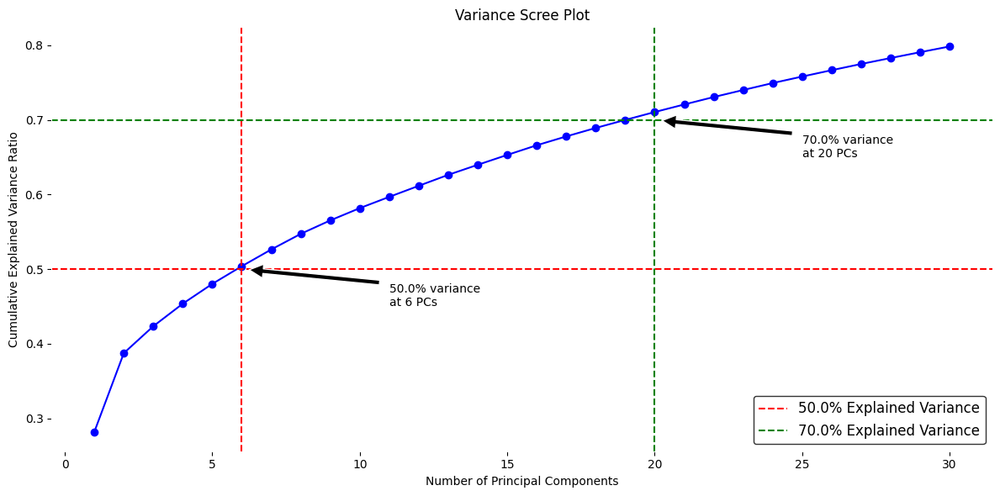

Maximum cumulative explained variance: 0.7984
Number of PCs: 30
Variance explained with 5 PCs: 0.4801
Variance explained with 10 PCs: 0.5817
Variance explained with 20 PCs: 0.7105
Cannot calculate for 50 PCs, max PCs is 30
Cannot calculate for 100 PCs, max PCs is 30


In [24]:
sc.pp.highly_variable_genes(adata, n_top_genes=7500, layer="raw_counts",flavor="seurat_v3")
adata.X = adata.layers["lognormalized_counts"].copy()
sc.tl.pca(adata, svd_solver="arpack",n_comps=30)
sc.pp.neighbors(adata,n_neighbors=15)
sc.tl.umap(adata)

# Ensure PCA has been computed
if 'X_pca' not in adata.obsm.keys():
    sc.pp.pca(adata)

# Get the explained variance ratio
explained_variance_ratio = adata.uns['pca']['variance_ratio']

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, 'bo-')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Variance Scree Plot')

# Add lines for different thresholds
thresholds = [0.5, 0.7, 0.9]
colors = ['r', 'g', 'y']
for threshold, color in zip(thresholds, colors):
    if max(cumulative_variance_ratio) >= threshold:
        n_pcs = np.where(cumulative_variance_ratio >= threshold)[0][0] + 1
        plt.axhline(y=threshold, color=color, linestyle='--', label=f'{threshold*100}% Explained Variance')
        plt.axvline(x=n_pcs, color=color, linestyle='--')
        plt.annotate(f'{threshold*100}% variance\nat {n_pcs} PCs', 
                     xy=(n_pcs, threshold), 
                     xytext=(n_pcs+5, threshold-0.05),
                     arrowprops=dict(facecolor='black', shrink=0.05))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Print the maximum explained variance
max_variance = cumulative_variance_ratio[-1]
print(f"Maximum cumulative explained variance: {max_variance:.4f}")
print(f"Number of PCs: {len(cumulative_variance_ratio)}")

# Print variance explained at different numbers of PCs
pcs_to_check = [5, 10, 20, 50, 100]
for n_pcs in pcs_to_check:
    if n_pcs <= len(cumulative_variance_ratio):
        print(f"Variance explained with {n_pcs} PCs: {cumulative_variance_ratio[n_pcs-1]:.4f}")
    else:
        print(f"Cannot calculate for {n_pcs} PCs, max PCs is {len(cumulative_variance_ratio)}")

In [25]:
adata_cp = adata.copy()
# Prepare the AnnData object for saving
adata_cp = prepare_for_saving(adata_cp)

# Now try to save the AnnData object
try:
    adata_cp.write_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_cp_full_preprocessed.h5ad")
    print("AnnData object saved successfully.")
except Exception as e:
    print(f"Error saving AnnData object: {str(e)}")

... storing 'birth_date' as categorical
... storing 'start_date' as categorical
... storing 'death_date' as categorical
... storing 'death_date_v2' as categorical
... storing 'ink_1' as categorical
... storing 'chemo_1' as categorical
... storing 'chemo_2' as categorical
... storing 'chemo_3' as categorical
... storing 'chemo_4' as categorical
... storing 'progression' as categorical
... storing 'progression_date' as categorical
... storing 'updated_pfs' as categorical
... storing 'start_strale' as categorical
... storing 'end_strale' as categorical
... storing 'pfs_date' as categorical
... storing 'ttp_date' as categorical
... storing 'os_date' as categorical
... storing 'strale_2' as categorical
... storing 'start_strale_2' as categorical
... storing 'date_biopsy' as categorical


AnnData object saved successfully.


# GARD score

In [26]:
manual_sets = {
    "Negative Radiation Sensitivity (RS)": {
        # Negative coefficients indicate negative radiation sensitivity
        "AR": {"rank": None},      # -0.0098009
        "PRKCB": {"rank": None},   # -0.0017589 (PKC-beta)
        "RELA": {"rank": None},    # -0.0038171 (RelA)
        "SUMO1": {"rank": None},   # -0.0002509
        "PAK2": {"rank": None},    # -0.0092431
        "IRF1": {"rank": None},    # -0.0441683
        "HDAC1": {"rank": None}    # -0.0204469
    },
    "Positive Radiation Sensitivity (RR)": {
        # Positive coefficients indicate positive radiation sensitivity
        "JUN": {"rank": None},     # +0.0128283 (cJun)
        "STAT1": {"rank": None},   # +0.0254552
        "ABL1": {"rank": None}     # +0.1070213 (cABL)
    }
}

gene_lengths = adata.var["length"].copy()
gene_lengths.drop_duplicates(inplace=True)
set1 = set(adata.var_names.tolist())
set2 = set(gene_lengths.index)

common_genes = set1.intersection(set2)
gene_lengths = gene_lengths[gene_lengths.index.isin(common_genes)]
gene_lengths = gene_lengths[gene_lengths.index.isin(list(common_genes))]
adata_RSI = adata[:, list(gene_lengths.index)].copy()


## Regressing out gene length

### Lowess

[2.84528918 3.11234597 3.33777154 ... 2.26541787 3.25483861 1.98927116]
['AR', 'PRKCB', 'RELA', 'SUMO1', 'PAK2', 'IRF1', 'HDAC1', 'JUN', 'STAT1', 'ABL1']
[2.30220529 3.05517052 1.95553329 ... 0.62495389 2.25859014 1.37802467]
[2.8211375  3.5130464  2.97214674 ... 1.74191532 2.29423748 1.648315  ]
[1.04653111 2.49345609 1.39842691 ... 1.16856933 1.62035872 1.44471604]
[0.76562873 2.08061088 0.86692108 ... 2.453081   1.63551052 3.12271662]
[ 1.21515383  2.40108277  0.09621567 ... -2.26541787  2.425334
  1.62164675]
[ 1.71905901  2.2442403   1.11657576 ... -2.26541787  0.78821266
 -1.98927116]
[ 1.92539544  2.19592172  1.25734831 ... -0.06819329  1.94365843
  1.18878267]
[ 2.26065629  2.77375806  1.51425873 ...  0.87007635  2.09226892
 -1.98927116]
[ 1.60905811  2.43283147  0.49086986 ... -0.06819329  1.94365843
 -1.98927116]
[ 1.29784554  2.02931758  0.93889458 ... -2.26541787  0.9792679
  1.26882537]
[2.56635687 2.91593255 1.87716422 ... 0.82562458 1.73559398 0.90110059]
[ 2.42256898  2

/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykerne

[ 0.68107134  2.94209337  2.09157409 ...  0.29953149  1.91564539
 -1.98927116]
[3.94142777 3.61867213 2.74672787 ... 1.47225175 2.53205878 3.30403366]
[ 1.86424102  2.40108277  0.73976591 ...  0.82562458  0.75249458
 -0.04336102]
[3.12852043 3.08001652 2.53152537 ... 1.030419   2.19189877 2.56460573]
[2.57524582 3.37837756 2.1552899  ... 1.96868863 2.54425405 2.27340871]
[ 2.98659329  2.75412208  2.02352063 ... -2.26541787  1.83275773
  1.00646111]
[2.47283081 3.14148284 1.64583508 ... 1.13577951 1.36028191 1.22960466]
[2.69988826 3.12402362 2.13869201 ... 1.030419   2.70616673 1.53708936]
[2.52534884 3.34127903 2.09595047 ... 1.49578225 2.43889353 2.03608053]
[3.59565736 3.73033731 3.03384031 ... 1.79502514 3.35585744 2.77290277]
[3.39108041 3.67211109 2.26803053 ... 1.75993382 2.78779423 1.67429048]
[2.46297851 2.59808104 1.80389202 ... 0.82562458 2.23409912 1.47646474]
[ 2.02990814  3.06144013  2.04672352 ... -0.31950772  2.27459048
  0.20795341]
[ 3.09488207  3.23853974  2.37925616

/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykerne

[2.9041038  2.46738385 1.20552324 ... 0.87007635 2.15233317 1.53708936]
[2.46297851 3.15485458 2.19561795 ... 1.13577951 2.3286577  2.35453426]
[1.60905811 2.6209953  1.47441282 ... 1.51877176 1.65781628 1.98102075]
[2.35320785 2.95607962 2.42741956 ... 0.29953149 2.37278251 2.07117185]
[3.04081485 2.95839176 2.1470254  ... 0.62495389 2.13423312 2.16961192]
[ 1.60905811  2.17085776  1.52976291 ... -2.26541787  1.46366027
  1.37802467]
[ 2.17199065  2.46738385  1.25734831 ... -0.18597633  1.46366027
  0.64978617]
[2.3587175  2.65909515 1.82128376 ... 0.62495389 1.76244123 1.7243009 ]
[2.12452412 2.86400494 1.68610898 ... 0.21948878 1.88682495 1.14622305]
[1.98302455 2.82254822 2.07832886 ... 1.39814378 2.69840473 2.24483534]
[2.52068683 3.5196558  2.10896583 ... 1.34550004 2.63680561 1.26882537]
[ 2.51600298  3.06559814  1.6795083  ... -2.26541787  2.4219152
  1.5072364 ]
[ 0.96137331  1.99964182  0.51237606 ... -2.26541787  1.82033521
  0.95516781]
[2.12452412 2.692789   1.51425873 ...

/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_4007427/3955231765.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykerne

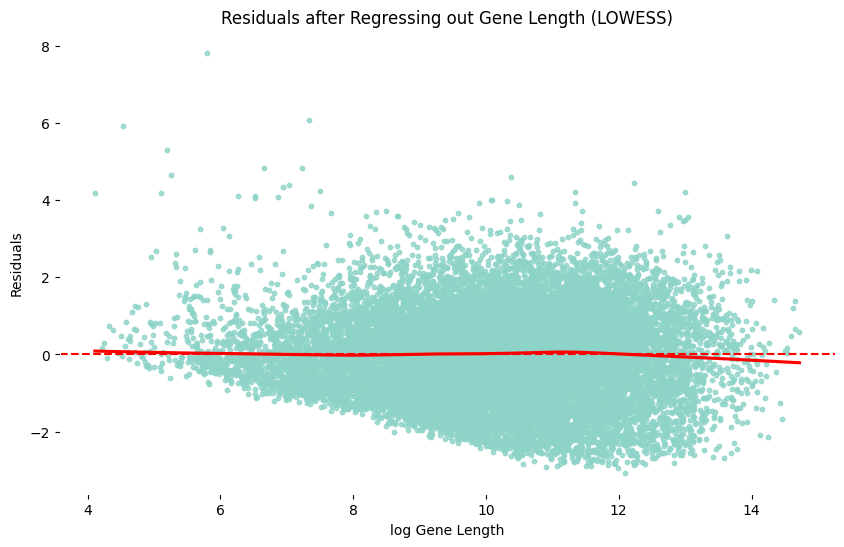

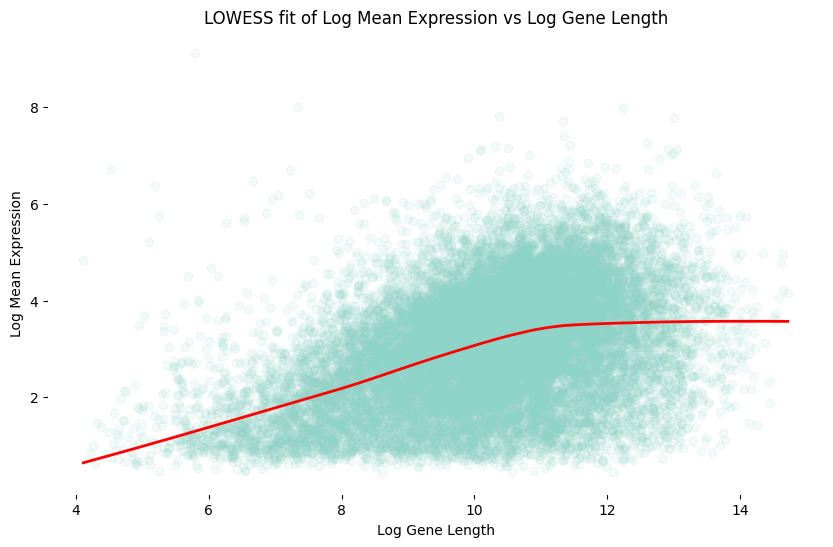

In [27]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
import itertools

# Step 1: Compute the average expression of each gene across all samples (mean expression)
mean_expression = adata_RSI.layers["normalized_counts"].mean(axis=0)

# Step 2: Compute log mean expression and log gene lengths
log_mean_expression = np.log1p(mean_expression)  # log transform of mean RPM expression
log_gene_lengths = np.log1p(gene_lengths.values)  # log transform of gene lengths

# Step 3: Fit a LOWESS model based on the log mean expression and log gene lengths
lowess_result = lowess(log_mean_expression, log_gene_lengths, frac=0.7, it=5)
smoothed_log_lengths = lowess_result[:, 0]
smoothed_log_expression = lowess_result[:, 1]

# Interpolate the fitted values for all gene lengths
fitted_values = np.interp(log_gene_lengths, smoothed_log_lengths, smoothed_log_expression)
print(fitted_values)
# Step 4: Prepare to store ranked sets for each sample with sample identifiers
ranked_sets_per_sample = {}

# Get log-normalized expression data for each sample (90 samples in total)
lognorm_data = adata_RSI.layers["lognormalized_counts"]

# Get sample names from adata.obs.index
sample_names = adata_RSI.obs.index

# Genes of interest (from manual_sets)
genes_of_interest = list(itertools.chain(*[list(gard_type_dict.keys()) for gard_type_dict in manual_sets.values()]))
print(genes_of_interest)
# Iterate over each sample (axis 0 corresponds to samples)
for sample_idx in range(lognorm_data.shape[0]):
    # Step 5: Get the log-normalized expression for the current sample
    log_sample_expression = lognorm_data[sample_idx, :]

    # Step 6: Subtract the precomputed fitted values (from the LOWESS fit) for gene length - regressing out
    length_adjusted_expression = log_sample_expression - fitted_values
    print(length_adjusted_expression)
    # Step 7: Rank the genes by length-adjusted expression for this sample
    ranked_genes = np.argsort(length_adjusted_expression)[::-1]  # Reverse for descending order

    # Create a DataFrame to store the ranked genes for this sample
    ranked_genes_df = pd.DataFrame({
        "gene_name": adata_RSI.var_names[ranked_genes],
        "length_adjusted_expression": length_adjusted_expression[ranked_genes]
    })

    # Step 8: Filter ranked_genes_df to keep only the genes in manual_sets (genes of interest)
    filtered_ranked_genes_df = ranked_genes_df[ranked_genes_df["gene_name"].isin(genes_of_interest)]

    # Step 9: Re-rank the genes of interest relatively (from 1 to N where N is the number of genes of interest)
    filtered_ranked_genes_df["relative_rank"] = np.arange(len(filtered_ranked_genes_df), 0, -1)

    # Step 10: Prepare a ranked set for this sample
    ranked_set = {gard_type: {} for gard_type in manual_sets.keys()}  # Initialize empty ranked set

    # Update ranks in the manual_sets dictionary for this sample based on the relative rank
    for gard_type, gard_type_dict in manual_sets.items():
        for gene_name in gard_type_dict.keys():
            subset_ranked_df = filtered_ranked_genes_df.loc[filtered_ranked_genes_df["gene_name"] == gene_name]
            if not subset_ranked_df.empty:
                # Store the relative rank in the sample's ranked set
                ranked_set[gard_type][gene_name] = subset_ranked_df["relative_rank"].values[0]
            else:
                # If the gene is not found, it can be skipped or set to a default value (e.g., None)
                ranked_set[gard_type][gene_name] = None

    # Step 11: Map the ranked set to the sample name
    sample_name = sample_names[sample_idx]
    ranked_sets_per_sample[sample_name] = ranked_set
residuals = log_mean_expression - fitted_values

# After the loop, ranked_sets_per_sample will contain a dictionary
# where each key is a sample name and the value is the ranked set for that sample.
plt.figure(figsize=(10, 6))
sns.regplot(x=log_gene_lengths, y=residuals, lowess=True, line_kws={'color': 'red'}, scatter_kws={'s':10})
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('log Gene Length')
plt.ylabel('Residuals')
plt.title('Residuals after Regressing out Gene Length (LOWESS)')
plt.show()

# Visualize the LOWESS fit
plt.figure(figsize=(10, 6))
plt.scatter(log_gene_lengths, log_mean_expression, alpha=0.1)
plt.plot(smoothed_log_lengths, smoothed_log_expression, color='red', linewidth=2)
plt.xlabel('Log Gene Length')
plt.ylabel('Log Mean Expression')
plt.title('LOWESS fit of Log Mean Expression vs Log Gene Length')
plt.show()

Logarithm of p-value (logp):

result['logp'] = -np.log10(result['pvalue'])
This transforms the p-value into a more manageable scale. The negative log transformation makes small p-values (indicating high significance) larger and more positive. This is a common transformation in statistical analysis.
Sign of log2 fold change (fcsign):

result['fcsign'] = np.sign(result['log2FoldChange'])
This captures the direction of the effect: +1 for upregulated genes, -1 for downregulated genes, and 0 for no change.
Metric (metric):

result['metric'] = result['logp'] / result['fcsign']
The metric divides the signed log fold change into the log p-value, which adjusts the p-value by the direction of the fold change.
Interpretation:
Positive metric values correspond to significant upregulated genes.
Negative metric values correspond to significant downregulated genes.
High absolute values (both positive and negative) indicate genes with a strong signal, whether upregulated or downregulated.

## Calculate GARD

In [28]:
ranked_sets_per_sample

{'R1_79': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 5,
   'RELA': 2,
   'SUMO1': 4,
   'PAK2': 10,
   'IRF1': 7,
   'HDAC1': 3},
  'Positive Radiation Sensitivity (RR)': {'JUN': 8, 'STAT1': 9, 'ABL1': 6}},
 'R2_07': {'Negative Radiation Sensitivity (RS)': {'AR': 2,
   'PRKCB': 1,
   'RELA': 8,
   'SUMO1': 3,
   'PAK2': 6,
   'IRF1': 4,
   'HDAC1': 7},
  'Positive Radiation Sensitivity (RR)': {'JUN': 9, 'STAT1': 10, 'ABL1': 5}},
 'R2_22': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 5,
   'SUMO1': 3,
   'PAK2': 7,
   'IRF1': 6,
   'HDAC1': 4},
  'Positive Radiation Sensitivity (RR)': {'JUN': 9, 'STAT1': 10, 'ABL1': 8}},
 'R1_19': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 3,
   'RELA': 8,
   'SUMO1': 2,
   'PAK2': 7,
   'IRF1': 9,
   'HDAC1': 6},
  'Positive Radiation Sensitivity (RR)': {'JUN': 4, 'STAT1': 10, 'ABL1': 5}},
 'R2_29': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 6,
   'SUM

##################
R1_79
{'Negative Radiation Sensitivity (RS)': {'AR': 1, 'PRKCB': 5, 'RELA': 2, 'SUMO1': 4, 'PAK2': 10, 'IRF1': 7, 'HDAC1': 3}, 'Positive Radiation Sensitivity (RR)': {'JUN': 8, 'STAT1': 9, 'ABL1': 6}}
0.483668
##################
##################
R2_07
{'Negative Radiation Sensitivity (RS)': {'AR': 2, 'PRKCB': 1, 'RELA': 8, 'SUMO1': 3, 'PAK2': 6, 'IRF1': 4, 'HDAC1': 7}, 'Positive Radiation Sensitivity (RR)': {'JUN': 9, 'STAT1': 10, 'ABL1': 5}}
0.4772029
##################
##################
R2_22
{'Negative Radiation Sensitivity (RS)': {'AR': 1, 'PRKCB': 2, 'RELA': 5, 'SUMO1': 3, 'PAK2': 7, 'IRF1': 6, 'HDAC1': 4}, 'Positive Radiation Sensitivity (RR)': {'JUN': 9, 'STAT1': 10, 'ABL1': 8}}
0.7815210999999997
##################
##################
R1_19
{'Negative Radiation Sensitivity (RS)': {'AR': 1, 'PRKCB': 3, 'RELA': 8, 'SUMO1': 2, 'PAK2': 7, 'IRF1': 9, 'HDAC1': 6}, 'Positive Radiation Sensitivity (RR)': {'JUN': 4, 'STAT1': 10, 'ABL1': 5}}
0.20995770000000002
#####

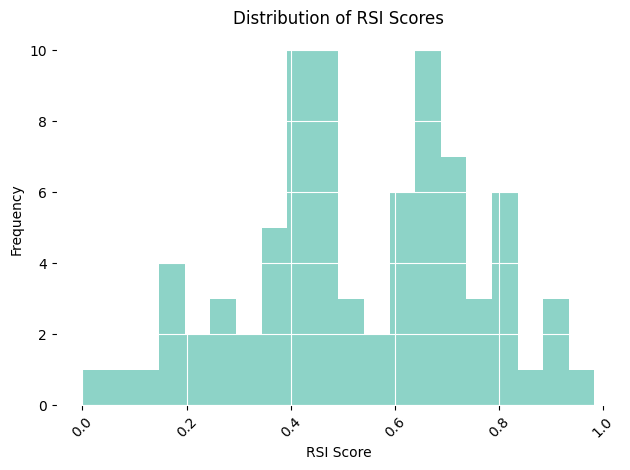

In [29]:

def RSI(adata, rank_dictionary):
    RSI_list = []
    
    for sample_name, rank_dict in rank_dictionary.items():
        # Initialize RSI score for the sample
        RSI = 0
        
        # Safely retrieve ranks and assign 0 if missing
        AR_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("AR")
        JUN_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("JUN")
        STAT1_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("STAT1")
        PRKCB_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("PRKCB")
        RELA_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("RELA")
        ABL1_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("ABL1")
        SUMO1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("SUMO1")
        PAK2_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("PAK2")
        HDAC1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("HDAC1")
        IRF1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("IRF1")

        # Calculate RSI score based on ranks and predefined coefficients
        RSI = (
            (-0.0098009 * AR_rank)
            + (0.0128283 * JUN_rank)    # cJun in paper
            + (0.0254552 * STAT1_rank)
            + (-0.0017589 * PRKCB_rank) # PKC-beta in paper
            + (-0.0038171 * RELA_rank)  # RelA in paper
            + (0.1070213 * ABL1_rank)   # Changed sign, cABL in paper
            + (-0.0002509 * SUMO1_rank)
            + (-0.0092431 * PAK2_rank)
            + (-0.0204469 * HDAC1_rank)
            + (-0.0441683 * IRF1_rank)  # Changed sign
        )

        print("##################")
        print(sample_name)
        print(rank_dict)
        print(RSI)
        print("##################")
        # Clip RSI if negative
        if RSI < 0:
            print(RSI, sample_name, rank_dict)
            RSI = 0
        # Append RSI score for the current sample
        RSI_list.append(RSI)


    # Assign the calculated RSI scores back to the adata.obs DataFrame
    adata.obs["RSI"] = RSI_list

    return adata.obs

# Execute the GARD function to calculate RSI scores and add them to adata.obs
GARD_final_df = RSI(adata_RSI, rank_dictionary=ranked_sets_per_sample)

# Plot distribution histogram of RSI scores
adata_RSI.obs["RSI"].hist(bins=20)

# Add title and labels
plt.title("Distribution of RSI Scores")
plt.xlabel("RSI Score")
plt.ylabel("Frequency")

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

In [30]:
# Add RSI column from adata_RSI to adata.obs
adata.obs["RSI"] = adata_RSI.obs["RSI"]

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def rank_and_group_gard(df):
    """
    Ranks patients by GARD and groups them into two GARD levels (low and high).

    Args:
        df: A pandas DataFrame containing the 'GARD' column.

    Returns:
        The updated DataFrame with 'GARD_rank' and 'GARD_group' columns.
    """
    # Rank patients by GARD (highest to lowest)
    df = df.sort_values(by='GARD', ascending=False).reset_index(drop=True)
    df['GARD_rank'] = df.index + 1  # Add rank column

    # Calculate 75th percentile cutoff
    percentile_75 = df['GARD'].quantile(0.75)
    
    # Split into two groups: "Low" (bottom 75%) and "High" (top 25%)
    df['GARD_group'] = ['High' if gard >= percentile_75 else 'Low' for gard in df['GARD']]

    return df

def calculate_alpha(rsi, beta=0.05):
    """
    Calculates the alpha (α) parameter for a given RSI value.

    Args:
        rsi: The Radiation Sensitivity Index for the patient.
        beta: The fixed beta (β) constant value in Gy^-2 (default: 0.05).

    Returns:
        The patient-specific alpha value.
    """
    d = 2  # Dose per fraction (Gy)
    n = 1  # Number of fractions
    alpha = (np.log(rsi) + beta * n * d**2) / (-n * d)
    return alpha

def calculate_gard(rsi, total_dose, fractions, beta=0.05):
    """
    Calculates the Genomically Adjusted Radiation Dose (GARD).

    Args:
        rsi: The Radiation Sensitivity Index for the patient.
        total_dose: Total radiation dose delivered (Gy).
        fractions: Number of fractions.
        beta: Fixed beta (β) value in Gy^-2 (default: 0.05).

    Returns:
        The GARD value for the patient.
    """
    d = total_dose / fractions  # Dose per fraction
    alpha = calculate_alpha(rsi, beta)
    gard = fractions * d * (alpha + beta * d)
    return gard

# Main workflow
def process_and_analyze_gard(df):
    """
    Full pipeline to process GARD, extract dose and fractions, rank patients, and perform analysis.

    Args:
        df: Input pandas DataFrame with RSI and Arm columns.

    Returns:
        Processed DataFrame with GARD levels and analysis results.
    """
    
    # Extract total dose and fractions from 'Arm' column
    df[['total_dose', 'fractions']] = df['Arm'].str.split('/', expand=True)
    df['total_dose'] = df['total_dose'].str.replace("Gy", "").astype(int)
    df['fractions'] = df['fractions'].str.replace("fraksjoner", "").astype(int)

    # Calculate GARD
    df['GARD'] = df.apply(lambda row: calculate_gard(row['RSI'], row['total_dose'], row['fractions']), axis=1)
    df['GARD_clamped'] = df['GARD'].clip(upper=100,lower=0)

    # Rank patients and group into low/high GARD
    df = rank_and_group_gard(df)



    return df



In [32]:
df = process_and_analyze_gard(adata.obs)

/tmp/ipykernel_4007427/386677636.py:41: RuntimeWarning: divide by zero encountered in log


In [33]:
df

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,after_progression,age_at_sample,before_after_progression,RSI,total_dose,fractions,GARD,GARD_clamped,GARD_rank,GARD_group
0,SFH125/19.A,TH096,TB-9,Lymph Node,Metastasis,?,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,64,0,0.000000,60,40,inf,100.000000,1,High
1,SFH117/19,TH062,TB-7,Lymph Node,Metastasis,?,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,-21.254928,65,0,0.054958,45,30,64.151685,64.151685,2,High
2,SFH63/23,TH101,TB-77,Lung,Primary,SCLC,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,68,0,0.145122,60,40,56.405436,56.405436,3,High
3,SFH57/21,TH128,TB-71,Lymph Node,Metastasis,SCLC?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-8.278581,68,0,0.149314,60,40,55.551034,55.551034,4,High
4,SFH176/20,TH140,TB-26,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,58,0,0.154019,60,40,54.620477,54.620477,5,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,SFH58/21,TH009,TB-72,Lymph Node,Metastasis,?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-5.486202,75,0,0.885844,60,40,2.136436,2.136436,77,Low
77,SFH74/21.1A,TH086,TB-89,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-5.453351,56,0,0.879600,45,30,1.761475,1.761475,78,Low
78,SFH177/20,TH173,TB-27,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-11.399474,58,0,0.923752,45,30,0.659512,0.659512,79,Low
79,SFH167/21,TH158,TB-18,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-10.578187,64,0,0.928235,45,30,0.550588,0.550588,80,Low


/tmp/ipykernel_4007427/4115622947.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
/tmp/ipykernel_4007427/4115622947.py:168: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


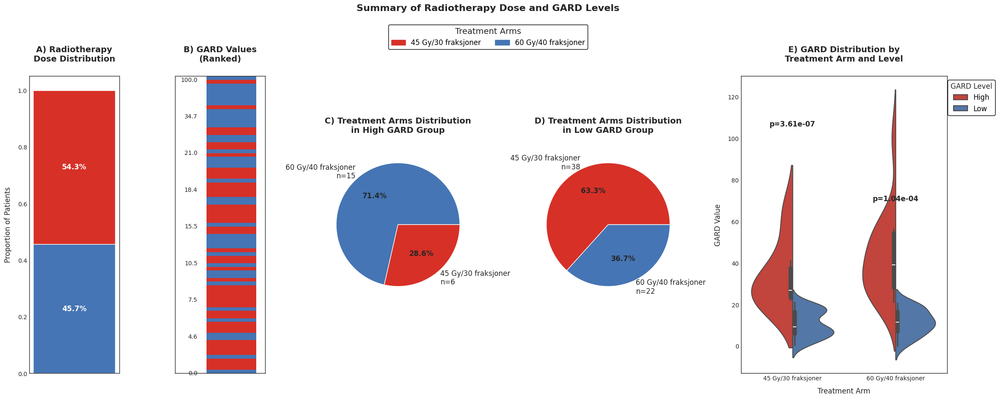

In [34]:
def plot_gard_summary(df):
    """
    Creates a publication-ready visualization of GARD distribution across treatment arms.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing columns: 'Arm', 'GARD_group', 'GARD_clamped', 'GARD_rank'
    """
    # Set style for publication quality
    plt.style.use('seaborn-whitegrid')
    sns.set_style("white")
    
    # Define consistent colors
    arm_colors = {
        '45 Gy/30 fraksjoner': '#d73027',  # red
        '60 Gy/40 fraksjoner': '#4575b4'   # blue
    }
    gard_colors = {
        'High': '#d73027',
        'Low': '#4575b4'
    }
    
    # Create figure with better proportions
    fig = plt.figure(figsize=(24, 10))
    gs = fig.add_gridspec(1, 5, width_ratios=[0.7, 0.7, 1.2, 1.2, 1.6],
                         wspace=0.4, hspace=0.3,
                         left=0.05, right=0.95, top=0.85, bottom=0.15)
    
    # A1: Stacked bar plot
    ax1 = fig.add_subplot(gs[0])
    total_counts = len(df)
    proportions = []
    labels = []
    colors = []
    
    for arm in sorted(df['Arm'].unique(), reverse=True):
        count = len(df[df['Arm'] == arm])
        proportions.append(count / total_counts)
        labels.append(f"{arm}\nn={count}")
        colors.append(arm_colors[arm])
    
    bottom = 0
    for prop, color, label in zip(proportions, colors, labels):
        ax1.bar(0, prop, bottom=bottom, color=color, width=0.8)
        ax1.text(0, bottom + prop/2, f"{prop*100:.1f}%",
                ha='center', va='center',
                color='white', fontsize=12, fontweight='bold')
        bottom += prop
    
    ax1.set_title('A) Radiotherapy\nDose Distribution', 
                 fontsize=14, fontweight='bold', pad=25)
    ax1.set_ylabel('Proportion of Patients', fontsize=12, labelpad=10)
    ax1.set_ylim(0, 1.05)
    ax1.set_xticks([])
    
    # A2: Ranked GARD values with improved spacing
    ax1_2 = fig.add_subplot(gs[1])
    df_sorted = df.sort_values('GARD_clamped', ascending=True).reset_index()
    num_patients = len(df_sorted)
    
    # Adjust plot area to leave more space for labels
    plot_left = 0.35  # Increased space for labels on left
    plot_width = 0.55  # Adjusted width of colored rectangles
    
    # Plot rectangles with improved spacing
    for i in range(num_patients):
        ax1_2.add_patch(plt.Rectangle((plot_left, i/num_patients), plot_width, 1/num_patients,
                                    facecolor=arm_colors[df_sorted.iloc[i]['Arm']],
                                    edgecolor='none'))
        
        # Add GARD values every 10th patient with more space
        if i % 10 == 0 or i == num_patients-1:
            ax1_2.text(plot_left - 0.1, i/num_patients,  # Increased spacing
                      f"{df_sorted.iloc[i]['GARD_clamped']:.1f}",
                      ha='right', va='center', fontsize=10)
    
    ax1_2.set_ylim(0, 1)
    ax1_2.set_xlim(0, 1)
    ax1_2.set_title('B) GARD Values\n(Ranked)',
                    fontsize=14, fontweight='bold', pad=25)
    ax1_2.set_xticks([])
    ax1_2.set_yticks([])
    
    # Pie charts with improved layout
    # High GARD group
    ax2 = fig.add_subplot(gs[2])
    high_gard_arms = df[df['GARD_group'] == 'High']['Arm'].value_counts()
    wedges, texts, autotexts = ax2.pie(high_gard_arms,
                                      colors=[arm_colors[arm] for arm in high_gard_arms.index],
                                      autopct='%1.1f%%',
                                      labels=[f'{arm}\nn={count}'
                                             for arm, count in high_gard_arms.items()],
                                      textprops={'fontsize': 12})
    
    plt.setp(autotexts, size=12, weight="bold")
    plt.setp(texts, size=12)
    ax2.set_title('C) Treatment Arms Distribution\nin High GARD Group',
                 fontsize=14, fontweight='bold', pad=25)
    
    # Low GARD group
    ax3 = fig.add_subplot(gs[3])
    low_gard_arms = df[df['GARD_group'] == 'Low']['Arm'].value_counts()
    wedges, texts, autotexts = ax3.pie(low_gard_arms,
                                      colors=[arm_colors[arm] for arm in low_gard_arms.index],
                                      autopct='%1.1f%%',
                                      labels=[f'{arm}\nn={count}'
                                             for arm, count in low_gard_arms.items()],
                                      textprops={'fontsize': 12})
    
    plt.setp(autotexts, size=12, weight="bold")
    plt.setp(texts, size=12)
    ax3.set_title('D) Treatment Arms Distribution\nin Low GARD Group',
                 fontsize=14, fontweight='bold', pad=25)
    
    # Violin plot with improved styling
    ax4 = fig.add_subplot(gs[4])
    sns.violinplot(data=df, x='Arm', y='GARD_clamped', hue='GARD_group',
                  palette=gard_colors, split=True, inner='box',
                  ax=ax4, linewidth=1.5)
    
    ax4.set_title('E) GARD Distribution by\nTreatment Arm and Level',
                 fontsize=14, fontweight='bold', pad=25)
    ax4.set_xlabel('Treatment Arm', fontsize=12, labelpad=10)
    ax4.set_ylabel('GARD Value', fontsize=12, labelpad=10)
    
    # Adjust violin plot legend
    violin_legend = ax4.legend(title='GARD Level',
                             bbox_to_anchor=(1.25, 1),
                             title_fontsize=12,
                             fontsize=12,
                             frameon=True)
    violin_legend.get_frame().set_alpha(1)
    
    # Add statistical annotations
    from scipy import stats
    for arm in df['Arm'].unique():
        arm_data = df[df['Arm'] == arm]
        stat, p_val = stats.mannwhitneyu(
            arm_data[arm_data['GARD_group'] == 'High']['GARD_clamped'],
            arm_data[arm_data['GARD_group'] == 'Low']['GARD_clamped']
        )
        y_max = arm_data['GARD_clamped'].max()
        ax4.text(df['Arm'].unique().tolist().index(arm), y_max + 5,
                f'p={p_val:.2e}',
                ha='center', va='bottom',
                fontsize=12, fontweight='bold')
    
    # Main title with better positioning
    fig.suptitle('Summary of Radiotherapy Dose and GARD Levels',
                fontsize=16, fontweight='bold', y=1.02)
    
    # Create main legend with adjusted positioning (below the title)
    legend_elements = [plt.Rectangle((0,0), 1, 1, color=color, label=label)
                      for label, color in arm_colors.items()]
    legend = fig.legend(handles=legend_elements,
                       loc='upper center',
                       bbox_to_anchor=(0.5, 0.98),
                       ncol=2,
                       title="Treatment Arms",
                       title_fontsize=14,
                       fontsize=12,
                       frameon=True,
                       edgecolor='black')
    legend.get_frame().set_alpha(1)
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    
    return fig

# Usage
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

fig = plot_gard_summary(df)
plt.show()

In [ ]:
df["RSI"].describe()

count    81.000000
mean      0.535698
std       0.221542
min       0.000000
25%       0.398667
50%       0.530751
75%       0.692981
max       0.984078
Name: RSI, dtype: float64

In [36]:
df

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,after_progression,age_at_sample,before_after_progression,RSI,total_dose,fractions,GARD,GARD_clamped,GARD_rank,GARD_group
0,SFH125/19.A,TH096,TB-9,Lymph Node,Metastasis,?,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,64,0,0.000000,60,40,inf,100.000000,1,High
1,SFH117/19,TH062,TB-7,Lymph Node,Metastasis,?,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,-21.254928,65,0,0.054958,45,30,64.151685,64.151685,2,High
2,SFH63/23,TH101,TB-77,Lung,Primary,SCLC,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,68,0,0.145122,60,40,56.405436,56.405436,3,High
3,SFH57/21,TH128,TB-71,Lymph Node,Metastasis,SCLC?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-8.278581,68,0,0.149314,60,40,55.551034,55.551034,4,High
4,SFH176/20,TH140,TB-26,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,58,0,0.154019,60,40,54.620477,54.620477,5,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,SFH58/21,TH009,TB-72,Lymph Node,Metastasis,?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-5.486202,75,0,0.885844,60,40,2.136436,2.136436,77,Low
77,SFH74/21.1A,TH086,TB-89,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-5.453351,56,0,0.879600,45,30,1.761475,1.761475,78,Low
78,SFH177/20,TH173,TB-27,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-11.399474,58,0,0.923752,45,30,0.659512,0.659512,79,Low
79,SFH167/21,TH158,TB-18,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-10.578187,64,0,0.928235,45,30,0.550588,0.550588,80,Low


In [37]:
df

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,after_progression,age_at_sample,before_after_progression,RSI,total_dose,fractions,GARD,GARD_clamped,GARD_rank,GARD_group
0,SFH125/19.A,TH096,TB-9,Lymph Node,Metastasis,?,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,64,0,0.000000,60,40,inf,100.000000,1,High
1,SFH117/19,TH062,TB-7,Lymph Node,Metastasis,?,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,-21.254928,65,0,0.054958,45,30,64.151685,64.151685,2,High
2,SFH63/23,TH101,TB-77,Lung,Primary,SCLC,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,68,0,0.145122,60,40,56.405436,56.405436,3,High
3,SFH57/21,TH128,TB-71,Lymph Node,Metastasis,SCLC?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-8.278581,68,0,0.149314,60,40,55.551034,55.551034,4,High
4,SFH176/20,TH140,TB-26,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,NaN,58,0,0.154019,60,40,54.620477,54.620477,5,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,SFH58/21,TH009,TB-72,Lymph Node,Metastasis,?,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,-5.486202,75,0,0.885844,60,40,2.136436,2.136436,77,Low
77,SFH74/21.1A,TH086,TB-89,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-5.453351,56,0,0.879600,45,30,1.761475,1.761475,78,Low
78,SFH177/20,TH173,TB-27,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-11.399474,58,0,0.923752,45,30,0.659512,0.659512,79,Low
79,SFH167/21,TH158,TB-18,Lung,Primary,?,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,-10.578187,64,0,0.928235,45,30,0.550588,0.550588,80,Low


In [38]:
adata_RSI.obs = adata_RSI.obs.merge(df[["ID_Sample", "GARD","GARD_clamped","GARD_group"]], on="ID_Sample")

In [39]:
adata_RSI.obs[["ID_Sample", "RSI","GARD","GARD_clamped","GARD_group"]].to_csv("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/RSI_scores_81_samp.csv")

In [40]:
df.to_csv("/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/GARD_results.csv")

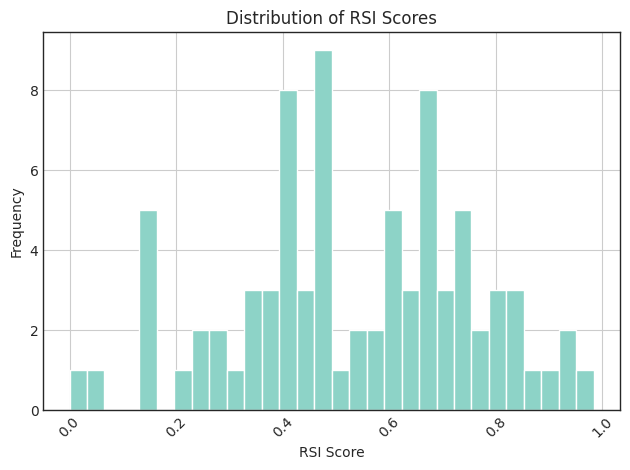

In [41]:
# Plot distribution histogram of RSI scores
df["RSI"].hist(bins=30)

# Add title and labels
plt.title("Distribution of RSI Scores")
plt.xlabel("RSI Score")
plt.ylabel("Frequency")

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

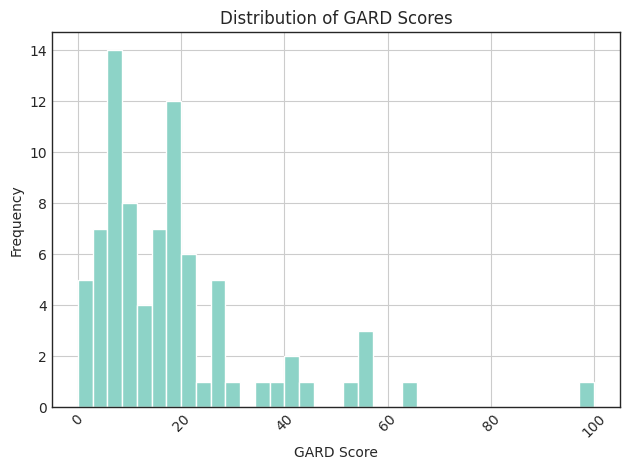

In [42]:
# Plot distribution histogram of RSI scores
df["GARD_clamped"].hist(bins=35)

# Add title and labels
plt.title("Distribution of GARD Scores")
plt.xlabel("GARD Score")
plt.ylabel("Frequency")

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

# GSEA + ORA Analysis

In [ ]:
functional_analysis = FunctionalAnalysis(adata,deg_analysis.get_results())
functional_analysis.run_analysis()
enrichment_results = functional_analysis.get_results()

# Transcription factor activity inference

The first functional analysis we can perform is to infer transcription factor (TF) activities from our transcriptomics data. We will need a gene regulatory network (GRN) and a statistical method.

### CollecTRI network
[CollecTRI](https://github.com/saezlab/CollecTRI) is a comprehensive resource
containing a curated collection of TFs and their transcriptional targets
compiled from 12 different resources. This collection provides an increased
coverage of transcription factors and a superior performance in identifying
perturbed TFs compared to our previous
[DoRothEA](https://saezlab.github.io/dorothea/) network and other literature
based GRNs. Similar to DoRothEA, interactions are weighted by their mode of
regulation (activation or inhibition).

For this example we will use the human version (mouse and rat are also
available). We can use `decoupler` to retrieve it from `omnipath`. The argument
`split_complexes` keeps complexes or splits them into subunits, by default we
recommend to keep complexes together.

<div class="alert alert-info">

**Note**

In this tutorial we use the network CollecTRI, but we could use any other GRN coming from an inference method such as [CellOracle](https://morris-lab.github.io/CellOracle.documentation/), [pySCENIC](https://pyscenic.readthedocs.io/en/latest/) or [SCENIC+](https://scenicplus.readthedocs.io/en/latest/). 

</div> 

After performing DEA, we can use the obtained gene level statistics to perform enrichment analysis. Any statistic can be used,
but we recommend using the t-values instead of logFCs since t-values incorporate the significance of change in their value.
We will transform the obtained t-values stored in `stats` to a wide matrix so that it can be used by `decoupler`:

In [ ]:
mat = results_df[['stat']].T.rename(index={'stat': 'Lung.vs.LymphNode'})
mat

# Retrieve CollecTRI gene regulatory network
collectri = dc.get_collectri(organism='human', split_complexes=False)
collectri

# Infer TF activities with ulm
tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri, verbose=True)
tf_acts 	

# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(
		acts=tf_acts,
		contrast='Lung.vs.LymphNode',
		top=125,
		vertical=True,
	)
		
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 28)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

  

# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=500)
progeny

In [ ]:
# Retrieve CollecTRI gene regulatory network
collectri = dc.get_collectri(organism='human', split_complexes=False)
collectri

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


### Activity inference with Univariate Linear Model (ULM)

To infer TF enrichment scores we will run the Univariate Linear Model (`ulm`) method. For each sample in our dataset (`mat`) and each TF in our network (`net`), it fits a linear model that predicts the observed gene expression
based solely on the TF's TF-Gene interaction weights. Once fitted, the obtained t-value of the slope is the score. If it is positive, we interpret that the TF is active and if it is negative we interpret that it is inactive.

<img src="../ulm.png" />

We can run `ulm` with a one-liner:

In [ ]:
# Infer TF activities with ulm
tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri, verbose=True)
tf_acts 	

Running ulm on mat with 1 samples and 23219 targets for 701 sources.


,ABL1,AHR,AHRR,AIP,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,...,ZNF362,ZNF382,ZNF384,ZNF395,ZNF436,ZNF699,ZNF76,ZNF804A,ZNF91,ZXDC
Lung.vs.LymphNode,-0.272535,4.693959,-1.958587,0.412649,1.851745,11.203584,1.173592,7.515489,0.836594,-0.849808,...,2.957221,-1.170319,4.424486,0.289466,-2.052598,2.176449,0.231242,-0.275438,4.088609,2.218354


In [ ]:
tf_acts

,ABL1,AHR,AHRR,AIP,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,...,ZNF362,ZNF382,ZNF384,ZNF395,ZNF436,ZNF699,ZNF76,ZNF804A,ZNF91,ZXDC
Lung.vs.LymphNode,-0.272535,4.693959,-1.958587,0.412649,1.851745,11.203584,1.173592,7.515489,0.836594,-0.849808,...,2.957221,-1.170319,4.424486,0.289466,-2.052598,2.176449,0.231242,-0.275438,4.088609,2.218354


Let us plot the obtained scores for the top active/inactive transcription factors:

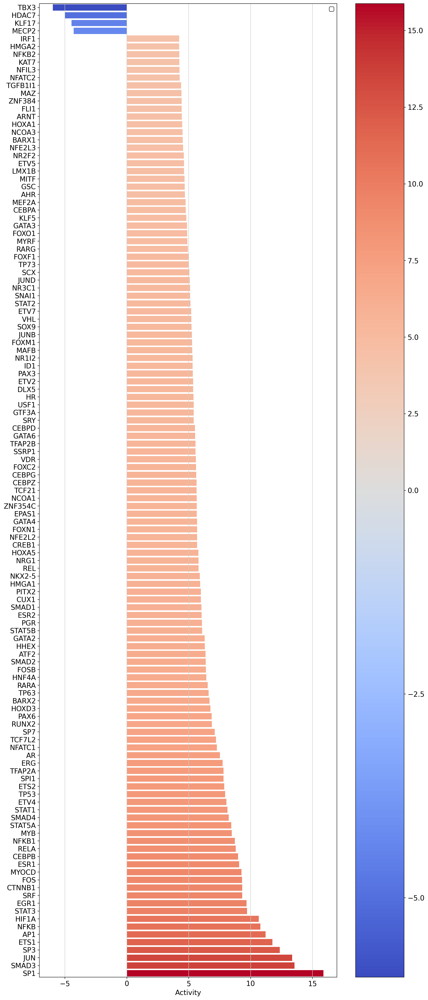

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(
		acts=tf_acts,
		contrast='Lung.vs.LymphNode',
		top=125,
		vertical=True,
	)
		
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 28)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

MYOCD SRF and JUNB seem to be the most activated in this treatment while IRF1, KLF11 AND ARID1A seem to be inactivated.

We can also plot the network of interesting TFs (top and bottom by activity) and color the nodes by activity and target gene expression:

In [ ]:
collectri

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


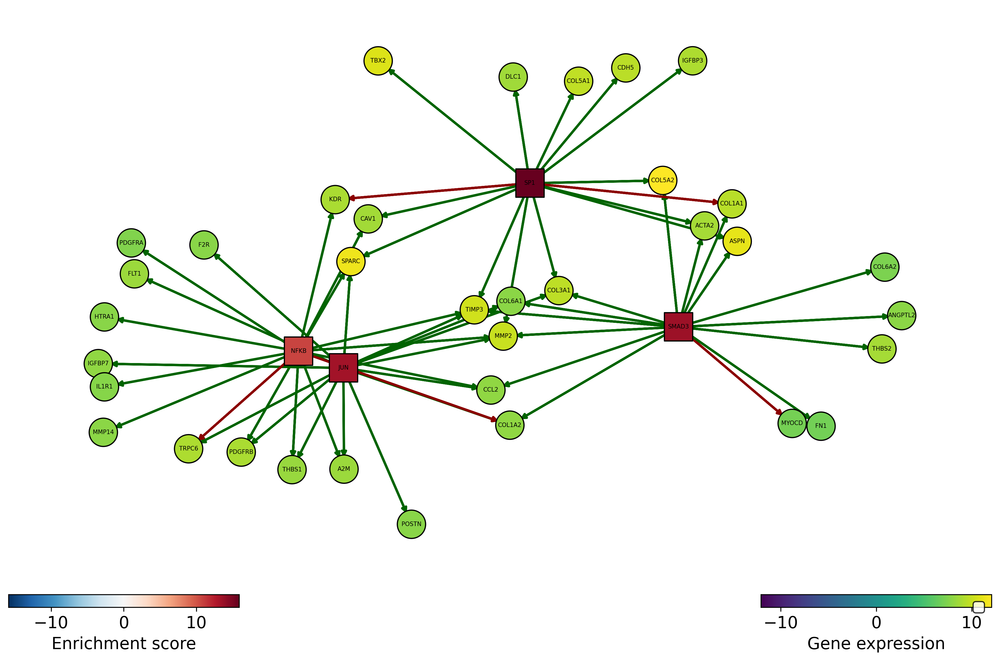

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_network(
		net=collectri,
		obs=mat,
		act=tf_acts,
		n_sources=['SP1', 'SMAD3', 'JUN', 'NFKB'],
		n_targets=15,
		node_size=100,
		figsize=(10, 10),
		c_pos_w='darkgreen',
		c_neg_w='darkred',
		vcenter=True
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

SRF seems to be active in treated cells since their positive targets are up-regulated.

If needed, we can also look at a volcano plot of the target genes:

In [ ]:
# Extract logFCs and pvals
logFCs = results_df[['log2FoldChange']].T.rename(index={'log2FoldChange': 'Lung.vs.LymphNode'})
pvals = results_df[['padj']].T.rename(index={'padj': 'Lung.vs.LymphNode'})

# Plot


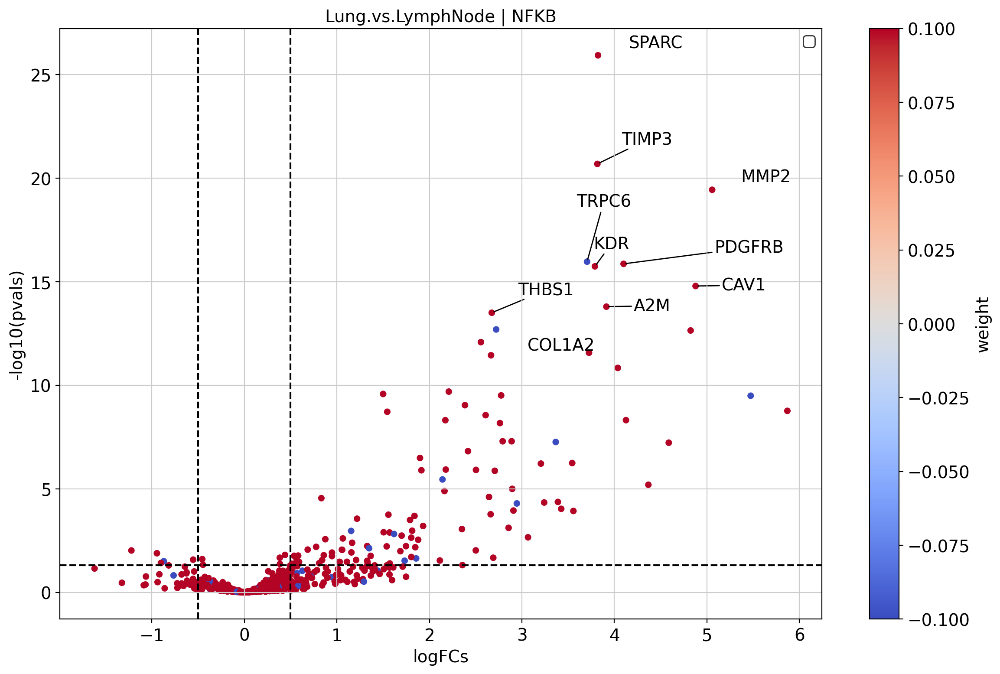

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_volcano(
        logFCs,
        pvals,
        'Lung.vs.LymphNode',
        name='NFKB',
        net=collectri,
        top=10,
        sign_thr=0.05,
        lFCs_thr=0.5
    )
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

# Pathway activity inference

Another analysis we can perform is to infer pathway activities from our transcriptomics data.

### PROGENy model

[PROGENy](https://saezlab.github.io/progeny/) is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction.
For this example we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:

- **Androgen**: involved in the growth and development of the male reproductive organs.
- **EGFR**: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells
- **Estrogen**: promotes the growth and development of the female reproductive organs.
- **Hypoxia**: promotes angiogenesis and metabolic reprogramming when O2 levels are low.
- **JAK-STAT**: involved in immunity, cell division, cell death, and tumor formation.
- **MAPK**: integrates external signals and promotes cell growth and proliferation.
- **NFkB**: regulates immune response, cytokine production and cell survival.
- **p53**: regulates cell cycle, apoptosis, DNA repair and tumor suppression.
- **PI3K**: promotes growth and proliferation.
- **TGFb**: involved in development, homeostasis, and repair of most tissues.
- **TNFa**: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.
- **Trail**: induces apoptosis.
- **VEGF**: mediates angiogenesis, vascular permeability, and cell migration.
- **WNT**: regulates organ morphogenesis during development and tissue repair.

To access it we can use `decoupler`.

In [ ]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=500)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


### Activity inference with Multivariate Linear Model (MLM)

To infer pathway enrichment scores we will run the Multivariate Linear Model (`mlm`) method. For each sample in our dataset (`adata`), it fits a linear model that predicts the observed gene expression based on all pathways' Pathway-Gene interactions weights.
Once fitted, the obtained t-values of the slopes are the scores. If it is positive, we interpret that the pathway is active and if it is negative we interpret that it is inactive.

<img src="../mlm.png" />
     
We can run `mlm` with a one-liner:

In [ ]:
# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=mat, net=progeny, verbose=True)
pathway_acts

Running mlm on mat with 1 samples and 23219 targets for 14 sources.


,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Lung.vs.LymphNode,4.885453,0.500617,1.154012,0.13278,6.6437,0.982684,0.369918,1.468549,14.149863,4.829954,0.73279,1.755929,2.536787,2.829577


Let us plot the obtained scores:

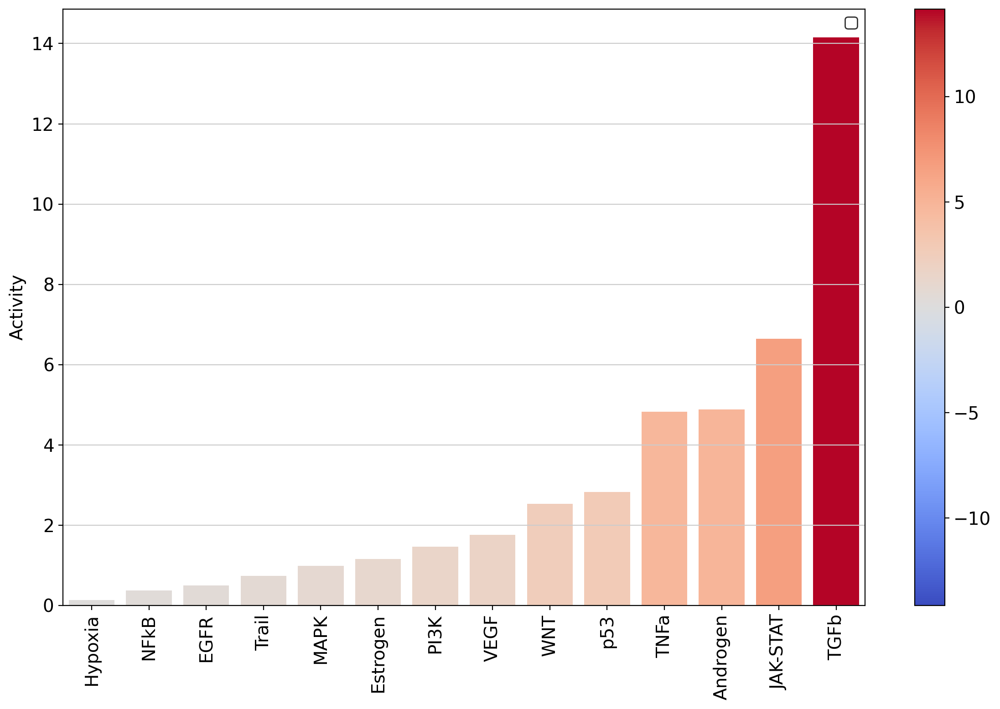

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(
		pathway_acts,
		'Lung.vs.LymphNode',
		top=25,
		vertical=False,
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

As expected, after treating cells with the cytokine TGFb we see an increase of activity for this pathway.

On the other hand, it seems that this treatment has decreased the activity of other pathways like JAK-STAT or TNFa.

We can visualize the targets of TFGb in a scatter plot:

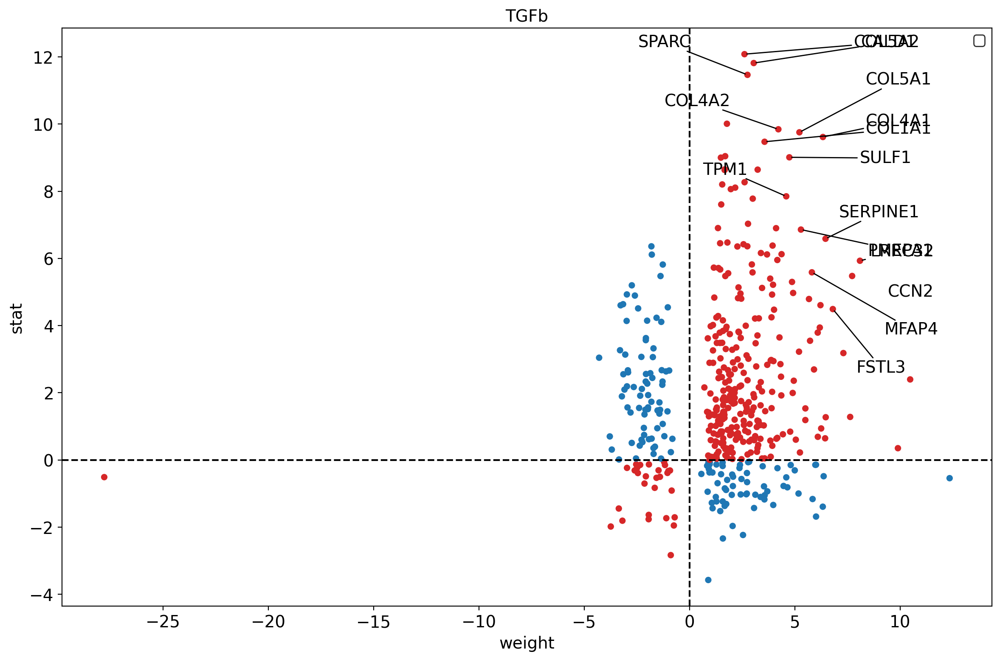

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_targets(results_df, stat='stat', source_name='TGFb', net=progeny, top=15)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

The observed activation of TGFb is due to the fact that majority of its target genes with positive weights have positive
t-values (1st quadrant), and the majority of the ones with negative weights have negative t-values (3d quadrant).

# Functional enrichment of biological terms

Finally, we can also infer activities for general biological terms or processes.

### MSigDB gene sets

The Molecular Signatures Database ([MSigDB](http://www.gsea-msigdb.org/gsea/msigdb/)) is a resource containing a collection of gene sets annotated to different biological processes.

In [ ]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


As an example, we will use the hallmark gene sets, but we could have used any other. 

<div class="alert alert-info">

**Note**
    
To see what other collections are available in MSigDB, type: `msigdb['collection'].unique()`.

</div>  

We can filter by for `hallmark`:

In [ ]:
progeny = dc.get_progeny(organism='human', top=500)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


In [ ]:
adata.raw = adata.copy()

In [ ]:
dc.run_mlm(
    mat=adata,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

Running mlm on mat with 75 samples and 23219 targets for 14 sources.


In [ ]:
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()
adata

AnnData object with n_obs × n_vars = 75 × 23219
    obs: 'External_ID', 'Project_ID', 'Organism', 'Sample-Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'batch', 'leiden', 'group', 'Negative Radiation Sensitivity (RS)', 'RSI'
    var: 'ENSG', 'chrom', 'source', 'start', 'end', 'strand', 'gene_version', 'gene_source', 'gene_biotype', 'gc_content', 'length', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_Biosource_colors', 'leiden', 'dendrogram_leiden', 'trend_coeffs', '_squared_logres', 'prior_disp_var', 'wilcoxon'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'size_factors', 'replaceable', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'
    varm: 'PCs', 'non_zero', '_rough_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispe

In [ ]:
acts = dc.get_acts(adata, obsm_key='mlm_estimate')
acts

AnnData object with n_obs × n_vars = 75 × 14
    obs: 'External_ID', 'Project_ID', 'Organism', 'Sample-Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'batch', 'leiden', 'group', 'Negative Radiation Sensitivity (RS)', 'RSI'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_Biosource_colors', 'leiden', 'dendrogram_leiden', 'trend_coeffs', '_squared_logres', 'prior_disp_var', 'wilcoxon'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'size_factors', 'replaceable', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

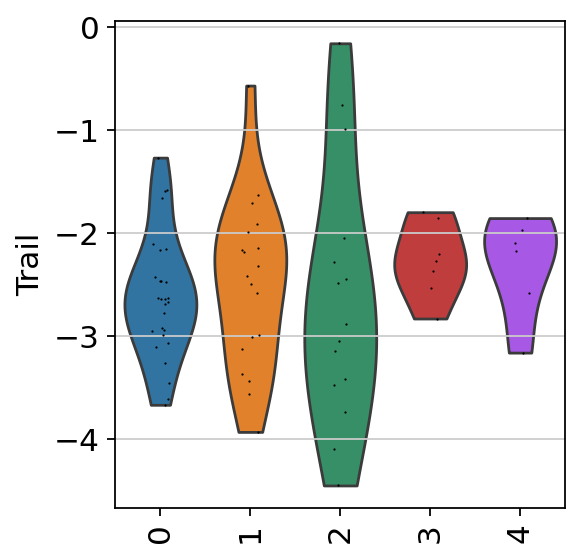

In [ ]:
sc.pl.violin(acts, keys=['Trail'], groupby='leiden', rotation=90)

In [ ]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

# Rename
msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

msigdb

,genesymbol,collection,geneset
233,MAFF,hallmark,IL2_STAT5_SIGNALING
250,MAFF,hallmark,COAGULATION
270,MAFF,hallmark,HYPOXIA
373,MAFF,hallmark,TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,COMPLEMENT
...,...,...,...
1449668,STXBP1,hallmark,PANCREAS_BETA_CELLS
1450315,ELP4,hallmark,PANCREAS_BETA_CELLS
1450526,GCG,hallmark,PANCREAS_BETA_CELLS
1450731,PCSK2,hallmark,PANCREAS_BETA_CELLS


### Enrichment with Over Representation Analysis (ORA)

To infer functional enrichment scores we will run the Over Representation Analysis (`ora`) method.
As input data it accepts an expression matrix (`decoupler.run_ora`) or the results of differential expression analysis (`decoupler.run_ora_df`).
For the former, by default the top 5% of expressed genes by sample are selected as the set of interest (S*), and for the latter a user-defined
significance filtering can be used.
Once we have S*, it builds a contingency table using set operations for each set stored in the gene set resource being used (`net`).
Using the contingency table, `ora` performs a one-sided Fisher exact test to test for significance of overlap between sets.
The final score is obtained by log-transforming the obtained p-values, meaning that higher values are more significant.

<img src="../ora.png" />
     
We can run `ora` with a simple one-liner:

In [ ]:
# Infer enrichment with ora using significant deg
top_genes = results_df[results_df['padj'] < 0.05]

# Run ora
enr_pvals = dc.get_ora_df(
    df=top_genes,
    net=msigdb,
    source='geneset',
    target='genesymbol'
)

enr_pvals.head()


NameError: name 'results_df' is not defined

Then we can visualize the most enriched terms:

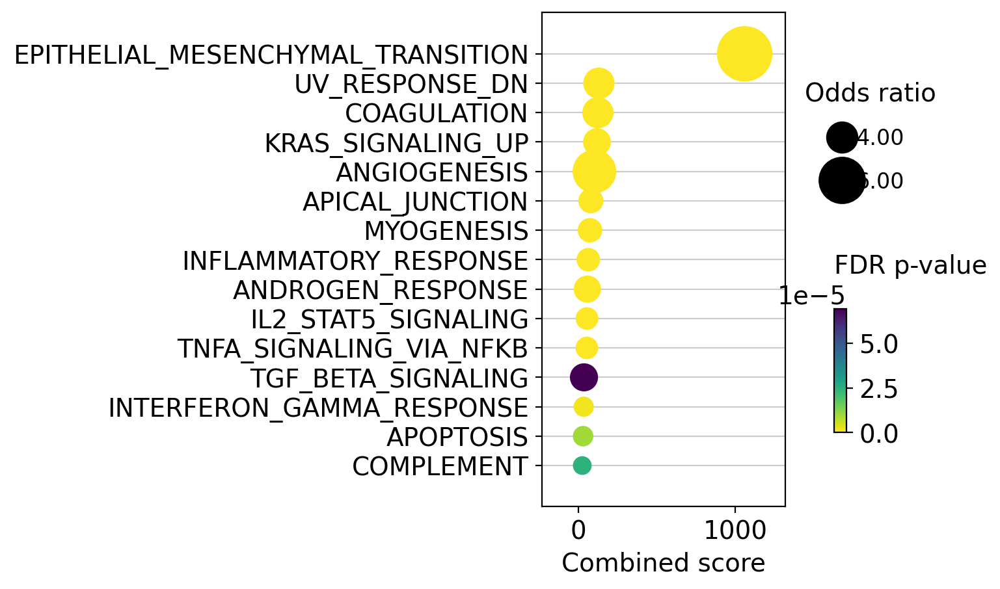

In [ ]:
dc.plot_dotplot(
    enr_pvals.sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

TNFa and interferons response (JAK-STAT) processes seem to be enriched. We previously observed a similar result with the PROGENy pathways, were they were significantly downregulated. Therefore, one of the limitations of using a prior knowledge resource without weights is that it doesn't provide direction.

We can also plot the running score for a given gene set:

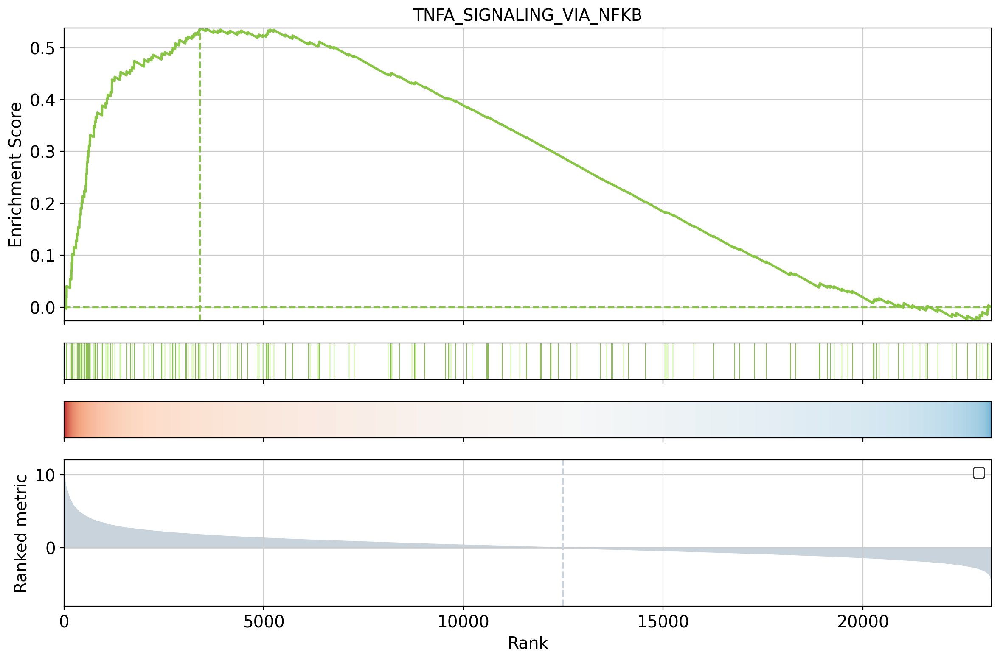

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_running_score(
		df=results_df,
		stat='stat',
		net=msigdb,
		source='geneset',
		target='genesymbol',
		set_name='TNFA_SIGNALING_VIA_NFKB'
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

## Enrichment of ligand-receptor interactions

Recently, study of interactions between ligands and receptors have gained significant traction, notably pushed by the democratization of single cell sequencing technologies. While most methods (such as the one described in LIANA) are developed for single cell datasets, they rely on a relatively simple assumption of co-expression or co-regulation of two (or more in the context of complexes) genes acting as ligand and receptors to propose hypothetical ligand-receptor interaction events. This concept can seamlessly be applied to a bulk RNA dataset, where the assumption is that sender and receiver cells are convoluted in a single dataset, but the observation of significant co-regulation of ligand and receptors should still correspond to hypothetical ligand-receptor interaction events.

At the core, most current ligand-receptor interaction methods rely on averaging the measurements obtained for ligand and receptor and standardizing them against a background distribution.  Thus, an enrichment method based on a weighted mean can emulate this, where the sets are simply the members of a ligand receptor pair (or more in the context of complexes).

Thus, we can extract ligand-receptor interaction ressources from the LIANA package (available both in [R](https://saezlab.github.io/liana/) and [python](https://liana-py.readthedocs.io/en/latest/)), and use it as a prior knowledge network with decoupler to find the most significant pairs of ligand-receptors in a given bulk dataset.

While more work is required to fully understand the functional relevance of the highlighted ligand-receptor interactions with such an approach, this represents a very straightforward and intuitive approach to embed a bulk RNA dataset with ligand-receptor interaction prior knowledge.


First, we extract ligand-receptor interactions from liana, and decomplexify them to format them into an appropriate decoupleR input.

In [ ]:

liana_lr = ln.resource.select_resource()
liana_lr = ln.resource.explode_complexes(liana_lr)

# Create two new DataFrames, each containing one of the pairs of columns to be concatenated
df1 = liana_lr[['interaction', 'ligand']]
df2 = liana_lr[['interaction', 'receptor']]

# Rename the columns in each new DataFrame
df1.columns = ['interaction', 'genes']
df2.columns = ['interaction', 'genes']

# Concatenate the two new DataFrames
liana_lr = pd.concat([df1, df2], axis=0)
liana_lr['weight'] = 1

# Find duplicated rows
duplicates = liana_lr.duplicated()

# Remove duplicated rows
liana_lr = liana_lr[~duplicates]

liana_lr

,interaction,genes,weight
0,LGALS9&PTPRC,LGALS9,1
1,LGALS9&MET,LGALS9,1
2,LGALS9&CD44,LGALS9,1
3,LGALS9&LRP1,LGALS9,1
4,LGALS9&CD47,LGALS9,1
...,...,...,...
5775,BMP2&ACTR2,ACTR2,1
5776,BMP15&ACTR2,ACTR2,1
5777,CSF1&CSF3R,CSF3R,1
5778,IL36G&IFNAR1,IFNAR1,1


Then we can use `ulm` to find the significant co-regulated pairs of ligand and receptors.

In [ ]:
mat

,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ENSG00000291275,ENSG00000291276,ANKRD20A11P-1,ENSG00000291282,ENSG00000291283,ENSG00000291288,ENSG00000291290,ENSG00000291299,ENSG00000291313,TMEM276
Lung.vs.LymphNode,0.510409,-3.350035,-0.723524,1.011882,2.334571,3.566941,1.592982,0.769151,2.009626,0.492182,...,-1.499804,-2.070219,0.400443,1.448278,-1.255188,-2.385142,-2.100072,0.026996,-0.751064,0.276315


In [ ]:
# Infer lr activities with ulm
lr_score, lr_pvalue = dc.run_ulm(
    mat=mat,
    net=liana_lr,
    source='interaction',
    target='genes',
    min_n=2,
    verbose=True
)

Running ulm on mat with 1 samples and 23219 targets for 3082 sources.


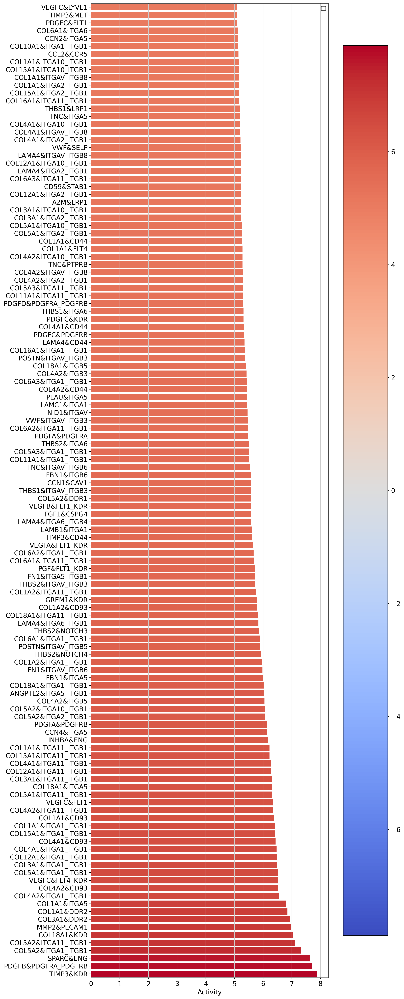

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(acts=lr_score, contrast='Lung.vs.LymphNode', top=125, vertical=True,figsize=(12,30))
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 30)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


Interactions between colagens and the ITG_ITG complexes seems to be quite enrichned. That is especially relevant since the EMT pathway was significantly enriched in the functional pathway analysis.

# SCLC Subtypes

In [43]:

# Usage
regress_out_variable(adata, "Organ", input_layer="normalized_counts", output_layer="lognorm_counts_regressed_out_organ")
#regress_out_var_mean(adata)

clinical_data = adata.obs
expression_data = pd.DataFrame(data=adata.X, columns=adata.var_names, index=adata.obs_names)
# Concatenate clinical data with expressiond ata on index
merged_data = pd.concat([clinical_data, expression_data], axis=1)

subset_expression_data = expression_data[marker_genes].copy()

adata.X = adata.layers["raw_counts"].copy()


Variable 'Organ' has been regressed out. Results stored in layer 'lognorm_counts_regressed_out_organ'.


/tmp/ipykernel_4007427/172847455.py:13: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
/mnt/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide


## Existing subtypes

#### Using the 1300 discovery gene set from article: https://ars.els-cdn.com/content/image/1-s2.0-S1535610820306620-mmc3.pdf

This is in contrast to Gay et al., where NMF was utilized to identify subtypes using a discovery set of 81 LS-SCLC samples20 and samples in IMpower133 were subsequently assigned to these specific subtypes using a hierarchical clustering approach of 1,300 variable genes identified in the discovery set.


In [33]:

# Read markers
new_markers = pd.read_excel(r"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/1-s2.0-S1535610820306620-mmc2.xlsx", header=1)
markers_list = [gene.upper() for gene in new_markers["Unnamed: 0"].tolist()]
markers_list.append("YAP1")
adata.X = adata.layers["raw_counts"].copy()
adata_subset = adata[:, [gene for gene in markers_list if gene in adata.var_names]].copy()
counts_file = "./temp_counts.txt"
# Save the counts to a file
pd.DataFrame(adata_subset.X, index=adata_subset.obs_names, columns=adata_subset.var_names).to_csv(counts_file, sep='\t')


In [34]:
highlight_dict = {
    "NE": ["ASCL1", "NEUROD1", "INSM1", "DLL3", "CHGA"],
    "nonNE": ["REST", "MYC", "POU2F3", "YAP1", "B2M"],
    "RR": ["JUN", "STAT1", "ABL1"],
    "RS": ["AR", "PRKCB", "RELA", "SUMO1", "PAK2", "IRF1", "HDAC1"],
    "APM": ['HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2', 'TAPBP']
}

##### Automated run

In [45]:
def run_cnmf_analysis(adata, organ_filter, output_dir, k=None,ngenes=300, run_deg=False):
    # Filter data if organ_filter is specified
    if organ_filter:
        adata_subset = adata[adata.obs["Organ"] == organ_filter].copy()
    else:
        adata_subset = adata.copy()
    
    print(adata_subset.shape)
    adata_subset.X = adata_subset.layers["raw_counts"].copy()

    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    counts_file = os.path.join(output_dir, "temp_counts.txt")

    # Save the counts to a file
    pd.DataFrame(adata_subset.X, index=adata_subset.obs_names, columns=adata_subset.var_names).to_csv(counts_file, sep='\t')

    # Prepare the data for cNMF
    cnmf_obj = cNMF(output_dir=output_dir, name="bulk_rna_analysis")
    cnmf_obj.prepare(counts_fn=counts_file, components=[k], n_iter=150)

    # Run the factorization
    cnmf_obj.factorize(worker_i=0, total_workers=1)

    # Combine the results
    cnmf_obj.combine()

    # Generate the k selection plot
    #cnmf_obj.k_selection_plot()

    cnmf_obj.consensus(k=k, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
    usage_matrix, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=k, density_threshold=0.1)

    adata_subset.obs = pd.merge(left=adata_subset.obs, right=usage_matrix, how='left', left_index=True, right_index=True)

    top_genes = []
    for gep in gep_scores.columns:
        top_genes.append(list(gep_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
    top_genes = pd.DataFrame(top_genes, index=gep_scores.columns).T

    for col in top_genes.columns:
        print([g for g in top_genes[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])

    adata_subset.obs['nmf-group'] = usage_matrix.idxmax(axis=1).astype(str)
    if run_deg:
        # DEG Analysis
        deg_output_dir = os.path.join(output_dir, "DEG_Analysis")
        print(deg_output_dir)
        deg_analysis = DEGAnalysis(adata_subset, design_factor='nmf-group', layer='raw_counts', output_dir=deg_output_dir)
        deg_analysis.create_dds()
        deg_analysis.run_comparisons()
        deg_analysis.create_clustermaps(marker_list=None)
        deg_analysis.save_results()
        deg_analysis.create_boxplots(["ASCL1", "NEUROD1", "POU2F3", "YAP1", "REST", "MYC"], 
                                    save_path="marker_boxplots.png")
        deg_analysis.create_volcano_grid(highlight_dict=highlight_dict)
        results_nmf = deg_analysis.get_results()

        return results_nmf, adata_subset
    else:
        return adata_subset




Running analysis for All_Organs
(82, 1037)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/cnmf/cnmf.py:550: UserWarning: 150 runs already appear completed. If this is unexpected, consider
            re-initializing the cnmf object with a different run name or output directory


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
['NEUROD1']
[]
['YAP1', 'POU2F3']
/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
... done in 0.32 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting LFCs...
... done in 0.25 seconds.

Refitting 13 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 2


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,0.179022,0.210652,0.849848,0.395409,0.737481
FTL,1389.787961,0.275624,0.257037,1.072310,0.283581,0.650604
HLA-B,1076.939918,0.066619,0.296153,0.224948,0.822019,0.953506
ANXA1,185.129179,0.921409,0.415972,2.215076,0.026755,0.186207
HLA-DRA,401.616686,-0.257160,0.344852,-0.745713,0.455841,0.769893
...,...,...,...,...,...,...
NDST4,56.259651,1.387130,0.470942,2.945439,0.003225,0.039813
SCN2A,1174.006728,1.905190,0.531852,3.582178,0.000341,0.008834
CNTNAP5,141.141928,-0.526887,0.707062,-0.745179,0.456164,0.769893


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 3


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-1.555490,0.234346,-6.637589,3.188545e-11,3.673913e-09
FTL,1389.787961,-1.500928,0.285984,-5.248302,1.535073e-07,3.386958e-06
HLA-B,1076.939918,-1.960273,0.329461,-5.949934,2.682507e-09,1.464084e-07
ANXA1,185.129179,0.038108,0.462098,0.082467,9.342756e-01,9.424551e-01
HLA-DRA,401.616686,-2.619970,0.383239,-6.836389,8.121442e-12,1.203134e-09
...,...,...,...,...,...,...
NDST4,56.259651,1.307526,0.523855,2.495968,1.256139e-02,2.554150e-02
SCN2A,1174.006728,2.196422,0.592225,3.708764,2.082738e-04,9.151693e-04
CNTNAP5,141.141928,0.375107,0.787535,0.476305,6.338573e-01,6.863330e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 4


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-0.970714,0.227344,-4.269805,1.956439e-05,7.592753e-05
FTL,1389.787961,-0.285211,0.277502,-1.027778,3.040543e-01,3.499493e-01
HLA-B,1076.939918,-1.308182,0.319602,-4.093164,4.255264e-05,1.451549e-04
ANXA1,185.129179,-1.859182,0.447511,-4.154491,3.260130e-05,1.157793e-04
HLA-DRA,401.616686,-1.533457,0.371948,-4.122769,3.743447e-05,1.297468e-04
...,...,...,...,...,...,...
NDST4,56.259651,1.708304,0.510831,3.344169,8.252936e-04,1.934852e-03
SCN2A,1174.006728,3.214795,0.574769,5.593196,2.229279e-08,1.942658e-07
CNTNAP5,141.141928,2.200261,0.766347,2.871102,4.090435e-03,7.884352e-03


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 3


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-1.734512,0.272697,-6.360593,2.009763e-10,6.947081e-08
FTL,1389.787961,-1.776552,0.332789,-5.338380,9.378074e-08,5.720625e-06
HLA-B,1076.939918,-2.026892,0.383368,-5.287070,1.242912e-07,6.444500e-06
ANXA1,185.129179,-0.883301,0.538151,-1.641363,1.007220e-01,1.569965e-01
HLA-DRA,401.616686,-2.362810,0.445894,-5.299035,1.164161e-07,6.353867e-06
...,...,...,...,...,...,...
NDST4,56.259651,-0.079604,0.610365,-0.130421,8.962334e-01,9.220179e-01
SCN2A,1174.006728,0.291233,0.689106,0.422624,6.725697e-01,7.318518e-01
CNTNAP5,141.141928,0.901994,0.916056,0.984649,3.247964e-01,4.019258e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 4


... done in 0.30 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-1.149737,0.266704,-4.310914,1.625809e-05,7.560376e-05
FTL,1389.787961,-0.560835,0.325529,-1.722840,8.491744e-02,1.198087e-01
HLA-B,1076.939918,-1.374801,0.374928,-3.666836,2.455699e-04,7.908571e-04
ANXA1,185.129179,-2.780591,0.525679,-5.289524,1.226351e-07,1.284572e-06
HLA-DRA,401.616686,-1.276297,0.436228,-2.925753,3.436234e-03,7.538837e-03
...,...,...,...,...,...,...
NDST4,56.259651,0.321174,0.599223,0.535984,5.919698e-01,6.369498e-01
SCN2A,1174.006728,1.309605,0.674163,1.942565,5.206870e-02,7.780294e-02
CNTNAP5,141.141928,2.727148,0.897906,3.037232,2.387616e-03,5.453651e-03


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs 4


... done in 0.29 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,0.584775,0.285787,2.046191,0.040738,0.133686
FTL,1389.787961,1.215717,0.348838,3.485053,0.000492,0.008403
HLA-B,1076.939918,0.652091,0.401758,1.623095,0.104569,0.241363
ANXA1,185.129179,-1.897289,0.562886,-3.370647,0.000750,0.010927
HLA-DRA,401.616686,1.086513,0.467167,2.325751,0.020032,0.083762
...,...,...,...,...,...,...
NDST4,56.259651,0.400778,0.641644,0.624612,0.532226,0.694579
SCN2A,1174.006728,1.018373,0.722744,1.409037,0.158824,0.321660
CNTNAP5,141.141928,1.825154,0.962554,1.896157,0.057939,0.167127


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.32 seconds.

Refitting 31 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs rest


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-0.869022,0.189404,-4.588203,4.470776e-06,0.000064
FTL,1389.787961,-0.620344,0.220759,-2.810047,4.953420e-03,0.012201
HLA-B,1076.939918,-1.199620,0.250139,-4.795816,1.620136e-06,0.000034
ANXA1,185.129179,-0.714523,0.350860,-2.036490,4.170118e-02,0.069080
HLA-DRA,401.616686,-1.670797,0.289659,-5.768160,8.014175e-09,0.000001
...,...,...,...,...,...,...
NDST4,56.259651,1.455590,0.350899,4.148171,3.351427e-05,0.000248
SCN2A,1174.006728,2.306105,0.402579,5.728336,1.014206e-08,0.000001
CNTNAP5,141.141928,0.222475,0.546479,0.407106,6.839302e-01,0.738787


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.27 seconds.

Fitting LFCs...
... done in 0.24 seconds.

Refitting 21 outliers.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs rest


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,-0.803751,0.252513,-3.183015,0.001458,0.014674
FTL,1389.787961,-0.736056,0.280144,-2.627420,0.008603,0.040188
HLA-B,1076.939918,-0.927919,0.338184,-2.743829,0.006073,0.031805
ANXA1,185.129179,-1.519410,0.432715,-3.511342,0.000446,0.006512
HLA-DRA,401.616686,-0.950629,0.407185,-2.334638,0.019562,0.067173
...,...,...,...,...,...,...
NDST4,56.259651,-0.981255,0.471156,-2.082652,0.037283,0.103564
SCN2A,1174.006728,-1.353211,0.556064,-2.433551,0.014952,0.057213
CNTNAP5,141.141928,0.841324,0.664381,1.266328,0.205396,0.337018


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.23 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting LFCs...
... done in 0.25 seconds.

Refitting 22 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs rest


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,1.351920,0.251543,5.374515,7.678918e-08,0.000004
FTL,1389.787961,1.499727,0.274707,5.459371,4.778242e-08,0.000003
HLA-B,1076.939918,1.622382,0.345642,4.693822,2.681474e-06,0.000070
ANXA1,185.129179,-0.503004,0.503925,-0.998174,3.181950e-01,0.415689
HLA-DRA,401.616686,2.138006,0.397998,5.371908,7.790779e-08,0.000004
...,...,...,...,...,...,...
NDST4,56.259651,-0.852683,0.531530,-1.604204,1.086692e-01,0.182642
SCN2A,1174.006728,-1.611481,0.622850,-2.587272,9.673907e-03,0.029680
CNTNAP5,141.141928,-0.309463,0.751207,-0.411954,6.803731e-01,0.748988


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting LFCs...
... done in 0.23 seconds.

Refitting 17 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 4 vs rest


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1844.279939,0.580855,0.279255,2.080018,3.752390e-02,6.617736e-02
FTL,1389.787961,-0.068829,0.313686,-0.219419,8.263239e-01,8.603393e-01
HLA-B,1076.939918,0.730337,0.369922,1.974303,4.834733e-02,8.221165e-02
ANXA1,185.129179,2.034243,0.431591,4.713357,2.436684e-06,1.443909e-05
HLA-DRA,401.616686,0.576594,0.446574,1.291150,1.966518e-01,2.737288e-01
...,...,...,...,...,...,...
NDST4,56.259651,-1.298148,0.509254,-2.549119,1.079955e-02,2.280882e-02
SCN2A,1174.006728,-2.687865,0.582800,-4.611982,3.988475e-06,2.232905e-05
CNTNAP5,141.141928,-2.287654,0.703737,-3.250723,1.151119e-03,3.325099e-03


Error creating clustermap for 1_vs_rest: 'rest'
Error creating clustermap for 2_vs_rest: 'rest'
Error creating clustermap for 3_vs_rest: 'rest'


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Error creating clustermap for 4_vs_rest: 'rest'
Saved results for 1_vs_2 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_1_vs_2.csv
Saved results for 1_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_1_vs_3.csv
Saved results for 1_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_1_vs_4.csv
Saved results for 2_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_2_vs_3.csv
Saved results for 2_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_2_vs_4.csv
Saved results for 3_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/All_Organs/DEG_Analysis/deg_results_3_vs_4.csv
Saved results for 1_vs_rest to /mnt/work/RO_src/STAnalysis/notebooks/d

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

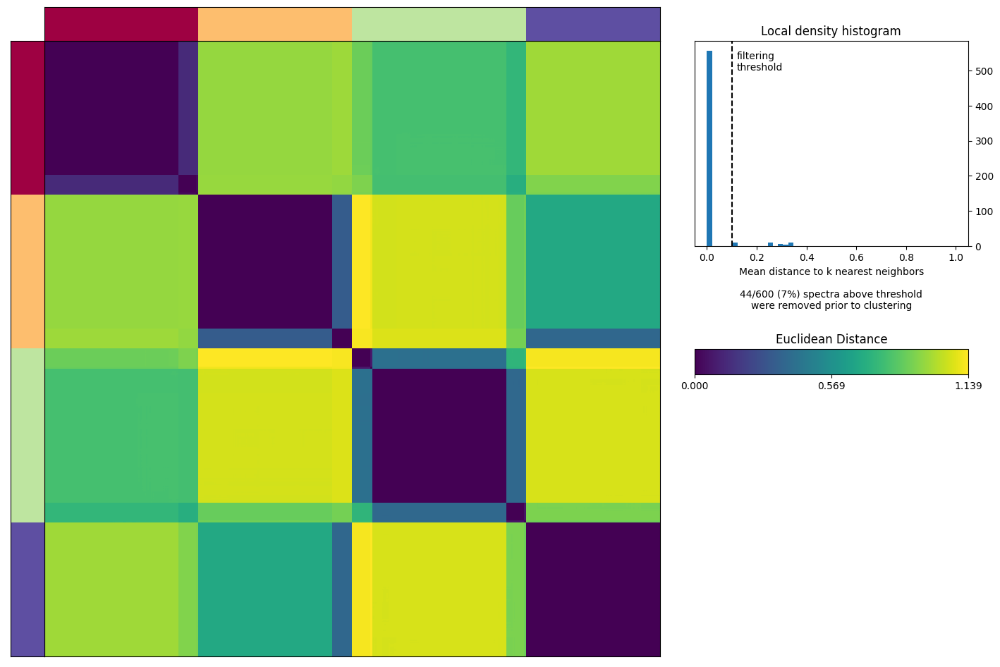

<Figure size 3000x2640 with 0 Axes>

<Figure size 3000x9440 with 0 Axes>

<Figure size 3000x11560 with 0 Axes>

<Figure size 3000x9760 with 0 Axes>

<Figure size 3000x11760 with 0 Axes>

<Figure size 3000x4460 with 0 Axes>

<Figure size 3000x6300 with 0 Axes>

<Figure size 3000x4820 with 0 Axes>

<Figure size 3000x6500 with 0 Axes>

<Figure size 3000x9500 with 0 Axes>

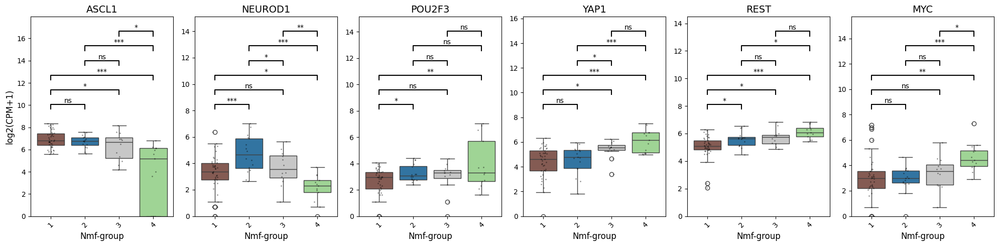

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


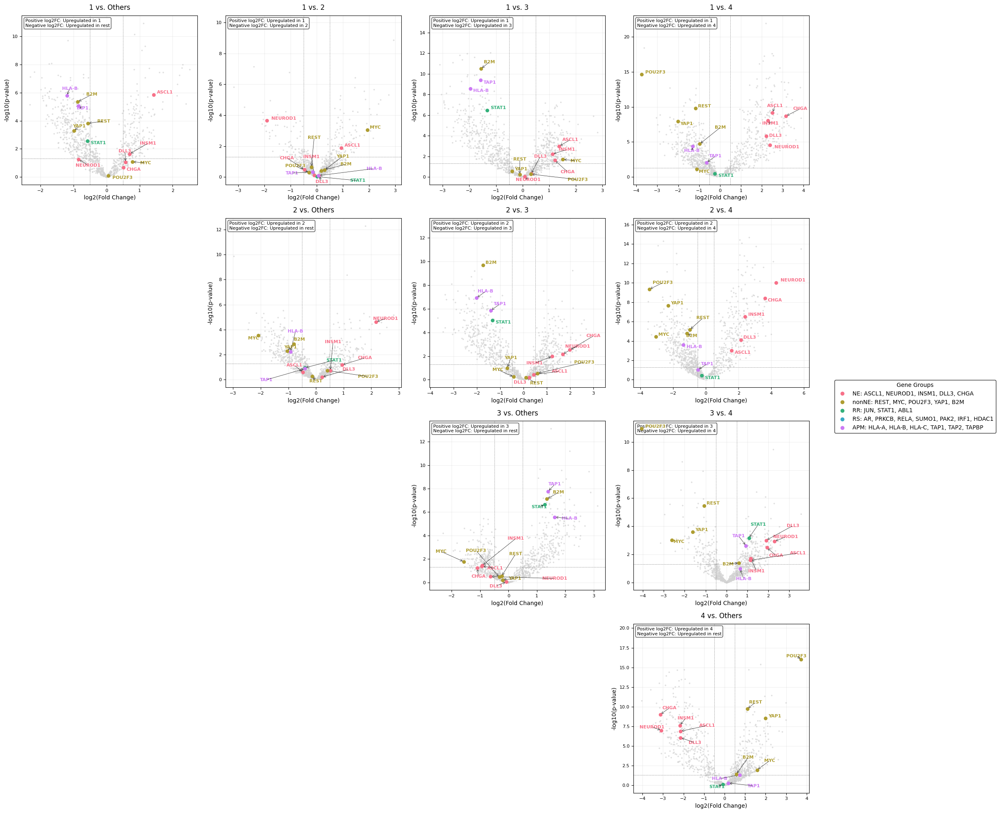

Running analysis for Lung
(66, 1037)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
['YAP1']
['NEUROD1']
[]
/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting dispersion trend curve...
... done in 0.50 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting LFCs...
... done in 0.32 seconds.

Refitting 20 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 2


... done in 0.33 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-0.955418,0.211505,-4.517235,6.265239e-06,3.216363e-05
FTL,1482.129614,-0.177770,0.294086,-0.604482,5.455232e-01,5.905089e-01
HLA-B,1205.292769,-1.099231,0.295989,-3.713757,2.042050e-04,6.495722e-04
ANXA1,198.768580,-1.976129,0.438069,-4.511000,6.452273e-06,3.279906e-05
HLA-DRA,471.564126,-1.457029,0.337279,-4.319947,1.560670e-05,6.981278e-05
...,...,...,...,...,...,...
NDST4,62.115110,1.925098,0.544603,3.534864,4.079853e-04,1.165512e-03
SCN2A,1259.217367,3.242479,0.607369,5.338564,9.368577e-08,8.448012e-07
CNTNAP5,144.609694,2.238709,0.854750,2.619140,8.815173e-03,1.612228e-02


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 3


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-0.301197,0.188309,-1.599487,0.109712,0.399199
FTL,1482.129614,0.147442,0.261760,0.563272,0.573249,0.845604
HLA-B,1205.292769,-0.195496,0.263564,-0.741741,0.458244,0.768170
ANXA1,198.768580,0.311505,0.391181,0.796320,0.425846,0.747429
HLA-DRA,471.564126,-0.715679,0.300464,-2.381914,0.017223,0.142185
...,...,...,...,...,...,...
NDST4,62.115110,1.429393,0.482633,2.961658,0.003060,0.047511
SCN2A,1259.217367,1.576049,0.540091,2.918118,0.003522,0.051137
CNTNAP5,144.609694,0.028259,0.758566,0.037253,0.970283,0.995625


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 4


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-1.680754,0.245955,-6.833586,8.281808e-12,2.862745e-09
FTL,1482.129614,-1.505684,0.341953,-4.403184,1.066736e-05,1.128781e-04
HLA-B,1205.292769,-2.065881,0.344194,-6.002084,1.948011e-09,1.346725e-07
ANXA1,198.768580,-0.016536,0.510676,-0.032381,9.741684e-01,9.798377e-01
HLA-DRA,471.564126,-2.639955,0.391936,-6.735680,1.631650e-11,4.230054e-09
...,...,...,...,...,...,...
NDST4,62.115110,1.806657,0.632240,2.857549,4.269267e-03,1.141039e-02
SCN2A,1259.217367,2.114270,0.706195,2.993889,2.754461e-03,8.279351e-03
CNTNAP5,144.609694,0.196805,0.991682,0.198456,8.426884e-01,8.735699e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 3


... done in 0.32 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,0.654221,0.232311,2.816137,4.860492e-03,1.177647e-02
FTL,1482.129614,0.325212,0.323056,1.006673,3.140918e-01,4.021150e-01
HLA-B,1205.292769,0.903735,0.325127,2.779634,5.442011e-03,1.291388e-02
ANXA1,198.768580,2.287635,0.481618,4.749897,2.035201e-06,1.773532e-05
HLA-DRA,471.564126,0.741350,0.370294,2.002061,4.527820e-02,7.965254e-02
...,...,...,...,...,...,...
NDST4,62.115110,-0.495705,0.599082,-0.827442,4.079866e-01,4.948329e-01
SCN2A,1259.217367,-1.666430,0.667141,-2.497867,1.249429e-02,2.671460e-02
CNTNAP5,144.609694,-2.210450,0.938451,-2.355425,1.850155e-02,3.739982e-02


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 4


... done in 0.30 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-0.725336,0.281073,-2.580593,0.009863,0.069108
FTL,1482.129614,-1.327914,0.390869,-3.397334,0.000680,0.013988
HLA-B,1205.292769,-0.966650,0.393334,-2.457583,0.013988,0.083844
ANXA1,198.768580,1.959593,0.582858,3.362044,0.000774,0.014587
HLA-DRA,471.564126,-1.182926,0.447720,-2.642114,0.008239,0.062364
...,...,...,...,...,...,...
NDST4,62.115110,-0.118441,0.725046,-0.163357,0.870237,0.923791
SCN2A,1259.217367,-1.128209,0.807521,-1.397126,0.162376,0.363622
CNTNAP5,144.609694,-2.041904,1.135209,-1.798703,0.072066,0.227842


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs 4


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-1.379557,0.264061,-5.224394,1.747267e-07,0.000019
FTL,1482.129614,-1.653126,0.367166,-4.502394,6.719228e-06,0.000182
HLA-B,1205.292769,-1.870385,0.369551,-5.061240,4.165390e-07,0.000031
ANXA1,198.768580,-0.328041,0.548490,-0.598081,5.497859e-01,0.650089
HLA-DRA,471.564126,-1.924276,0.420683,-4.574177,4.780948e-06,0.000146
...,...,...,...,...,...,...
NDST4,62.115110,0.377264,0.679731,0.555020,5.788811e-01,0.673737
SCN2A,1259.217367,0.538221,0.758216,0.709851,4.777963e-01,0.580861
CNTNAP5,144.609694,0.168546,1.064672,0.158308,8.742142e-01,0.905655


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.35 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.34 seconds.

Refitting 19 outliers.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs rest


... done in 0.30 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-0.917134,0.181642,-5.049126,4.438359e-07,0.000020
FTL,1482.129614,-0.480976,0.242460,-1.983737,4.728515e-02,0.082411
HLA-B,1205.292769,-1.088334,0.248903,-4.372520,1.228206e-05,0.000174
ANXA1,198.768580,-0.898602,0.362514,-2.478810,1.318215e-02,0.029147
HLA-DRA,471.564126,-1.581535,0.275937,-5.731507,9.954219e-09,0.000002
...,...,...,...,...,...,...
NDST4,62.115110,1.653501,0.390203,4.237544,2.259785e-05,0.000258
SCN2A,1259.217367,2.069275,0.448187,4.616988,3.893489e-06,0.000081
CNTNAP5,144.609694,0.498432,0.628464,0.793094,4.277230e-01,0.497810


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.32 seconds.

Refitting 18 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs rest


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,0.470132,0.263510,1.784112,7.440540e-02,1.262822e-01
FTL,1482.129614,-0.134994,0.318592,-0.423722,6.717685e-01,7.434620e-01
HLA-B,1205.292769,0.497089,0.349517,1.422216,1.549635e-01,2.342524e-01
ANXA1,198.768580,2.064672,0.405208,5.095341,3.481143e-07,3.574203e-06
HLA-DRA,471.564126,0.473179,0.409964,1.154195,2.484201e-01,3.453239e-01
...,...,...,...,...,...,...
NDST4,62.115110,-1.401914,0.539833,-2.596940,9.405841e-03,2.221835e-02
SCN2A,1259.217367,-2.679436,0.595343,-4.500662,6.774230e-06,4.108115e-05
CNTNAP5,144.609694,-2.202164,0.783889,-2.809282,4.965217e-03,1.333920e-02


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting LFCs...
... done in 0.32 seconds.

Refitting 34 outliers.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs rest


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,-0.368054,0.234830,-1.567322,0.117039,0.267335
FTL,1482.129614,-0.561638,0.275444,-2.039032,0.041447,0.146691
HLA-B,1205.292769,-0.652739,0.305586,-2.136022,0.032678,0.131039
ANXA1,198.768580,-1.095425,0.412154,-2.657805,0.007865,0.061789
HLA-DRA,471.564126,-0.475118,0.362461,-1.310811,0.189921,0.357438
...,...,...,...,...,...,...
NDST4,62.115110,-0.921413,0.481100,-1.915220,0.055464,0.173243
SCN2A,1259.217367,-0.966381,0.552820,-1.748094,0.080448,0.213361
CNTNAP5,144.609694,0.318851,0.715354,0.445725,0.655796,0.783947


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting LFCs...
... done in 0.24 seconds.

Refitting 18 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 4 vs rest


... done in 0.29 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,2125.399027,1.344689,0.264766,5.078779,3.798688e-07,0.000028
FTL,1482.129614,1.507620,0.322411,4.676079,2.924118e-06,0.000138
HLA-B,1205.292769,1.710974,0.355305,4.815511,1.468238e-06,0.000090
ANXA1,198.768580,-0.615815,0.568131,-1.083931,2.783954e-01,0.385294
HLA-DRA,471.564126,2.008372,0.414311,4.847494,1.250309e-06,0.000081
...,...,...,...,...,...,...
NDST4,62.115110,-1.215024,0.647108,-1.877622,6.043293e-02,0.128215
SCN2A,1259.217367,-1.425030,0.740695,-1.923908,5.436605e-02,0.119016
CNTNAP5,144.609694,0.069866,0.959738,0.072797,9.419674e-01,0.954866


Error creating clustermap for 1_vs_rest: 'rest'
Error creating clustermap for 2_vs_rest: 'rest'
Error creating clustermap for 3_vs_rest: 'rest'


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Error creating clustermap for 4_vs_rest: 'rest'
Saved results for 1_vs_2 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_1_vs_2.csv
Saved results for 1_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_1_vs_3.csv
Saved results for 1_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_1_vs_4.csv
Saved results for 2_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_2_vs_3.csv
Saved results for 2_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_2_vs_4.csv
Saved results for 3_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lung/DEG_Analysis/deg_results_3_vs_4.csv
Saved results for 1_vs_rest to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lun

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

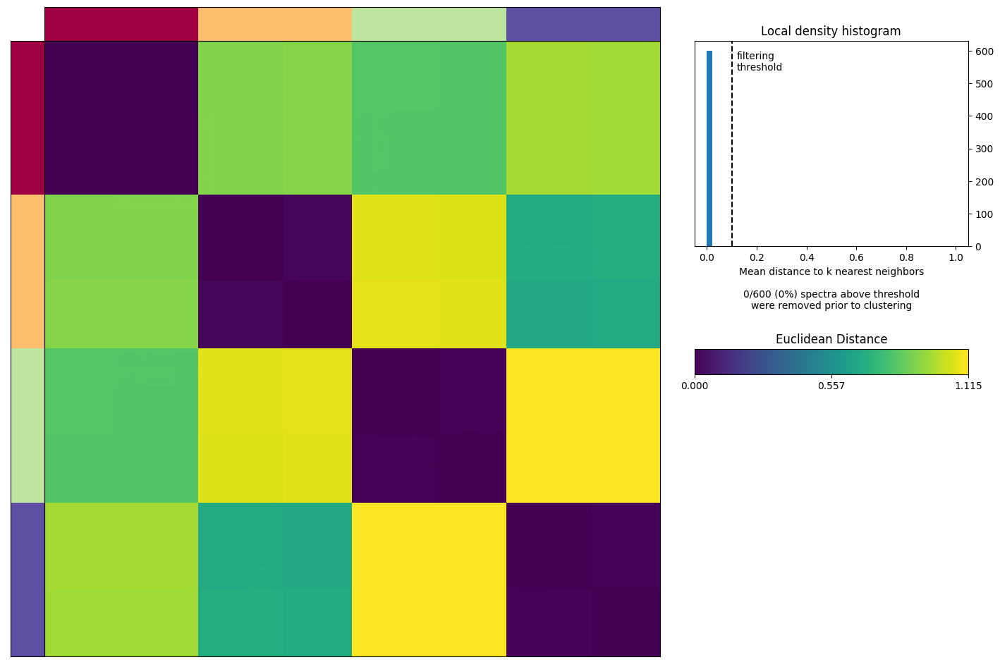

<Figure size 3000x11480 with 0 Axes>

<Figure size 3000x2520 with 0 Axes>

<Figure size 3000x10300 with 0 Axes>

<Figure size 3000x10240 with 0 Axes>

<Figure size 3000x3660 with 0 Axes>

<Figure size 3000x8620 with 0 Axes>

<Figure size 3000x6340 with 0 Axes>

<Figure size 3000x8780 with 0 Axes>

<Figure size 3000x2860 with 0 Axes>

<Figure size 3000x6660 with 0 Axes>

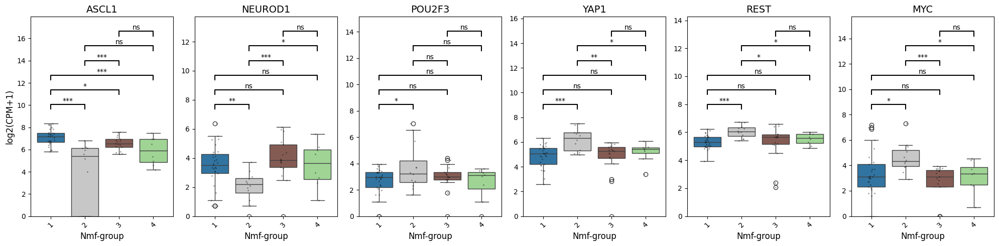

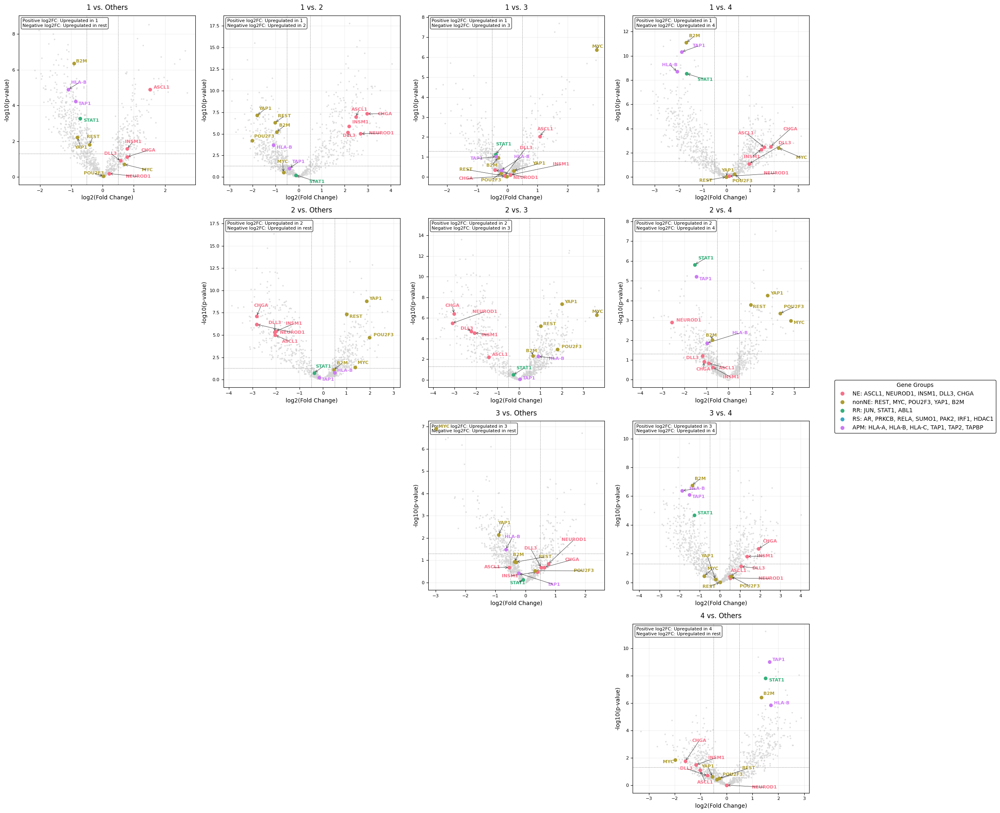

Running analysis for Lymph_Node
(16, 1037)
[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting task 33.
[Worker 0]. Starting task 34.
[Worker 0]. Starti

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
['NEUROD1']
['YAP1']
['POU2F3', 'YAP1']
/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.93 seconds.

Fitting LFCs...
... done in 0.33 seconds.

Refitting 181 outliers.

Fitting dispersions...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 2


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.095136,0.467255,-0.203607,0.838661,0.976489
FTL,733.717032,0.075497,0.407273,0.185373,0.852937,0.980735
HLA-B,599.855009,-0.247924,0.690520,-0.359039,0.719566,0.931423
ANXA1,90.965356,1.044273,0.868782,1.201996,0.229365,0.698959
HLA-DRA,84.949162,-0.739188,0.789810,-0.935906,0.349322,0.793745
...,...,...,...,...,...,...
NDST4,35.535725,0.534591,0.802731,0.665966,0.505433,0.857220
SCN2A,931.031084,2.504175,0.895456,2.796536,0.005165,0.117160
CNTNAP5,130.436859,-2.211131,0.825370,-2.678958,0.007385,0.141110


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 3


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-1.885213,0.932792,-2.021043,0.043275,0.299129
FTL,733.717032,-0.026346,0.812889,-0.032410,0.974145,0.995187
HLA-B,599.855009,-2.793969,1.378723,-2.026490,0.042715,0.299129
ANXA1,90.965356,1.018429,1.729859,0.588735,0.556039,0.857125
HLA-DRA,84.949162,0.083692,1.573362,0.053193,0.957578,0.984693
...,...,...,...,...,...,...
NDST4,35.535725,3.414774,1.625657,2.100550,0.035680,NaN
SCN2A,931.031084,5.782348,1.794427,3.222392,0.001271,0.049384
CNTNAP5,130.436859,7.598509,2.186156,3.475739,0.000509,0.025108


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 4


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.250841,0.933651,-0.268666,0.788186,0.914173
FTL,733.717032,-0.549809,0.813283,-0.676037,0.499017,0.737252
HLA-B,599.855009,-2.604458,1.378899,-1.888795,0.058919,0.205630
ANXA1,90.965356,-1.856461,1.727730,-1.074509,0.282595,0.557278
HLA-DRA,84.949162,0.786460,1.582732,0.496901,0.619259,0.818693
...,...,...,...,...,...,...
NDST4,35.535725,1.692523,1.617636,1.046295,0.295425,NaN
SCN2A,931.031084,7.481556,1.830654,4.086823,0.000044,0.000841
CNTNAP5,130.436859,6.198187,2.186157,2.835197,0.004580,0.029300


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 3


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-1.790077,0.932731,-1.919178,0.054962,0.325987
FTL,733.717032,-0.101843,0.812855,-0.125291,0.900293,0.965643
HLA-B,599.855009,-2.546045,1.378606,-1.846826,0.064772,0.329920
ANXA1,90.965356,-0.025843,1.730684,-0.014932,0.988086,0.994989
HLA-DRA,84.949162,0.822880,1.572472,0.523303,0.600763,0.841829
...,...,...,...,...,...,...
NDST4,35.535725,2.880183,1.626228,1.771082,0.076547,0.349648
SCN2A,931.031084,3.278174,1.794654,1.826633,0.067755,0.332773
CNTNAP5,130.436859,9.809640,2.184807,4.489934,0.000007,0.000841


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 4


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.155704,0.933590,-0.166780,0.867543,0.928619
FTL,733.717032,-0.625307,0.813249,-0.768900,0.441953,0.681249
HLA-B,599.855009,-2.356534,1.378782,-1.709142,0.087425,0.243042
ANXA1,90.965356,-2.900733,1.728556,-1.678125,0.093323,0.252395
HLA-DRA,84.949162,1.525648,1.581847,0.964472,0.334809,0.578564
...,...,...,...,...,...,...
NDST4,35.535725,1.157932,1.618209,0.715564,0.474261,NaN
SCN2A,931.031084,4.977382,1.830876,2.718580,0.006556,0.038245
CNTNAP5,130.436859,8.409319,2.184808,3.848996,0.000119,0.001506


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs 4


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,1.634372,1.234246,1.324186,0.185441,0.571105
FTL,733.717032,-0.523463,1.075310,-0.486802,0.626398,0.878120
HLA-B,599.855009,0.189511,1.823485,0.103928,0.917227,0.969849
ANXA1,90.965356,-2.874890,2.285943,-1.257638,0.208523,NaN
HLA-DRA,84.949162,0.702768,2.086603,0.336800,0.736268,NaN
...,...,...,...,...,...,...
NDST4,35.535725,-1.722251,2.148718,-0.801525,0.422828,NaN
SCN2A,931.031084,1.699208,2.402132,0.707375,0.479333,0.809499
CNTNAP5,130.436859,-1.400322,2.978495,-0.470144,0.638252,0.878120


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.28 seconds.

Refitting 28 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs rest


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.458306,0.486317,-0.942402,0.345987,0.761181
FTL,1021.805091,-0.781184,0.548167,-1.425085,0.154133,0.581222
HLA-B,599.855009,-1.245013,0.740396,-1.681549,0.092656,0.475445
ANXA1,133.490557,1.248724,0.920685,1.356299,0.175004,0.603497
HLA-DRA,143.792462,-1.599394,0.842683,-1.897978,0.057699,0.395123
...,...,...,...,...,...,...
NDST4,35.535725,0.785793,0.773108,1.016407,0.309436,0.714146
SCN2A,931.031084,2.839645,0.931472,3.048556,0.002299,0.059646
CNTNAP5,130.436859,-1.846724,1.030296,-1.792421,0.073066,0.430875


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.48 seconds.

Fitting MAP dispersions...
... done in 0.30 seconds.

Fitting LFCs...
... done in 0.27 seconds.

Refitting 28 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs rest


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.306645,0.491715,-0.623624,0.532875,0.845649
FTL,1021.805091,-0.888790,0.539100,-1.648655,0.099218,0.452684
HLA-B,599.855009,-0.906189,0.755130,-1.200044,0.230122,0.627998
ANXA1,133.490557,-2.036551,0.873920,-2.330363,0.019787,0.191311
HLA-DRA,143.792462,-0.587840,0.883043,-0.665698,0.505604,0.828133
...,...,...,...,...,...,...
NDST4,35.535725,-0.249057,0.795339,-0.313146,0.754170,0.922195
SCN2A,931.031084,-2.146470,0.991776,-2.164270,0.030444,0.240258
CNTNAP5,130.436859,2.572274,0.956796,2.688426,0.007179,0.115521


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting LFCs...
... done in 0.30 seconds.

Refitting 684 outliers.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.37 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs rest


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,1.822419,0.880513,2.069723,0.038478,0.218590
FTL,1021.805091,2.866694,0.771102,3.717658,0.000201,0.006711
HLA-B,599.855009,2.281154,1.486976,1.534089,0.125008,0.425186
ANXA1,133.490557,-1.601589,1.935168,-0.827623,0.407884,0.708978
HLA-DRA,143.792462,3.542815,1.519041,2.332270,0.019686,0.157946
...,...,...,...,...,...,...
NDST4,35.535725,-3.109594,1.549162,-2.007275,0.044720,NaN
SCN2A,931.031084,-4.917906,2.105260,-2.336009,0.019491,0.157946
CNTNAP5,130.436859,-8.993548,2.471276,-3.639232,0.000273,0.008112


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.27 seconds.

Fitting LFCs...
... done in 0.27 seconds.

Refitting 571 outliers.

Fitting dispersions...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.33 seconds.

Fitting LFCs...
... done in 0.31 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 4 vs rest


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,836.185273,-0.026546,1.010147,-0.026280,0.979034,0.988448
FTL,1021.805091,0.064897,1.162421,0.055829,0.955478,0.981239
HLA-B,599.855009,2.034852,1.492407,1.363470,0.172735,0.428919
ANXA1,61.426209,3.138984,1.309109,2.397802,0.016494,0.086216
HLA-DRA,143.792462,-1.955157,1.789100,-1.092816,0.274475,0.555754
...,...,...,...,...,...,...
NDST4,35.535725,-1.359996,1.618197,-0.840439,0.400662,0.671683
SCN2A,931.031084,-6.619276,2.055318,-3.220561,0.001279,0.014248
CNTNAP5,130.436859,-7.592741,2.480489,-3.060985,0.002206,0.022521


Error creating clustermap for 1_vs_rest: 'rest'
Error creating clustermap for 2_vs_rest: 'rest'
Error creating clustermap for 3_vs_rest: 'rest'


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Error creating clustermap for 4_vs_rest: 'rest'
Saved results for 1_vs_2 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_1_vs_2.csv
Saved results for 1_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_1_vs_3.csv
Saved results for 1_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_1_vs_4.csv
Saved results for 2_vs_3 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_2_vs_3.csv
Saved results for 2_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_2_vs_4.csv
Saved results for 3_vs_4 to /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/Lymph_Node/DEG_Analysis/deg_results_3_vs_4.csv
Saved results for 1_vs_rest to /mnt/work/RO_src/STAnalysis/notebooks/d

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scipy/stats/_stats_py.py:7030: RuntimeWarning: invalid value encountered in scalar divide
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats 

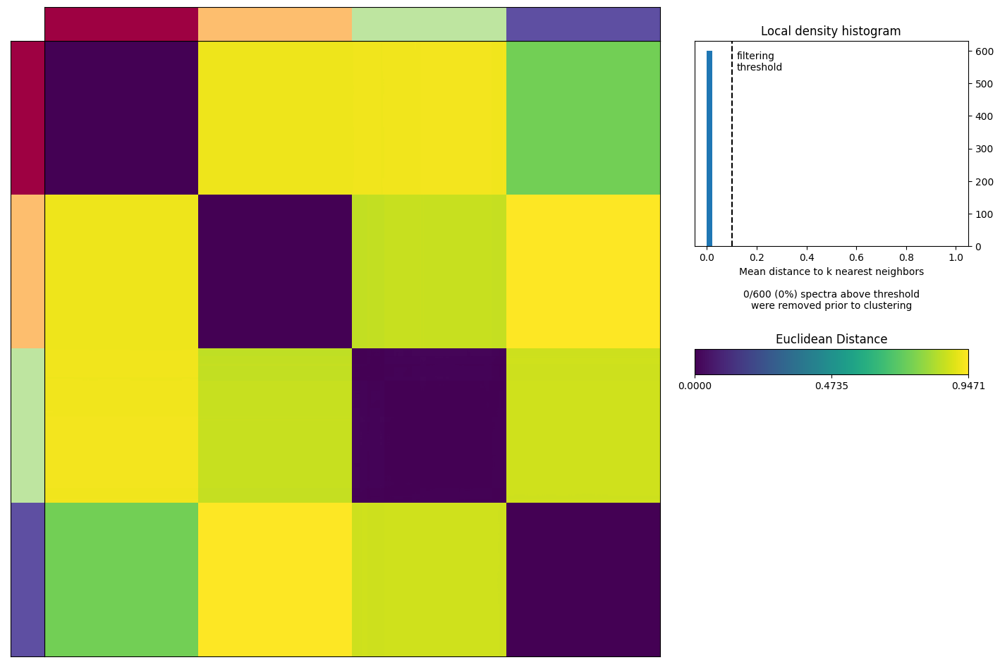

<Figure size 3000x2140 with 0 Axes>

<Figure size 3000x1900 with 0 Axes>

<Figure size 3000x3600 with 0 Axes>

<Figure size 3000x2160 with 0 Axes>

<Figure size 3000x3760 with 0 Axes>

<Figure size 3000x2200 with 0 Axes>

<Figure size 3000x2080 with 0 Axes>

<Figure size 3000x2120 with 0 Axes>

<Figure size 3000x2280 with 0 Axes>

<Figure size 3000x3760 with 0 Axes>

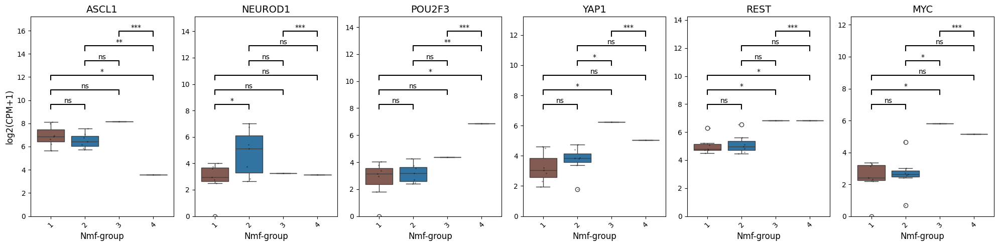

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

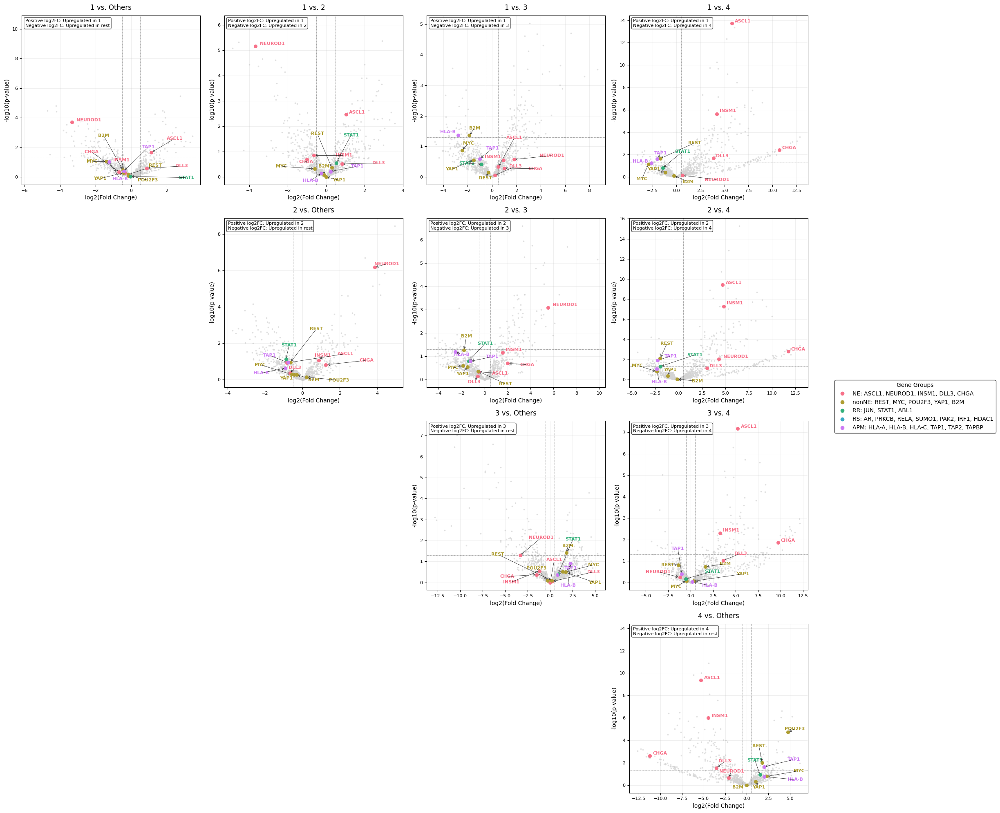

All analyses completed.


In [46]:


# Define analysis configurations
analyses = [
    ("All_Organs", None),
    ("Lung", "Lung"),
    ("Lymph_Node", "Lymph Node")
]

# Run analyses
for analysis_name, organ_filter in analyses:
    output_dir = f"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/{analysis_name}"
    print(f"Running analysis for {analysis_name}")
    results, analysis_adata = run_cnmf_analysis(adata_subset, organ_filter=organ_filter, output_dir=output_dir, k=4, run_deg=True)
    # Save results or perform additional operations if needed
    # For example:
    # analysis_adata.write_h5ad(os.path.join(output_dir, f"{analysis_name}_processed.h5ad"))

print("All analyses completed.")

##### Run RF model to test lymph node decomposition

Running analysis for All_Organs
(81, 1040)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/cnmf/cnmf.py:550: UserWarning: 150 runs already appear completed. If this is unexpected, consider
            re-initializing the cnmf object with a different run name or output directory


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
['NEUROD1']
[]
['YAP1', 'POU2F3']
Running analysis for Lung
(65, 1040)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/cnmf/cnmf.py:550: UserWarning: 150 runs already appear completed. If this is unexpected, consider
            re-initializing the cnmf object with a different run name or output directory


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting task 33.
[Worker 0]. Starting task 34.
[Worker 0]. Starting task 35.
[Worker 0]. Starting task 36.
[Worker 0]. Starting task 37.
[Worker 0]. Starting task 38.
[Worker 0]. Starting task 39.
[Worker 0]. Starting task 40.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 41.
[Worker 0]. Starting task 42.
[Worker 0]. Starting task 43.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 44.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 45.
[Worker 0]. Starting task 46.
[Worker 0]. Starting task 47.
[Worker 0]. Starting task 48.
[Worker 0]. Starting task 49.
[Worker 0]. Starting task 50.
[Worker 0]. Starting task 51.
[Worker 0]. Starting task 52.
[Worker 0]. Starting task 53.
[Worker 0]. Starting task 54.
[Worker 0]. Starting task 55.
[Worker 0]. Starting task 56.
[Worker 0]. Starting task 57.
[Worker 0]. Starting task 58.
[Worker 0]. Starting task 59.
[Worker 0]. Starting task 60.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 61.
[Worker 0]. Starting task 62.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 63.
[Worker 0]. Starting task 64.
[Worker 0]. Starting task 65.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 66.
[Worker 0]. Starting task 67.
[Worker 0]. Starting task 68.
[Worker 0]. Starting task 69.
[Worker 0]. Starting task 70.
[Worker 0]. Starting task 71.
[Worker 0]. Starting task 72.
[Worker 0]. Starting task 73.
[Worker 0]. Starting task 74.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 75.
[Worker 0]. Starting task 76.
[Worker 0]. Starting task 77.
[Worker 0]. Starting task 78.
[Worker 0]. Starting task 79.
[Worker 0]. Starting task 80.
[Worker 0]. Starting task 81.
[Worker 0]. Starting task 82.
[Worker 0]. Starting task 83.
[Worker 0]. Starting task 84.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 85.
[Worker 0]. Starting task 86.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 87.
[Worker 0]. Starting task 88.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 89.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 90.
[Worker 0]. Starting task 91.


KeyboardInterrupt: 

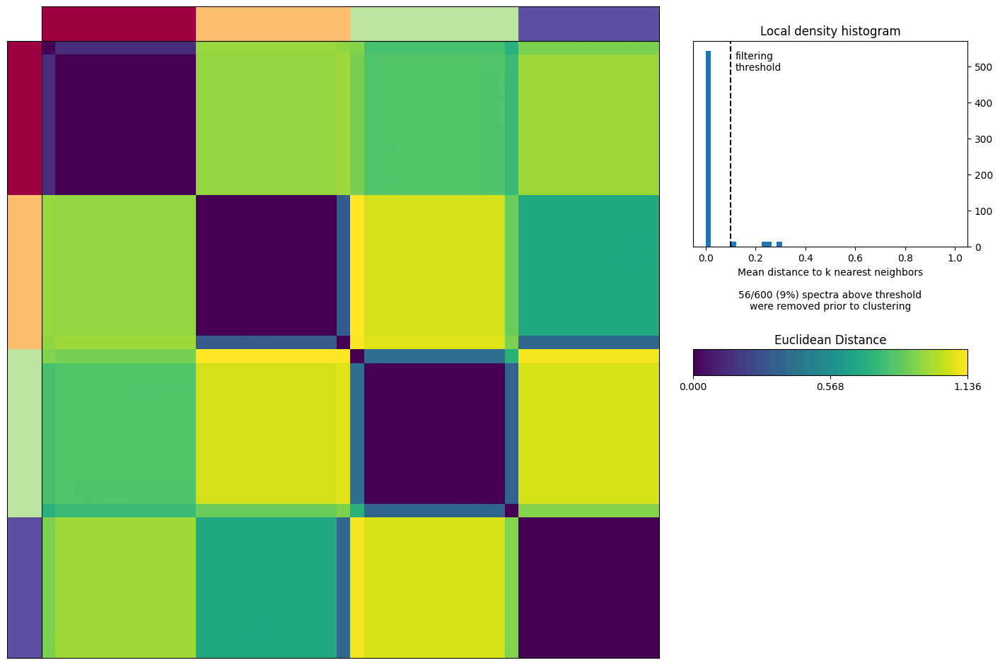

In [36]:


def run_cnmf_analysis(adata, organ_filter, output_dir, k=None, ngenes=300, run_deg=False):
    # Filter data if organ_filter is specified
    if organ_filter:
        adata_subset = adata[adata.obs["Organ"] == organ_filter].copy()
    else:
        adata_subset = adata.copy()
    
    print(adata_subset.shape)
    adata_subset.X = adata_subset.layers["raw_counts"].copy()

    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    counts_file = os.path.join(output_dir, "temp_counts.txt")

    # Save the counts to a file
    pd.DataFrame(adata_subset.X, index=adata_subset.obs_names, columns=adata_subset.var_names).to_csv(counts_file, sep='\t')

    # Prepare the data for cNMF
    cnmf_obj = cNMF(output_dir=output_dir, name="bulk_rna_analysis")
    cnmf_obj.prepare(counts_fn=counts_file, components=[k], n_iter=150)

    # Run the factorization
    cnmf_obj.factorize(worker_i=0, total_workers=1)

    # Combine the results
    cnmf_obj.combine()

    cnmf_obj.consensus(k=k, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
    usage_matrix, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=k, density_threshold=0.1)

    # Add the usage matrix to adata_subset.obs
    usage_prefix = f'nmf-group-{organ_filter if organ_filter else "all"}_'
    for col in usage_matrix.columns:
        adata_subset.obs[f'{usage_prefix}{col}'] = usage_matrix[col]

    top_genes = []
    for gep in gep_scores.columns:
        top_genes.append(list(gep_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
    top_genes = pd.DataFrame(top_genes, index=gep_scores.columns).T

    for col in top_genes.columns:
        print([g for g in top_genes[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])

    # Add the organ filter to the nmf-group column name
    group_col = f'nmf-group-{organ_filter if organ_filter else "all"}'
    adata_subset.obs[group_col] = usage_matrix.idxmax(axis=1).astype(str)

    if run_deg:
        # DEG Analysis
        deg_output_dir = os.path.join(output_dir, "DEG_Analysis")
        print(deg_output_dir)
        deg_analysis = DEGAnalysis(adata_subset, design_factor=group_col, layer='raw_counts', output_dir=deg_output_dir)
        deg_analysis.create_dds()
        deg_analysis.run_comparisons()
        deg_analysis.create_volcano_plots()
        deg_analysis.create_clustermaps(marker_list=None)
        deg_analysis.save_results()
        deg_analysis.create_boxplots(["ASCL1", "NEUROD1", "POU2F3", "YAP1", "REST", "MYC"], 
                                    save_path="marker_boxplots.png")
        deg_analysis.create_volcano_grid(highlight_dict=highlight_dict)
        results_nmf = deg_analysis.get_results()

        return results_nmf, adata_subset
    else:
        return adata_subset

def train_and_predict(adata_train, adata_test, train_organ, test_organ, model_type='RF'):
    # Get the usage matrix columns
    usage_cols_train = [str(col) for col in adata_train.obs.columns if str(col).startswith(f'nmf-group-{train_organ}_')]
    usage_cols_test = [str(col) for col in adata_test.obs.columns if str(col).startswith(f'nmf-group-{test_organ}_')]

    if not usage_cols_train:
        print(f"Warning: No columns found starting with 'nmf-group-{train_organ}_'")
        print("Available columns:", adata_train.obs.columns)
        return None
    
    X_train = adata_train.obs[usage_cols_train]
    y_train = adata_train.obs[f'nmf-group-{train_organ}']
    X_train.columns = X_train.columns.str.replace(f'{train_organ}_', '')

    X_test = adata_test.obs[usage_cols_test]
    X_test.columns = X_test.columns.str.replace(f'{test_organ}_', '')

    if model_type == 'RF':
        model = RandomForestClassifier(n_estimators=100, random_state=42)
    elif model_type == 'CatBoost':
        model = CatBoostClassifier(iterations=100, random_state=42, verbose=False)
    
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    
    return predictions

def compare_results(adata_all, adata_test, predictions, test_organ):
    # Subset adata_all for the test organ
    adata_all_subset = adata_all[adata_all.obs['Organ'] == test_organ]
    
    # Ensure the order of samples is the same in both AnnData objects
    adata_all_subset = adata_all_subset[adata_test.obs_names]
    
    true_labels = adata_all_subset.obs['nmf-group-all']
    cm = confusion_matrix(true_labels, predictions)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: All Organ lymph node vs {test_organ} Prediction with RF')
    plt.xlabel('Predicted')
    plt.ylabel('True (All Organs NMF)')
    plt.show()
    
    accuracy = np.sum(np.diag(cm)) / np.sum(cm)
    print(f"Accuracy: {accuracy:.2f}")

# Load your data (assuming adata_subset is already loaded)
# adata_subset = sc.read_h5ad("path_to_your_data.h5ad")

# Define analysis configurations
analyses = [
    ("All_Organs", None),
    ("Lung", "Lung"),
    ("Lymph_Node", "Lymph Node")
]

# Run analyses
adata_results = {}
for analysis_name, organ_filter in analyses:
    output_dir = f"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/{analysis_name}"
    print(f"Running analysis for {analysis_name}")
    analysis_adata = run_cnmf_analysis(adata_subset.copy(), organ_filter=organ_filter, output_dir=output_dir, k=4)
    
    # Save the results
    adata_results[analysis_name] = analysis_adata

# Train model on Lung data and predict Lymph Node distribution
lung_predictions_rf = train_and_predict(adata_results["Lung"], adata_results["Lymph_Node"], 'Lung', 'Lymph Node', model_type='RF')
lung_predictions_catboost = train_and_predict(adata_results["Lung"], adata_results["Lymph_Node"], 'Lung', 'Lymph Node', model_type='CatBoost')

# Compare results
if lung_predictions_rf is not None:
    print("Random Forest Results:")
    compare_results(adata_results["All_Organs"], adata_results["Lymph_Node"], lung_predictions_rf, 'Lymph Node')
else:
    print("Random Forest prediction failed due to missing columns.")

if lung_predictions_catboost is not None:
    print("\nCatBoost Results:")
    compare_results(adata_results["All_Organs"], adata_results["Lymph_Node"], lung_predictions_catboost, 'Lymph Node')
else:
    print("CatBoost prediction failed due to missing columns.")

print("All analyses completed.")



##### Individual Run

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/cnmf/cnmf.py:550: UserWarning: 900 runs already appear completed. If this is unexpected, consider
            re-initializing the cnmf object with a different run name or output directory


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

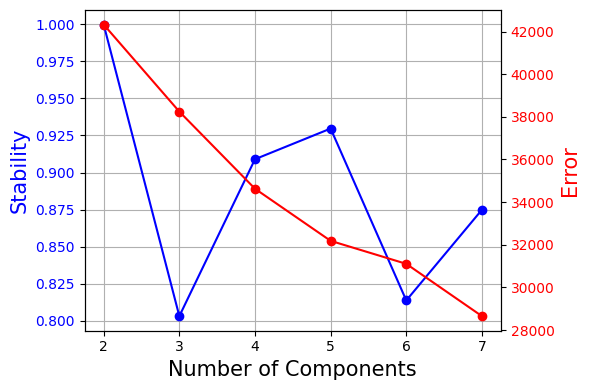

In [37]:
adata_subset.X = adata_subset.layers["raw_counts"].copy()
output_dir = f"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/{analysis_name}"

# Create output directory
os.makedirs(output_dir, exist_ok=True)
counts_file = os.path.join(output_dir, "temp_counts_discovery.txt")

# Save the counts to a file
pd.DataFrame(adata_subset.X, index=adata_subset.obs_names, columns=adata_subset.var_names).to_csv(counts_file, sep='\t')

# Prepare the data for cNMF
cnmf_obj = cNMF(output_dir="./cnmf_results_discovery", name="bulk_rna_analysis_discovery")
cnmf_obj.prepare(counts_fn=counts_file, components=range(2, 8), n_iter=150)

# Run the factorization
cnmf_obj.factorize(worker_i=0, total_workers=1)

# Combine the results
cnmf_obj.combine()

# Generate the k selection plot
cnmf_obj.k_selection_plot()


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


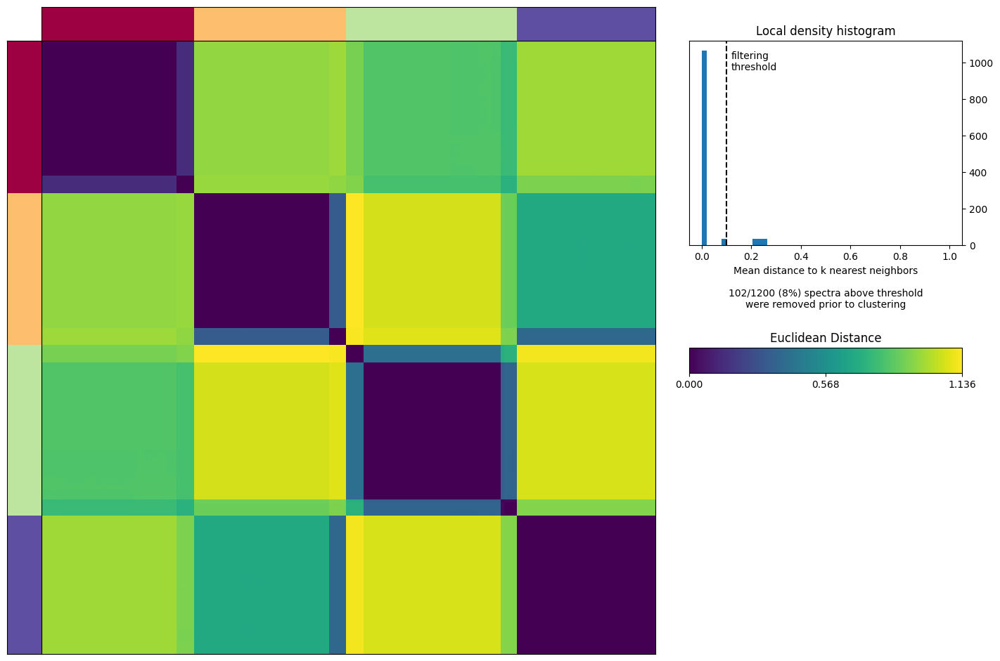

In [38]:
cnmf_obj.consensus(k=4, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)


In [39]:
usage_matrix, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=4, density_threshold=0.1)



In [40]:
adata_subset.obs = pd.merge(left=adata_subset.obs, right=usage_matrix, how='left', left_index=True, right_index=True)

In [41]:
top_genes = []
ngenes = 300
for gep in gep_scores.columns:
    top_genes.append(list(gep_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes = pd.DataFrame(top_genes, index=gep_scores.columns).T
top_genes

,1,2,3,4
0,SCN3A,CHRNA3,C1QC,AHNAK
1,PTPRN2,HUNK,C1QA,GANC
2,EXTL3,ST8SIA2,SLAMF7,YAP1
3,SYT1,SEMA6A,LAPTM5,AJUBA
4,ASCL1,TCP10L,GBP5,TFPI
...,...,...,...,...
295,GRM8,CCP110,IL7R,QPRT
296,DUSP2,ERCC6L,LSP1,TLR6
297,KHDC1,ACAA1,ZNF683,NAAA
298,E2F2,TNFSF14,PLCB2,GIMAP5


In [42]:
for col in top_genes.columns:
	print([g for g in top_genes[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])

['ASCL1']
['NEUROD1']
[]
['YAP1', 'POU2F3']


In [43]:
adata_subset.obs['nmf-group'] = usage_matrix.idxmax(axis=1).astype(str)


In [44]:
adata_subset.obs["nmf-group"].value_counts()

nmf-group
1    39
2    18
3    13
4    11
Name: count, dtype: int64

##### Hierarchical clustering for key signature genes

Number of genes to plot: 19


... storing 'gene_category' as categorical


Plotting heatmap...


/tmp/ipykernel_1549987/4030465746.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


<Figure size 1200x800 with 0 Axes>

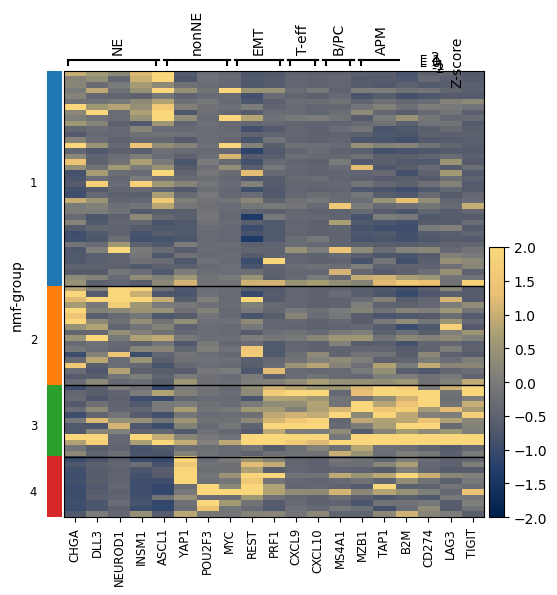

In [45]:


genes_to_plot = [
    'CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1',
    'YAP1', 'POU2F3', 'MYC', 'REST',
    'ZEB1', 'ZEB2', 'SNAI1', 'TWIST1',
    'CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21',
    'CD79A', 'MS4A1', 'MZB1', 'JCHAIN',
    'TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C',
    'PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT',"HES1"
]

genes_to_plot = [gene for gene in genes_to_plot if gene in adata_subset.var_names]
print(f"Number of genes to plot: {len(genes_to_plot)}")

gene_categories = {
    'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
    'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
}

adata_subset.var['gene_category'] = [
    next((cat for cat, genes in gene_categories.items() if gene in genes), 'Other')
    for gene in adata_subset.var_names
]

var_group_positions = []
start = 0
for category in ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']:
    genes_in_category = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    if genes_in_category:
        end = start + len(genes_in_category)
        var_group_positions.append((start, end))
        start = end

# Z-score normalization
adata_subset.layers['z_score'] = (adata_subset.X - adata_subset.X.mean(axis=0)) / adata_subset.X.std(axis=0)

# Convert 'nmf-group' to category dtype
adata_subset.obs['nmf-group'] = adata_subset.obs['nmf-group'].astype('category')

# Calculate average expression for each group
group_avg_expr = pd.DataFrame(
    adata_subset.layers['z_score'][:, [adata_subset.var_names.get_loc(gene) for gene in genes_to_plot]],
    columns=genes_to_plot,
    index=adata_subset.obs_names
)
group_avg_expr['nmf-group'] = adata_subset.obs['nmf-group']
group_avg_expr = group_avg_expr.groupby('nmf-group').mean()

# Sort cells within each group based on their correlation with the group average
new_order = []
for group in adata_subset.obs['nmf-group'].cat.categories:
    group_cells = adata_subset.obs_names[adata_subset.obs['nmf-group'] == group]
    group_expr = group_avg_expr.loc[group]
    correlations = group_cells.map(lambda cell: np.corrcoef(adata_subset[cell, genes_to_plot].layers['z_score'][0], group_expr)[0, 1])
    sorted_cells = group_cells[correlations.argsort()[::-1]]
    new_order.extend(sorted_cells)

# Reorder the AnnData object
adata_subset = adata_subset[new_order].copy()


print("Plotting heatmap...")

# Create a custom colormap similar to the image
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
n_bins = 100
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=n_bins)

# Create the figure with adjusted size
plt.figure(figsize=(12, 8))

# Plot the heatmap
sc.pl.heatmap(adata_subset, 
            var_names=genes_to_plot, 
            groupby='nmf-group',
            var_group_positions=var_group_positions,
            var_group_labels=['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt'],
            show_gene_labels=True,
            dendrogram=False,
            layer='z_score',
            cmap=cmap,
            vmin=-2, vmax=2,
            vcenter=0,
            show=False,
            )

# Get the current axes
ax = plt.gca()

# Add white lines between gene groups
for pos in var_group_positions[:-1]:  # Exclude the last position
    ax.axvline(x=pos[1], color='white', linewidth=2)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add grid for gene groups (optional)
ax.grid(False)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=-2, vmax=2))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Z-score', ticks=[-2, -1, 0, 1, 2])
cbar.ax.set_yticklabels(['-2', '-1', '0', '1', '2'])

plt.show()



/tmp/ipykernel_1549987/4057083202.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


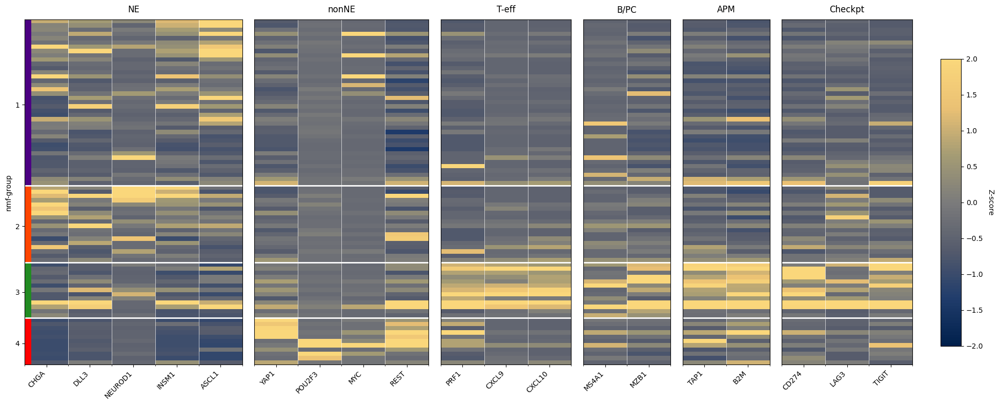

In [46]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import numpy as np

# Calculate dimensions needed for the plot
gene_groups = ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']
widths = []
genes_by_group = []

# Define colors for NMF groups
nmf_colors = ['#4B0082', '#FF4500', '#228B22', '#FF0000']  # Indigo, OrangeRed, ForestGreen, Red

for category in gene_groups:
    genes_in_cat = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    if genes_in_cat:  # Only add non-empty categories
        widths.append(len(genes_in_cat))
        genes_by_group.append((category, genes_in_cat))

# Create figure with gridspec
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, len(genes_by_group), width_ratios=widths)

# Create custom colormap
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=100)

# Get unique NMF groups and their sizes
unique_groups = sorted(adata_subset.obs['nmf-group'].unique())
group_sizes = [sum(adata_subset.obs['nmf-group'] == group) for group in unique_groups]
total_cells = sum(group_sizes)
group_boundaries = np.cumsum([0] + group_sizes)
group_centers = [(start + end) / 2 for start, end in zip(group_boundaries[:-1], group_boundaries[1:])]

# Plot each gene group
for idx, (category, genes) in enumerate(genes_by_group):
    ax = plt.subplot(gs[idx])
    
    # Get data for these genes
    gene_indices = [adata_subset.var_names.get_loc(gene) for gene in genes]
    data = adata_subset.layers['z_score'][:, gene_indices].toarray() if scipy.sparse.issparse(adata_subset.layers['z_score']) else adata_subset.layers['z_score'][:, gene_indices]
    
    # Create heatmap
    im = ax.imshow(data, aspect='auto', cmap=cmap, vmin=-2, vmax=2)
    
    # Set title
    ax.set_title(category, pad=10)
    
    # Set x-ticks (gene names)
    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=45, ha='right')
    
    # Add colored bars for NMF groups on the left
    if idx == 0:
        # Set y-ticks at the centers of each group
        ax.set_yticks(group_centers)
        ax.set_yticklabels(range(1, len(unique_groups) + 1))
        ax.set_ylabel('nmf-group')
        
        # Add colored bars on the left
        for i, (start, end) in enumerate(zip(group_boundaries[:-1], group_boundaries[1:])):
            ax.add_patch(plt.Rectangle((-0.5, start-0.5), 0.15, end-start, 
                                     facecolor=nmf_colors[i], clip_on=False))
    else:
        ax.set_yticks([])
    
    # Add horizontal lines between NMF groups
    for boundary in group_boundaries[1:-1]:
        ax.axhline(y=boundary-0.5, color='white', linewidth=2)
    
    # Add white grid lines
    ax.set_xticks(np.arange(-0.5, len(genes), 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5, axis='x')
    
    # Add borders between groups
    ax.spines['left'].set_visible(True)
    ax.spines['right'].set_visible(True)

# Add colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Z-score', rotation=270, labelpad=15)

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

In [47]:
adata_subset.obs.groupby("nmf-group")["Organ"].value_counts()

nmf-group  Organ     
1          Lung          31
           Lymph Node     8
2          Lung          12
           Lymph Node     6
3          Lung          12
           Lymph Node     1
4          Lung          10
           Lymph Node     1
Name: count, dtype: int64

##### Radial Plot

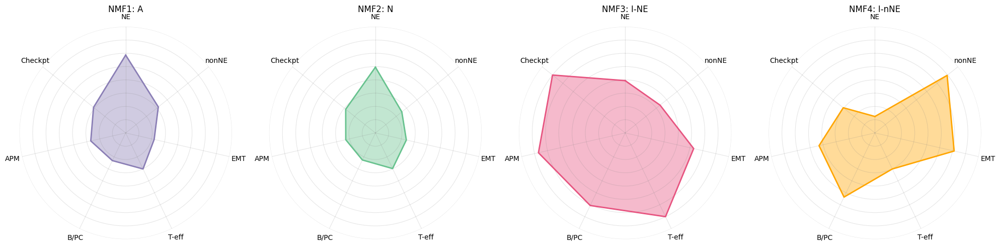


Normalized scores for each group:
           NE_score  nonNE_score  EMT_score  T-eff_score  B/PC_score  \
nmf-group                                                              
1              0.93        -0.43      -0.90        -0.49       -0.84   
2              0.48        -0.73      -0.81        -0.51       -0.87   
3             -0.03        -0.32       0.65         1.50        1.03   
4             -1.38         1.48       1.06        -0.49        0.68   

           APM_score  Checkpt_score  
nmf-group                            
1              -0.65          -0.45  
2              -0.85          -0.57  
3               1.35           1.50  
4               0.16          -0.48  


In [48]:
# Create a copy of adata_subset
adata_analysis_radial = adata_subset.copy()
adata_analysis_radial.obs = adata_analysis_radial.obs[[1,2,3,4,"nmf-group"]]
# Ensure we're working with raw counts
adata_analysis_radial.X = adata_analysis_radial.layers["raw_counts"].copy()

# Normalize, log-transform, and scale the data
sc.pp.normalize_total(adata_analysis_radial, target_sum=1e6)
sc.pp.log1p(adata_analysis_radial)
sc.pp.scale(adata_analysis_radial)

# Add gene categories
gene_categories = {
    'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
    'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
}

# Compute scores for each category
for category, genes in gene_categories.items():
    sc.tl.score_genes(adata_analysis_radial, genes, score_name=f'{category}_score')

# Calculate mean scores for each NMF group
nmf_scores = adata_analysis_radial.obs.groupby('nmf-group').mean()

# Normalize scores (Z-score across subsets)
score_columns = [f'{cat}_score' for cat in gene_categories.keys()]
nmf_scores_norm = (nmf_scores[score_columns] - nmf_scores[score_columns].mean()) / nmf_scores[score_columns].std()

# Define NMF labels
nmf_labels = {
    '1': 'A',
    '2': 'N',
    '3': 'I-NE',
    '4': 'I-nNE'
}

# Colors for each NMF group
colors = ['#8A7EB5', '#67C28E', '#E75480', '#FFA500']

# Plot radar charts
plt.figure(figsize=(20, 5))
for i, nmf_group in enumerate(sorted(nmf_scores_norm.index)):
    plt.subplot(1, 4, i+1, projection='polar')
    data = nmf_scores_norm.loc[nmf_group, score_columns].to_frame().T
    label = nmf_labels.get(nmf_group, nmf_group)
    
    N = len(gene_categories)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.gca()
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    
    plt.xticks(angles[:-1], gene_categories.keys(), size=10)
    
    # Set the limits but hide the scale
    plt.ylim(-2, 2)
    ax.set_yticklabels([])  # Hide scale numbers
    
    values = data.values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i])
    ax.fill(angles, values, color=colors[i], alpha=0.4)
    
    ax.grid(True, color='grey', alpha=0.2)
    ax.spines['polar'].set_visible(False)
    
    plt.title(f'NMF{nmf_group}: {label}', size=12, y=1.05)

plt.tight_layout()
plt.show()

# Print the actual values for verification
print("\nNormalized scores for each group:")
print(nmf_scores_norm.round(2))

##### DEG Analysis

/tmp/ipykernel_1549987/115626795.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
... done in 0.46 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting LFCs...
... done in 0.28 seconds.

Refitting 13 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 2


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,0.124136,0.206132,0.602216,0.547030,0.829317
FTL,1383.066584,0.335176,0.251817,1.331034,0.183178,0.530814
HLA-B,1069.722551,0.081931,0.288906,0.283590,0.776725,0.920039
ANXA1,175.454240,0.885477,0.403162,2.196331,0.028068,0.201317
HLA-DRA,390.922145,-0.405225,0.332514,-1.218671,0.222969,0.570803
...,...,...,...,...,...,...
NDST4,56.796491,1.271286,0.439113,2.895125,0.003790,0.044783
SCN2A,1183.233029,2.138019,0.487175,4.388607,0.000011,0.000624
CNTNAP5,142.285527,-0.362170,0.665202,-0.544451,0.586131,0.855088


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 3


... done in 0.32 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-1.518491,0.231474,-6.560088,5.377621e-11,5.710342e-09
FTL,1383.066584,-1.401722,0.282798,-4.956623,7.172885e-07,1.021890e-05
HLA-B,1069.722551,-1.901654,0.324408,-5.861921,4.575417e-09,2.265921e-07
ANXA1,175.454240,-0.020606,0.452037,-0.045584,9.636415e-01,9.701715e-01
HLA-DRA,390.922145,-2.622482,0.372998,-7.030815,2.053305e-12,5.338594e-10
...,...,...,...,...,...,...
NDST4,56.796491,1.053961,0.492618,2.139509,3.239449e-02,5.453993e-02
SCN2A,1183.233029,1.994026,0.547494,3.642097,2.704261e-04,1.098606e-03
CNTNAP5,142.285527,0.359821,0.747805,0.481170,6.303959e-01,6.822182e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs 4


... done in 0.23 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-0.991561,0.246816,-4.017410,5.884137e-05,2.185536e-04
FTL,1383.066584,-0.268455,0.301615,-0.890057,3.734351e-01,4.221441e-01
HLA-B,1069.722551,-1.344444,0.345888,-3.886937,1.015172e-04,3.495956e-04
ANXA1,175.454240,-1.800457,0.481177,-3.741778,1.827230e-04,5.811374e-04
HLA-DRA,390.922145,-1.454046,0.397894,-3.654359,2.578255e-04,7.727336e-04
...,...,...,...,...,...,...
NDST4,56.796491,2.152302,0.531574,4.048925,5.145347e-05,1.952979e-04
SCN2A,1183.233029,4.256548,0.584982,7.276379,3.428982e-13,1.485892e-11
CNTNAP5,142.285527,2.728690,0.801671,3.403754,6.646650e-04,1.790807e-03


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs 3


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-1.642627,0.263098,-6.243399,4.281635e-10,1.484300e-07
FTL,1383.066584,-1.736899,0.321451,-5.403307,6.542349e-08,4.252527e-06
HLA-B,1069.722551,-1.983585,0.368728,-5.379531,7.468024e-08,4.373844e-06
ANXA1,175.454240,-0.906083,0.514247,-1.761961,7.807589e-02,1.264781e-01
HLA-DRA,390.922145,-2.217257,0.423842,-5.231335,1.682905e-07,6.330773e-06
...,...,...,...,...,...,...
NDST4,56.796491,-0.217325,0.560848,-0.387494,6.983909e-01,7.480191e-01
SCN2A,1183.233029,-0.143993,0.622326,-0.231379,8.170208e-01,8.488527e-01
CNTNAP5,142.285527,0.721991,0.849698,0.849704,3.954898e-01,4.711448e-01


Running Wald tests...
... done in 0.26 seconds.



Log2 fold change & Wald test p-value: nmf-group 2 vs 4


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-1.115697,0.276692,-4.032270,5.524067e-05,2.344910e-04
FTL,1383.066584,-0.603631,0.338124,-1.785236,7.422312e-02,1.087212e-01
HLA-B,1069.722551,-1.426375,0.387761,-3.678493,2.346165e-04,8.079507e-04
ANXA1,175.454240,-2.685934,0.540040,-4.973582,6.572682e-07,6.049194e-06
HLA-DRA,390.922145,-1.048820,0.445907,-2.352105,1.866751e-02,3.301737e-02
...,...,...,...,...,...,...
NDST4,56.796491,0.881016,0.595356,1.479814,1.389229e-01,1.876362e-01
SCN2A,1183.233029,2.118529,0.655549,3.231688,1.230611e-03,3.265370e-03
CNTNAP5,142.285527,3.090860,0.897469,3.443976,5.732266e-04,1.698449e-03


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs 4


... done in 0.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,0.526930,0.296054,1.779841,0.075102,0.192768
FTL,1383.066584,1.133267,0.361789,3.132403,0.001734,0.016988
HLA-B,1069.722551,0.557210,0.414888,1.343037,0.179260,0.350151
ANXA1,175.454240,-1.779851,0.577444,-3.082292,0.002054,0.019203
HLA-DRA,390.922145,1.168437,0.476860,2.450273,0.014275,0.064079
...,...,...,...,...,...,...
NDST4,56.796491,1.098341,0.635847,1.727367,0.084102,0.207004
SCN2A,1183.233029,2.262522,0.701537,3.225093,0.001259,0.013948
CNTNAP5,142.285527,2.368869,0.960296,2.466811,0.013632,0.062015


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 0.39 seconds.

Fitting LFCs...
... done in 0.31 seconds.

Refitting 29 outliers.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 1 vs rest


... done in 0.31 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-0.848664,0.192594,-4.406498,1.050554e-05,1.400738e-04
FTL,1383.066584,-0.558877,0.225373,-2.479781,1.314631e-02,2.819003e-02
HLA-B,1069.722551,-1.154811,0.255961,-4.511675,6.431758e-06,9.980437e-05
ANXA1,175.454240,-0.543880,0.351347,-1.547984,1.216261e-01,1.754385e-01
HLA-DRA,390.922145,-1.674462,0.291277,-5.748694,8.993553e-09,7.794413e-07
...,...,...,...,...,...,...
NDST4,56.796491,1.374376,0.345311,3.980111,6.888320e-05,5.153851e-04
SCN2A,1183.233029,2.405337,0.394439,6.098120,1.073233e-09,2.790406e-07
CNTNAP5,142.285527,0.265945,0.523441,0.508070,6.114044e-01,6.776739e-01


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting LFCs...
... done in 0.24 seconds.

Refitting 21 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 2 vs rest


... done in 0.27 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,-0.763420,0.243058,-3.140894,0.001684,0.014972
FTL,1383.066584,-0.794290,0.268748,-2.955514,0.003121,0.021358
HLA-B,1069.722551,-0.956631,0.324477,-2.948224,0.003196,0.021725
ANXA1,175.454240,-1.408661,0.409172,-3.442712,0.000576,0.007514
HLA-DRA,390.922145,-0.838705,0.390421,-2.148206,0.031697,0.093651
...,...,...,...,...,...,...
NDST4,56.796491,-0.870681,0.440000,-1.978820,0.047836,0.120371
SCN2A,1183.233029,-1.581591,0.521546,-3.032504,0.002425,0.018146
CNTNAP5,142.285527,0.673204,0.625666,1.075980,0.281936,0.424129


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.25 seconds.

Refitting 23 outliers.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 3 vs rest


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,1.331953,0.243329,5.473873,4.403056e-08,2.543988e-06
FTL,1383.066584,1.433534,0.270332,5.302855,1.140055e-07,4.742630e-06
HLA-B,1069.722551,1.597795,0.336099,4.753938,1.994919e-06,5.060281e-05
ANXA1,175.454240,-0.335880,0.482592,-0.695992,4.864338e-01,5.671426e-01
HLA-DRA,390.922145,2.171008,0.377220,5.755289,8.649348e-09,8.619678e-07
...,...,...,...,...,...,...
NDST4,56.796491,-0.578178,0.503056,-1.149332,2.504192e-01,3.399948e-01
SCN2A,1183.233029,-1.354760,0.598568,-2.263335,2.361506e-02,5.385890e-02
CNTNAP5,142.285527,-0.267743,0.713370,-0.375322,7.074213e-01,7.631931e-01


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.40 seconds.

Fitting MAP dispersions...
... done in 0.37 seconds.

Fitting LFCs...
... done in 0.27 seconds.

Refitting 17 outliers.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group 4 vs rest


... done in 0.28 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
B2M,1826.419612,0.585370,0.301403,1.942151,5.211888e-02,9.066403e-02
FTL,1383.066584,-0.055557,0.338531,-0.164114,8.696418e-01,9.089723e-01
HLA-B,1069.722551,0.765055,0.399430,1.915365,5.544595e-02,9.484176e-02
ANXA1,175.454240,1.977513,0.464604,4.256342,2.077990e-05,1.097010e-04
HLA-DRA,390.922145,0.424037,0.480087,0.883251,3.771005e-01,4.747996e-01
...,...,...,...,...,...,...
NDST4,56.796491,-1.742836,0.527049,-3.306784,9.437370e-04,3.001488e-03
SCN2A,1183.233029,-3.662125,0.603620,-6.066939,1.303711e-09,3.153163e-08
CNTNAP5,142.285527,-2.774476,0.735835,-3.770512,1.629132e-04,6.644303e-04


/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight


Error creating clustermap for 1_vs_rest: 'rest'
Error creating clustermap for 2_vs_rest: 'rest'
Error creating clustermap for 3_vs_rest: 'rest'
Error creating clustermap for 4_vs_rest: 'rest'
Saved results for 1_vs_2 to ./deg_analysis_results_subset/deg_results_1_vs_2.csv
Saved results for 1_vs_3 to ./deg_analysis_results_subset/deg_results_1_vs_3.csv
Saved results for 1_vs_4 to ./deg_analysis_results_subset/deg_results_1_vs_4.csv
Saved results for 2_vs_3 to ./deg_analysis_results_subset/deg_results_2_vs_3.csv
Saved results for 2_vs_4 to ./deg_analysis_results_subset/deg_results_2_vs_4.csv
Saved results for 3_vs_4 to ./deg_analysis_results_subset/deg_results_3_vs_4.csv
Saved results for 1_vs_rest to ./deg_analysis_results_subset/deg_results_1_vs_rest.csv
Saved results for 2_vs_rest to ./deg_analysis_results_subset/deg_results_2_vs_rest.csv
Saved results for 3_vs_rest to ./deg_analysis_results_subset/deg_results_3_vs_rest.csv
Saved results for 4_vs_rest to ./deg_analysis_results_subset/

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1720 with 0 Axes>

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1740 with 0 Axes>

<Figure size 3000x1680 with 0 Axes>

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1560 with 0 Axes>

<Figure size 3000x1560 with 0 Axes>

<Figure size 3000x1740 with 0 Axes>

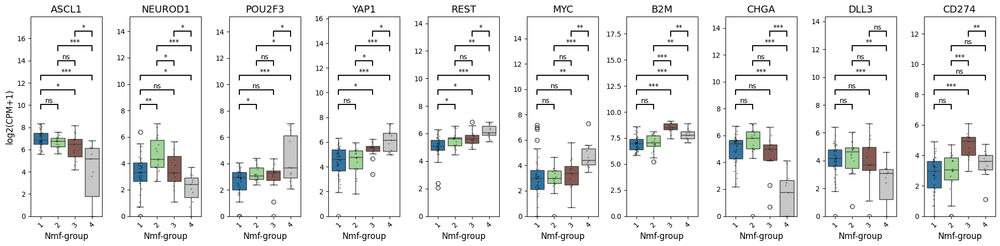

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


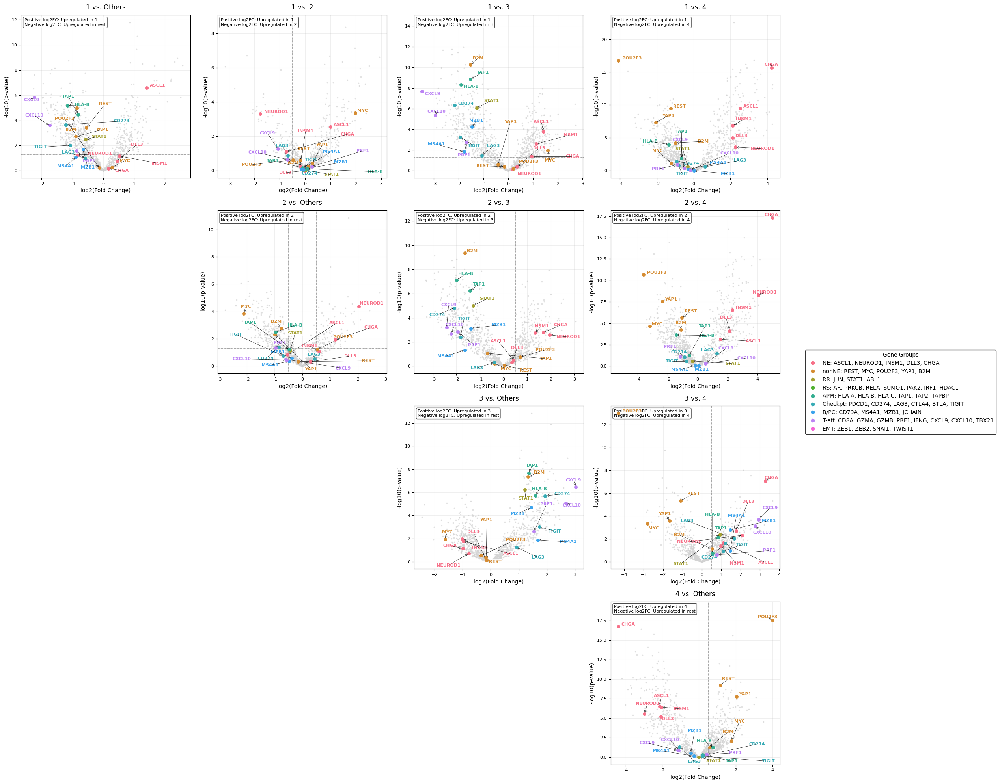

In [49]:
# Initialize and run the analysis
deg_analysis_subset = DEGAnalysis(adata_subset, design_factor='nmf-group', layer='raw_counts', output_dir="./deg_analysis_results_subset")
deg_analysis_subset.create_dds()
deg_analysis_subset.run_comparisons()

deg_analysis_subset.create_clustermaps(marker_list=marker_genes)
deg_analysis_subset.save_results()
deg_analysis_subset.create_boxplots(["ASCL1", "NEUROD1", "POU2F3", "YAP1", "REST", "MYC","B2M","CHGA","DLL3","HLA-A","HLA-C","CD274"], save_path="/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/deg_analysis_results_subset/marker_boxplots_subset.png")
# Define highlight dictionary
highlight_dict = {
    "NE": ["ASCL1", "NEUROD1", "INSM1", "DLL3", "CHGA"],
    "nonNE": ["REST", "MYC", "POU2F3", "YAP1", "B2M"],
    "RR": ["JUN", "STAT1", "ABL1"],
    "RS": ["AR", "PRKCB", "RELA", "SUMO1", "PAK2", "IRF1", "HDAC1"],
    "APM": ['HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2', 'TAPBP'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],

}

# Create volcano grid with highlighted genes
deg_analysis_subset.create_volcano_grid(highlight_dict=highlight_dict)


##### Add subtypes

In [50]:
old_subtyping = {
    1: "A",
    2: "N",
    3: "I-NE",
    4: "I-nNE"
}

# Create new columns based on the mappings
adata_subset.obs["SCLC-Subtype-subset"] = adata_subset.obs["nmf-group"].astype(int).map(old_subtyping)


In [51]:
adata_subset = prepare_for_saving(adata_subset)
adata_subset.obs.rename(columns={1:"NMF_A_subset",2:"NMF_N_subset",3:"NMF_I_NE_subset",4:"NMF_I_nNE_subset"},inplace=True)
adata_subset.write_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_subset_cp_81_samp.h5ad")

... storing 'birth_date' as categorical
... storing 'start_date' as categorical
... storing 'death_date' as categorical
... storing 'death_date_v2' as categorical
... storing 'ink_1' as categorical
... storing 'chemo_1' as categorical
... storing 'chemo_2' as categorical
... storing 'chemo_3' as categorical
... storing 'chemo_4' as categorical
... storing 'progression' as categorical
... storing 'progression_date' as categorical
... storing 'updated_pfs' as categorical
... storing 'start_strale' as categorical
... storing 'end_strale' as categorical
... storing 'pfs_date' as categorical
... storing 'ttp_date' as categorical
... storing 'os_date' as categorical
... storing 'strale_2' as categorical
... storing 'start_strale_2' as categorical
... storing 'date_biopsy' as categorical
... storing 'SCLC-Subtype-subset' as categorical


## De-novo NMF for subtype identification

In [44]:
adata_nmf = adata.copy()
adata_nmf.X = adata.layers["raw_counts"].copy()

#### Run CatBoost model to test lymph node transferability

Running analysis for All_Organs_de_novo
(81, 23260)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
[]
['YAP1']
[]
Running analysis for Lung_de_novo
(65, 23260)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[]
['YAP1']
['ASCL1']
[]
Running analysis for Lymph_Node_de_novo
(16, 23260)


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
[]
[]
['POU2F3']
Random Forest Results:


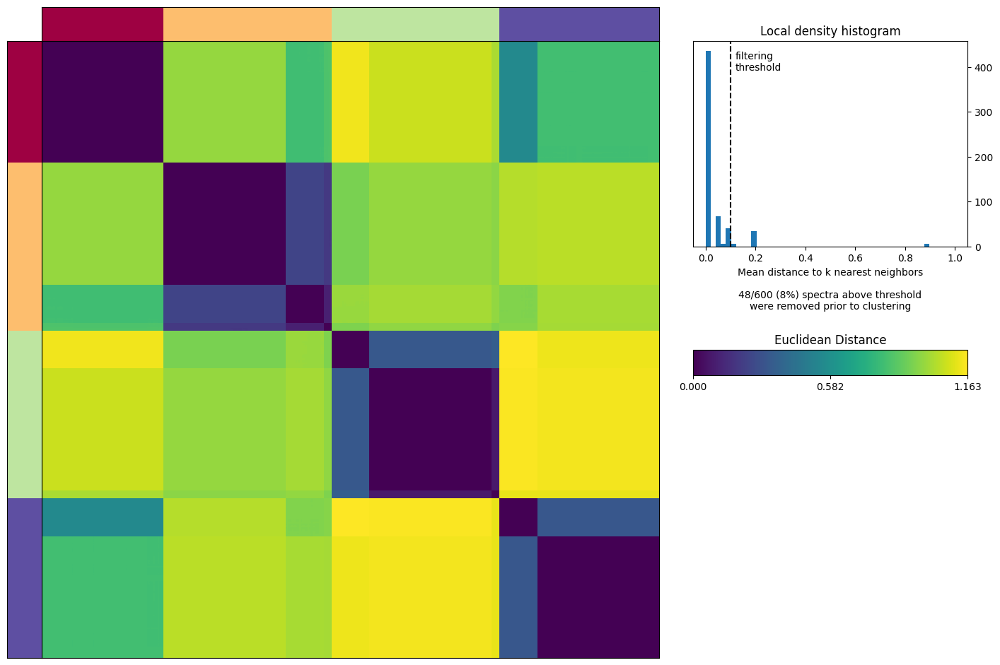

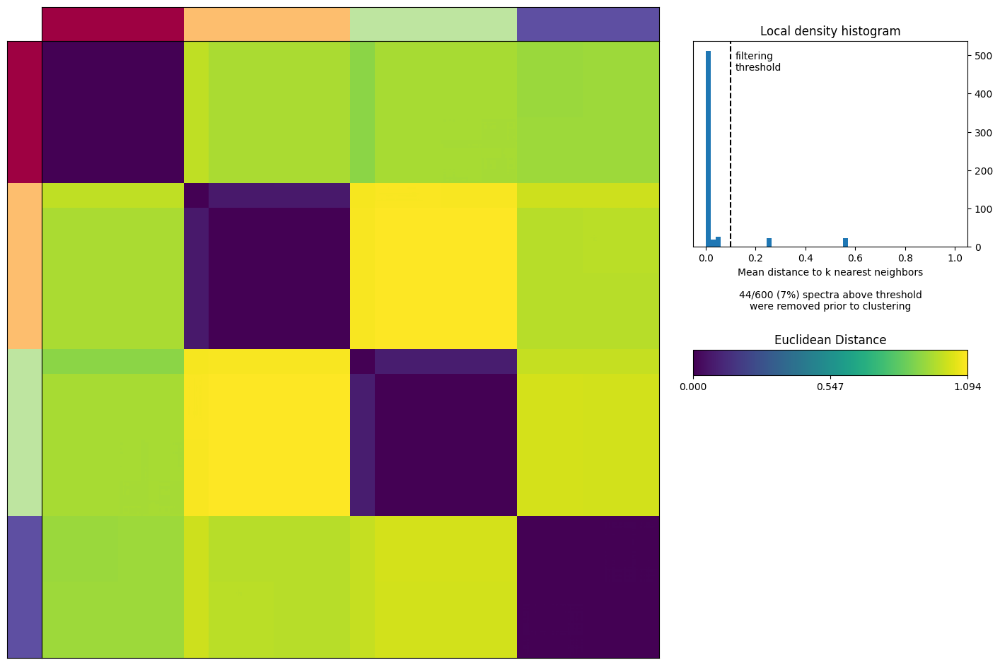

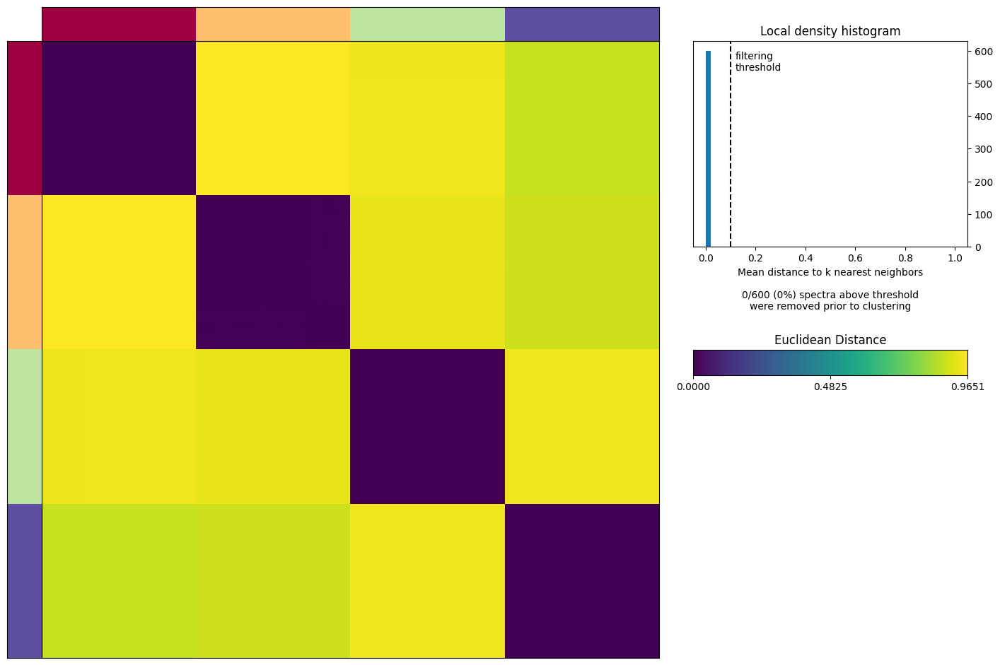

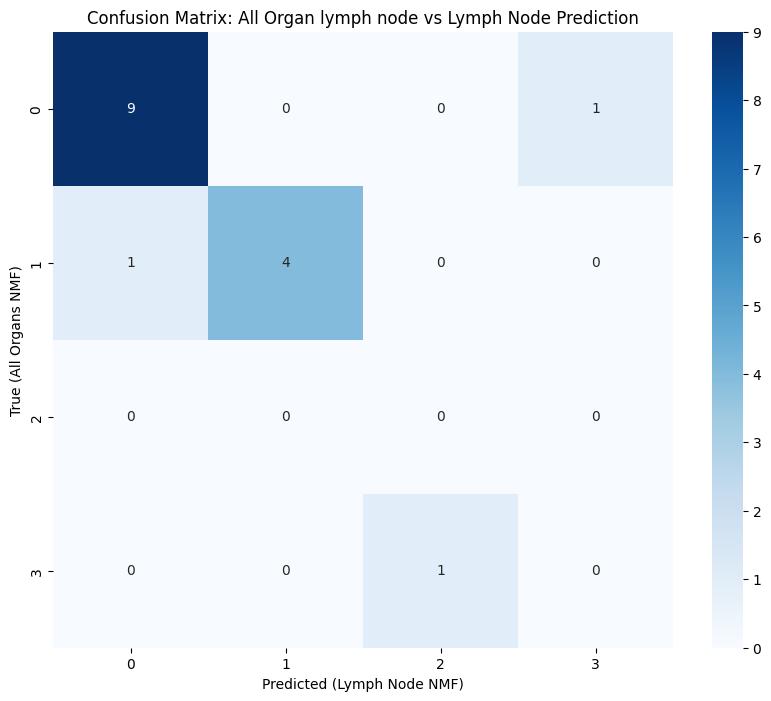

Accuracy: 0.81

CatBoost Results:


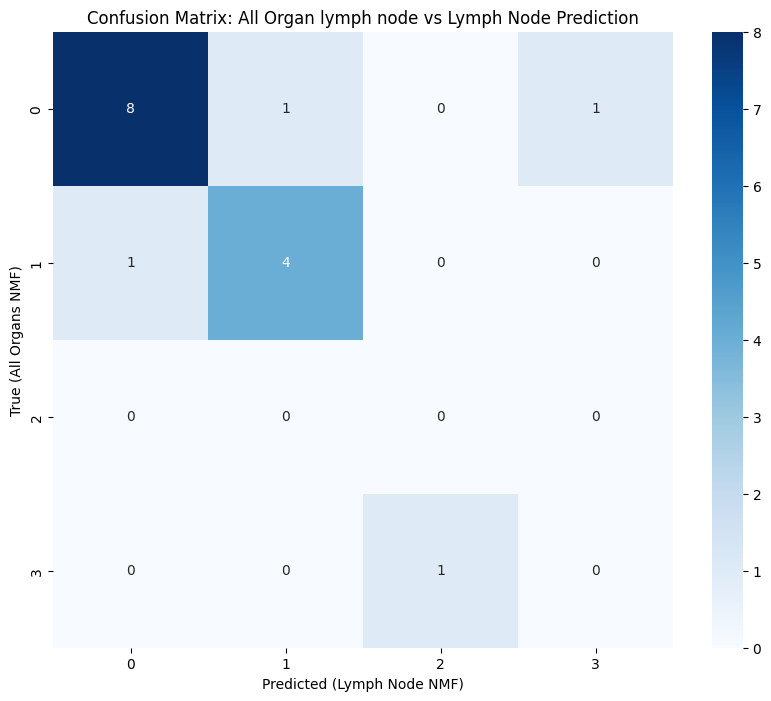

Accuracy: 0.75
All analyses completed.


In [65]:


def run_cnmf_analysis(adata, organ_filter, output_dir, k=None, ngenes=300, run_deg=False):
    # Filter data if organ_filter is specified
    if organ_filter:
        adata_subset = adata[adata.obs["Organ"] == organ_filter].copy()
    else:
        adata_subset = adata.copy()
    
    print(adata_subset.shape)
    adata_subset.X = adata_subset.layers["raw_counts"].copy()

    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    counts_file = os.path.join(output_dir, "temp_counts_de_novo.txt")

    # Save the counts to a file
    pd.DataFrame(adata_subset.X, index=adata_subset.obs_names, columns=adata_subset.var_names).to_csv(counts_file, sep='\t')

    # Prepare the data for cNMF
    cnmf_obj = cNMF(output_dir=output_dir, name="bulk_rna_analysis_de_novo")
    cnmf_obj.prepare(counts_fn=counts_file, components=[k], n_iter=150)

    # Run the factorization
    cnmf_obj.factorize(worker_i=0, total_workers=1)

    # Combine the results
    cnmf_obj.combine()

    cnmf_obj.consensus(k=k, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
    usage_matrix, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=k, density_threshold=0.1)

    # Add the usage matrix to adata_subset.obs
    usage_prefix = f'nmf-group-{organ_filter if organ_filter else "all"}_'
    for col in usage_matrix.columns:
        adata_subset.obs[f'{usage_prefix}{col}'] = usage_matrix[col]

    top_genes = []
    for gep in gep_scores.columns:
        top_genes.append(list(gep_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
    top_genes = pd.DataFrame(top_genes, index=gep_scores.columns).T

    for col in top_genes.columns:
        print([g for g in top_genes[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])

    # Add the organ filter to the nmf-group column name
    group_col = f'nmf-group-{organ_filter if organ_filter else "all"}'
    adata_subset.obs[group_col] = usage_matrix.idxmax(axis=1).astype(str)

    if run_deg:
        # DEG Analysis
        deg_output_dir = os.path.join(output_dir, "DEG_Analysis")
        print(deg_output_dir)
        deg_analysis = DEGAnalysis(adata_subset, design_factor=group_col, layer='raw_counts', output_dir=deg_output_dir)
        deg_analysis.create_dds()
        deg_analysis.run_comparisons()
        deg_analysis.create_volcano_plots()
        deg_analysis.create_clustermaps(marker_list=None)
        deg_analysis.save_results()
        deg_analysis.create_boxplots(["ASCL1", "NEUROD1", "POU2F3", "YAP1", "REST", "MYC"], 
                                    save_path="marker_boxplots.png")
        deg_analysis.create_volcano_grid(highlight_dict=highlight_dict)
        results_nmf = deg_analysis.get_results()

        return results_nmf, adata_subset
    else:
        return adata_subset

def train_and_predict(adata_train, adata_test, train_organ, test_organ, model_type='RF'):
    # Get the usage matrix columns
    usage_cols_train = [str(col) for col in adata_train.obs.columns if str(col).startswith(f'nmf-group-{train_organ}_')]
    usage_cols_test = [str(col) for col in adata_test.obs.columns if str(col).startswith(f'nmf-group-{test_organ}_')]

    if not usage_cols_train:
        print(f"Warning: No columns found starting with 'nmf-group-{train_organ}_'")
        print("Available columns:", adata_train.obs.columns)
        return None
    
    X_train = adata_train.obs[usage_cols_train]
    y_train = adata_train.obs[f'nmf-group-{train_organ}']
    X_train.columns = X_train.columns.str.replace(f'{train_organ}_', '')

    X_test = adata_test.obs[usage_cols_test]
    X_test.columns = X_test.columns.str.replace(f'{test_organ}_', '')

    if model_type == 'RF':
        model = RandomForestClassifier(n_estimators=1000, random_state=42)
    elif model_type == 'CatBoost':
        model = CatBoostClassifier(iterations=1000, random_state=42, verbose=False)
    
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    
    return predictions

def compare_results(adata_all, adata_test, predictions, test_organ):
    # Subset adata_all for the test organ
    adata_all_subset = adata_all[adata_all.obs['Organ'] == test_organ]
    
    # Ensure the order of samples is the same in both AnnData objects
    adata_all_subset = adata_all_subset[adata_test.obs_names]
    
    true_labels = adata_all_subset.obs['nmf-group-all']
    cm = confusion_matrix(true_labels, predictions)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: All Organ lymph node vs {test_organ} Prediction')
    plt.xlabel('Predicted (Lymph Node NMF)')
    plt.ylabel('True (All Organs NMF)')
    plt.show()
    
    accuracy = np.sum(np.diag(cm)) / np.sum(cm)
    print(f"Accuracy: {accuracy:.2f}")

# Load your data (assuming adata_subset is already loaded)
# adata_subset = sc.read_h5ad("path_to_your_data.h5ad")

# Define analysis configurations
analyses = [
    ("All_Organs_de_novo", None),
    ("Lung_de_novo", "Lung"),
    ("Lymph_Node_de_novo", "Lymph Node")
]

# Run analyses
adata_results = {}
for analysis_name, organ_filter in analyses:
    output_dir = f"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/cNMF Analysis/{analysis_name}"
    print(f"Running analysis for {analysis_name}")
    analysis_adata = run_cnmf_analysis(adata_nmf.copy(), organ_filter=organ_filter, output_dir=output_dir, k=4)
    
    # Save the results
    adata_results[analysis_name] = analysis_adata

# Train model on Lung data and predict Lymph Node distribution
lung_predictions_rf = train_and_predict(adata_results["Lung_de_novo"], adata_results["Lymph_Node_de_novo"], 'Lung', 'Lymph Node', model_type='RF')
lung_predictions_catboost = train_and_predict(adata_results["Lung_de_novo"], adata_results["Lymph_Node_de_novo"], 'Lung', 'Lymph Node', model_type='CatBoost')

# Compare results
if lung_predictions_rf is not None:
    print("Random Forest Results:")
    compare_results(adata_results["All_Organs_de_novo"], adata_results["Lymph_Node_de_novo"], lung_predictions_rf, 'Lymph Node')
else:
    print("Random Forest prediction failed due to missing columns.")

if lung_predictions_catboost is not None:
    print("\nCatBoost Results:")
    compare_results(adata_results["All_Organs_de_novo"], adata_results["Lymph_Node_de_novo"], lung_predictions_catboost, 'Lymph Node')
else:
    print("CatBoost prediction failed due to missing columns.")

print("All analyses completed.")



#### VAR and MEAN

Constraints
- Make sure that the 4 key markers are present - ASCL1, NEUROD1, YAP1, POU2F3
- Make sure that the combinations don't generate more than max_genes

##### Finding best parameters (var and mean, etc) between 4 and 6 NMF factors based on stability score and marker ratio

In [64]:


def get_unique_markers(sclc_stratifications, genes):
    markers = set()
    for category in sclc_stratifications.values():
        for subtype in category.values():
            markers.update(subtype["Upregulated_genes"])
            markers.update(subtype["Downregulated_genes"])
    markers.update(genes["NE"])
    markers.update(genes["Non-NE"])
    return list(markers)

def optimize_nmf(adata, sclc_markers, input_layers=["lognormalized_counts", "lognorm_counts_regressed_out_organ"], markers_list=None, key_markers=["ASCL1", "NEUROD1", "YAP1", "POU2F3"], max_genes=9000):
    results = []
    best_score = 0
    best_params = None
    best_gene_count = 0
    best_k = 0
    best_layer = ""

    total_iterations = len(range(5, 96, 5)) * len(range(5, 96, 5)) * 3 * len(input_layers)  # For k=4,5,6 and both layers
    pbar = tqdm(total=total_iterations, desc="Optimizing NMF")

    for input_layer in input_layers:
        expression_data = adata.layers[input_layer].copy()
        mean_expression = np.mean(expression_data, axis=0)
        var_expression = np.var(expression_data, axis=0)
        
        lowess_result = lowess(var_expression, mean_expression, frac=0.6, it=5)
        fitted_variance = np.interp(mean_expression, lowess_result[:, 0], lowess_result[:, 1])
        residual_variance = var_expression - fitted_variance
        
        markers_list_in_adata = [g for g in markers_list if g in adata.var_names]
        total_markers = len(markers_list_in_adata)
        
        for mean_percentile in range(5, 96, 5):
            for var_percentile in range(5, 96, 5):
                mean_threshold = np.percentile(mean_expression, mean_percentile)
                residual_var_threshold = np.percentile(residual_variance, var_percentile)
                
                selected_genes = adata.var_names[(mean_expression > mean_threshold) & (residual_variance > residual_var_threshold)]
                gene_count = len(selected_genes)
                
                if gene_count > max_genes or not all(marker in selected_genes for marker in key_markers):
                    pbar.update(3)  # Update for all k values
                    continue
                
                selected_markers = set(markers_list_in_adata).intersection(set(selected_genes))
                marker_ratio = len(selected_markers) / total_markers
                
                adata_temp = adata[:, selected_genes].copy()
                adata_temp.X = adata_temp.layers["raw_counts"].copy()
                
                temp_counts_file = "./temp_counts_optimization.txt"
                pd.DataFrame(adata_temp.X, index=adata_temp.obs_names, columns=adata_temp.var_names).to_csv(temp_counts_file, sep='\t')
                
                temp_cnmf_dir = "./temp_cnmf"
                if os.path.exists(temp_cnmf_dir):
                    shutil.rmtree(temp_cnmf_dir)
                os.makedirs(temp_cnmf_dir)
                
                cnmf_obj_temp = cNMF(output_dir=temp_cnmf_dir, name="temp_analysis")
                cnmf_obj_temp.prepare(counts_fn=temp_counts_file, components=range(4, 7), n_iter=75)
                cnmf_obj_temp.factorize(worker_i=0, total_workers=1)
                cnmf_obj_temp.combine()
                
                for k in range(4, 7):
                    cnmf_obj_temp.consensus(k=k, density_threshold=0.1, show_clustering=False)
                    stats = cnmf_obj_temp.consensus(k=k, density_threshold=0.1, skip_density_and_return_after_stats=True, show_clustering=False).stats
                    stability_score = stats['silhouette']
                    error = stats["prediction_error"]
                    usage_matrix_temp, _, _, _ = cnmf_obj_temp.load_results(K=k, density_threshold=0.1)
                    adata_temp.obs['nmf-group'] = usage_matrix_temp.idxmax(axis=1).astype(str)
                    
                    combined_score = (marker_ratio*0.4 + stability_score*0.6) / 2

                    print(f"Layer: {input_layer}, K: {k}, Mean %: {mean_percentile}, Var %: {var_percentile}")
                    print(f"Marker ratio: {marker_ratio:.4f}")
                    print(f"Stability score: {stability_score:.4f}")
                    print(f"Gene count: {gene_count}")
                    print(f"Combined score: {combined_score:.4f}")
                    
                    results.append({
                        'Layer': input_layer,
                        'K': k,
                        'Mean_percentile': mean_percentile,
                        'Var_percentile': var_percentile,
                        'Marker_ratio': marker_ratio,
                        'Stability_score': stability_score,
                        "Error": error,
                        'Gene_count': gene_count,
                        'Combined_score': combined_score
                    })
                    
                    if combined_score > best_score:
                        best_score = combined_score
                        best_params = (k, mean_percentile, var_percentile, marker_ratio)
                        best_gene_count = gene_count
                        best_k = k
                        best_layer = input_layer
                    
                    pbar.update(1)
                
                shutil.rmtree(temp_cnmf_dir)
                os.remove(temp_counts_file)
    
    pbar.close()
    
    # Save results to Excel
    results_df = pd.DataFrame(results)
    results_df.to_excel("nmf_optimization_results_all.xlsx", index=False)
    print("Results saved to 'nmf_optimization_results_all.xlsx'")
    
    return best_params, best_score, best_gene_count, best_k, best_layer

# Main execution
unique_sclc_markers = get_unique_markers(sclc_stratifications, genes)
best_params, best_score, best_gene_count, best_k, best_layer = optimize_nmf(adata, unique_sclc_markers, markers_list=markers_list)



Optimizing NMF:   0%|          | 0/2166 [00:00<?, ?it/s]Optimizing NMF:   0%|          | 3/2166 [00:25<5:08:11,  8.55s/it]/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 37/2166 [01:32<1:23:01,  2.34s/it]

Layer: lognormalized_counts, K: 4, Mean %: 5, Var %: 65
Marker ratio: 0.6721
Stability score: 0.8473
Gene count: 7968
Combined score: 0.3886


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 38/2166 [01:35<1:24:21,  2.38s/it]

Layer: lognormalized_counts, K: 5, Mean %: 5, Var %: 65
Marker ratio: 0.6721
Stability score: 0.9994
Gene count: 7968
Combined score: 0.4343


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 39/2166 [01:39<1:26:23,  2.44s/it]

Layer: lognormalized_counts, K: 6, Mean %: 5, Var %: 65
Marker ratio: 0.6721
Stability score: 0.8291
Gene count: 7968
Combined score: 0.3832


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 40/2166 [02:35<3:38:28,  6.17s/it]

Layer: lognormalized_counts, K: 4, Mean %: 5, Var %: 70
Marker ratio: 0.6220
Stability score: 0.8931
Gene count: 6849
Combined score: 0.3923


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 41/2166 [02:39<3:29:27,  5.91s/it]

Layer: lognormalized_counts, K: 5, Mean %: 5, Var %: 70
Marker ratio: 0.6220
Stability score: 0.9994
Gene count: 6849
Combined score: 0.4242


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 42/2166 [02:42<3:18:45,  5.61s/it]

Layer: lognormalized_counts, K: 6, Mean %: 5, Var %: 70
Marker ratio: 0.6220
Stability score: 0.7537
Gene count: 6849
Combined score: 0.3505


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 43/2166 [03:37<7:23:18, 12.53s/it]

Layer: lognormalized_counts, K: 4, Mean %: 5, Var %: 75
Marker ratio: 0.5786
Stability score: 0.8350
Gene count: 5731
Combined score: 0.3662


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 44/2166 [03:40<6:25:50, 10.91s/it]

Layer: lognormalized_counts, K: 5, Mean %: 5, Var %: 75
Marker ratio: 0.5786
Stability score: 0.9994
Gene count: 5731
Combined score: 0.4155


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
Optimizing NMF:   2%|▏         | 45/2166 [03:43<5:31:36,  9.38s/it]

Layer: lognormalized_counts, K: 6, Mean %: 5, Var %: 75
Marker ratio: 0.5786
Stability score: 0.7809
Gene count: 5731
Combined score: 0.3500


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

KeyboardInterrupt: 

##### Plotting heatmaps for all k=4 results

In [65]:


# Read the Excel file and sort by Combined_score
results_df = pd.read_excel("/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/nmf_optimization_results.xlsx")
results_df = results_df.sort_values("Combined_score", ascending=False)
def run_nmf_and_plot(adata, layer, k, mean_percentile, var_percentile):
    print(f"Starting NMF analysis for Layer: {layer}, K: {k}, Mean %: {mean_percentile}, Var %: {var_percentile}")
    if k == 4:
        expression_data = adata.layers[layer].copy()
        mean_expression = np.mean(expression_data, axis=0)
        var_expression = np.var(expression_data, axis=0)
        lowess_result = lowess(var_expression, mean_expression, frac=0.6, it=5)
        fitted_variance = np.interp(mean_expression, lowess_result[:, 0], lowess_result[:, 1])
        residual_variance = var_expression - fitted_variance

        mean_threshold = np.percentile(mean_expression, mean_percentile)
        residual_var_threshold = np.percentile(residual_variance, var_percentile)

        selected_genes = adata.var_names[(mean_expression > mean_threshold) & (residual_variance > residual_var_threshold)]
        print(f"Number of selected genes: {len(selected_genes)}")
        
        adata_nmf = adata[:, selected_genes].copy()
        adata_nmf.X = adata_nmf.layers["raw_counts"].copy()

        counts_file_new = "./temp_counts_new_subtype_identification.txt"
        pd.DataFrame(adata_nmf.X, index=adata_nmf.obs_names, columns=adata_nmf.var_names).to_csv(counts_file_new, sep='\t')

        cnmf_obj_new = cNMF(output_dir="./cnmf_results_selected_genes", name="bulk_rna_analysis_selected_genes")
        cnmf_obj_new.prepare(counts_fn=counts_file_new, components=[k], n_iter=150)
        cnmf_obj_new.factorize(worker_i=0, total_workers=1)
        cnmf_obj_new.combine()
        cnmf_obj_new.consensus(k=k, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
        usage_matrix_new, gep_scores_new, gep_tpm_new, topgenes_new = cnmf_obj_new.load_results(K=k, density_threshold=0.1)

        adata_nmf.obs = pd.merge(left=adata_nmf.obs, right=usage_matrix_new, how='left', left_index=True, right_index=True)
        adata_nmf.obs['nmf-group'] = usage_matrix_new.idxmax(axis=1).astype(str)

        genes_to_plot = [
            'CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1',
            'YAP1', 'POU2F3', 'MYC', 'REST',
            'ZEB1', 'ZEB2', 'SNAI1', 'TWIST1',
            'CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21',
            'CD79A', 'MS4A1', 'MZB1', 'JCHAIN',
            'TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C',
            'PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT'
        ]

        genes_to_plot = [gene for gene in genes_to_plot if gene in adata_nmf.var_names]
        print(f"Number of genes to plot: {len(genes_to_plot)}")

        gene_categories = {
            'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
            'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
            'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
            'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
            'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
            'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
            'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
        }

        adata_nmf.var['gene_category'] = [
            next((cat for cat, genes in gene_categories.items() if gene in genes), 'Other')
            for gene in adata_nmf.var_names
        ]

        var_group_positions = []
        start = 0
        for category in ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']:
            genes_in_category = [gene for gene in genes_to_plot if gene in gene_categories[category]]
            if genes_in_category:
                end = start + len(genes_in_category)
                var_group_positions.append((start, end))
                start = end

        # Z-score normalization
        adata_nmf.layers['z_score'] = (adata_nmf.X - adata_nmf.X.mean(axis=0)) / adata_nmf.X.std(axis=0)

        print("Plotting heatmap...")
        fig, ax = plt.subplots(figsize=(12, 8))
        
        # Create a custom colormap similar to the image
        colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
        n_bins = 100
        cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=n_bins)
        
        sc.pl.heatmap(adata_nmf, 
                    var_names=genes_to_plot, 
                    groupby='nmf-group',
                    var_group_positions=var_group_positions,
                    var_group_labels=['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt'],
                    show_gene_labels=True,
                    dendrogram=False,
                    layer='z_score',  # Use the z-score layer
                    cmap=cmap,
                    vmin=-2, vmax=2,  # Set range for z-scores
                    vcenter=0,
                    show=False,
                    )
    
        # Add colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=-2, vmax=2))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, label='Z-score', ticks=[-2, -1, 0, 1, 2])
        cbar.ax.set_yticklabels(['-2', '-1', '0', '1', '2'])

        plt.tight_layout()
        output_file = f"k4_heatmap_layer_{layer}_k_{k}_mean_{mean_percentile}_var_{var_percentile}.png"
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f"Heatmap saved to {output_file}")
        plt.close()

        # Clean up temporary files
        os.remove(counts_file_new)

# Iterate through top results and run NMF
for index, row in results_df.iterrows():
    layer = row['Layer']
    k = int(row['K'])
    mean_percentile = row['Mean_percentile']
    var_percentile = row['Var_percentile']
    
    print(f"\nRunning NMF with Layer: {layer}, K: {k}, Mean %: {mean_percentile}, Var %: {var_percentile}")
    run_nmf_and_plot(adata, layer, k, mean_percentile, var_percentile)
    
    # Optionally, limit the number of iterations
    if index == 62:  # This will run for the top 10 results
        break

print("Analysis complete. Check the generated heatmap images.")

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/nmf_optimization_results.xlsx'

##### Testing best parameters

Number of selected genes: 8768


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/cnmf/cnmf.py:550: UserWarning: 900 runs already appear completed. If this is unexpected, consider
            re-initializing the cnmf object with a different run name or output directory


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 798.
[Worker 0]. Starting task 799.
[Worker 0]. Starting task 800.
[Worker 0]. Starting task 801.
[Worker 0]. Starting task 802.
[Worker 0]. Starting task 803.
[Worker 0]. Starting task 804.
[Worker 0]. Starting task 805.
[Worker 0]. Starting task 806.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 807.
[Worker 0]. Starting task 808.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 809.
[Worker 0]. Starting task 810.
[Worker 0]. Starting task 811.
[Worker 0]. Starting task 812.
[Worker 0]. Starting task 813.
[Worker 0]. Starting task 814.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 815.
[Worker 0]. Starting task 816.
[Worker 0]. Starting task 817.
[Worker 0]. Starting task 818.
[Worker 0]. Starting task 819.
[Worker 0]. Starting task 820.
[Worker 0]. Starting task 821.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 822.
[Worker 0]. Starting task 823.
[Worker 0]. Starting task 824.
[Worker 0]. Starting task 825.
[Worker 0]. Starting task 826.
[Worker 0]. Starting task 827.
[Worker 0]. Starting task 828.
[Worker 0]. Starting task 829.
[Worker 0]. Starting task 830.
[Worker 0]. Starting task 831.
[Worker 0]. Starting task 832.
[Worker 0]. Starting task 833.
[Worker 0]. Starting task 834.
[Worker 0]. Starting task 835.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 836.
[Worker 0]. Starting task 837.
[Worker 0]. Starting task 838.
[Worker 0]. Starting task 839.
[Worker 0]. Starting task 840.
[Worker 0]. Starting task 841.
[Worker 0]. Starting task 842.
[Worker 0]. Starting task 843.
[Worker 0]. Starting task 844.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 845.
[Worker 0]. Starting task 846.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 847.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 848.
[Worker 0]. Starting task 849.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 850.
[Worker 0]. Starting task 851.
[Worker 0]. Starting task 852.
[Worker 0]. Starting task 853.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 854.
[Worker 0]. Starting task 855.
[Worker 0]. Starting task 856.
[Worker 0]. Starting task 857.
[Worker 0]. Starting task 858.
[Worker 0]. Starting task 859.
[Worker 0]. Starting task 860.
[Worker 0]. Starting task 861.
[Worker 0]. Starting task 862.
[Worker 0]. Starting task 863.
[Worker 0]. Starting task 864.
[Worker 0]. Starting task 865.
[Worker 0]. Starting task 866.
[Worker 0]. Starting task 867.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 868.
[Worker 0]. Starting task 869.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 870.
[Worker 0]. Starting task 871.
[Worker 0]. Starting task 872.
[Worker 0]. Starting task 873.
[Worker 0]. Starting task 874.
[Worker 0]. Starting task 875.
[Worker 0]. Starting task 876.
[Worker 0]. Starting task 877.
[Worker 0]. Starting task 878.
[Worker 0]. Starting task 879.
[Worker 0]. Starting task 880.
[Worker 0]. Starting task 881.
[Worker 0]. Starting task 882.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 883.
[Worker 0]. Starting task 884.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 885.
[Worker 0]. Starting task 886.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 887.
[Worker 0]. Starting task 888.
[Worker 0]. Starting task 889.
[Worker 0]. Starting task 890.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.


[Worker 0]. Starting task 891.
[Worker 0]. Starting task 892.
[Worker 0]. Starting task 893.
[Worker 0]. Starting task 894.
[Worker 0]. Starting task 895.
[Worker 0]. Starting task 896.
[Worker 0]. Starting task 897.
[Worker 0]. Starting task 898.
[Worker 0]. Starting task 899.
Combining factorizations for k=2.
Combining factorizations for k=3.
Combining factorizations for k=4.
Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.


['ASCL1']
[]
['YAP1']
[]


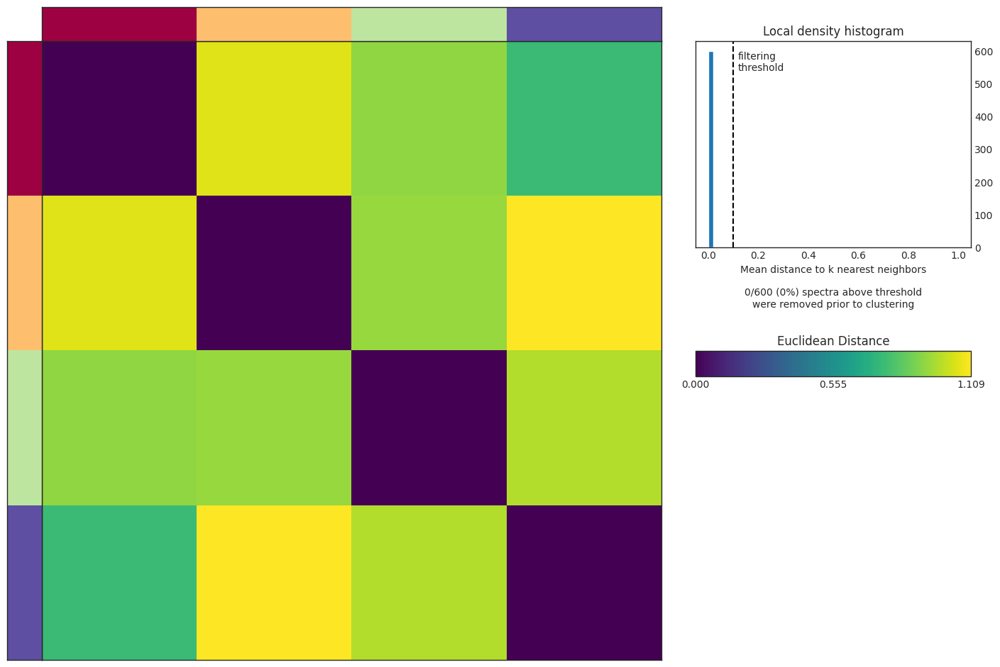

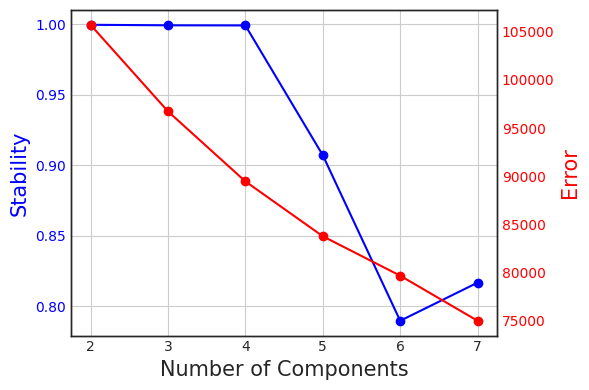

In [45]:

expression_data = adata.layers["lognorm_counts_regressed_out_organ"].copy()
mean_expression = np.mean(expression_data, axis=0)
var_expression = np.var(expression_data, axis=0)
lowess_result = lowess(var_expression, mean_expression, frac=0.6, it=5)
fitted_variance = np.interp(mean_expression, lowess_result[:, 0], lowess_result[:, 1])
residual_variance = var_expression - fitted_variance

mean_threshold = np.percentile(mean_expression, 25)
residual_var_threshold = np.percentile(residual_variance,50)

selected_genes = adata.var_names[(mean_expression > mean_threshold) & (residual_variance > residual_var_threshold)]
print(f"Number of selected genes: {len(selected_genes)}")

adata_nmf = adata[:, selected_genes].copy()
adata_nmf.X = adata_nmf.layers["raw_counts"].copy()

####################################
# # List of genes to remove
# genes_to_remove = ['IRF1', 'JUN', 'PRKCB', 'AR', 'STAT1']

# # Find the indices of genes to remove
# remove_indices = [adata_nmf.var_names.get_loc(gene) for gene in genes_to_remove if gene in adata_nmf.var_names]

# # Create a boolean mask to keep genes (inverse of removal indices)
# keep_mask = np.ones(adata_nmf.n_vars, dtype=bool)
# keep_mask[remove_indices] = False

# # Subset the AnnData object
# adata_nmf = adata_nmf[:, keep_mask].copy()

# # Recompute raw counts and other layers
# adata_nmf.X = adata_nmf.layers["raw_counts"].copy()

############################
counts_file_new = "./temp_counts_new_subtype_identification.txt"
pd.DataFrame(adata_nmf.X, index=adata_nmf.obs_names, columns=adata_nmf.var_names).to_csv(counts_file_new, sep='\t')

cnmf_obj_new = cNMF(output_dir="./cnmf_results_selected_genes", name="bulk_rna_analysis_selected_genes")
cnmf_obj_new.prepare(counts_fn=counts_file_new, components=range(2, 8), n_iter=150)
cnmf_obj_new.factorize(worker_i=0, total_workers=1)
cnmf_obj_new.combine()
cnmf_obj_new.consensus(k=4, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
cnmf_obj_new.k_selection_plot()

usage_matrix_nmf_var, gep_scores_nmf_var, gep_tpm_nmf_var, topgenes_nmf_var = cnmf_obj_new.load_results(K=4, density_threshold=0.1)

adata_nmf.obs = pd.merge(left=adata_nmf.obs, right=usage_matrix_nmf_var, how='left', left_index=True, right_index=True)
top_genes_nmf = []
ngenes = 1000
for gep in gep_scores_nmf_var.columns:
    top_genes_nmf.append(list(gep_scores_nmf_var.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes_nmf = pd.DataFrame(top_genes_nmf, index=gep_scores_nmf_var.columns).T
for col in top_genes_nmf.columns:
	print([g for g in top_genes_nmf[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])
      
adata_nmf.obs['nmf-group-de-novo'] = usage_matrix_nmf_var.idxmax(axis=1).astype(str)

###### Get the mean expression by SCLC group 

In [46]:
top_genes_nmf = []
ngenes = 20000
for gep in gep_scores_nmf_var.columns:
    top_genes_nmf.append(list(gep_scores_nmf_var.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes_nmf = pd.DataFrame(top_genes_nmf, index=gep_scores_nmf_var.columns).T
for col in top_genes_nmf.columns:
	print([g for g in top_genes_nmf[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])
      
top_genes_nmf.to_excel("./de_novo_NMF_genes.xlsx")

['ASCL1', 'NEUROD1', 'POU2F3', 'YAP1']
['NEUROD1', 'POU2F3', 'YAP1', 'ASCL1']
['YAP1', 'POU2F3', 'NEUROD1', 'ASCL1']
['POU2F3', 'ASCL1', 'NEUROD1', 'YAP1']


##### Plot top genes for each NMF

... storing 'nmf-group-de-novo' as categorical


Total number of genes to plot: 44
Additional genes added: ['ASCL1', 'POU2F3', 'YAP1', 'NEUROD1']


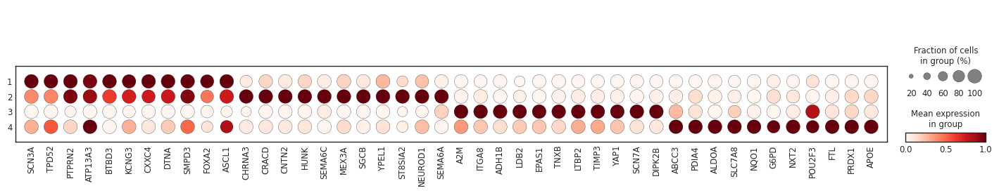

In [47]:
plot_genes_nmf = []
n =10
for i in top_genes_nmf.columns:
    plot_genes_nmf += top_genes_nmf[i][:n].values.reshape(-1).tolist()

# Add the specific genes you mentioned
additional_genes = ['ASCL1', 'POU2F3', 'YAP1', 'NEUROD1']

# Add these genes to the plot_genes list if they're not already there
for gene in additional_genes:
    if gene not in plot_genes_nmf:
        plot_genes_nmf.append(gene)

# Remove duplicates if any
plot_genes_nmf = list(dict.fromkeys(plot_genes_nmf))

# Put ASCL1 on n + 1
index_to_move = plot_genes_nmf.index('ASCL1')
gene_to_move = plot_genes_nmf.pop(index_to_move)
plot_genes_nmf.insert(n, gene_to_move)
# Put NEUROD1 on index n*2+1
index_to_move = plot_genes_nmf.index('NEUROD1')
gene_to_move = plot_genes_nmf.pop(index_to_move)
plot_genes_nmf.insert(n*2, gene_to_move)
# Put YAP1 on index n*3 +1 
index_to_move = plot_genes_nmf.index('YAP1')
gene_to_move = plot_genes_nmf.pop(index_to_move)
plot_genes_nmf.insert(n*3, gene_to_move)
# Put POU2F3 on index n*4 +1 
index_to_move = plot_genes_nmf.index('POU2F3')
gene_to_move = plot_genes_nmf.pop(index_to_move)
plot_genes_nmf.insert(n*4, gene_to_move)
print(f"Total number of genes to plot: {len(plot_genes_nmf)}")
print("Additional genes added:", additional_genes)

sc.pl.dotplot(adata_nmf,
              var_names=plot_genes_nmf,
              groupby="nmf-group-de-novo", 
              dendrogram=False,
              standard_scale='var',
              swap_axes=False)  # This will swap the x and y axes

##### Heatmap 

Number of genes to plot: 22


... storing 'gene_category' as categorical


Plotting heatmap...


/mnt/scratch/tmp/ipykernel_967163/3759111128.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


<Figure size 1200x800 with 0 Axes>

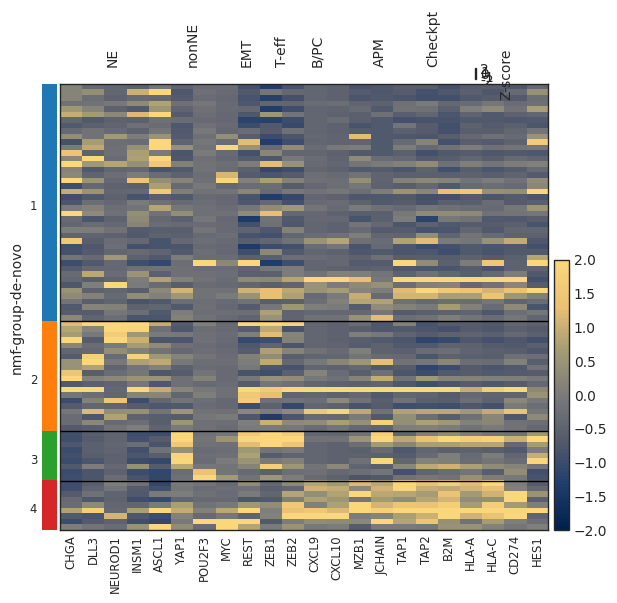

In [48]:


genes_to_plot = [
    'CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1',
    'YAP1', 'POU2F3', 'MYC', 'REST',
    'ZEB1', 'ZEB2', 'SNAI1', 'TWIST1',
    'CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21',
    'CD79A', 'MS4A1', 'MZB1', 'JCHAIN',
    'TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C',
    'PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT',"HES1"
]

genes_to_plot = [gene for gene in genes_to_plot if gene in adata_nmf.var_names]
print(f"Number of genes to plot: {len(genes_to_plot)}")

gene_categories = {
    'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
    'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
}

adata_nmf.var['gene_category'] = [
    next((cat for cat, genes in gene_categories.items() if gene in genes), 'Other')
    for gene in adata_nmf.var_names
]

var_group_positions = []
start = 0
for category in ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']:
    genes_in_category = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    if genes_in_category:
        end = start + len(genes_in_category)
        var_group_positions.append((start, end))
        start = end

# Z-score normalization
adata_nmf.layers['z_score'] = (adata_nmf.X - adata_nmf.X.mean(axis=0)) / adata_nmf.X.std(axis=0)

# Convert 'nmf-group' to category dtype
adata_nmf.obs['nmf-group-de-novo'] = adata_nmf.obs['nmf-group-de-novo'].astype('category')

# Calculate average expression for each group
group_avg_expr = pd.DataFrame(
    adata_nmf.layers['z_score'][:, [adata_nmf.var_names.get_loc(gene) for gene in genes_to_plot]],
    columns=genes_to_plot,
    index=adata_nmf.obs_names
)
group_avg_expr['nmf-group-de-novo'] = adata_nmf.obs['nmf-group-de-novo']
group_avg_expr = group_avg_expr.groupby('nmf-group-de-novo').mean()

# Sort cells within each group based on their correlation with the group average
new_order = []
for group in adata_nmf.obs['nmf-group-de-novo'].cat.categories:
    group_cells = adata_nmf.obs_names[adata_nmf.obs['nmf-group-de-novo'] == group]
    group_expr = group_avg_expr.loc[group]
    correlations = group_cells.map(lambda cell: np.corrcoef(adata_nmf[cell, genes_to_plot].layers['z_score'][0], group_expr)[0, 1])
    sorted_cells = group_cells[correlations.argsort()[::-1]]
    new_order.extend(sorted_cells)

# Reorder the AnnData object
adata_nmf = adata_nmf[new_order].copy()


print("Plotting heatmap...")

# Create a custom colormap similar to the image
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
n_bins = 100
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=n_bins)

# Create the figure with adjusted size
plt.figure(figsize=(12, 8))

# Plot the heatmap
sc.pl.heatmap(adata_nmf, 
            var_names=genes_to_plot, 
            groupby='nmf-group-de-novo',
            var_group_positions=var_group_positions,
            var_group_labels=['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt'],
            show_gene_labels=True,
            dendrogram=False,
            layer='z_score',
            cmap=cmap,
            vmin=-2, vmax=2,
            vcenter=0,
            show=False,
            )

# Get the current axes
ax = plt.gca()

# Add white lines between gene groups
for pos in var_group_positions[:-1]:  # Exclude the last position
    ax.axvline(x=pos[1], color='white', linewidth=2)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add grid for gene groups (optional)
ax.grid(False)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=-2, vmax=2))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Z-score', ticks=[-2, -1, 0, 1, 2])
cbar.ax.set_yticklabels(['-2', '-1', '0', '1', '2'])

plt.show()



/mnt/scratch/tmp/ipykernel_967163/3825937448.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


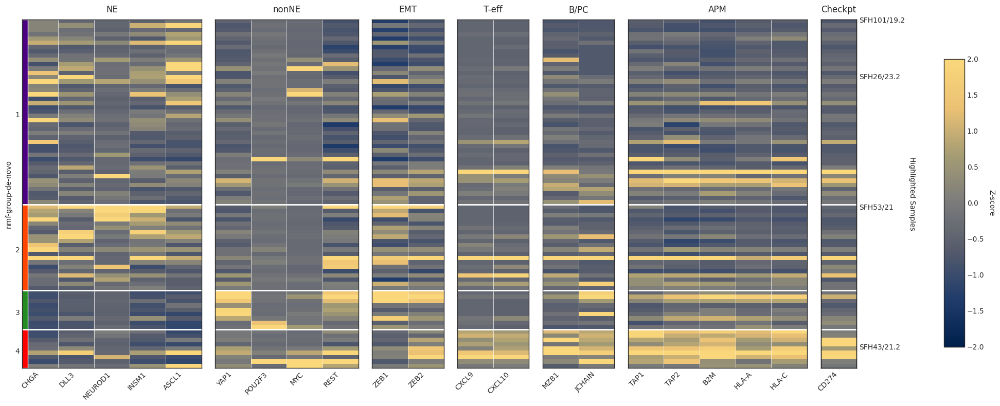

In [49]:
# Import required libraries for data visualization
import matplotlib.pyplot as plt  # Plotting library
import matplotlib.gridspec as gridspec  # Advanced grid layout
import matplotlib.colors as mcolors  # Custom color manipulation
import numpy as np  # Numerical computing library

# Specify the samples to highlight
highlight_samples = ['SFH101/19.2', 'SFH26/23.2', 'SFH43/21.2', 'SFH53/21']

# Calculate dimensions needed for the plot
gene_groups = ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']
widths = []  # Will store the width of each gene group
genes_by_group = []  # Will store genes for each group

# Define colors for NMF groups
nmf_colors = ['#4B0082', '#FF4500', '#228B22', '#FF0000']  # Indigo, OrangeRed, ForestGreen, Red

# Populate genes for each group
for category in gene_groups:
    # Filter genes belonging to the current category
    genes_in_cat = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    widths.append(len(genes_in_cat))  # Store number of genes in this category
    genes_by_group.append(genes_in_cat)  # Store the genes for this category

# Create figure with gridspec for flexible layout
fig = plt.figure(figsize=(20, 8))  # Set overall figure size
gs = gridspec.GridSpec(1, len(gene_groups), width_ratios=widths)  # Create grid with variable width ratios

# Create custom colormap for heatmap
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=100)

# Get unique NMF groups and their sizes
unique_groups = adata_nmf.obs['nmf-group-de-novo'].unique()
group_sizes = [sum(adata_nmf.obs['nmf-group-de-novo'] == group) for group in unique_groups]
group_boundaries = np.cumsum([0] + group_sizes)
group_centers = [(start + end) / 2 for start, end in zip(group_boundaries[:-1], group_boundaries[1:])]

# Plot each gene group
for idx, (category, genes) in enumerate(zip(gene_groups, genes_by_group)):
    # Create subplot for each gene group
    ax = plt.subplot(gs[idx])
    
    # Extract z-score data for current genes
    data = adata_nmf.layers['z_score'][:, [adata_nmf.var_names.get_loc(gene) for gene in genes]]
    
    # Create heatmap for the current gene group
    im = ax.imshow(data, aspect='auto', cmap=cmap, vmin=-2, vmax=2)
    
    # Set title for each subplot
    ax.set_title(category, pad=10)
    
    # Set x-ticks with gene names
    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=45, ha='right')
    
    # Special handling for the first subplot (to add NMF group labels)
    if idx == 0:
        # Set y-ticks at the centers of each group
        ax.set_yticks(group_centers)
        ax.set_yticklabels(range(1, len(unique_groups) + 1))
        ax.set_ylabel('nmf-group-de-novo')
        
        # Add colored bars for NMF groups
        for i, (start, end) in enumerate(zip(group_boundaries[:-1], group_boundaries[1:])):
            ax.add_patch(plt.Rectangle((-0.5, start-0.5), 0.15, end-start, 
                                     facecolor=nmf_colors[i], clip_on=False))
    else:
        # Remove y-ticks for subsequent subplots
        ax.set_yticks([])
    
    # Add horizontal lines between NMF groups
    for boundary in group_boundaries[1:-1]:
        ax.axhline(y=boundary-0.5, color='white', linewidth=2)
    
    # Add white grid lines
    ax.set_xticks(np.arange(-0.5, len(genes), 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5, axis='x')
    
    # Add borders between groups
    ax.spines['left'].set_visible(True)
    ax.spines['right'].set_visible(True)

# Add colorbar and sample ID labels on the last subplot
# Find the index of the last subplot (Checkpt group)
last_subplot_index = len(gene_groups) - 1
last_ax = plt.subplot(gs[last_subplot_index])

# Add colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Z-score', rotation=270, labelpad=15)

# Create secondary Y-axis for highlighted samples
ax2 = last_ax.twinx()

# Find indices of highlighted samples
sample_indices = [list(adata_nmf.obs['ID_Sample']).index(sample) for sample in highlight_samples]

# Set y-ticks and labels for highlighted samples
ax2.set_yticks(sample_indices)
ax2.set_yticklabels(highlight_samples)
ax2.set_ylabel('Highlighted Samples', rotation=270, labelpad=15)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

/mnt/scratch/tmp/ipykernel_967163/3132479854.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


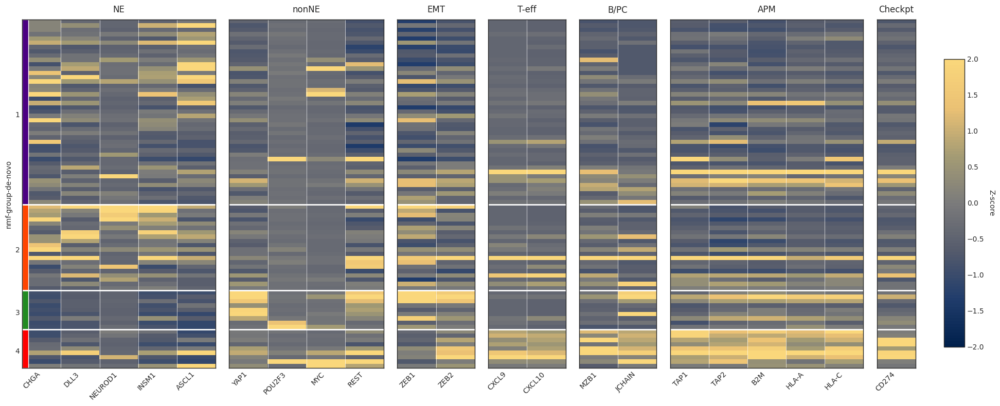

In [50]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import numpy as np

# Calculate dimensions needed for the plot
gene_groups = ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']
widths = []
genes_by_group = []

# Define colors for NMF groups
nmf_colors = ['#4B0082', '#FF4500', '#228B22', '#FF0000']  # Indigo, OrangeRed, ForestGreen, Red

for category in gene_groups:
    genes_in_cat = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    widths.append(len(genes_in_cat))
    genes_by_group.append(genes_in_cat)

# Create figure with gridspec
fig = plt.figure(figsize=(20, 8))
gs = gridspec.GridSpec(1, len(gene_groups), width_ratios=widths)

# Create custom colormap
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=100)

# Get unique NMF groups and their sizes
unique_groups = adata_nmf.obs['nmf-group-de-novo'].unique()
group_sizes = [sum(adata_nmf.obs['nmf-group-de-novo'] == group) for group in unique_groups]
group_boundaries = np.cumsum([0] + group_sizes)
group_centers = [(start + end) / 2 for start, end in zip(group_boundaries[:-1], group_boundaries[1:])]

# Plot each gene group
for idx, (category, genes) in enumerate(zip(gene_groups, genes_by_group)):
    ax = plt.subplot(gs[idx])
    
    # Get data for these genes
    data = adata_nmf.layers['z_score'][:, [adata_nmf.var_names.get_loc(gene) for gene in genes]]
    
    # Create heatmap
    im = ax.imshow(data, aspect='auto', cmap=cmap, vmin=-2, vmax=2)
    
    # Set title
    ax.set_title(category, pad=10)
    
    # Set x-ticks (gene names)
    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=45, ha='right')
    
    # Add colored bars for NMF groups on the left
    if idx == 0:
        # Set y-ticks at the centers of each group
        ax.set_yticks(group_centers)
        ax.set_yticklabels(range(1, len(unique_groups) + 1))
        ax.set_ylabel('nmf-group-de-novo')
        
        # Add colored bars on the left
        for i, (start, end) in enumerate(zip(group_boundaries[:-1], group_boundaries[1:])):
            ax.add_patch(plt.Rectangle((-0.5, start-0.5), 0.15, end-start, 
                                     facecolor=nmf_colors[i], clip_on=False))
    else:
        ax.set_yticks([])
    
    # Add horizontal lines between NMF groups
    for boundary in group_boundaries[1:-1]:
        ax.axhline(y=boundary-0.5, color='white', linewidth=2)
    
    # Add white grid lines
    ax.set_xticks(np.arange(-0.5, len(genes), 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5, axis='x')
    
    # Add borders between groups
    ax.spines['left'].set_visible(True)
    ax.spines['right'].set_visible(True)

# Add colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Z-score', rotation=270, labelpad=15)

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

In [53]:
def plot_gene_expression_heatmap(adata, 
                               genes_to_plot,
                               gene_categories,
                               group_column,
                               layer='raw_counts',
                               figsize=(20, 8),
                               vmin=-2,
                               vmax=2,
                               cmap_colors=None):
    """
    Plot a gene expression heatmap with gene categories and group annotations.
    
    Parameters:
    -----------
    adata : AnnData
        Annotated data matrix
    genes_to_plot : list
        List of genes to plot
    gene_categories : dict
        Dictionary mapping category names to lists of genes
    group_column : str
        Column in adata.obs for grouping cells
    layer : str, default='raw_counts'
        Layer in adata to use for expression values. Options: 'raw_counts', 'normalized_counts', 'lognormalized_counts'
    figsize : tuple, default=(20, 8)
        Figure size
    vmin, vmax : float, default=-2, 2
        Color scale limits
    cmap_colors : list, optional
        List of colors for the heatmap colormap. If None, uses default colors
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import matplotlib.colors as mcolors
    import numpy as np
    import pandas as pd
    import seaborn as sns
    
    # Filter genes that exist in the data
    genes_to_plot = [gene for gene in genes_to_plot if gene in adata.var_names]
    print(f"Number of genes to plot: {len(genes_to_plot)}")
    
    # Get expression data from the specified layer
    if layer not in adata.layers and layer != 'raw_counts':
        raise ValueError(f"Layer {layer} not found in AnnData object. Available layers: {list(adata.layers.keys())}")
    
    if layer == 'raw_counts':
        data = adata.X
    else:
        data = adata.layers[layer]
    
    # Calculate z-scores
    adata.layers['z_score'] = (data - data.mean(axis=0)) / data.std(axis=0)
    
    # Calculate average expression for each group
    group_avg_expr = pd.DataFrame(
        adata.layers['z_score'][:, [adata.var_names.get_loc(gene) for gene in genes_to_plot]],
        columns=genes_to_plot,
        index=adata.obs_names
    )
    group_avg_expr[group_column] = adata.obs[group_column]
    group_avg_expr = group_avg_expr.groupby(group_column).mean()
    
    # Sort cells within each group
    new_order = []
    for group in adata.obs[group_column].cat.categories:
        group_cells = adata.obs_names[adata.obs[group_column] == group]
        group_expr = group_avg_expr.loc[group]
        correlations = group_cells.map(lambda cell: np.corrcoef(
            adata[cell, genes_to_plot].layers['z_score'][0], group_expr)[0, 1])
        sorted_cells = group_cells[correlations.argsort()[::-1]]
        new_order.extend(sorted_cells)
    
    # Reorder the AnnData object
    adata_ordered = adata[new_order].copy()
    
    # Calculate dimensions for the plot
    gene_groups = list(gene_categories.keys())
    widths = []
    genes_by_group = []
    
    for category in gene_groups:
        genes_in_cat = [gene for gene in genes_to_plot if gene in gene_categories[category]]
        widths.append(len(genes_in_cat))
        genes_by_group.append(genes_in_cat)
    
    # Create figure with gridspec
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(1, len(gene_groups), width_ratios=widths)
    
    # Create custom colormap for heatmap
    if cmap_colors is None:
        cmap_colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
    cmap = mcolors.LinearSegmentedColormap.from_list("custom", cmap_colors, N=100)
    
    # Get group boundaries
    unique_groups = adata_ordered.obs[group_column].unique()
    n_groups = len(unique_groups)
    
    # Generate colors for groups using seaborn color palette
    group_colors = sns.color_palette("husl", n_colors=n_groups)
    
    group_sizes = [sum(adata_ordered.obs[group_column] == group) for group in unique_groups]
    group_boundaries = np.cumsum([0] + group_sizes)
    group_centers = [(start + end) / 2 for start, end in zip(group_boundaries[:-1], group_boundaries[1:])]
    
    # Plot each gene group
    for idx, (category, genes) in enumerate(zip(gene_groups, genes_by_group)):
        if not genes:  # Skip empty categories
            continue
            
        ax = plt.subplot(gs[idx])
        
        # Get data for these genes
        data = adata_ordered.layers['z_score'][:, [adata_ordered.var_names.get_loc(gene) for gene in genes]]
        
        # Create heatmap
        im = ax.imshow(data, aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)
        
        # Set title and labels
        ax.set_title(category, pad=10)
        ax.set_xticks(range(len(genes)))
        ax.set_xticklabels(genes, rotation=45, ha='right')
        
        # Add group annotations for the first subplot
        if idx == 0:
            ax.set_yticks(group_centers)
            ax.set_yticklabels(adata_ordered.obs[group_column].cat.categories)  # Changed this line
            ax.set_ylabel(group_column)
            
            # Add colored bars for groups
            for i, (start, end) in enumerate(zip(group_boundaries[:-1], group_boundaries[1:])):
                ax.add_patch(plt.Rectangle((-0.5, start-0.5), 0.15, end-start,
                                         facecolor=group_colors[i], clip_on=False))
        else:
            ax.set_yticks([])
        
        # Add horizontal lines between groups
        for boundary in group_boundaries[1:-1]:
            ax.axhline(y=boundary-0.5, color='white', linewidth=2)
        
        # Add grid lines
        ax.set_xticks(np.arange(-0.5, len(genes), 1), minor=True)
        ax.grid(which='minor', color='white', linestyle='-', linewidth=0.5, axis='x')
        
        # Add borders
        ax.spines['left'].set_visible(True)
        ax.spines['right'].set_visible(True)
    
    # Add colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label('Z-score', rotation=270, labelpad=15)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    
    return fig

Number of genes to plot: 22


/mnt/scratch/tmp/ipykernel_967163/13348605.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


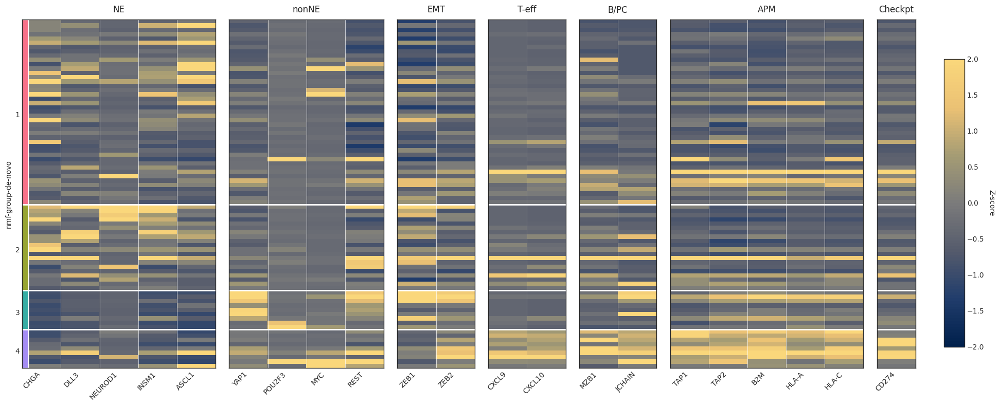

In [55]:
fig = plot_gene_expression_heatmap(
    adata=adata_nmf,
    genes_to_plot=genes_to_plot,
    gene_categories=gene_categories,
    group_column='nmf-group-de-novo'
)

In [57]:
adata_nmf

AnnData object with n_obs × n_vars = 81 × 8768
    obs: 'ID_Sample', 'StudyID', 'External_ID', 'Organ', 'SampleType', 'Diagnosis', 'Stage', 'AnyPlasma', 'Arm', 'Project_ID', 'Organism', 'Sample_Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'Elution.volume..uL.', 'RNA.con.ng.uL', 'Isolation.kit', 'BiopsyVsBehstart', 'pasnr', 'hospital', 'birth_date', 'radio_arm', 'tnm_staging', 'start_date', 'death_date', 'death_date_v2', 'ink_1', 'sex', 'age', 'pf', 'age70', 'actualrandarm', 'randarm', 'age65', 'status', 'brain_metastasis', 'chemo_1', 'chemo_2', 'chemo_3', 'chemo_4', 'no_chemo', 'trt', 'radio_dose', 'royk', 'performance_status', 'performance_status_2023', 'overall_survival', 'progression_status', 'progression', 'progression_date', 'updated_pfs', 'status_pfs', 'status_ttp', 'status_os', 'ttp_05_24', 'pfs_2023', 'start_strale', 'end_strale', 'ttp_2023_taha', 'pfs_date', 'ttp_date', 'os_date', 'pfs_corr', 'ttp_corr', 'os_corr', '

##### Add subtypes

In [74]:

finding_subtype_mapping = {
    1: "A",
    2: "N",
    3: "I-nNE",
    4: "I-NE"
}

# Create new columns based on the mappings
adata_nmf.obs["SCLC-Subtype-de-novo"] = adata_nmf.obs["nmf-group-de-novo"].astype(int).map(finding_subtype_mapping)


In [79]:
adata_nmf.obs.rename(columns={1:"NMF_A_de_novo",2:"NMF_N_de_novo",3:"NMF_I_nNE_de_novo",4:"NMF_I_NE_de_novo"},inplace=True)


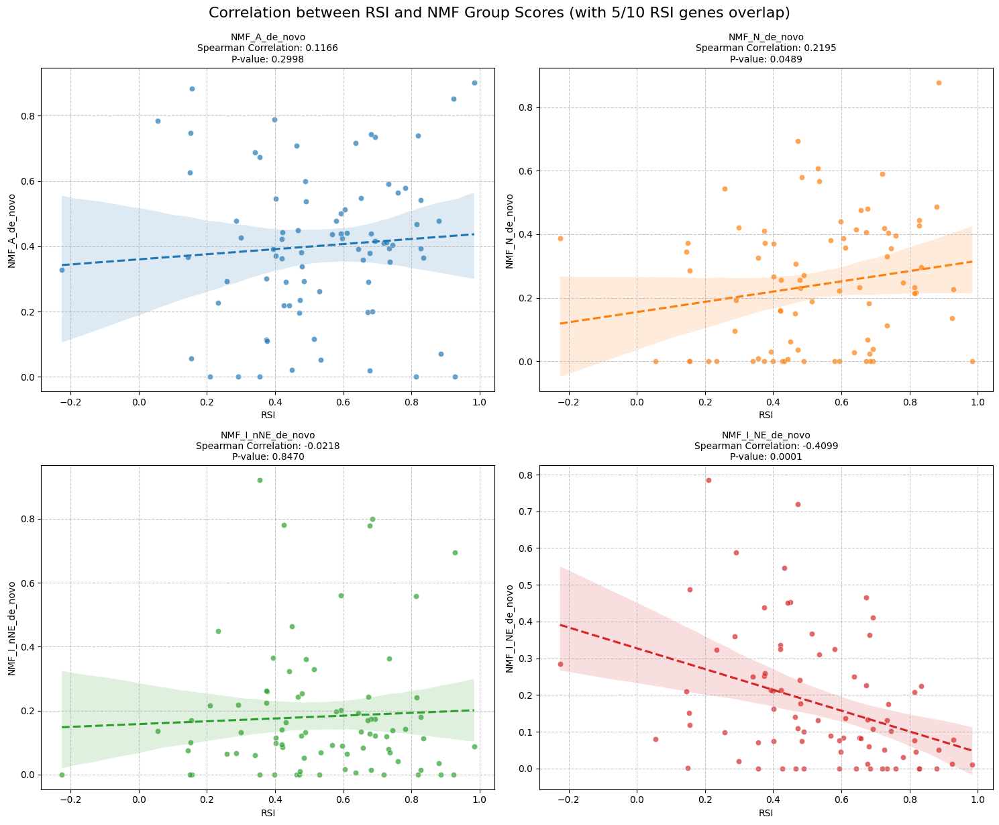

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# List of NMF groups
nmfs = ["NMF_A_de_novo", "NMF_N_de_novo", "NMF_I_nNE_de_novo", "NMF_I_NE_de_novo"]

# Create a figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()  # Flatten the 2x2 array for easy iteration

# Color palette
colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']

# Iterate through NMF groups and plot
for i, nmf in enumerate(nmfs):
    # Calculate Spearman correlation and p-value
    correlation, p_value = stats.spearmanr(adata_nmf.obs['RSI'], adata_nmf.obs[nmf])
    
    # Create scatter plot
    sns.scatterplot(
        x='RSI', 
        y=nmf, 
        data=adata_nmf.obs, 
        ax=axes[i],
        color=colors[i],
        alpha=0.7
    )
    
    # Add regression line
    sns.regplot(
        x='RSI', 
        y=nmf, 
        data=adata_nmf.obs, 
        ax=axes[i], 
        scatter=False,
        color=colors[i],
        line_kws={'linestyle':'--'}
    )
    
    # Set title with correlation and p-value
    axes[i].set_title(
        f'{nmf}\n'
        f'Spearman Correlation: {correlation:.4f}\n'
        f'P-value: {p_value:.4f}', 
        fontsize=10
    )
    
    # Add grid
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Adjust layout and add overall title
plt.tight_layout()
fig.suptitle('Correlation between RSI and NMF Group Scores (with 5/10 RSI genes overlap)', fontsize=16, y=1.02)

# Save the plot
plt.savefig('/home/rafaed/work/RO_src/Projects/THORA/StatisticalAnalysis/figures/RSI_NMF_Correlation.png', 
            bbox_inches='tight', dpi=300)

plt.show()

In [62]:
adata_nmf = prepare_for_saving(adata_nmf)
adata_nmf.obs.rename(columns={1:"NMF_A_de_novo",2:"NMF_N_de_novo",3:"NMF_I_nNE_de_novo",4:"NMF_I_NE_de_novo"},inplace=True)
adata_nmf.write_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")

... storing 'birth_date' as categorical
... storing 'start_date' as categorical
... storing 'death_date' as categorical
... storing 'death_date_v2' as categorical
... storing 'ink_1' as categorical
... storing 'chemo_1' as categorical
... storing 'chemo_2' as categorical
... storing 'chemo_3' as categorical
... storing 'chemo_4' as categorical
... storing 'progression' as categorical
... storing 'progression_date' as categorical
... storing 'updated_pfs' as categorical
... storing 'start_strale' as categorical
... storing 'end_strale' as categorical
... storing 'pfs_date' as categorical
... storing 'ttp_date' as categorical
... storing 'os_date' as categorical
... storing 'strale_2' as categorical
... storing 'start_strale_2' as categorical
... storing 'date_biopsy' as categorical
... storing 'SCLC-Subtype-de-novo' as categorical


##### Confusion Matrix 

In [35]:
#adata_subset = sc.read_h5ad(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_subset_cp_81_samp.h5ad")
#adata_subset = revert_from_conversion(adata_subset)
adata_nmf = sc.read_h5ad(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
adata_nmf = revert_from_conversion(adata_nmf)

KeyError: '1'

##### Get mean expression by subtype

In [45]:
adata_nmf_mean_exp = adata_nmf.copy()

adata_nmf_mean_exp.X = adata_nmf.layers["lognormalized_counts"]

# Assuming `adata_nmf.X` is a NumPy array, `adata_nmf.obs` is a DataFrame, and `adata_nmf.var` contains gene identifiers.
# Create the DataFrame
df = pd.DataFrame(
    adata_nmf_mean_exp.X, 
    index=pd.MultiIndex.from_arrays([adata_nmf_mean_exp.obs.index, adata_nmf_mean_exp.obs["SCLC-Subtype-de-novo"]], names=["Sample", "Subtype"]),
    columns=adata_nmf_mean_exp.var.index    
)

# Group by the subtype
grouped = df.groupby(level="Subtype")

# Calculate the mean expression for each subtype
mean_expression = grouped.mean()
mean_expression_transposed = mean_expression.T

# `mean_expression` will now contain the mean expression for each subtype for all genes
mean_expression_transposed.to_excel("./de_novo_NMF_mean_log_norm_exp.xlsx")

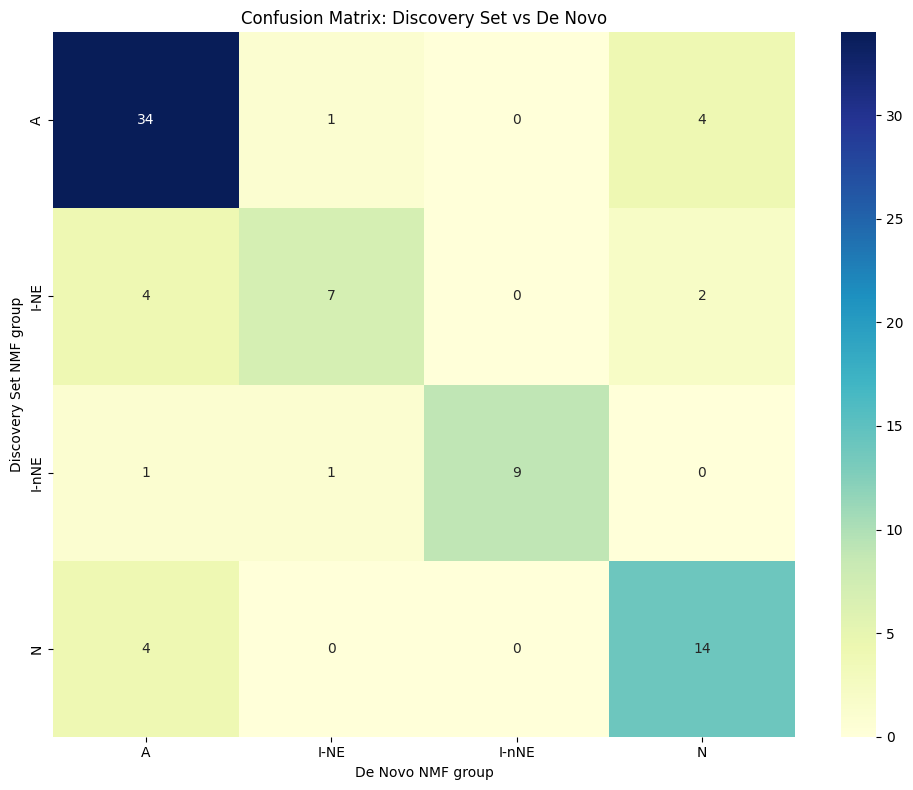

In [61]:
old_subtyping = {
    1: "A",
    2: "N",
    3: "I-NE",
    4: "I-nNE"
}

finding_subtype_mapping = {
    1: "A",
    2: "N",
    3: "I-nNE",
    4: "I-NE"
}

# Create new columns based on the mappings
#adata_subset.obs["SCLC-Subtype"] = adata_subset.obs["nmf-group-subset"].astype(int).map(old_subtyping)
#adata_nmf.obs["SCLC-Subtype"] = adata_nmf.obs["nmf-group-de-novo"].astype(int).map(finding_subtype_mapping)

# Plot confusion matrix
confusion_matrix = pd.crosstab(adata_subset.obs["SCLC-Subtype-subset"], adata_nmf.obs["SCLC-Subtype-de-novo"])


plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Confusion Matrix: Discovery Set vs De Novo')
plt.xlabel('De Novo NMF group')
plt.ylabel('Discovery Set NMF group')
plt.tight_layout()
plt.show()

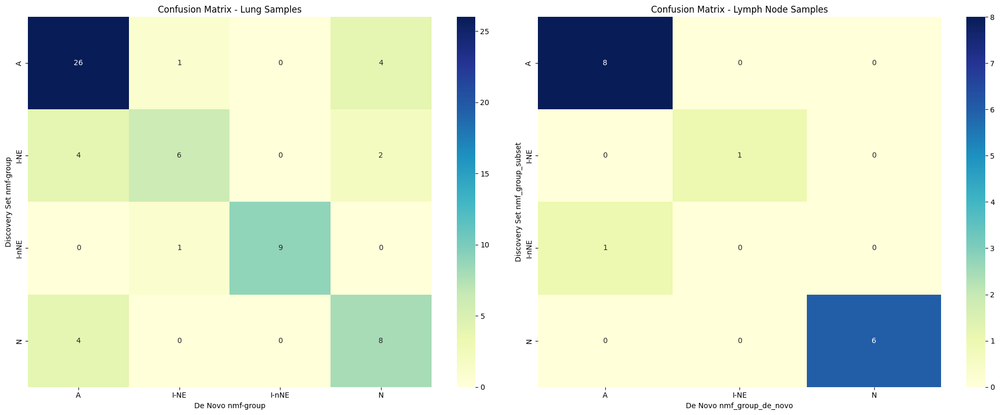


Lung Confusion Matrix:
SCLC-Subtype-de-novo   A  I-NE  I-nNE  N
SCLC-Subtype-subset                     
A                     26     1      0  4
I-NE                   4     6      0  2
I-nNE                  0     1      9  0
N                      4     0      0  8

Sample counts for Lung:
Discovery Set: 65
De Novo: 65

Lymph Node Confusion Matrix:
SCLC-Subtype-de-novo  A  I-NE  N
SCLC-Subtype-subset             
A                     8     0  0
I-NE                  0     1  0
I-nNE                 1     0  0
N                     0     0  6

Sample counts for Lymph node:
Discovery Set: 16
De Novo: 16


In [62]:
# First, ensure NMF groups are assigned
adata_nmf.obs['nmf-group-de-novo'] = usage_matrix_nmf_var.idxmax(axis=1).astype(str)

# Create new columns based on the mappings
adata_subset.obs["SCLC-Subtype"] = adata_subset.obs["nmf-group"].astype(int).map(old_subtyping)
adata_nmf.obs["SCLC-Subtype-de-novo"] = adata_nmf.obs["nmf-group-de-novo"].astype(int).map(finding_subtype_mapping)

# Create separate confusion matrices for lung and lymph
plt.figure(figsize=(20, 8))

# Lung confusion matrix
plt.subplot(1, 2, 1)
lung_confusion = pd.crosstab(
    adata_subset.obs.loc[adata_subset.obs['Organ'] == 'Lung', "SCLC-Subtype-subset"],
    adata_nmf.obs.loc[adata_nmf.obs['Organ'] == 'Lung', "SCLC-Subtype-de-novo"]
)
if not lung_confusion.empty:
    sns.heatmap(lung_confusion, annot=True, fmt='d', cmap='YlGnBu')
    plt.title('Confusion Matrix - Lung Samples')
    plt.xlabel('De Novo nmf-group')
    plt.ylabel('Discovery Set nmf-group')
else:
    plt.text(0.5, 0.5, 'No lung samples found', ha='center', va='center')
    plt.title('Lung Samples (Empty)')

# Lymph confusion matrix
plt.subplot(1, 2, 2)
lymph_confusion = pd.crosstab(
    adata_subset.obs.loc[adata_subset.obs['Organ'] == 'Lymph Node', "SCLC-Subtype-subset"],
    adata_nmf.obs.loc[adata_nmf.obs['Organ'] == 'Lymph Node', "SCLC-Subtype-de-novo"]
)
if not lymph_confusion.empty:
    sns.heatmap(lymph_confusion, annot=True, fmt='d', cmap='YlGnBu')
    plt.title('Confusion Matrix - Lymph Node Samples')
    plt.xlabel('De Novo nmf_group_de_novo')
    plt.ylabel('Discovery Set nmf_group_subset')
else:
    plt.text(0.5, 0.5, 'No lymph node samples found', ha='center', va='center')
    plt.title('Lymph Node Samples (Empty)')

plt.tight_layout()
plt.show()

# Print the actual matrices and sample counts
print("\nLung Confusion Matrix:")
print(lung_confusion if not lung_confusion.empty else "No lung samples found")  
print("\nSample counts for Lung:")
print("Discovery Set:", len(adata_subset.obs[adata_subset.obs['Organ'] == 'Lung']))
print("De Novo:", len(adata_nmf.obs[adata_nmf.obs['Organ'] == 'Lung']))

print("\nLymph Node Confusion Matrix:")
print(lymph_confusion if not lymph_confusion.empty else "No lymph node samples found")
print("\nSample counts for Lymph node:")
print("Discovery Set:", len(adata_subset.obs[adata_subset.obs['Organ'] == 'Lymph Node']))
print("De Novo:", len(adata_nmf.obs[adata_nmf.obs['Organ'] == 'Lymph Node']))

Contingency Table:
            Wrong  Right  Total
Organ                          
Lung           16     49     65
Lymph Node      1     15     16
All            17     64     81

Fisher's Exact Test Results:
P-value: 0.171


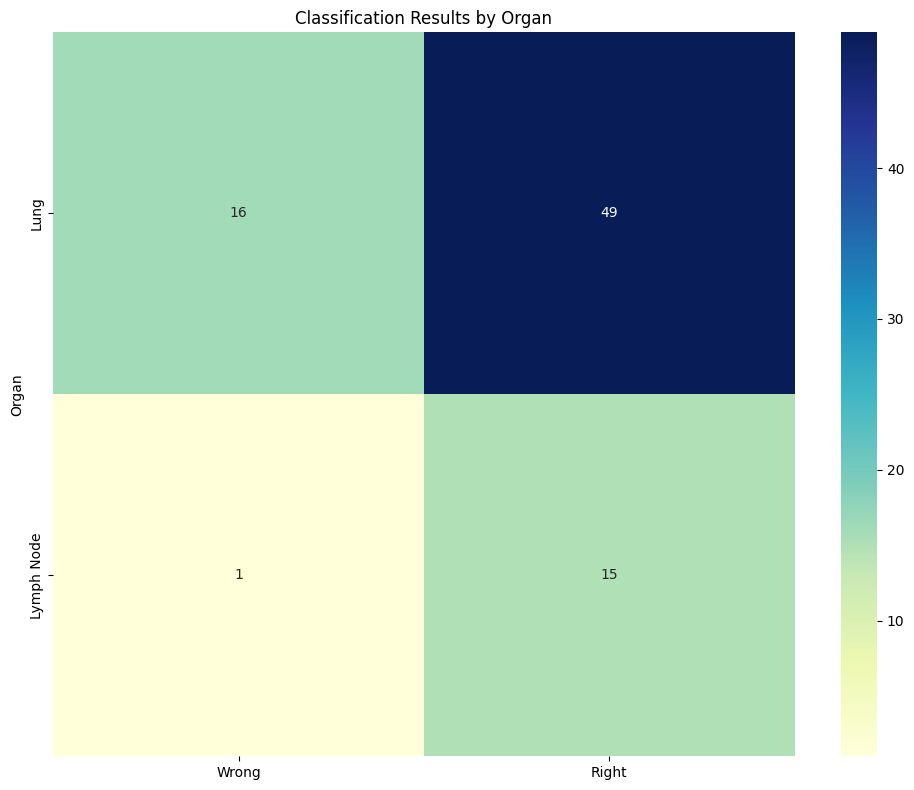


Accuracy Percentages:
Lung: 75.4% correct (49/65)
Lymph Node: 93.8% correct (15/16)


In [63]:
from scipy.stats import fisher_exact

# Create a function to determine if classification is correct
def is_correct_classification(row):
    return row['SCLC-Subtype-subset'] == row['SCLC-Subtype-de-novo']

# Merge the two datasets
merged_df = pd.merge(
    adata_subset.obs[['Organ', 'SCLC-Subtype-subset']].reset_index(),
    adata_nmf.obs[['SCLC-Subtype-de-novo']].reset_index(),
    left_on='index',
    right_on='index'
)

# Add classification result column
merged_df['Correct'] = merged_df['SCLC-Subtype-subset'] == merged_df['SCLC-Subtype-de-novo']

# Create contingency table
contingency = pd.crosstab(
    merged_df['Organ'],
    merged_df['Correct'],
    margins=True
)

# Rename columns for clarity
contingency.columns = ['Wrong', 'Right', 'Total']
contingency.index.name = 'Organ'

# Perform Fisher's exact test
fisher_matrix = contingency.loc[['Lung', 'Lymph Node'], ['Wrong', 'Right']].values
odds_ratio, p_value = fisher_exact(fisher_matrix)

print("Contingency Table:")
print(contingency)
print("\nFisher's Exact Test Results:")
#print(f"Odds Ratio: {odds_ratio:.3f}")
print(f"P-value: {p_value:.3f}")  # p-value > 0.05 - This means the difference in classification accuracy from the NMF between organs in the subset vs de novo is not statistically significant. While lymph nodes show higher accuracy, the difference is not statistically significant


# Create a heatmap of the contingency table (excluding totals)
plt.figure(figsize=(10, 8))
sns.heatmap(
    contingency.loc[['Lung', 'Lymph Node'], ['Wrong', 'Right']],
    annot=True,
    fmt='d',
    cmap='YlGnBu'
)
plt.title('Classification Results by Organ')
plt.tight_layout()
plt.show()

# Calculate and display percentages
print("\nAccuracy Percentages:")
for organ in ['Lung', 'Lymph Node']:
    total = contingency.loc[organ, 'Total']
    correct = contingency.loc[organ, 'Right']
    print(f"{organ}: {correct/total*100:.1f}% correct ({correct}/{total})")

##### Radial Plot

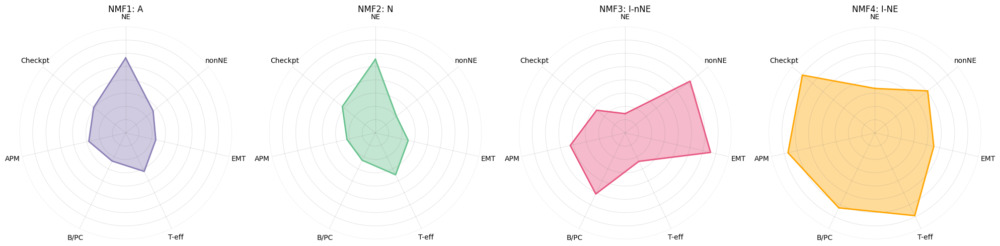


Normalized scores for each group:
                   NE_score  nonNE_score  EMT_score  T-eff_score  B/PC_score  \
nmf-group-de-novo                                                              
1                      0.82        -0.68      -0.84        -0.39       -0.83   
2                      0.77        -0.99      -0.73        -0.25       -0.86   
3                     -1.27         1.13       1.30        -0.81        0.55   
4                     -0.32         0.54       0.27         1.46        1.13   

                   APM_score  Checkpt_score  
nmf-group-de-novo                            
1                      -0.58          -0.46  
2                      -0.90          -0.41  
3                       0.12          -0.63  
4                       1.36           1.49  


In [64]:
# Create a copy of adata_subset
adata_analysis_radial = adata_nmf.copy()
adata_analysis_radial.obs = adata_analysis_radial.obs[["NMF_A_de_novo","NMF_N_de_novo","NMF_I_nNE_de_novo","NMF_I_NE_de_novo","nmf-group-de-novo"]]

# Ensure we're working with raw counts
adata_analysis_radial.X = adata_analysis_radial.layers["raw_counts"].copy()

# Normalize, log-transform, and scale the data
sc.pp.normalize_total(adata_analysis_radial, target_sum=1e6)
sc.pp.log1p(adata_analysis_radial)
sc.pp.scale(adata_analysis_radial)

# Add gene categories
gene_categories = {
    'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
    'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
}

# Compute scores for each category
for category, genes in gene_categories.items():
    sc.tl.score_genes(adata_analysis_radial, genes, score_name=f'{category}_score')

# Calculate mean scores for each NMF group
nmf_scores = adata_analysis_radial.obs.groupby('nmf-group-de-novo').mean()

# Normalize scores (Z-score across subsets)
score_columns = [f'{cat}_score' for cat in gene_categories.keys()]
nmf_scores_norm = (nmf_scores[score_columns] - nmf_scores[score_columns].mean()) / nmf_scores[score_columns].std()

# Define NMF labels
nmf_labels = {
    '1': 'A',
    '2': 'N',
    '3': 'I-nNE',
    '4': 'I-NE',
}

# Colors for each NMF group
colors = ['#8A7EB5', '#67C28E', '#E75480', '#FFA500']

# # Version 1: With scale numbers
# plt.figure(figsize=(20, 5))
# for i, nmf_group in enumerate(sorted(nmf_scores_norm.index)):
#     plt.subplot(1, 4, i+1, projection='polar')
#     data = nmf_scores_norm.loc[nmf_group, score_columns].to_frame().T
#     label = nmf_labels.get(nmf_group, nmf_group)
    
#     N = len(gene_categories)
#     angles = [n / float(N) * 2 * np.pi for n in range(N)]
#     angles += angles[:1]
    
#     ax = plt.gca()
#     ax.set_theta_offset(np.pi / 2)
#     ax.set_theta_direction(-1)
    
#     plt.xticks(angles[:-1], gene_categories.keys(), size=10)
    
#     # Set the limits and scale
#     plt.ylim(-2, 2)
#     ax.set_rlabel_position(0)
#     plt.yticks([-2, -1, 0, 1, 2], ["-2", "-1", "0", "1", "2"], color="grey", size=8)
    
#     values = data.values.flatten().tolist()
#     values += values[:1]
#     ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i])
#     ax.fill(angles, values, color=colors[i], alpha=0.4)
    
#     ax.grid(True, color='grey', alpha=0.2)
#     ax.spines['polar'].set_visible(False)
    
#     plt.title(f'NMF{nmf_group}: {label}', size=12, y=1.05)

# plt.tight_layout()
# plt.show()

# Version 2: Without scale numbers (cleaner version)
plt.figure(figsize=(20, 5))
for i, nmf_group in enumerate(sorted(nmf_scores_norm.index)):
    plt.subplot(1, 4, i+1, projection='polar')
    data = nmf_scores_norm.loc[nmf_group, score_columns].to_frame().T
    label = nmf_labels.get(nmf_group, nmf_group)
    
    N = len(gene_categories)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.gca()
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    
    plt.xticks(angles[:-1], gene_categories.keys(), size=10)
    
    # Set the limits but hide the scale
    plt.ylim(-2, 2)
    ax.set_yticklabels([])  # Hide scale numbers
    
    values = data.values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i])
    ax.fill(angles, values, color=colors[i], alpha=0.4)
    
    ax.grid(True, color='grey', alpha=0.2)
    ax.spines['polar'].set_visible(False)
    
    plt.title(f'NMF{nmf_group}: {label}', size=12, y=1.05)

plt.tight_layout()
plt.show()

# Print the actual values for verification
print("\nNormalized scores for each group:")
print(nmf_scores_norm.round(2))

##### DEG 

In [65]:
# Initialize and run the analysis
deg_analysis_new = DEGAnalysis(adata_nmf, design_factor='nmf-group-de-novo', layer='raw_counts', output_dir="./deg_analysis_results_de_novo")
deg_analysis_new.create_dds()
deg_analysis_new.run_comparisons()

/tmp/ipykernel_1549987/115626795.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 1.08 seconds.

Fitting dispersion trend curve...
... done in 3.56 seconds.

Fitting MAP dispersions...
... done in 1.17 seconds.

Fitting LFCs...
... done in 1.27 seconds.

Refitting 149 outliers.

Fitting dispersions...
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 1 vs 2


... done in 1.01 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,-0.353388,0.203178,-1.739300,0.081982,0.424834
C1ORF112,238.659353,-0.277901,0.197740,-1.405386,0.159906,0.569480
CFH,299.699811,0.380523,0.236154,1.611331,0.107108,0.481353
FUCA2,62.511314,0.273092,0.253437,1.077554,0.281233,0.696177
GCLC,390.345122,0.904954,0.282030,3.208711,0.001333,0.041603
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.702985,0.368527,1.907551,0.056449,0.360223
ENSG00000291272,213.172910,0.191531,0.210693,0.909055,0.363321,0.763902
ENSG00000291275,74.778043,0.295487,0.269432,1.096705,0.272770,0.689893


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 1 vs 3


... done in 0.99 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,-0.316091,0.275560,-1.147087,2.513457e-01,3.990943e-01
C1ORF112,238.659353,0.749053,0.269817,2.776154,5.500607e-03,2.091471e-02
CFH,299.699811,-2.066587,0.318390,-6.490733,8.541982e-11,1.248268e-08
FUCA2,62.511314,-0.427010,0.341936,-1.248802,2.117376e-01,3.529497e-01
GCLC,390.345122,0.135059,0.381704,0.353831,7.234653e-01,8.239179e-01
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.089908,0.498744,0.180268,8.569424e-01,9.137384e-01
ENSG00000291272,213.172910,-0.179199,0.285298,-0.628113,5.299298e-01,6.698997e-01
ENSG00000291275,74.778043,0.504700,0.366856,1.375746,1.689002e-01,2.983314e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 1 vs 4


... done in 0.94 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,-0.096616,0.275495,-0.350701,0.725813,0.853760
C1ORF112,238.659353,0.123680,0.268234,0.461090,0.644734,0.806938
CFH,299.699811,-0.488620,0.319059,-1.531439,0.125661,0.311454
FUCA2,62.511314,-0.473761,0.341032,-1.389196,0.164773,0.367638
GCLC,390.345122,-1.368972,0.380973,-3.593356,0.000326,0.005736
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.364634,0.498772,0.731064,0.464740,0.678574
ENSG00000291272,213.172910,0.189503,0.285446,0.663883,0.506766,0.710249
ENSG00000291275,74.778043,0.548934,0.366030,1.499696,0.133693,0.324207


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 2 vs 3


... done in 0.93 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,0.037297,0.301336,0.123771,9.014967e-01,9.375309e-01
C1ORF112,238.659353,1.026954,0.294882,3.482597,4.965753e-04,2.849458e-03
CFH,299.699811,-2.447110,0.348896,-7.013866,2.318212e-12,7.008994e-10
FUCA2,62.511314,-0.700102,0.374519,-1.869338,6.157586e-02,1.369602e-01
GCLC,390.345122,-0.769895,0.418121,-1.841322,6.557439e-02,1.439550e-01
...,...,...,...,...,...,...
ENSG00000291266,97.650973,-0.613077,0.546344,-1.122145,2.618006e-01,4.052733e-01
ENSG00000291272,213.172910,-0.370731,0.312337,-1.186957,2.352447e-01,3.742743e-01
ENSG00000291275,74.778043,0.209213,0.401277,0.521368,6.021105e-01,7.243832e-01


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 2 vs 4


... done in 0.97 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,0.256772,0.301277,0.852279,3.940590e-01,0.606031
C1ORF112,238.659353,0.401581,0.293434,1.368557,1.711378e-01,0.359410
CFH,299.699811,-0.869142,0.349506,-2.486771,1.289083e-02,0.061595
FUCA2,62.511314,-0.746853,0.373694,-1.998568,4.565514e-02,0.148206
GCLC,390.345122,-2.273925,0.417453,-5.447135,5.118755e-08,0.000008
...,...,...,...,...,...,...
ENSG00000291266,97.650973,-0.338351,0.546369,-0.619271,5.357376e-01,0.726381
ENSG00000291272,213.172910,-0.002028,0.312473,-0.006492,9.948204e-01,0.996639
ENSG00000291275,74.778043,0.253447,0.400522,0.632791,5.268699e-01,0.718779


Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 3 vs 4


... done in 0.89 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,0.219475,0.354146,0.619730,0.535435,0.821325
C1ORF112,238.659353,-0.625373,0.346126,-1.806778,0.070797,0.365485
CFH,299.699811,1.577967,0.409583,3.852617,0.000117,0.016264
FUCA2,62.511314,-0.046751,0.438563,-0.106600,0.915106,0.976469
GCLC,390.345122,-1.504030,0.490331,-3.067379,0.002159,0.074543
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.274727,0.641446,0.428293,0.668438,0.891269
ENSG00000291272,213.172910,0.368702,0.366937,1.004811,0.314988,0.668073
ENSG00000291275,74.778043,0.044234,0.471601,0.093796,0.925271,0.979550


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 1.10 seconds.

Fitting dispersion trend curve...
... done in 3.48 seconds.

Fitting MAP dispersions...
... done in 1.78 seconds.

Fitting LFCs...
... done in 0.96 seconds.

Refitting 170 outliers.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.08 seconds.

Fitting LFCs...
... done in 0.09 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 1 vs rest


... done in 1.05 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,-0.287431,0.166803,-1.723169,0.084858,0.260790
C1ORF112,238.659353,0.004666,0.171865,0.027152,0.978339,0.990914
CFH,299.699811,-0.787921,0.242325,-3.251501,0.001148,0.017076
FUCA2,62.511314,-0.114144,0.213685,-0.534170,0.593224,0.789389
GCLC,343.062199,0.256334,0.234253,1.094260,0.273841,0.530317
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.455174,0.302927,1.502587,0.132946,0.344584
ENSG00000291272,213.172910,0.094674,0.173758,0.544860,0.585850,0.784593
ENSG00000291275,74.778043,0.400117,0.220828,1.811895,0.070002,0.230485


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 1.03 seconds.

Fitting dispersion trend curve...
... done in 3.21 seconds.

Fitting MAP dispersions...
... done in 1.19 seconds.

Fitting LFCs...
... done in 0.93 seconds.

Refitting 148 outliers.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 2 vs rest


... done in 1.26 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,0.287746,0.193567,1.486548,0.137134,0.346973
C1ORF112,238.659353,0.385632,0.194179,1.985965,0.047037,0.179277
CFH,299.699811,-0.995061,0.279977,-3.554087,0.000379,0.008937
FUCA2,62.511314,-0.421578,0.243518,-1.731194,0.083417,0.256343
GCLC,390.345122,-1.192772,0.289027,-4.126859,0.000037,0.002152
...,...,...,...,...,...,...
ENSG00000291266,97.650973,-0.641149,0.349357,-1.835224,0.066473,0.224038
ENSG00000291272,213.172910,-0.193367,0.200300,-0.965386,0.334351,0.576973
ENSG00000291275,74.778043,-0.158303,0.259083,-0.611014,0.541191,0.751426


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.95 seconds.

Fitting dispersion trend curve...
... done in 3.43 seconds.

Fitting MAP dispersions...
... done in 1.16 seconds.

Fitting LFCs...
... done in 0.93 seconds.

Refitting 155 outliers.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 3 vs rest


... done in 0.92 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,0.196778,0.268339,0.733317,4.633652e-01,6.181194e-01
C1ORF112,238.659353,-0.817990,0.262083,-3.121107,1.801726e-03,9.562671e-03
CFH,299.699811,2.087131,0.315428,6.616825,3.669966e-11,9.193789e-09
FUCA2,62.511314,0.426190,0.335001,1.272206,2.033001e-01,3.508927e-01
GCLC,390.345122,-0.230402,0.422051,-0.545912,5.851267e-01,7.209025e-01
...,...,...,...,...,...,...
ENSG00000291266,97.650973,0.120120,0.485646,0.247340,8.046451e-01,8.799807e-01
ENSG00000291272,213.172910,0.253232,0.274390,0.922889,3.560651e-01,5.182567e-01
ENSG00000291275,74.778043,-0.366033,0.355810,-1.028733,3.036051e-01,4.635225e-01


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.90 seconds.

Fitting dispersion trend curve...
... done in 3.25 seconds.

Fitting MAP dispersions...
... done in 1.16 seconds.

Fitting LFCs...
... done in 1.22 seconds.

Refitting 177 outliers.

Fitting dispersions...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.08 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: nmf-group-de-novo 4 vs rest


... done in 0.91 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_identifier,,,,,,
TSPAN6,172.046674,-0.051706,0.269591,-0.191794,0.847904,0.938139
C1ORF112,238.659353,-0.135630,0.272501,-0.497725,0.618678,0.815357
CFH,299.699811,0.072749,0.403872,0.180129,0.857051,0.941290
FUCA2,62.511314,0.481489,0.333220,1.444956,0.148470,0.391021
GCLC,390.345122,1.587798,0.382645,4.149533,0.000033,0.001987
...,...,...,...,...,...,...
ENSG00000291266,97.650973,-0.188234,0.486177,-0.387173,0.698628,0.863945
ENSG00000291272,213.172910,-0.163070,0.275856,-0.591141,0.554426,0.772970
ENSG00000291275,74.778043,-0.414956,0.354880,-1.169285,0.242289,0.519261


Using all significant genes instead.


/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_1549987/115626795.py:318: UserWarning: The figure layout has changed to tight


Error creating clustermap for 1_vs_rest: 'rest'
Error creating clustermap for 2_vs_rest: NaN dissimilarity value.
Error creating clustermap for 3_vs_rest: 'rest'
Error creating clustermap for 4_vs_rest: NaN dissimilarity value.
Saved results for 1_vs_2 to ./deg_analysis_results_de_novo/deg_results_1_vs_2.csv
Saved results for 1_vs_3 to ./deg_analysis_results_de_novo/deg_results_1_vs_3.csv
Saved results for 1_vs_4 to ./deg_analysis_results_de_novo/deg_results_1_vs_4.csv
Saved results for 2_vs_3 to ./deg_analysis_results_de_novo/deg_results_2_vs_3.csv
Saved results for 2_vs_4 to ./deg_analysis_results_de_novo/deg_results_2_vs_4.csv
Saved results for 3_vs_4 to ./deg_analysis_results_de_novo/deg_results_3_vs_4.csv
Saved results for 1_vs_rest to ./deg_analysis_results_de_novo/deg_results_1_vs_rest.csv
Saved results for 2_vs_rest to ./deg_analysis_results_de_novo/deg_results_2_vs_rest.csv
Saved results for 3_vs_rest to ./deg_analysis_results_de_novo/deg_results_3_vs_rest.csv
Saved results fo

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

<Figure size 3000x5060 with 0 Axes>

<Figure size 3000x1860 with 0 Axes>

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1800 with 0 Axes>

<Figure size 3000x1600 with 0 Axes>

<Figure size 3000x1540 with 0 Axes>

<Figure size 3000x1580 with 0 Axes>

<Figure size 3000x1540 with 0 Axes>

<Figure size 3000x1820 with 0 Axes>

<Figure size 3000x1540 with 0 Axes>

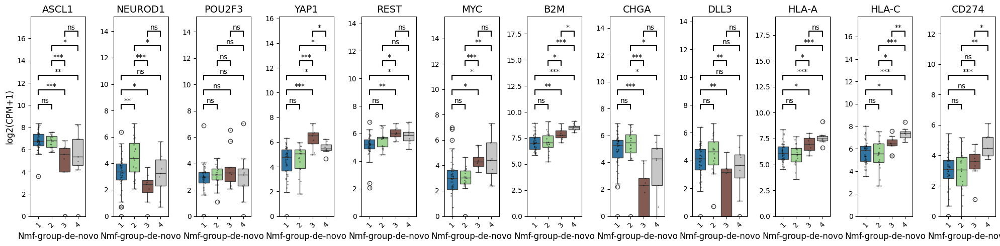

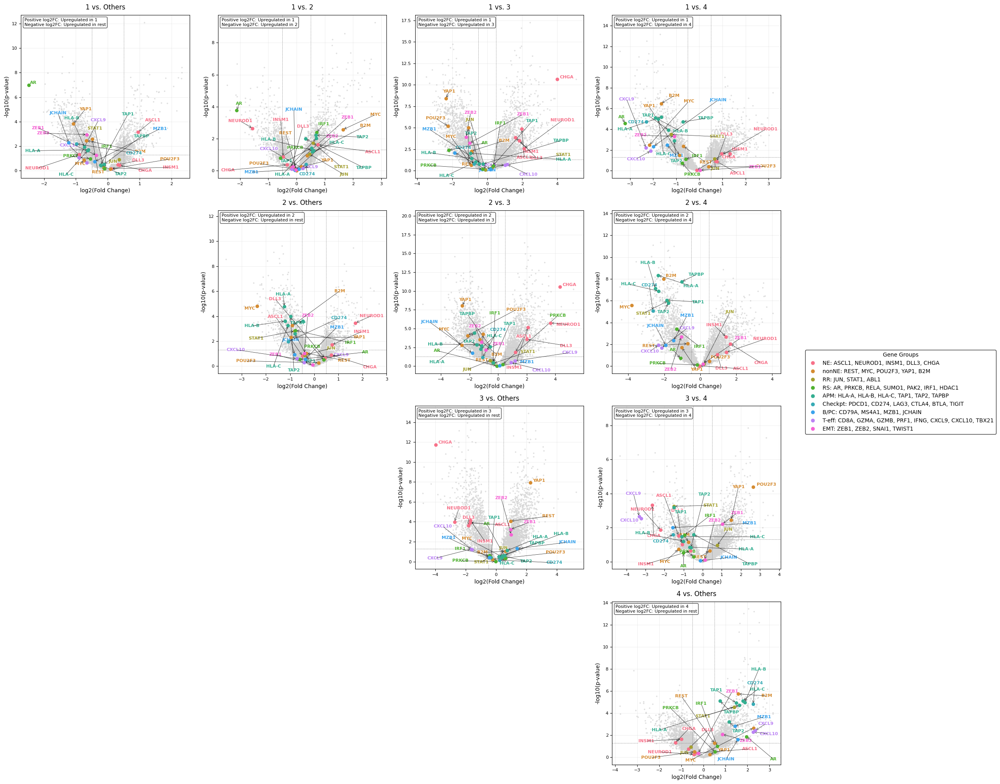

In [66]:

deg_analysis_new.create_clustermaps(marker_list=marker_genes)
deg_analysis_new.save_results()
deg_analysis_new.create_boxplots(["ASCL1", "NEUROD1", "POU2F3", "YAP1", "REST", "MYC","B2M","CHGA","DLL3","HLA-A","HLA-C","CD274"], save_path="/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/deg_analysis_results_de_novo/marker_boxplots_new.png")
# Define highlight dictionary
highlight_dict = {
    "NE": ["ASCL1", "NEUROD1", "INSM1", "DLL3", "CHGA"],
    "nonNE": ["REST", "MYC", "POU2F3", "YAP1",
    "RR": ["JUN", "STAT1", "ABL1"],
    "RS": ["AR", "PRKCB", "RELA", "SUMO1", "PAK2", "IRF1", "HDAC1"],
    "APM": ['HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2', 'TAPBP',"B2M"],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],

}

# Create volcano grid with highlighted genes
deg_analysis_new.create_volcano_grid(highlight_dict=highlight_dict)
results_nmf_new = deg_analysis_new.get_results()


##### Functional Analysis

In [ ]:
# Define your custom gene sets
custom_gene_sets = {"NE": ["ASCL1", "NEUROD1","INSM1","DLL3","CHGA","SYP"], "nonNE": ["REST", "MYC","POU2F3", "YAP1"],"RR":["JUN","STAT1","ABL1"],"RS":["AR","PRKCB","RELA","SUMO1","PAK2","IRF1","HDAC1"],"APM":['HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2', 'TAPBP']}

# Initialize and run the analysis
functional_analysis = FunctionalAnalysis(adata_nmf, results_nmf_new)
functional_analysis.run_custom_analysis(custom_gene_sets)
enrichment_results = functional_analysis.get_results()

In [ ]:
functional_analysis = FunctionalAnalysis(adata_nmf,results_nmf_new)
functional_analysis.run_analysis()
enrichment_results = functional_analysis.get_results()

### RSI against SCLC Subtype

Boxplot saved to rsi_by_sclc_subtype_boxplot_ordered.png


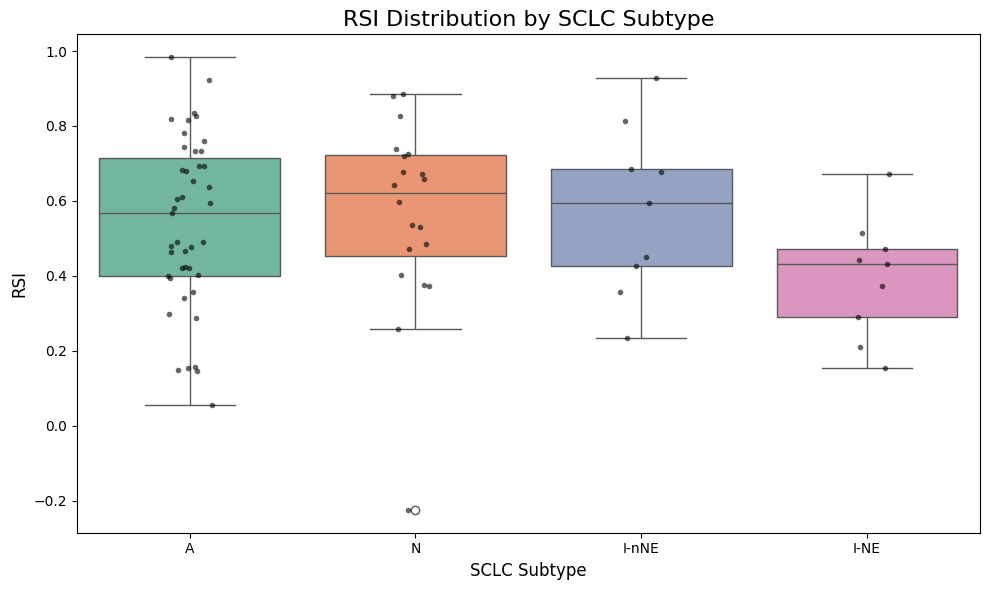

                      count      mean       std       min       25%       50%  \
SCLC-Subtype-de-novo                                                            
A                      43.0  0.539878  0.227731  0.054958  0.400194  0.568207   
N                      20.0  0.561365  0.253998 -0.225536  0.454038  0.620391   
I-nNE                   9.0  0.573608  0.225631  0.233634  0.425988  0.593260   
I-NE                    9.0  0.395714  0.159880  0.154019  0.290885  0.431833   

                           75%       max  
SCLC-Subtype-de-novo                      
A                     0.713219  0.984078  
N                     0.721251  0.885844  
I-nNE                 0.684939  0.928235  
I-NE                  0.472402  0.672826  


In [34]:

# Ensure RSI and SCLC-Subtype columns are present in adata_nmf.obs
if 'RSI' not in adata_nmf.obs.columns or 'SCLC-Subtype-de-novo' not in adata_nmf.obs.columns:
    print("Error: RSI or SCLC-Subtype column not found in adata_nmf.obs")
else:
    # Create a copy of the data and set the order of SCLC-Subtype
    plot_data = adata_nmf.obs[['SCLC-Subtype-de-novo', 'RSI']].copy()
    plot_data['SCLC-Subtype-de-novo'] = pd.Categorical(plot_data['SCLC-Subtype-de-novo'], categories=['A', 'N', 'I-nNE', 'I-NE'], ordered=True)
    
    # Create a figure and axis
    plt.figure(figsize=(10, 6))

    # Create the boxplot with individual points
    sns.boxplot(x='SCLC-Subtype-de-novo', y='RSI', data=plot_data, palette='Set2', order=['A', 'N', 'I-nNE', 'I-NE'])
    sns.stripplot(x='SCLC-Subtype-de-novo', y='RSI', data=plot_data, color='black', size=4, alpha=0.6, order=['A', 'N', 'I-nNE', 'I-NE'])

    # Customize the plot
    plt.title('RSI Distribution by SCLC Subtype', fontsize=16)
    plt.xlabel('SCLC Subtype', fontsize=12)
    plt.ylabel('RSI', fontsize=12)
    plt.xticks(rotation=0)  # Changed to 0 as it's not needed for single letters

    # Add some padding to the bottom of the plot
    plt.tight_layout()

    # Save the figure
    output_file = "rsi_by_sclc_subtype_boxplot_ordered.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Boxplot saved to {output_file}")

    # Show the plot
    plt.show()

    # Close the figure to free up memory
    plt.close()

    # Print summary statistics
    print(plot_data.groupby('SCLC-Subtype-de-novo')['RSI'].describe())

In [68]:
from scipy import stats

# Ensure RSI and NMF columns are present in adata_nmf.obs
if 'RSI' not in adata_nmf.obs.columns or 'NMF_I_NE_de_novo' not in adata_nmf.obs.columns:
    print("Error: RSI or NMF column not found in adata_nmf.obs")
else:
    correlation, p_value = stats.spearmanr(adata_nmf.obs['RSI'], adata_nmf.obs['NMF_I_NE_de_novo'])
    print(f"Correlation between NMF and RSI: {correlation:.4f}")
    print(f"P-value: {p_value:.4f}")

Correlation between NMF and RSI: -0.4099
P-value: 0.0001


##### Thus highly radiosensitive patients (those with a low radiosensitivity index)

Radiosensitive patients = low RSI
Radioresistant patients = high RSI


# Save subset and de novo NMF subtypes

In [69]:
adata_nmf_cp = adata_nmf.copy()
adata_subset_cp = adata_subset.copy()

In [59]:
adata_nmf_cp.obs.rename(columns={"nmf-group-de-novo": "nmf_group_de_novo", "SCLC-Subtype-de-novo": "SCLC_Subtype_de_novo"}, inplace=True)

In [72]:

# Prepare the AnnData object for saving
adata_nmf_cp = prepare_for_saving(adata_nmf_cp)

# Now try to save the AnnData object
try:
    adata_nmf_cp.write_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
    print("AnnData object saved successfully.")
except Exception as e:
    print(f"Error saving AnnData object: {str(e)}")

... storing 'nmf_group_de_novo' as categorical
... storing 'SCLC_Subtype_de_novo' as categorical


AnnData object saved successfully.


In [74]:
# Save nmf subset and nmf de novo
adata_nmf_cp.obs.to_csv("./nmf_de_novo.csv")

# Bulk deconvolution

## Loading scRNA data

In [35]:
import scanpy as sc
import celltypist
from celltypist import models
import numpy as np
import warnings
warnings.filterwarnings('ignore')

adata_subset = sc.read_h5ad(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_subset_cp_81_samp.h5ad")
adata_subset = revert_from_conversion(adata_subset)
adata_nmf = sc.read_h5ad(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
adata_nmf = revert_from_conversion(adata_nmf)

# Load data
print("Loading data...")
sc_adata = sc.read_h5ad(r"/mnt/archive2/RO_src/data/raw/scRNA/SCLC/SCLC_Annotated_pp.h5ad")

# Drop Neuroendocrine cells
sc_adata = sc_adata[sc_adata.obs["cell_type_fine"] != "Neuroendocrine"].copy()

# Setup layers and normalize
sc_adata.X = sc_adata.layers["raw_counts"].copy()
sc_adata.layers["normalized_counts"] = sc_adata.layers["raw_counts"].copy()
sc.pp.normalize_total(sc_adata, layer="normalized_counts", target_sum=1e4)
sc_adata.layers["lognormalized_counts"] = sc_adata.layers["normalized_counts"].copy()
sc.pp.log1p(sc_adata, layer="lognormalized_counts")
sc_adata.X = sc_adata.layers["lognormalized_counts"].copy()

# Normalize gene names
sc_adata.var_names = sc_adata.var_names.str.upper()
sc_adata.var.index = sc_adata.var.index.str.upper()

# Filter unwanted cell types and conditions
sc_adata = sc_adata[~sc_adata.obs["cell_type_fine"].isin(["Hepatocyte", "NSCLC"])]
sc_adata = sc_adata[
    sc_adata.obs["histo"].isin(["normal", "SCLC"]) &
    sc_adata.obs["tissue"].isin(["lung", "pleural effusion"]),
    :,
]


Loading data...


KeyboardInterrupt: 

In [ ]:
full_sc_lung_atlas = sc.read_h5ad(r"/mnt/archive2/RO_src/data/full_lung_atlas.h5ad")

## Finding subtypes in scRNA to check if they also exist in scRNA and compare with bulk

#### TF method

In [ ]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define the genes of interest
tf_genes = ['ASCL1', 'NEUROD1', 'POU2F3', 'REST']
apm_genes = ['HLA-A', 'HLA-B', 'HLA-C', 'TAP1', 'TAP2', 'TAPBP']
all_genes = tf_genes + apm_genes

# Extract the expression data for these genes
# We'll use the lognormalized_counts layer
expr_matrix = sc_adata[:, all_genes].layers['lognormalized_counts'].toarray()

# Create a DataFrame with the expression data
df = pd.DataFrame(expr_matrix, 
                 columns=all_genes,
                 index=sc_adata.obs.index)

# Create gene type annotations
gene_types = ['TF']*len(tf_genes) + ['APM']*len(apm_genes)
gene_colors = {'TF': 'blue', 'APM': 'red'}

# Create the heatmap
plt.figure(figsize=(15, 8))
g = sns.clustermap(df.T,
                  cmap='YlOrRd',
                  yticklabels=True,
                  xticklabels=False,
                  row_cluster=True,
                  col_cluster=True,
                  dendrogram_ratio=(.1, .2),
                  cbar_pos=(0.02, .2, .03, .4))

# Add gene type annotations
for idx, (gene, gene_type) in enumerate(zip(all_genes, gene_types)):
    g.ax_heatmap.set_yticklabels([f'{gene} ({gene_type})'])

plt.title('Gene Expression Heatmap: TF and APM Genes')
plt.tight_layout()
plt.show()

In [ ]:
sc_adata_cp = sc_adata.copy()
sc_adata_cp.X = sc_adata_cp.layers["lognormalized_counts"].copy()

# Convert sparse matrix to dense array for calculations if needed
if scipy.sparse.issparse(sc_adata_cp.X):
    mean_expression = np.mean(sc_adata_cp.X.toarray(), axis=0)
    residual_variance = np.var(sc_adata_cp.X.toarray(), axis=0)
else:
    mean_expression = np.mean(sc_adata_cp.X, axis=0)
    residual_variance = np.var(sc_adata_cp.X, axis=0)

mean_threshold = np.percentile(mean_expression, 25)
residual_var_threshold = np.percentile(residual_variance, 50)

selected_genes = sc_adata_cp.var_names[(mean_expression > mean_threshold) & (residual_variance > residual_var_threshold)]
print(f"Number of selected genes: {len(selected_genes)}")

sc_adata_cp = sc_adata_cp[:, selected_genes].copy()
sc_adata_cp.X = sc_adata_cp.layers["raw_counts"].copy()

counts_file_new_scrna = "./scrna_temp_counts_new_subtype_identification.txt"
pd.DataFrame(sc_adata_cp.X.toarray() if scipy.sparse.issparse(sc_adata_cp.X) else sc_adata_cp.X, 
            index=sc_adata_cp.obs_names, 
            columns=sc_adata_cp.var_names).to_csv(counts_file_new_scrna, sep='\t')

cnmf_obj_new_scrna = cNMF(output_dir="./scrna_cnmf_results_selected_genes", name="sc_rna_analysis_selected_genes")
cnmf_obj_new_scrna.prepare(counts_fn=counts_file_new_scrna, components=[4], n_iter=150)
cnmf_obj_new_scrna.factorize(worker_i=0, total_workers=1)
cnmf_obj_new_scrna.combine()
cnmf_obj_new_scrna.consensus(k=4, density_threshold=0.1, show_clustering=True, close_clustergram_fig=False)
cnmf_obj_new_scrna.k_selection_plot()

usage_matrix_nmf_var_scrna, gep_scores_nmf_var_scrna, gep_tpm_nmf_var_scrna, topgenes_nmf_var_scrna = cnmf_obj_new_scrna.load_results(K=4, density_threshold=0.1)

sc_adata_cp.obs = pd.merge(left=sc_adata_cp.obs, right=usage_matrix_nmf_var_scrna, how='left', left_index=True, right_index=True)
top_genes_nmf_scrna = []
ngenes = 300
for gep in gep_scores_nmf_var_scrna.columns:
    top_genes_nmf_scrna.append(list(gep_scores_nmf_var_scrna.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes_nmf_scrna = pd.DataFrame(top_genes_nmf_scrna, index=gep_scores_nmf_var_scrna.columns).T
for col in top_genes_nmf_scrna.columns:
    print([g for g in top_genes_nmf_scrna[col] if g in ["ASCL1","NEUROD1","POU2F3","YAP1"]])
      
sc_adata_cp.obs['nmf-group'] = usage_matrix_nmf_var_scrna.idxmax(axis=1).astype(str)

Number of genes to plot: 27
Plotting heatmap...


... storing 'gene_category' as categorical


{'heatmap_ax': <AxesSubplot: >,
 'groupby_ax': <AxesSubplot: ylabel='nmf-group'>,
 'gene_groups_ax': <AxesSubplot: >}

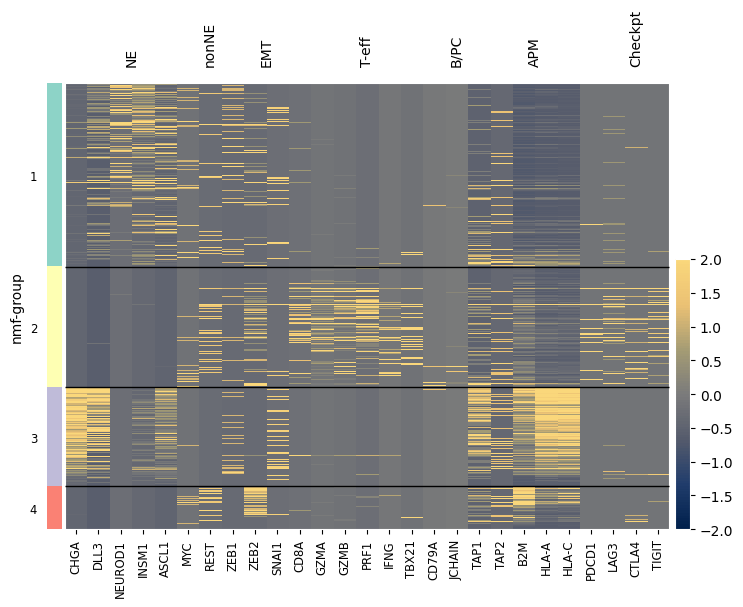

In [180]:
import scipy.sparse
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.colors as mcolors

genes_to_plot = [
    'CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1',
    'YAP1', 'POU2F3', 'MYC', 'REST',
    'ZEB1', 'ZEB2', 'SNAI1', 'TWIST1',
    'CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21',
    'CD79A', 'MS4A1', 'MZB1', 'JCHAIN',
    'TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C',
    'PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT'
]

genes_to_plot = [gene for gene in genes_to_plot if gene in sc_adata_cp.var_names]
print(f"Number of genes to plot: {len(genes_to_plot)}")

gene_categories = {
    'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
    'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
    'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
    'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
    'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
    'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
    'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
}

sc_adata_cp.var['gene_category'] = [
    next((cat for cat, genes in gene_categories.items() if gene in genes), 'Other')
    for gene in sc_adata_cp.var_names
]

var_group_positions = []
start = 0
for category in ['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt']:
    genes_in_category = [gene for gene in genes_to_plot if gene in gene_categories[category]]
    if genes_in_category:
        end = start + len(genes_in_category)
        var_group_positions.append((start, end))
        start = end

# Z-score normalization
if scipy.sparse.issparse(sc_adata_cp.X):
    X_dense = sc_adata_cp.X.toarray()
    mean = np.mean(X_dense, axis=0)
    std = np.std(X_dense, axis=0)
    z_scores = (X_dense - mean) / std
    sc_adata_cp.layers['z_score'] = scipy.sparse.csr_matrix(z_scores)
else:
    mean = np.mean(sc_adata_cp.X, axis=0)
    std = np.std(sc_adata_cp.X, axis=0)
    sc_adata_cp.layers['z_score'] = (sc_adata_cp.X - mean) / std

# Convert 'nmf-group' to category dtype
sc_adata_cp.obs['nmf-group'] = sc_adata_cp.obs['nmf-group'].astype('category')

# Calculate average expression for each group
z_score_matrix = sc_adata_cp.layers['z_score'].toarray() if scipy.sparse.issparse(sc_adata_cp.layers['z_score']) else sc_adata_cp.layers['z_score']
group_avg_expr = pd.DataFrame(
    z_score_matrix[:, [sc_adata_cp.var_names.get_loc(gene) for gene in genes_to_plot]],
    columns=genes_to_plot,
    index=sc_adata_cp.obs_names
)
group_avg_expr['nmf-group'] = sc_adata_cp.obs['nmf-group']
group_avg_expr = group_avg_expr.groupby('nmf-group').mean()

# Sort cells within each group based on their correlation with the group average
new_order = []
for group in sc_adata_cp.obs['nmf-group'].cat.categories:
    group_cells = sc_adata_cp.obs_names[sc_adata_cp.obs['nmf-group'] == group]
    group_expr = group_avg_expr.loc[group]
    
    # Get z-scores for the current cells and genes
    cell_expressions = z_score_matrix[np.isin(sc_adata_cp.obs_names, group_cells)][:, [sc_adata_cp.var_names.get_loc(gene) for gene in genes_to_plot]]
    
    # Calculate correlations
    correlations = [np.corrcoef(cell_expr, group_expr)[0, 1] for cell_expr in cell_expressions]
    sorted_indices = np.argsort(correlations)[::-1]
    sorted_cells = group_cells[sorted_indices]
    new_order.extend(sorted_cells)

# Reorder the AnnData object
sc_adata_cp = sc_adata_cp[new_order].copy()

print("Plotting heatmap...")

# Create a custom colormap similar to the image
colors = ['#00204c', '#213d6c', '#555b6c', '#7b7b7b', '#a59c74', '#ebc174', '#fad77b']
n_bins = 100
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, N=n_bins)

sc.pl.heatmap(sc_adata_cp, 
            var_names=genes_to_plot, 
            groupby='nmf-group',
            var_group_positions=var_group_positions,
            var_group_labels=['NE', 'nonNE', 'EMT', 'T-eff', 'B/PC', 'APM', 'Checkpt'],
            show_gene_labels=True,
            dendrogram=False,
            layer='z_score',
            cmap=cmap,
            vmin=-2, vmax=2,
            vcenter=0,
            show=False
            )

# Clean up temporary files

## Marker genes

### Cell Typist

In [ ]:

# Split into healthy and SCLC datasets
healthy_adata = sc_adata[
    sc_adata.obs["histo"].isin(["normal"]) &
    sc_adata.obs["tissue"].isin(["lung", "pleural effusion"]),
    :,
]

sclc_adata = sc_adata[
    sc_adata.obs["histo"].isin(["SCLC"]) &
    sc_adata.obs["tissue"].isin(["lung", "pleural effusion"]),
    :,
]

# Train models for both conditions
print("\nTraining healthy tissue model...")
sc_model_healthy = celltypist.train(
    healthy_adata,
    labels="cell_type_fine",
    n_jobs=10,
    feature_selection=True,
    epochs=30000,
)

print("\nTraining SCLC tissue model...")
sc_model_sclc = celltypist.train(
    sclc_adata, 
    labels="cell_type_fine", 
    n_jobs=10, 
    feature_selection=True, 
    epochs=30000
)

# Create separate dictionaries for normal and SCLC tissue markers
normal_domain_dic = {}
for ct in healthy_adata.obs["cell_type_fine"].unique():
    top_genes = sc_model_healthy.extract_top_markers(ct, 15)
    normal_domain_dic[ct] = list(top_genes)
    
sclc_domain_dic = {}
for ct in sclc_adata.obs["cell_type_fine"].unique():
    top_genes = sc_model_sclc.extract_top_markers(ct, 15)
    sclc_domain_dic[ct] = list(top_genes)

# Print summary of markers found
print("\nNormal tissue cell types and number of markers:")
for ct, genes in normal_domain_dic.items():
    print(f"{ct}: {len(genes)} markers")

print("\nSCLC tissue cell types and number of markers:")
for ct, genes in sclc_domain_dic.items():
    print(f"{ct}: {len(genes)} markers")

pd.DataFrame.from_dict(sclc_domain_dic).to_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/celltypist_sclc_markers.xlsx")
pd.DataFrame.from_dict(normal_domain_dic).to_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/celltypist_normal_markers.xlsx")


In [ ]:
# Markers with all cell types
full_sclc_model = celltypist.train(
    sc_adata,
    labels="cell_type_fine",
    n_jobs=10,
    feature_selection=True,
    epochs=30000,
)

In [56]:
full_sclc_model.write("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/celltypist_full_sclc_model.pkl")

In [24]:
full_sclc_model = celltypist.models.Model.load("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/celltypist_full_sclc_model.pkl")

In [21]:
domain_dic = {}
for ct in sc_adata.obs["cell_type_fine"].unique():
    top_genes = full_sclc_model.extract_top_markers(ct, top_n=20)
    domain_dic[ct] = list(top_genes)
pd.DataFrame.from_dict(domain_dic).to_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/celltypist_all_markers.xlsx")

NameError: name 'sc_adata' is not defined

### Scanpy

In [ ]:
sc.tl.rank_genes_groups(sc_adata, "cell_type_fine", method="wilcoxon",use_raw=False, layer="normalized_counts")
sc.pl.rank_genes_groups(sc_adata, n_genes=25, sharey=False)


In [129]:
def get_top_markers_dict(adata, n_genes=15):
    # Get the rank_genes_groups results
    results = adata.uns['rank_genes_groups']
    groups = results['names'].dtype.names
    
    # Create dictionary to store markers
    markers_dict = {}
    
    # For each group, get top n_genes
    for group in groups:
        markers = []
        for i in range(n_genes):
            gene = results['names'][i][group]
            markers.append(gene)
        markers_dict[group] = markers
    
    return markers_dict

# Get the markers dictionary
cell_type_markers = get_top_markers_dict(sc_adata, n_genes=15)


In [130]:
for cell_type, markers in cell_type_markers.items():
    print(f"\n{cell_type}:")
    print(", ".join(markers))


AE1:
EMP2, CAV1, AGER, GPRC5A, LMO7, HOPX, CYP4B1, RNASE1, KRT19, TIMP3, RAB11FIP1, CLDN18, ANXA2, S100A6, CD55

AEP:
SFTPC, SFTPA1, SFTPA2, SFTPB, SFTA2, SLPI, NPC2, SFTPD, NAPSA, RNASE1, CTSH, MUC1, CXCL17, CYB5A, PGC

B cell:
CD74, HLA-DRA, HLA-DPA1, HLA-DPB1, HLA-DQB1, CD37, HLA-DRB1, CD79A, HLA-DQA1, LAPTM5, EEF1A1, MS4A1, EEF1B2, HLA-DMA, CXCR4

Basal:
S100A6, KRT19, ZFP36L1, TACSTD2, SLPI, S100A2, LMO7, FXYD3, KRT18, TPT1, ANXA2, MT1E, S100A11, JUN, SAT1

Ciliated:
CAPS, TPPP3, PRDX5, GSTP1, CFAP144, RSPH1, AGR3, TSPAN1, LRRIQ1, CETN2, CAPSL, PIFO, CCDC78, ANXA2, MORN2

Club:
SCGB1A1, SCGB3A1, SCGB3A2, PIGR, CXCL17, SLPI, SFTPB, RNASE1, GPRC5A, MUC1, TACSTD2, CYB5A, STEAP4, ALDH1A1, AGR3

DC:
SAT1, CTSS, AIF1, FTH1, LST1, NAMPT, S100A9, TYROBP, FCER1G, FTL, LYZ, FCN1, PSAP, SRGN, PLAUR

Endothelial:
RAMP2, IFITM3, GNG11, PECAM1, SPARCL1, IGFBP7, CAV1, EPAS1, IGFBP4, CAVIN1, A2M, CLDN5, CLEC14A, TM4SF1, SPARC

Fibroblast:
IGFBP7, SPARC, CALD1, IFITM3, LGALS1, MYL9, COL1A2, BGN, 

## GLDADec

### Bulk deconvolution class

In [82]:
from typing import Dict, List, Optional, Tuple
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

class BulkDeconvolution:
    def __init__(self, adata, base_dir: str = '/mnt/work/RO_src/venv/bulk_rna/GLDADec'):
        """
        Initialize the BulkDeconvolution class.
        """
        self.adata = adata
        self.base_dir = base_dir
        self.raw_df = None
        self.random_sets = None
        self.deconv_results = {}
        
        # Import GLDADec
        import sys
        sys.path.append(os.path.dirname(base_dir))
        from GLDADec.run import pipeline
        self.pipeline = pipeline
        
        # Prepare raw data
        self._prepare_raw_data()
        
    def _prepare_raw_data(self):
        """Prepare raw data for deconvolution."""
        self.raw_df = pd.DataFrame(
            self.adata.layers["raw_counts"], 
            index=self.adata.obs_names, 
            columns=self.adata.var_names
        ).T
        self.raw_df.index.name = None
        
        # Load random sets
        self.random_sets = pd.read_pickle(self.base_dir + '/data/random_info/100_random_sets.pkl')
        
    def run_deconvolution(self, markers: Dict[str, List[str]], n_iter: int = 100, topn: int = 100, subset_organ: str = "combined"):
        """Run deconvolution for markers."""
        print("\nRunning deconvolution...")
        
        # Initialize pipeline
        pp = self.pipeline.Pipeline(verbose=False)
        
        # Prepare data
        pp.from_predata(
            self.raw_df,
            target_samples=[],
            do_ann=False,
            linear2log=False,
            log2linear=False,
            do_drop=True,
            do_batch_norm=False,
            do_quantile=False,
            remove_noise=False
        )
        
        # Gene selection and marker addition
        pp.gene_selection(method='CV', outlier=True, topn=topn)
        pp.add_marker_genes(
            target_cells=list(markers.keys()),
            add_dic=markers
        )
        
        # Deconvolution preparation and execution
        pp.deconv_prep(
            random_sets=self.random_sets,
            do_plot=False,
            specific=True,
            prior_norm=True,
            norm_scale=10,
            minmax=False,
            mm_scale=10
        )
        
        pp.deconv(
            n=10,
            add_topic=0,
            n_iter=n_iter,
            alpha=0.01,
            eta=0.01,
            refresh=10,
            initial_conf=1.0,
            seed_conf=1.0,
            other_conf=0.0,
            ll_plot=True,
            var_plot=False
        )
        
        # Store results
        merge_res = pp.merge_total_res
        result = sum(merge_res) / len(merge_res)
        self.deconv_results['deconv'] = result
        result.to_csv(f"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_{subset_organ}.csv")
        
        # Add results to adata.obs
        for cell_type in result.columns:
            self.adata.obs[f"deconv_{cell_type}"] = result[cell_type]
            
    def calculate_subtype_correlations(self, subtype_col: str) -> Dict[str, pd.DataFrame]:
        """Calculate correlations between subtypes and deconvolution results."""
        correlations = {}
        
        for deconv_name, deconv_res in self.deconv_results.items():
            subtypes = self.adata.obs[subtype_col].unique()
            corr_values = []
            
            for subtype in subtypes:
                subtype_indicator = (self.adata.obs[subtype_col] == subtype).astype(int)
                corr_row = [
                    np.corrcoef(subtype_indicator, self.adata.obs[f"deconv_{cell_type}"])[0,1]
                    for cell_type in deconv_res.columns
                ]
                corr_values.append(corr_row)
            
            correlations[deconv_name] = pd.DataFrame(
                corr_values,
                index=subtypes,
                columns=deconv_res.columns
            )
            
        return correlations
        
    def plot_correlations(self, correlation_matrices: Dict[str, pd.DataFrame], title_prefix: str = ""):
        """Plot correlation heatmaps."""
        for deconv_name, corr_matrix in correlation_matrices.items():
            plt.figure(figsize=(10, 8))
            sns.heatmap(
                corr_matrix,
                cmap='RdBu_r',
                center=0,
                vmin=-1,
                vmax=1,
                annot=True,
                fmt='.2f',
                cbar_kws={'label': 'Correlation'}
            )
            plt.title(f'{title_prefix} {deconv_name.capitalize()} Correlations')
            plt.xlabel('Cell Types')
            plt.ylabel('Categories')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        
    def calculate_gene_set_scores(self, gene_categories: Dict[str, List[str]]):
        """Calculate gene set scores."""
        adata_copy = self.adata.copy()
        
        for category, genes in gene_categories.items():
            valid_genes = [gene for gene in genes if gene in adata_copy.var_names]
            if valid_genes:
                sc.tl.score_genes(adata_copy, valid_genes, score_name=f'{category}_score')
            else:
                print(f"Warning: No valid genes found for {category}")
        
        return adata_copy
    
    def calculate_score_deconv_correlations(self, adata_scored: sc.AnnData) -> Dict[str, pd.DataFrame]:
        """Calculate correlations between gene set scores and deconvolution results."""
        correlations = {}
        
        for deconv_name, deconv_res in self.deconv_results.items():
            score_columns = [col for col in adata_scored.obs.columns if col.endswith('_score')]
            corr_values = []
            
            for score_col in score_columns:
                corr_row = [
                    np.corrcoef(adata_scored.obs[score_col], 
                            adata_scored.obs[f"deconv_{cell_type}"])[0,1]
                    for cell_type in deconv_res.columns
                ]
                corr_values.append(corr_row)
            
            correlations[deconv_name] = pd.DataFrame(
                corr_values,
                index=[col.replace('_score', '') for col in score_columns],
                columns=deconv_res.columns
            )
            
        return correlations

# Usage code
def main(subset_organ="Lung", domain_dic=None):
    # Load and preprocess datasets
    if subset_organ == "Lung":


        adata_nmf = sc.read_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
        adata_nmf = revert_from_conversion(adata_nmf)
        adata_nmf = adata_nmf[adata_nmf.obs["Organ"] == subset_organ]

    elif subset_organ == "Lymph Node":


        adata_nmf = sc.read_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
        adata_nmf = revert_from_conversion(adata_nmf)
        adata_nmf = adata_nmf[adata_nmf.obs["Organ"] == subset_organ]

    else:
        subset_organ = "combined"

        adata_nmf = sc.read_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_nmf_cp_81_samp.h5ad")
        adata_nmf = revert_from_conversion(adata_nmf)
    
    # Create copy of main adata and add subtype information
    adata_copy = adata.copy()
    adata_copy.obs['SCLC_Subtype_de_novo'] = adata_nmf.obs['SCLC_Subtype_de_novo'].reindex(adata_copy.obs.index)

    # Define gene categories
    gene_categories = {
        'NE': ['CHGA', 'DLL3', 'NEUROD1', 'INSM1', 'ASCL1'],
        'nonNE': ['YAP1', 'POU2F3', 'MYC', 'REST'],
        'EMT': ['ZEB1', 'ZEB2', 'SNAI1', 'TWIST1'],
        'T-eff': ['CD8A', 'GZMA', 'GZMB', 'PRF1', 'IFNG', 'CXCL9', 'CXCL10', 'TBX21'],
        'B/PC': ['CD79A', 'MS4A1', 'MZB1', 'JCHAIN'],
        'APM': ['TAP1', 'TAP2', 'B2M', 'HLA-A', 'HLA-C'],
        'Checkpt': ['PDCD1', 'CD274', 'LAG3', 'CTLA4', 'BTLA', 'TIGIT']
    }

    # Process both subtype classifications
    subtype_configs = {
        'de_novo': {'subtype_col': 'SCLC_Subtype_de_novo'}
    }

    # Initialize deconvolution
    deconv = BulkDeconvolution(adata_copy)
    # Run deconvolution once
    deconv.run_deconvolution(domain_dic, subset_organ=subset_organ)

    # Process each subtype classification
    for config_name, config in subtype_configs.items():
        print(f"\nProcessing {config_name} classification...")
        
        # Calculate and plot subtype correlations
        correlations = deconv.calculate_subtype_correlations(config['subtype_col'])
        deconv.plot_correlations(correlations, title_prefix=f'{config_name.upper()} Classification')
        
        # Calculate gene set scores and correlations
        adata_scored = deconv.calculate_gene_set_scores(gene_categories)
        score_correlations = deconv.calculate_score_deconv_correlations(adata_scored)
        deconv.plot_correlations(score_correlations, title_prefix=f'{config_name.upper()} Gene Set Score')

    # Save results
    results_path = f"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_{subset_organ}.h5ad"
    deconv.adata = prepare_for_saving(deconv.adata)
    deconv.adata.write_h5ad(results_path)
    print(f"\nResults saved to: {results_path}")


In [83]:
# Read the Excel file
cell_markers_ACT = pd.read_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/markers_ACT.xlsx")

# Specify the cell types to keep for each tissue
cell_types_filter = {
    'Lung': [
        'Basal cell',
        'B cell',
        'Macrophage',
        'Cancer-associated fibroblast',
        'CD14-low, CD16-positive monocyte',
        'CD14-positive monocyte',
        #'CD4-positive, alpha-beta T cell',
        #'CD8-positive, alpha-beta cytotoxic T cell',
        'Exhausted T cell',
        #'CD8-positive, alpha-beta T cell',
        'Fibroblast',
        'T cell',
        'T-helper 1 cell',
        'Inflammatory macrophage',
        'Alveolar macrophage',
        'Effector T cell',
        'Club cell',
        'Effector memory T cell',
        'Endothelial cell',
        'Epithelial cell',
        'Mast cell',
        'Natural killer cell',
        'Neutrophil',
        'Plasma cell',
        'Type I pneumocyte',
        'Type II pneumocyte',
        'Regulatory T cell',
        'Naive B cell',
        'Naive T cell',
        'SCLC-A',
        'SCLC-N',
        'SCLC-I-nNE',
        'SCLC-I-NE'
    ],
    'Lymph node': [
        'B cell',
        'Cancer-associated fibroblast',
        'Endothelial cell',
        'Epithelial cell',
        'Exhausted T cell',
        'Fibroblast',
        'Helper T cell',
        'Lymphatic epithelial cell',
        'Macrophage',
        'Mast cell',
        'Memory T cell',
        'Naive B cell',
        'Naive T cell',
        'Natural killer cell',
        'Neutrophil',
        'Plasma cell',
        'T cell',
        'T follicular helper cell',
        'T-helper 1 cell',
        'T-helper 2 cell',
        'SCLC-A',
        'SCLC-N',
        'SCLC-I-nNE',
        'SCLC-I-NE'
    ]
}

# Create nested dictionary
act_markers_dict = {}

# Iterate through rows and split gene lists
for _, row in cell_markers_ACT.iterrows():
    tissue = row['Tissue']
    cell_type = row['CellType']
    
    # Check if tissue exists in filter and if cell type should be kept
    if tissue in cell_types_filter and cell_type in cell_types_filter[tissue]:
        # Split the gene string by commas and clean up whitespace
        genes = [gene.strip() for gene in row['Marker'].split(',')]
        
        # Create tissue dictionary if it doesn't exist
        if tissue not in act_markers_dict:
            act_markers_dict[tissue] = {}
        
        # Add cell type and genes to the tissue dictionary
        act_markers_dict[tissue][cell_type] = genes

# Print the resulting filtered dictionary
for tissue, cell_types in act_markers_dict.items():
    print(f"\n{tissue}:")
    for cell_type, genes in cell_types.items():
        print(f"  {cell_type}: {', '.join(genes)}")


Lung:
  Alveolar macrophage: CD68, FABP4, FOLR3, MARCO, APOC1, C1QA, C1QB, CBX5, FBP1, FGFR2, GSN, LYZ, MME, MRC1, MSR1, NMB, NUBP2, PPARG
  B cell: CD79A, CD19, MS4A1, CD79B, IGHM, CD24, IGKC, MZB1, IGHG1, IGLL5, JCHAIN, BANK1, BLK, IGHA1, IGHG3, PAX5, SDC1, CD68, CD74, CR2, DERL3, FAM30A, FCRL2, FCRL5, IGHG4, IGLC3, IGLV3-1, PNOC, PTPRC, SPIB, TCL1A, TNFRSF13C, TNFRSF17
  Basal cell: KRT5, TP63, KRT14, KRT17, KRT13, NGFR, DAPL1, IL33, S100A2, ITGA6, KRT15, KRT8, LAMB3, APOC1, APOE, BCAM, BMP7, CD44, CTNNB1, DST, EMP3, G0S2, ITGB, ITGB4, KRT6A, LAMA3, LAMC2, LGALS1, MIR205HG, MKI67, NPPC, PDPN, SOX2, SYT8, TOB1, VIM
  Cancer-associated fibroblast: COL1A1, COL1A2, FAP, THY1, COL6A1, COL6A2, COL6A3, DCN
  CD14-low, CD16-positive monocyte: FCGR3A, MS4A7
  CD14-positive monocyte: S100A8, CD14, CPVL, LYZ, S100A12, S100A9, VCAN
  Club cell: SCGB1A1, SCGB3A2, SCGB3A1, CCKAR, MUC5B, BPIFB1, BPIFA1, CP, GABRP, PIGR, SLC23A2, SLPI, TMEM45A, TSPAN8
  Effector memory T cell: DUSP4, GZMA, GZMK, I

In [84]:
cell_type_markers_2024_paper = pd.read_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/markers_2024_paper_formatted.xlsx") # can select cell type or hallmarks
domain_dic= {k:cell_type_markers_2024_paper[k].dropna().tolist() for k in cell_type_markers_2024_paper.columns}

for k, v in domain_dic.items():
    print(f"{k}: {', '.join(v)}")

T-eff: IFNG, CXCL9, CD8A, GZMA, GZMB, CXCL10, PRF1, TBX21
T cells: TBX21, ITK, CD3D, CD3E, CD3G, TRAC, TRBC1, TRBC2, CD28, CD5, TRAT1
Treg: FOXP3, CTLA4, IL10, TNFRSF18, CCR8, IKZF4, IKZF2
Th1: IFNG, IL2, CD40LG, IL21, TBX21, STAT4, IL12RB2
Th2: IL4, IL5, IL13, IL10, GATA3, CCR4
CAFs: COL1A1, COL1A2, COL5A1, ACTA2, FGF2, FAP, LRP1, CD248, COL6A1, COL6A2, COL6A3, CXCL12, FBLN1, LUM, MFAP5, MMP3, MMP2, PDGFRB, PDGFRA
NK cells: NKG7, CD160, CD244, NCR1, KLRC2, KLRK1, CD226, GZMH, GNLY, IFNG, KIR2DL4, EOMES, GZMB, FGFBP2, KLRF1, SH2D1B, NCR3
CD14 monocytes: S100A8, S100A12, VCAN, LYZ, S100A9, CPVL, CD14, CD36, FCGR1A
CD16 monocytes: LST1, FCGR3A, CTSS, AIF1, LILRB2, CFP, PILRA, C5AR1, LRRC25, LILRA5, COTL1, PYCARD, LILRA1, FGR, MS4A7
Neutrophils: MPO, ELANE, PRTN3, CTSG, CXCR1, CXCR2, FCGR3B, CD177, FFAR2, PGLYRP1
TAMs: MARCO, ACP5, VSIG4, MRC1, MSR1, MCEMP1, CYP27A1, OLR1, GRN, GLIPR2, ARRDC4, SPP1, CTSD, C1QC, APOE, FOLR2
B cells: CD79A, CD79B, MS4A1, VPREB3
Plasma cells: MZB1, DERL3, JS

#### Correlation between deconvolution results and NMF factor scores

In [85]:
act_markers_dict["Lung"].keys()

dict_keys(['Alveolar macrophage', 'B cell', 'Basal cell', 'Cancer-associated fibroblast', 'CD14-low, CD16-positive monocyte', 'CD14-positive monocyte', 'Club cell', 'Effector memory T cell', 'Effector T cell', 'Endothelial cell', 'Epithelial cell', 'Exhausted T cell', 'Fibroblast', 'Inflammatory macrophage', 'Macrophage', 'Mast cell', 'Naive B cell', 'Naive T cell', 'Natural killer cell', 'Neutrophil', 'Plasma cell', 'Regulatory T cell', 'T cell', 'T-helper 1 cell', 'Type I pneumocyte', 'Type II pneumocyte', 'SCLC-A', 'SCLC-N', 'SCLC-I-nNE', 'SCLC-I-NE'])


Running deconvolution...


original: (23260, 81)
sample selection: (23260, 81)
trimming: (23260, 81)
method: CV, outlier:True, n_top: 100
target_cells: ['Alveolar macrophage', 'B cell', 'Basal cell', 'Cancer-associated fibroblast', 'CD14-low, CD16-positive monocyte', 'CD14-positive monocyte', 'Club cell', 'Effector memory T cell', 'Effector T cell', 'Endothelial cell', 'Epithelial cell', 'Exhausted T cell', 'Fibroblast', 'Inflammatory macrophage', 'Macrophage', 'Mast cell', 'Naive B cell', 'Naive T cell', 'Natural killer cell', 'Neutrophil', 'Plasma cell', 'Regulatory T cell', 'T cell', 'T-helper 1 cell', 'Type I pneumocyte', 'Type II pneumocyte', 'SCLC-A', 'SCLC-N', 'SCLC-I-nNE', 'SCLC-I-NE'], n_genes: 457


  0%|          | 0/10 [00:00<?, ?it/s]

<iter: 1> log-likelihood: [-23877476.663801156, -23532860.271174494, -23443728.287485253, -23415614.613896865, -23390199.67122916, -23375892.35955821, -23366512.361547165, -23362792.01129209, -23364014.202615555, -23362415.210565794]


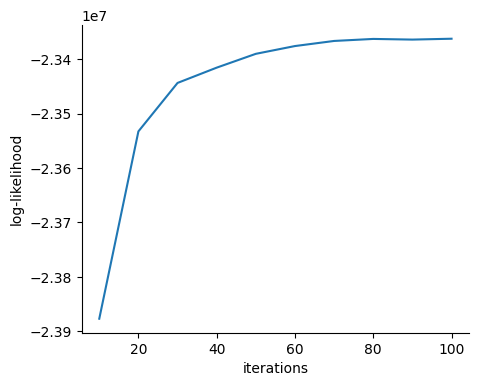

<iter: 2> log-likelihood: [-23877462.27510892, -23531638.04781715, -23448576.092737246, -23413802.40920637, -23392724.856562424, -23367991.027087804, -23357068.73869602, -23352939.120873302, -23356661.780262873, -23352557.747129872]
<iter: 3> log-likelihood: [-23877599.222603396, -23524549.50750395, -23430533.12959683, -23394732.819937415, -23374863.59039573, -23361577.725896385, -23355783.306566283, -23342088.775942877, -23338432.378108714, -23331337.270856656]
<iter: 4> log-likelihood: [-23877259.806011178, -23536364.695052754, -23450636.56451235, -23415318.53570874, -23401089.14840912, -23391336.848776195, -23382095.669065583, -23373718.90849058, -23370522.692028843, -23367447.834765766]
<iter: 5> log-likelihood: [-23877363.19607389, -23535077.800022777, -23453021.03472423, -23417572.846518453, -23397176.72581272, -23383095.52349096, -23373407.76031553, -23372717.57167495, -23366942.12108741, -23360947.61252284]
<iter: 6> log-likelihood: [-23877406.902651235, -23533795.407980822, -2


Processing de_novo classification...


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide


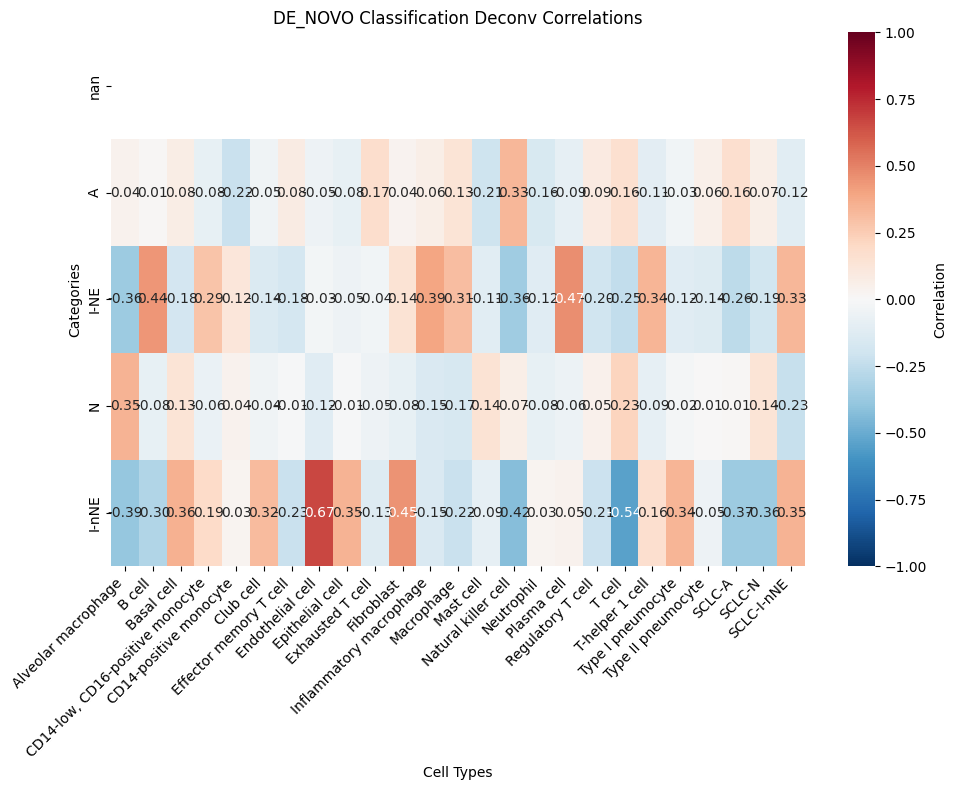

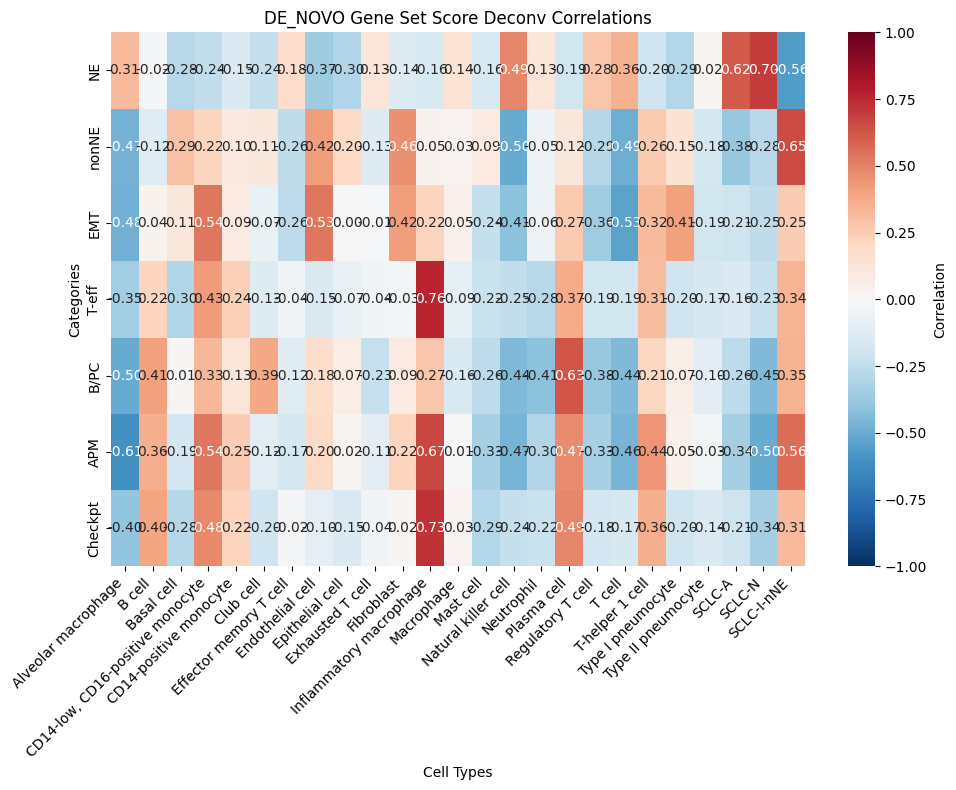

... storing 'birth_date' as categorical
... storing 'start_date' as categorical
... storing 'death_date' as categorical
... storing 'death_date_v2' as categorical
... storing 'ink_1' as categorical
... storing 'chemo_1' as categorical
... storing 'chemo_2' as categorical
... storing 'chemo_3' as categorical
... storing 'chemo_4' as categorical
... storing 'progression' as categorical
... storing 'progression_date' as categorical
... storing 'updated_pfs' as categorical
... storing 'start_strale' as categorical
... storing 'end_strale' as categorical
... storing 'pfs_date' as categorical
... storing 'ttp_date' as categorical
... storing 'os_date' as categorical
... storing 'strale_2' as categorical
... storing 'start_strale_2' as categorical
... storing 'date_biopsy' as categorical



Results saved to: /mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_Lung.h5ad

Running deconvolution...


original: (23260, 81)
sample selection: (23260, 81)
trimming: (23260, 81)
method: CV, outlier:True, n_top: 100
target_cells: ['B cell', 'Cancer-associated fibroblast', 'Endothelial cell', 'Epithelial cell', 'Exhausted T cell', 'Fibroblast', 'Helper T cell', 'Lymphatic epithelial cell', 'Macrophage', 'Mast cell', 'Memory T cell', 'Naive B cell', 'Naive T cell', 'Natural killer cell', 'Neutrophil', 'Plasma cell', 'T cell', 'T follicular helper cell', 'T-helper 1 cell', 'T-helper 2 cell', 'SCLC-A', 'SCLC-N', 'SCLC-I-nNE', 'SCLC-I-NE'], n_genes: 218


  0%|          | 0/10 [00:00<?, ?it/s]

<iter: 1> log-likelihood: [-8368281.167961133, -8199852.156944999, -8196877.594146669, -8198132.024182383, -8197033.21816963, -8196876.262142294, -8197610.229665852, -8197179.562829287, -8196963.597611207, -8197483.433005107]


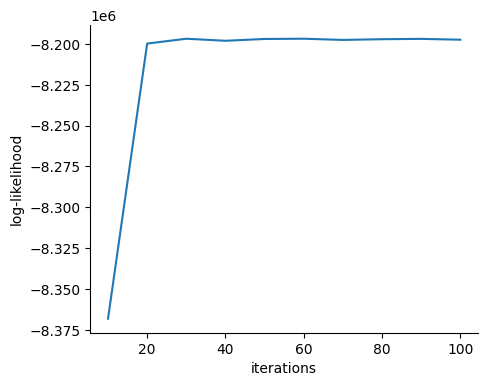

<iter: 2> log-likelihood: [-8368210.199536673, -8198864.580537292, -8198118.752894064, -8197275.94779097, -8196387.1227775, -8196203.5802981295, -8197602.5788090415, -8196899.552163025, -8196630.865153393, -8196366.46325949]
<iter: 3> log-likelihood: [-8368235.155822832, -8199507.955225561, -8199617.06083129, -8197806.815756383, -8198190.688058898, -8198476.910757761, -8197904.194140202, -8198852.15519983, -8197783.90430086, -8199305.974938853]
<iter: 4> log-likelihood: [-8368225.781486521, -8201106.893610911, -8199379.429757086, -8199630.9999587415, -8198871.446042175, -8199966.016852275, -8199285.984262512, -8198537.080295904, -8199244.722828266, -8198307.390929733]
<iter: 5> log-likelihood: [-8368373.2032396775, -8199588.491968749, -8197553.644645909, -8197255.185435202, -8197734.464361816, -8197428.163400584, -8197351.680657761, -8197084.722341152, -8196464.709135677, -8196983.521169368]
<iter: 6> log-likelihood: [-8368309.546596137, -8200517.822371762, -8198302.789582427, -8197896


Processing de_novo classification...


/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
/home/rafaed/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide


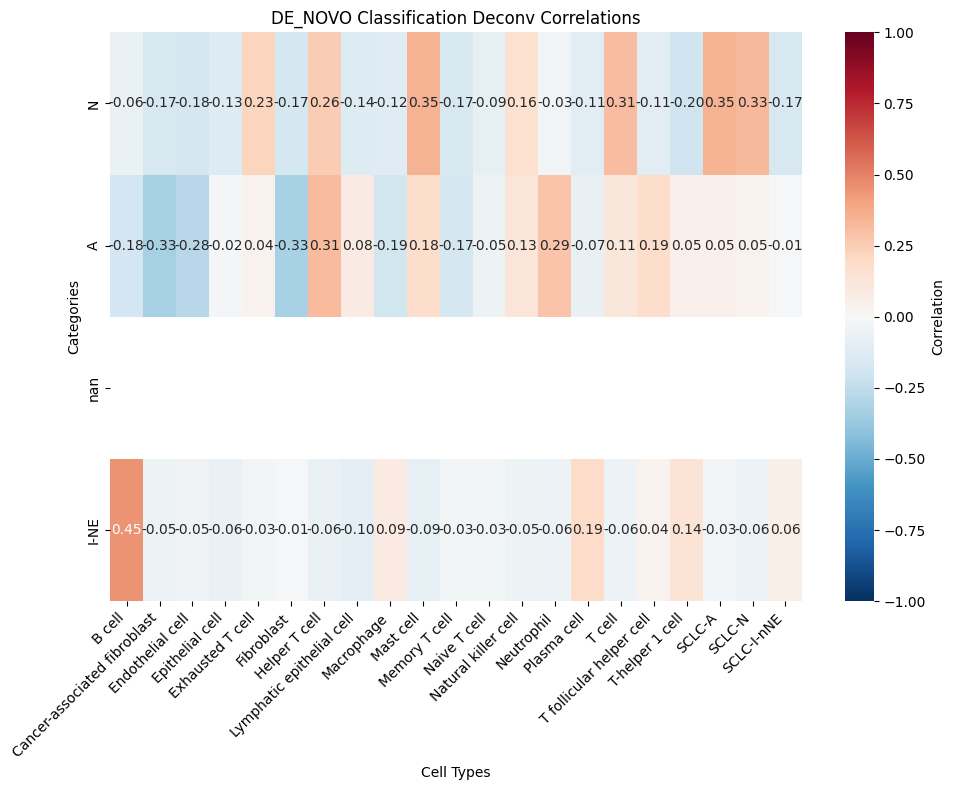

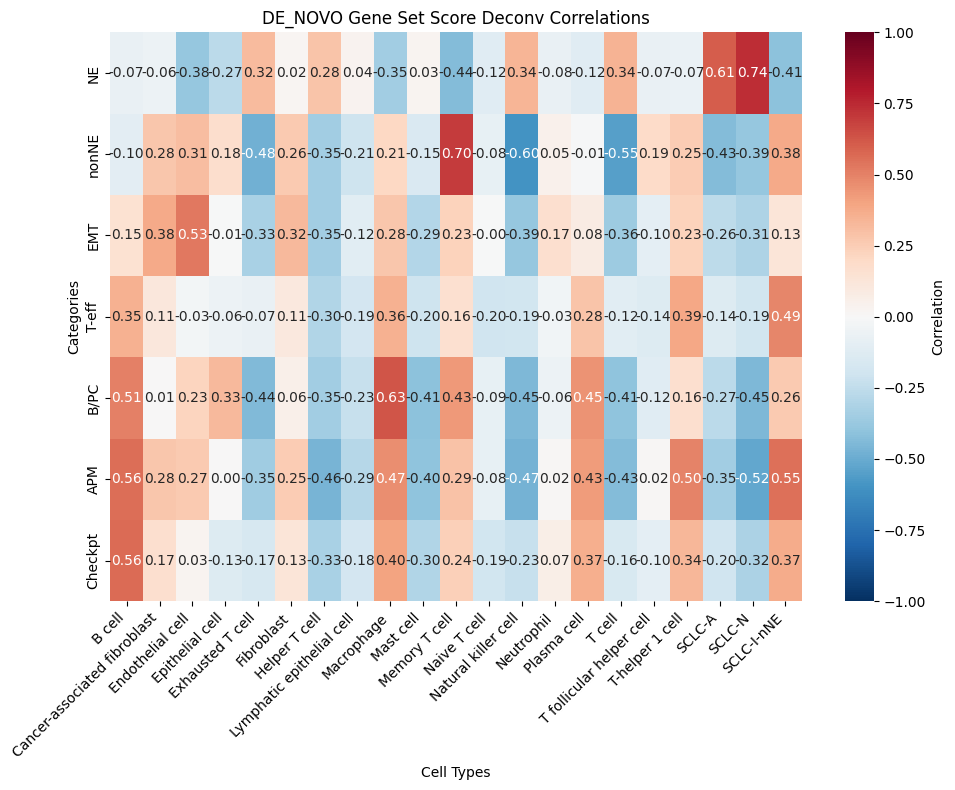

... storing 'birth_date' as categorical
... storing 'start_date' as categorical
... storing 'death_date' as categorical
... storing 'death_date_v2' as categorical
... storing 'ink_1' as categorical
... storing 'chemo_1' as categorical
... storing 'chemo_2' as categorical
... storing 'chemo_3' as categorical
... storing 'chemo_4' as categorical
... storing 'progression' as categorical
... storing 'progression_date' as categorical
... storing 'updated_pfs' as categorical
... storing 'start_strale' as categorical
... storing 'end_strale' as categorical
... storing 'pfs_date' as categorical
... storing 'ttp_date' as categorical
... storing 'os_date' as categorical
... storing 'strale_2' as categorical
... storing 'start_strale_2' as categorical
... storing 'date_biopsy' as categorical



Results saved to: /mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_Lymph Node.h5ad


In [86]:

# Lung deconvolution
main(subset_organ="Lung", domain_dic=act_markers_dict["Lung"])

# Lymph node deconvolution
main(subset_organ="Lymph Node", domain_dic=act_markers_dict["Lymph node"])


#### Cell Type proportions grouped by SCLC subtype

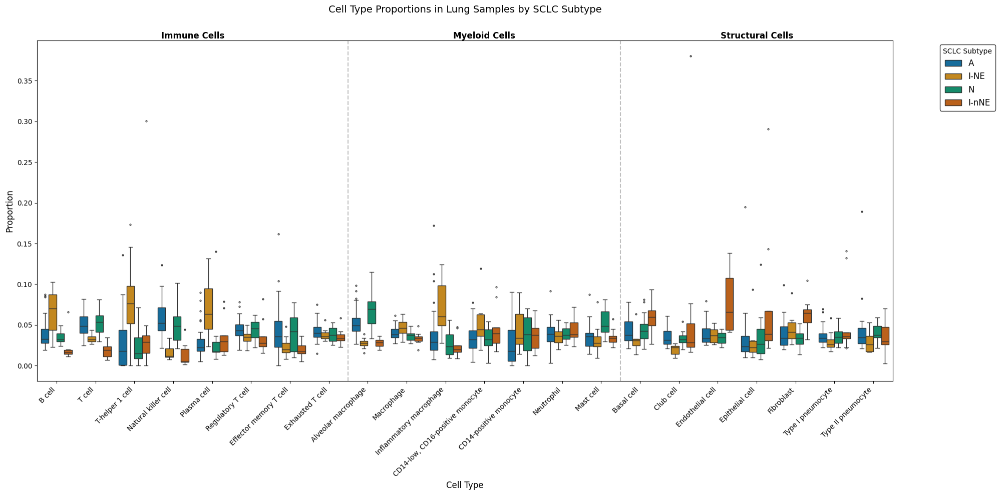

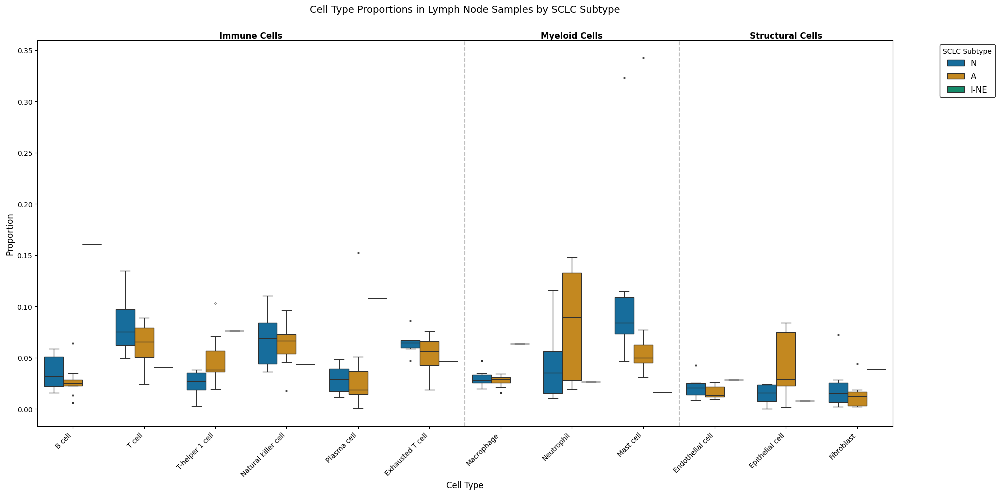

In [87]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the datasets
lung_data = sc.read_h5ad("/home/rafaed/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_Lung.h5ad")
ln_data = sc.read_h5ad("/home/rafaed/work/RO_src/Projects/THORA/DataProcessing/data/processed/deconv_results_Lymph Node.h5ad")

def create_boxplot(adata, tissue_type):
    # Get deconvolution columns
    deconv_cols = [col for col in adata.obs.columns if col.startswith('deconv_')]
    
    # Define cell type groups
    cell_type_groups = {
        'Immune Cells': ['B cell', 'T cell', 'T-helper 1 cell', 'Natural killer cell', 
                        'Plasma cell', 'Regulatory T cell', 'Effector memory T cell',
                        'Exhausted T cell'],
        'Myeloid Cells': ['Alveolar macrophage', 'Macrophage', 'Inflammatory macrophage',
                         'CD14-low, CD16-positive monocyte', 'CD14-positive monocyte',
                         'Neutrophil', 'Mast cell'],
        'Structural Cells': ['Basal cell', 'Club cell', 'Endothelial cell', 'Epithelial cell',
                           'Fibroblast', 'Type I pneumocyte', 'Type II pneumocyte'],
        'SCLC Cells': ['SCLC-A', 'SCLC-N', 'SCLC-I-nNE']
    }
    
    # Create dataframe for plotting
    plot_data = []
    for col in deconv_cols:
        cell_type = col.replace('deconv_', '')
        # Find group for this cell type
        group = next((g for g, types in cell_type_groups.items() if cell_type in types), 'Other')
        for subtype in adata.obs['SCLC_Subtype_de_novo'].unique():
            subset = adata.obs[adata.obs['SCLC_Subtype_de_novo'] == subtype]
            for value in subset[col]:
                plot_data.append({
                    'Cell_Type': cell_type,
                    'Proportion': value,
                    'Subtype': subtype,
                    'Group': group
                })
    
    plot_df = pd.DataFrame(plot_data)
    
    # Sort cell types by group
    cell_type_order = []
    for group in cell_type_groups.keys():
        cell_type_order.extend([ct for ct in cell_type_groups[group] 
                              if ct.replace('SCLC-', '') in [c.replace('deconv_', '') for c in deconv_cols]])
    
    # Create figure
    plt.figure(figsize=(20, 10))
    
    # Define colors for subtypes using a colorblind-friendly palette
    colors = sns.color_palette("colorblind")
    
    # Create the boxplot
    ax = sns.boxplot(
        data=plot_df,
        x='Cell_Type',
        y='Proportion',
        hue='Subtype',
        order=cell_type_order,
        palette=colors[:len(plot_df['Subtype'].unique())],
        fliersize=2
    )
    
    # Add vertical lines to separate groups
    current_pos = 0
    for group, types in cell_type_groups.items():
        group_size = len([t for t in types if t in cell_type_order])
        if group_size > 0:
            if current_pos > 0:
                plt.axvline(x=current_pos - 0.5, color='gray', linestyle='--', alpha=0.5)
            current_pos += group_size
            
            # Add group labels
            plt.text(current_pos - group_size/2 - 0.5, plt.ylim()[1], 
                    group, ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    # Customize the plot
    plt.title(f'Cell Type Proportions in {tissue_type} Samples by SCLC Subtype', pad=40, fontsize=14)
    plt.xlabel('Cell Type', fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    
    # Rotate x-axis labels
    plt.xticks(rotation=45, ha='right')
    
    # Adjust legend
    plt.legend(title='SCLC Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Adjust layout
    plt.tight_layout()
    
    plt.show()

# Create plots for each tissue type
create_boxplot(lung_data, "Lung")
create_boxplot(ln_data, "Lymph Node")

### Z-scores for each cell type vs NMF factors

Calculate the cell type scores for each cell type and plot as heatmap against NMF factors

In [92]:
adata_nmf.obs.rename(columns={"SCLC-Subtype-de-novo":"SCLC_Subtype_de_novo"}, inplace=True)

In [93]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec
from scipy import stats
import numpy as np

# Define cell types
cell_types = ["Inflammatory macrophage","Alveolar macrophage","T cell", "T eff", "B cell", "T-helper 1 cell", "Natural killer cell",
              "Macrophage", "Mast cell", "Plasma cell", "Neutrophil", 
              "Regulatory T cell", "Cancer-associated fibroblast"]

def calculate_z_scores(adata, gene_list_dict, tissue="Lung", cell_types=cell_types):
    # Create nested dictionary
    act_markers_dict = {}
    adata.X = adata.layers["raw_counts"].copy()

    sc.pp.normalize_total(adata, target_sum=1e6)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    # Iterate through rows and split gene lists
    for _, row in cell_markers_ACT.iterrows():
        #tissue = row['Tissue']
        cell_type = row['CellType']
        
        # Check if tissue exists in filter and if cell type should be kept
        if tissue in cell_types_filter and cell_type in cell_types_filter[tissue]:
            # Split the gene string by commas and clean up whitespace
            genes = [gene.strip() for gene in row['Marker'].split(',')]
            
            # Create tissue dictionary if it doesn't exist
            if tissue not in act_markers_dict:
                act_markers_dict[tissue] = {}
            
            # Add cell type and genes to the tissue dictionary
            act_markers_dict[tissue][cell_type] = genes

    # For each of the selected markers 
    successful_cell_types = []  # Keep track of which cell types were processed
    for cell in cell_types:
        if tissue in act_markers_dict and cell in act_markers_dict[tissue]:
            curr_markers = act_markers_dict[tissue][cell]
            # Filter markers that exist in the dataset
            valid_markers = [gene for gene in curr_markers if gene in adata.var_names]

            if len(valid_markers) > 0:

                # Calculate score using scanpy's score_genes function
                sc.tl.score_genes(
                    adata,
                    gene_list=valid_markers,
                    score_name=f'{cell}_score',
                    use_raw=False,
                    ctrl_size=50,
                    gene_pool=None,
                    n_bins=25
                )
                
                # Convert scores to z-scores
                scores = adata.obs[f'{cell}_score']
                z_scores = (scores - np.mean(scores)) / np.std(scores)
                adata.obs[f'{cell}_zscore'] = z_scores
                successful_cell_types.append(cell)
            else:
                print(f"Warning: No valid markers found for {cell} in {tissue}")
        else:
            print(f"Warning: No markers found for {cell} in {tissue}")
    
    return adata, successful_cell_types
adata_nmf_2, successful_cell_types = calculate_z_scores(adata_nmf, gene_list_dict=cell_markers_ACT, tissue="Lung")


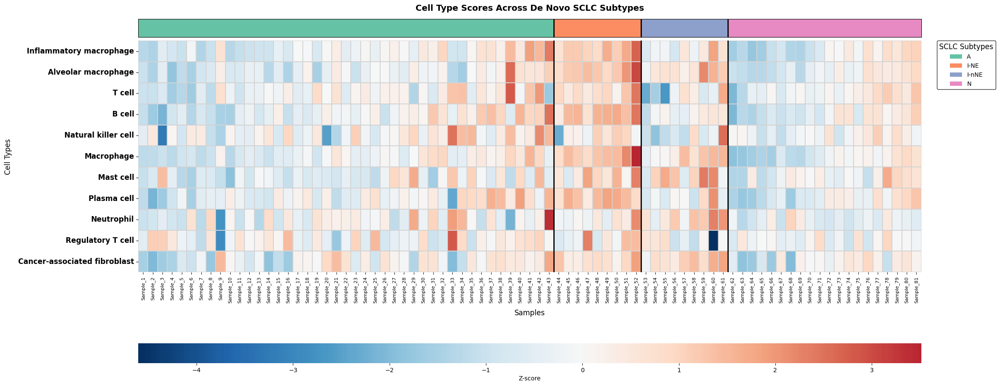

In [94]:


# Create heatmap only for successful cell types
z_score_columns = [f'{cell}_zscore' for cell in successful_cell_types]

# Create a dataframe with z-scores and NMF factors
plot_df = pd.DataFrame(index=adata_nmf_2.obs.index)
for col in z_score_columns:
    if col in adata_nmf_2.obs.columns:  # Only add column if it exists
        plot_df[col.replace('_zscore', '')] = adata_nmf_2.obs[col]
    else:
        print(f"Warning: Column {col} not found in data")

# Add NMF subtype information
plot_df['SCLC_Subtype_de_novo'] = adata_nmf_2.obs['SCLC_Subtype_de_novo']

# Sort samples within each SCLC subtype based on mean z-scores
plot_df['mean_zscore'] = plot_df.drop('SCLC_Subtype_de_novo', axis=1).mean(axis=1)
plot_df = plot_df.sort_values(['SCLC_Subtype_de_novo', 'mean_zscore'])
plot_df = plot_df.drop('mean_zscore', axis=1)

# Create the heatmap matrix
heatmap_data = plot_df.drop('SCLC_Subtype_de_novo', axis=1).T

# Create colors for subtypes
unique_subtypes = plot_df['SCLC_Subtype_de_novo'].unique()
subtype_colors = dict(zip(unique_subtypes, sns.color_palette("Set2", len(unique_subtypes))))
subtype_colors_list = [subtype_colors[x] for x in plot_df['SCLC_Subtype_de_novo']]

# Create sample name obfuscation mapping
sample_mapping = {name: f'Sample_{i+1}' for i, name in enumerate(plot_df.index)}

# Create the visualization with adjusted dimensions and spacing
plt.figure(figsize=(25, 12))

# Create a gridspec with better proportions
gs = gridspec.GridSpec(2, 1, height_ratios=[0.5, 10], hspace=0.02)

# Main heatmap
ax_main = plt.subplot(gs[1])
g = sns.heatmap(heatmap_data, 
                cmap='RdBu_r',
                center=0,
                cbar_kws={'label': 'Z-score', 'orientation': 'horizontal', 
                         'pad': 0.2, 'aspect': 40},
                yticklabels=True,
                xticklabels=[sample_mapping[x] for x in heatmap_data.columns],
                square=False,
                linewidths=0.05,
                linecolor='lightgray',
                ax=ax_main)

# Adjust colorbar position to bottom
cbar = g.collections[0].colorbar
cbar.ax.set_position([0.3, 0.08, 0.4, 0.02])

# Get heatmap dimensions
heatmap_pos = ax_main.get_position()

# Create the annotation bar with matching width
ax_top = plt.subplot(gs[0])
ax_top.imshow([subtype_colors_list], 
              aspect='auto', 
              extent=[ax_main.get_xlim()[0], ax_main.get_xlim()[1], 0, 1])
ax_top.set_xlim(ax_main.get_xlim())
ax_top.set_position([heatmap_pos.x0, heatmap_pos.y0 + heatmap_pos.height + 0.01, 
                    heatmap_pos.width, 0.02])
ax_top.set_xticks([])
ax_top.set_yticks([])

# Create custom legend with better formatting
legend_elements = [plt.Rectangle((0,0), 1, 1, facecolor=color, label=subtype)
                  for subtype, color in subtype_colors.items()]

# Add legend with improved positioning
ax_main.legend(handles=legend_elements,
              title="SCLC Subtypes",
              bbox_to_anchor=(1.02, 1),
              loc='upper left',
              borderaxespad=0,
              frameon=True,
              fontsize=10,
              title_fontsize=12)

# Customize appearance
plt.xticks(rotation=90)
ax_main.set_xticklabels(ax_main.get_xticklabels(), ha='center', fontsize=8)
ax_main.set_yticklabels(ax_main.get_yticklabels(), fontsize=12, fontweight='bold')
ax_main.set_title('Cell Type Scores Across De Novo SCLC Subtypes', pad=50, fontsize=14, fontweight='bold')
ax_main.set_xlabel('Samples', fontsize=12, labelpad=10)
ax_main.set_ylabel('Cell Types', fontsize=12, labelpad=10)

# Add dark lines between subtypes
prev_subtype = None
x_pos = 0
for subtype in plot_df['SCLC_Subtype_de_novo']:
    if prev_subtype is not None and subtype != prev_subtype:
        ax_main.axvline(x=x_pos, color='black', linewidth=2)
        ax_top.axvline(x=x_pos, color='black', linewidth=2)
    x_pos += 1
    prev_subtype = subtype

# Adjust layout
plt.subplots_adjust(right=0.85, bottom=0.15)
plt.show()

# Saving count matrix

In [95]:
cnt_mtrx = pd.DataFrame(adata.layers["raw_counts"], adata.obs["ID_Sample"] ,adata.var["ENSG"])
cnt_mtrx.index.name = None
cnt_mtrx.to_csv("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/cnt_mtrx_81_samp.csv")

In [96]:
cnt_mtrx = pd.DataFrame(adata.layers["lognormalized_counts"], adata.obs["ID_Sample"] ,adata.var["gene_name"])
cnt_mtrx.index.name = None
cnt_mtrx.to_csv("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/lognorm_cnt_mtrx_81_samp.csv")

# Violin plot with statistical test of RSI against other variables

/mnt/scratch/tmp/ipykernel_52726/1634594972.py:33: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.


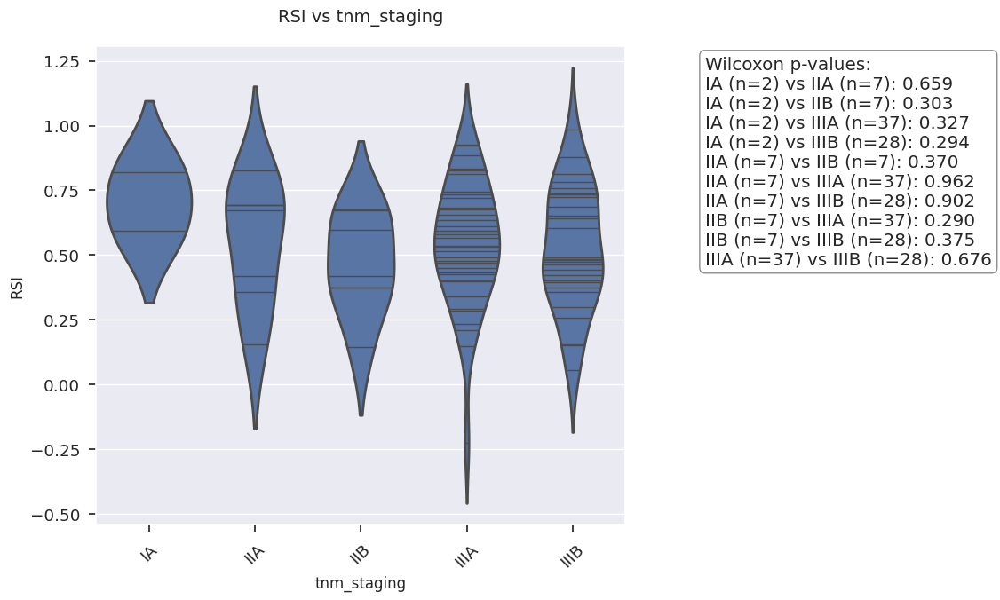

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


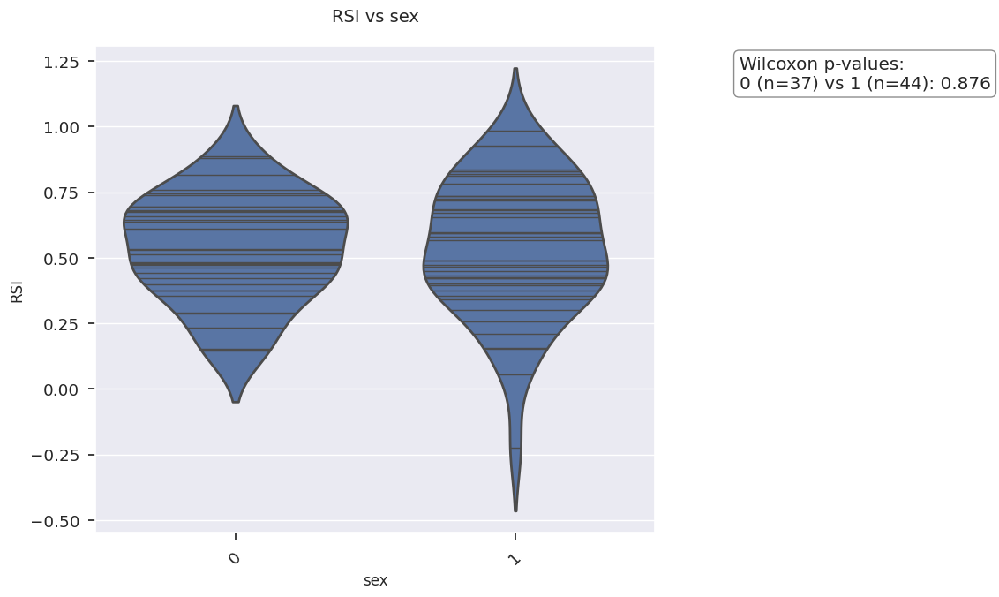

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


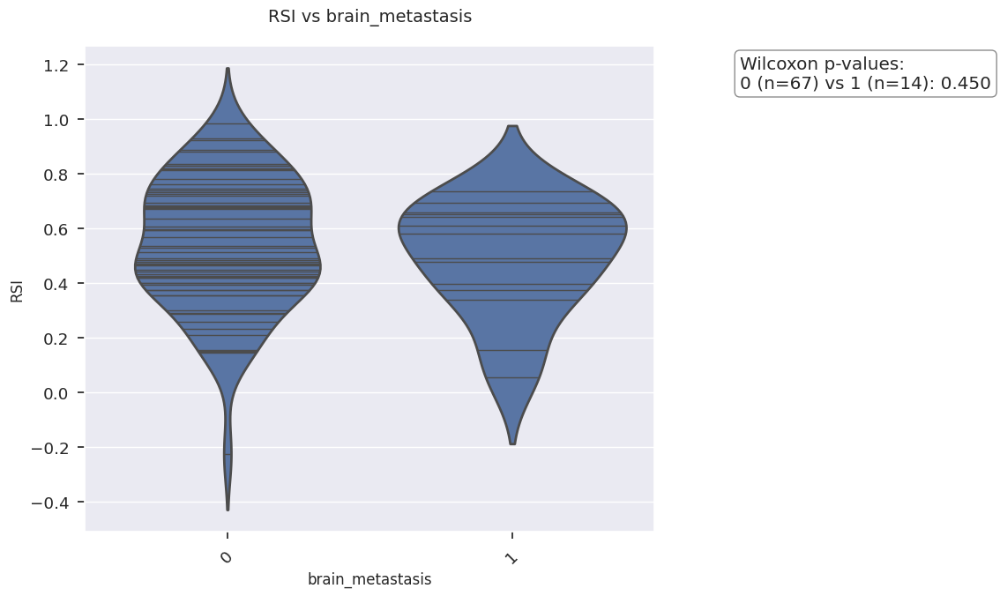

ValueError: Could not interpret value `SCLC_Subtype_de_novo` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x700 with 0 Axes>

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import numpy as np
import pandas as pd
from itertools import combinations

class ViolinAnalyzer:
    def __init__(self, data, continuous_var, categorical_vars, stratification_vars=None):
        """
        Initialize the ViolinAnalyzer.
        
        Parameters:
        -----------
        data : pandas.DataFrame
            The input data containing all variables
        continuous_var : str
            Name of the continuous variable to analyze (e.g., 'RSI')
        categorical_vars : list
            List of categorical variables for univariate analysis
        stratification_vars : list, optional
            List of variables to use for stratification
        """
        self.data = data.copy()
        self.continuous_var = continuous_var
        self.categorical_vars = categorical_vars
        self.stratification_vars = stratification_vars or []
        
        # Data preprocessing
        self._preprocess_data()
        
        # Plot settings
        plt.style.use('seaborn')
        sns.set_context("notebook", font_scale=1.2)
    
    def _preprocess_data(self):
        """Preprocess the continuous variable data."""
        # Drop duplicated columns
        self.data = self.data.loc[:, ~self.data.columns.duplicated()]
        
        # Handle if continuous variable is a DataFrame with duplicate columns
        if isinstance(self.data[self.continuous_var], pd.DataFrame):
            self.data[self.continuous_var] = self.data[self.continuous_var].iloc[:, 0]
        elif isinstance(self.data[self.continuous_var].iloc[0], np.ndarray):
            self.data[self.continuous_var] = self.data[self.continuous_var].apply(lambda x: x[0])
        
        # Convert to float type
        self.data[self.continuous_var] = self.data[self.continuous_var].astype(float)
    
    def _get_univariate_stats(self, var):
        """Calculate univariate statistical tests."""
        results = []
        unique_groups = sorted(self.data[var].unique())
        
        results.append("Wilcoxon p-values:")
        for g1, g2 in combinations(unique_groups, 2):
            val_g1 = self.data[self.data[var] == g1][self.continuous_var]
            val_g2 = self.data[self.data[var] == g2][self.continuous_var]
            if len(val_g1) > 0 and len(val_g2) > 0:
                _, pval = stats.mannwhitneyu(val_g1, val_g2, alternative='two-sided')
                results.append(f"{g1} (n={len(val_g1)}) vs {g2} (n={len(val_g2)}): {pval:.3f}")
        
        return "\n".join(results)
    
    def _get_stratified_stats(self, var, strat_var):
        """Calculate comprehensive stratified statistical tests."""
        results = []
        unique_categories = sorted(self.data[var].unique())
        strat_values = sorted(self.data[strat_var].unique())
        
        # Within-group comparisons
        results.append(f"\nWithin-group comparisons ({strat_var} 0 vs 1):")
        for cat in unique_categories:
            cat_data = self.data[self.data[var] == cat]
            if len(strat_values) >= 2:
                group0 = cat_data[cat_data[strat_var] == strat_values[0]][self.continuous_var]
                group1 = cat_data[cat_data[strat_var] == strat_values[1]][self.continuous_var]
                if len(group0) > 0 and len(group1) > 0:
                    _, pval = stats.mannwhitneyu(group0, group1, alternative='two-sided')
                    results.append(f"{var}={cat} (0: n={len(group0)} vs 1: n={len(group1)}): {pval:.3f}")
        
        # Between-group comparisons
        for status in strat_values:
            results.append(f"\nBetween-group comparisons for {strat_var}={status}:")
            status_data = self.data[self.data[strat_var] == status]
            for g1, g2 in combinations(unique_categories, 2):
                val_g1 = status_data[status_data[var] == g1][self.continuous_var]
                val_g2 = status_data[status_data[var] == g2][self.continuous_var]
                if len(val_g1) > 0 and len(val_g2) > 0:
                    _, pval = stats.mannwhitneyu(val_g1, val_g2, alternative='two-sided')
                    results.append(f"{g1} (n={len(val_g1)}) vs {g2} (n={len(val_g2)}): {pval:.3f}")
        
        return "\n".join(results)
    
    def plot_univariate(self):
        """Create individual univariate plots."""
        for var in self.categorical_vars:
            plt.figure(figsize=(12, 7))
            sns.violinplot(data=self.data, x=var, y=self.continuous_var, inner='stick', linewidth=2)
            plt.title(f"{self.continuous_var} vs {var}", fontsize=14, pad=20)
            plt.xlabel(var, fontsize=12)
            plt.ylabel(self.continuous_var, fontsize=12)
            plt.xticks(rotation=45)
            
            # Add statistical results
            stat_text = self._get_univariate_stats(var)
            plt.text(1.15, 0.98, stat_text,
                    transform=plt.gca().transAxes,
                    verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))
            
            plt.tight_layout()
            plt.show()
    
    def plot_stratified(self):
        """Create stratified plots for each stratification variable."""
        for strat_var in self.stratification_vars:
            # Skip categorical variables that are being used for stratification
            for var in [v for v in self.categorical_vars if v != strat_var]:
                plt.figure(figsize=(14, 7))
                sns.violinplot(data=self.data, x=var, y=self.continuous_var, 
                             hue=strat_var, split=True, inner='stick', linewidth=2)
                plt.title(f"{self.continuous_var} vs {var} (stratified by {strat_var})", 
                         fontsize=14, pad=20)
                plt.xlabel(var, fontsize=12)
                plt.ylabel(self.continuous_var, fontsize=12)
                plt.xticks(rotation=45)
                
                # Update legend
                plt.legend(title=strat_var, bbox_to_anchor=(1.02, 0.5), loc='center left')
                
                # Add statistical results
                stat_text = self._get_stratified_stats(var, strat_var)
                plt.text(1.35, 0.98, stat_text,
                        transform=plt.gca().transAxes,
                        verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))
                
                plt.tight_layout()
                plt.show()

# Example usage:
analyzer = ViolinAnalyzer(
    data=adata_nmf.obs,
    continuous_var='RSI',
    categorical_vars=["tnm_staging", "sex", "brain_metastasis", "SCLC_Subtype_de_novo", 
                     "Organ", "stad_bin", "radio_arm","status_ttp","status_os"],
    stratification_vars=['status_ttp', 'status_os']
)
analyzer.plot_univariate()
analyzer.plot_stratified()